## Import the functions and Libraries

In [1]:
from Libraries_Functions import np, plt, unp, wmean, ur, umean, os, pd, calculate_stage_info, ufloat,convert_uncertainties, convert_uncertainty_columns, calculate_stage_info_all,\
calculate_centroid, A, V, ur, umean, wmean, calculate_stage_info_base, calculate_stage_info, calculate_total_info, convert_uncertainties,convert_uncertainty_columns, interpolate, stats,\
patches, Polygon, Axes3D, PercentFormatter, MultipleLocator, FuncFormatter, math, ransac, uncertainties, unp, EllipseModel, widgets, sns, mpc, mpld3, ufloat_fromstr, BlendedGenericTransform,\
Ellipse, widgets, sns, Filter_outliers,\
Ru_d_G, Ru_d_L, Ru_l, v_error, Ru_c3, Ru_w,\
Su_NC, qf_NC, qf_LCC, Su_LCC,\
Ru_A_NC04, Ru_H_G_NC04, Ru_strain_G_NC04, Ru_stress_NC04,Ru_E_G_NC04,\
Ru_A_NC05, Ru_H_G_NC05, Ru_strain_G_NC05, Ru_stress_NC05,Ru_E_G_NC05,\
Ru_A_NC06, Ru_H_G_NC06, Ru_strain_G_NC06, Ru_stress_NC06,Ru_E_G_NC06,\
Ru_A_NC07, Ru_H_G_NC07, Ru_strain_G_NC07, Ru_stress_NC07,Ru_E_G_NC07,\
Ru_A_NC08, Ru_H_G_NC08, Ru_strain_G_NC08, Ru_stress_NC08,Ru_E_G_NC08,\
Ru_A_NC09, Ru_H_G_NC09, Ru_strain_G_NC09, Ru_stress_NC09,Ru_E_G_NC09,\
Ru_A_NC10, Ru_H_G_NC10, Ru_strain_G_NC10, Ru_stress_NC10,Ru_E_G_NC10,\
Ru_A_NC11, Ru_H_G_NC11, Ru_strain_G_NC11, Ru_stress_NC11,Ru_E_G_NC11,\
Ru_A_LCC03, Ru_H_G_LCC03, Ru_H_L_LCC03, Ru_strain_G_LCC03, Ru_strain_L_LCC03, Ru_stress_LCC03, Ru_E_G_LCC03, Ru_E_L_LCC03,\
Ru_A_LCC17, Ru_H_G_LCC17, Ru_H_L_LCC17, Ru_strain_G_LCC17, Ru_strain_L_LCC17, Ru_stress_LCC17, Ru_E_G_LCC17, Ru_E_L_LCC17
import uncertainties
import matplotlib.colors as mcolors
from matplotlib.colors import to_rgb
from matplotlib import colors
from sklearn.linear_model import LinearRegression ; from sklearn.linear_model import RANSACRegressor

pd.set_option('future.no_silent_downcasting', True)

# LCC03

## Reading the data with its cycles

In [2]:
# To read the CSV file and identify each cycle separately, you can use:                                   
Path_df_LCC03_new = os.path.join('Outputs_csv', 'df_LCC03_new.csv')
df_LCC03_new = pd.read_csv(Path_df_LCC03_new)
df_LCC03_new = convert_uncertainty_columns(df_LCC03_new)

cycles_LCC03 = {}
for cycle_nr in df_LCC03_new['Cycle nr'].unique():
    cycles_LCC03[cycle_nr] = df_LCC03_new[df_LCC03_new['Cycle nr'] == cycle_nr]

Path_cycle_info_LCC03_G = os.path.join('Outputs_csv', 'cycle_info_LCC03_G.csv')
cycle_info_LCC03_G = pd.read_csv(Path_cycle_info_LCC03_G)
cycle_info_LCC03_G = convert_uncertainty_columns(cycle_info_LCC03_G)

Path_cycle_info_LCC03_L = os.path.join('Outputs_csv', 'cycle_info_LCC03_L.csv')
cycle_info_LCC03_L = pd.read_csv(Path_cycle_info_LCC03_L)
cycle_info_LCC03_L = convert_uncertainty_columns(cycle_info_LCC03_L)

split_index = 10420
cycle_info_LCC03_G_1 = cycle_info_LCC03_G.iloc[:split_index].reset_index(drop=True)
cycle_info_LCC03_G_2 = cycle_info_LCC03_G.iloc[split_index:].reset_index(drop=True)
cycle_info_LCC03_L_1 = cycle_info_LCC03_L.iloc[:split_index].reset_index(drop=True)
cycle_info_LCC03_L_2 = cycle_info_LCC03_L.iloc[split_index:].reset_index(drop=True)

df_LCC03_new.columns

Index(['Stage Number', 'Cycle nr', 'Time since start of test (s)',
       'Time since start of stage (s)', 'Radial Pressure (kPa)',
       'Radial Volume (mm³)', 'Back Pressure (kPa)', 'Back Volume (mm³)',
       'Load Cell (kN)', 'Pore Pressure (kPa)', 'Axial Displacement (mm)',
       'L/C Pressure (kPa)', 'L/C Volume (mm³)', 'Local Axial 1 (mm)',
       'Local Axial 2 (mm)', 'Local Radial (mm)', 'Base Pressure (kPa)',
       'Base Volume (mm³)', 'Back Differential Pressure (kPa)',
       'Axial Displacement 2 (mm)', 'Axial Force (kN)', 'Axial Strain (%)',
       'Av Diameter Change (mm)', 'Radial Strain (%)', 'Axial Stress (kPa)',
       'Eff. Axial Stress (kPa)', 'Eff. Radial Stress (kPa)',
       'Deviator Stress (kPa)', 'Total Stress Ratio (%)',
       'Eff. Stress Ratio (%)', 'Current Area (mm²)', 'Shear Strain (%)',
       'Cambridge p (kPa)', 'Eff. Cambridge p' (kPa)',
       'Max Shear Stress t (kPa)', 'Volume Change (mm³)', 'B Value',
       'Mean Stress s/Eff. Axial Stress 

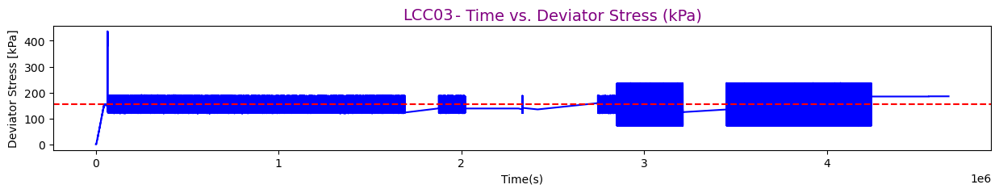

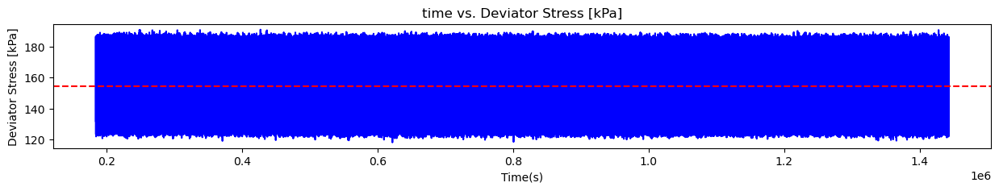

In [3]:
X1 = 10410  #216600  #1000 
X2 = 104300  #216900  #1200
mean_val_LCC03 = np.mean(df_LCC03_new.loc[10421:415131,'Deviator Stress (kPa)']) 
plt.figure(figsize=(15, 2)) 
plt.plot(df_LCC03_new['Time since start of test (s)'], df_LCC03_new['Deviator Stress (kPa)'], color='b')        # Deviator Stress (kPa)
plt.xlabel("Time(s)")
plt.ylabel("Deviator Stress [kPa]")
#plt.title('time vs. Deviator Stress (kPa)')
plt.axhline(y=mean_val_LCC03, color='r', linestyle='--', label='Mean Value')
plt.text(0.40, 1.05, 'LCC03', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.56, 1.05, '- Time vs. Deviator Stress (kPa)', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.show()


#X1 = 10421 #502495  #1000 
#X2 = 10450 #502502  #1200 
mean_val_LCC03 = np.mean(df_LCC03_new.loc[10421:415131,'Deviator Stress (kPa)']) 
plt.figure(figsize=(15, 2)) 
plt.plot(df_LCC03_new.loc[X1:X2, 'Time since start of test (s)'], df_LCC03_new.loc[X1:X2,'Deviator Stress (kPa)'], color='b')        # Deviator Stress (kPa)
plt.xlabel("Time(s)")
plt.ylabel("Deviator Stress [kPa]")
plt.title('time vs. Deviator Stress [kPa]')
plt.axhline(y=mean_val_LCC03, color='r', linestyle='--', label='Mean Value')
plt.show()

## Stage info 

In [4]:
Path_Stage_info_LCC03 = os.path.join('Outputs_csv', 'Stage_info_LCC03.csv')
Stage_info_LCC03 = pd.read_csv(Path_Stage_info_LCC03)
Stage_info_LCC03 = convert_uncertainty_columns(Stage_info_LCC03)

qcyc_LCC03_1 = unp.nominal_values(Stage_info_LCC03.loc[0]['qcyc'])
qcyc_LCC03_2 = unp.nominal_values(Stage_info_LCC03.loc[1]['qcyc'])

Stage_info_LCC03

,Sample type,Stage Number,Start index,End index,Rows nr,Star time,End time,Test duration(d),Cyclic loading duration(d),Cycles nr,...,q_m,q_p,q_min,q_max,q_avg,qcyc,qcyc/p0,CSR,qc/2Su,qm/2Su
0,LCC03,1,1103,166709,165607,65614,2850879,54.012917,32.236863,10420,...,(1.6+/-0.4)e+02,0,123.4+/-0.4,185.7+/-0.5,154.45+/-0.11,31.11+/-0.30,0.109+/-0.006,0.00794+/-0.00008,0.01589+/-0.00015,0.080+/-0.022
1,LCC03,2,166710,415166,248457,2850886,4666569,54.012917,21.014850,6383,...,(1.6+/-0.4)e+02,0,73.8+/-0.4,234.4+/-0.7,154.12+/-0.09,80.3+/-0.4,0.282+/-0.014,0.02051+/-0.00010,0.04102+/-0.00020,0.080+/-0.022


## Axial Stress & Axial Strain

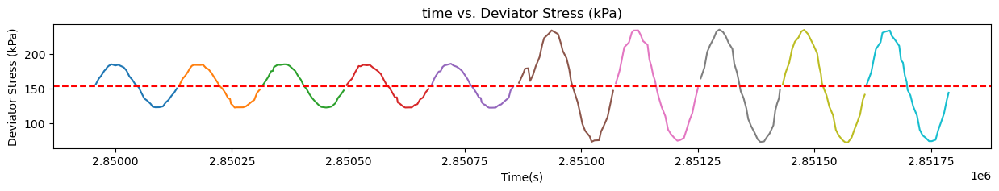

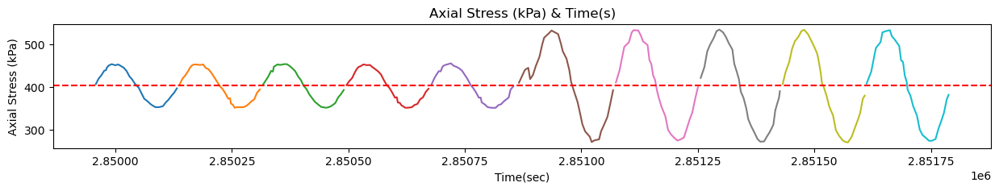

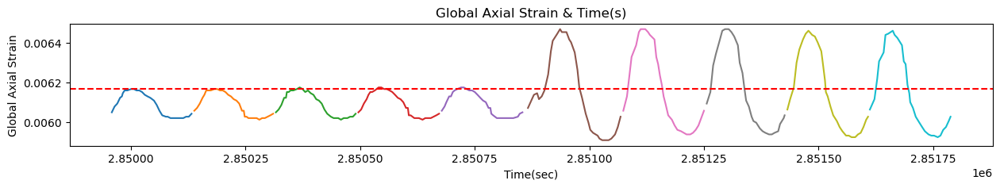

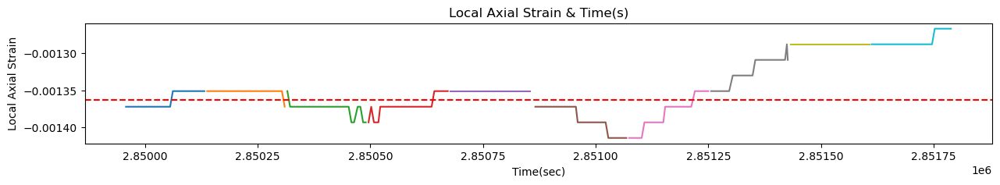

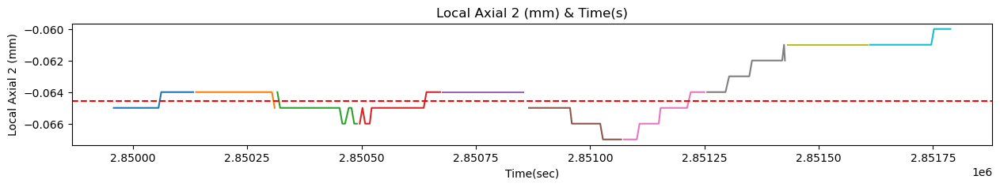

In [5]:
# The data for fitting
#['Local Axial 2 (mm)']
time = df_LCC03_new.loc[: ,'Time since start of test (s)']
stress = df_LCC03_new.loc[: ,'Axial Stress (kPa)']
local_strain = df_LCC03_new.loc[: ,'Local Axial Strain'] 
global_strain = df_LCC03_new.loc[: ,'Global Axial Strain'] 

###### Plot the data for several loops ################################# 236899
X1 = 10415
X2 = 10425

loop_indices = list(range(X1, X2)) 


plt.figure(figsize=(15, 2))

for i in loop_indices:
    if i < len(cycles_LCC03):
      time_values = cycles_LCC03[i]['Time since start of test (s)']
      stress_values = cycles_LCC03[i]['Deviator Stress (kPa)']
      plt.plot(time_values, stress_values)

plt.xlabel("Time(s)")
plt.ylabel('Deviator Stress (kPa)')
plt.title('time vs. Deviator Stress (kPa)')
plt.axhline(y=mean_val_LCC03, color='r', linestyle='--', label='Mean Value')
plt.show()


plt.figure(figsize=(15, 2))
for i in loop_indices:
    if i < len(cycles_LCC03):
      time = cycles_LCC03[i]['Time since start of test (s)']
      stress = cycles_LCC03[i]['Axial Stress (kPa)']
      plt.plot(time, stress)
      
plt.xlabel("Time(sec)")
plt.ylabel('Axial Stress (kPa)')
plt.title('Axial Stress (kPa) & Time(s)')
plt.axhline(y=np.mean(df_LCC03_new.loc[1104:415131 ,'Axial Stress (kPa)']), color='r', linestyle='--', label='Mean Value')
plt.show()  



plt.figure(figsize=(15, 2))
for i in loop_indices:
    if i < len(cycles_LCC03):
      time = cycles_LCC03[i]['Time since start of test (s)']
      global_strain = cycles_LCC03[i]['Global Axial Strain']
      plt.plot(time, global_strain)
      
plt.xlabel("Time(sec)")
plt.ylabel('Global Axial Strain')
plt.title('Global Axial Strain & Time(s)')
plt.axhline(y=np.mean(df_LCC03_new.loc[1104:415131 ,'Global Axial Strain']), color='r', linestyle='--', label='Mean Value')
plt.show()    



plt.figure(figsize=(15, 2))
for i in loop_indices:
    if i < len(cycles_LCC03):
      time = cycles_LCC03[i]['Time since start of test (s)']
      local_strain = cycles_LCC03[i]['Local Axial Strain'] 
      plt.plot(time, local_strain)

plt.xlabel("Time(sec)")
plt.ylabel('Local Axial Strain')
plt.title('Local Axial Strain & Time(s)')
plt.axhline(y=np.mean(df_LCC03_new.loc[1104:415131 ,'Local Axial Strain']), color='r', linestyle='--', label='Mean Value')


plt.figure(figsize=(15, 2))
for i in loop_indices:
    if i < len(cycles_LCC03):
      time = cycles_LCC03[i]['Time since start of test (s)']
      local_strain = cycles_LCC03[i]['Local Axial 2 (mm)'] 
      plt.plot(time, local_strain)

plt.xlabel("Time(sec)")
plt.ylabel('Local Axial 2 (mm)')
plt.title('Local Axial 2 (mm) & Time(s)')
plt.axhline(y=np.mean(df_LCC03_new.loc[1104:415131,'Local Axial 2 (mm)']), color='r', linestyle='--', label='Mean Value')

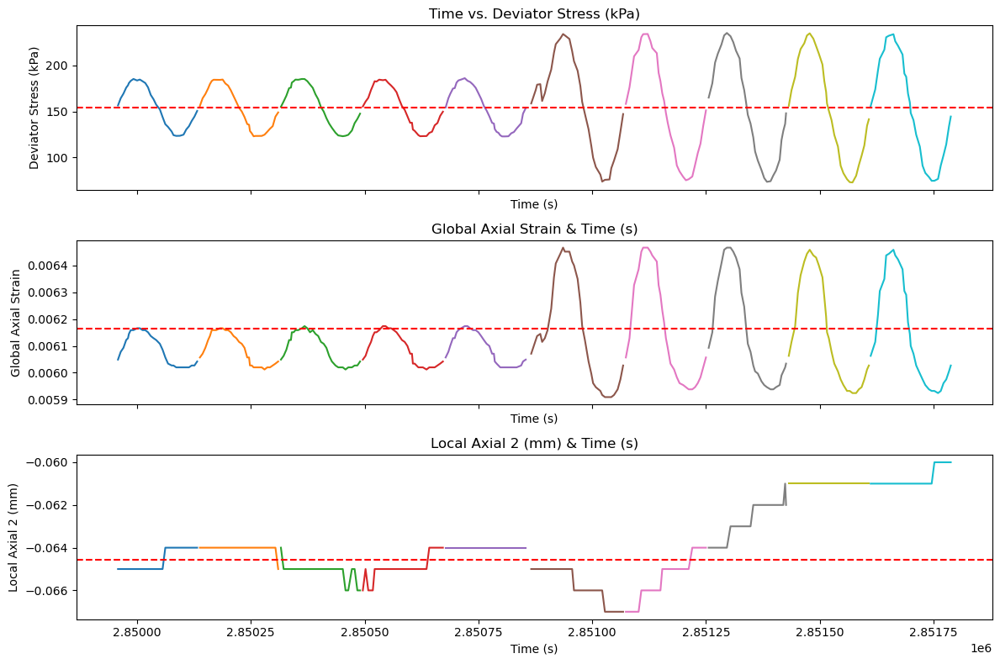

In [6]:
import matplotlib.pyplot as plt

ime = df_LCC03_new.loc[:, 'Time since start of test (s)']
stress = df_LCC03_new.loc[:, 'Axial Stress (kPa)']
local_strain = df_LCC03_new.loc[:, 'Local Axial Strain']
global_strain = df_LCC03_new.loc[:, 'Global Axial Strain']

###### Plot the data for several loops ################################# 236899
X1 = 10415
X2 = 10425

loop_indices = list(range(X1, X2))

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(12, 8), sharex=True)

for i in loop_indices:
    if i < len(cycles_LCC03):
        time_values = cycles_LCC03[i]['Time since start of test (s)']
        stress_values = cycles_LCC03[i]['Deviator Stress (kPa)']
        ax1.plot(time_values, stress_values)

ax1.set_xlabel("Time (s)")
ax1.set_ylabel('Deviator Stress (kPa)')
ax1.set_title('Time vs. Deviator Stress (kPa)')
ax1.axhline(y=mean_val_LCC03, color='r', linestyle='--', label='Mean Value')

for i in loop_indices:
    if i < len(cycles_LCC03):
        time = cycles_LCC03[i]['Time since start of test (s)']
        global_strain_values = cycles_LCC03[i]['Global Axial Strain']
        ax2.plot(time, global_strain_values)

ax2.set_xlabel("Time (s)")
ax2.set_ylabel('Global Axial Strain')
ax2.set_title('Global Axial Strain & Time (s)')
ax2.axhline(y=np.mean(df_LCC03_new.loc[1104:415131, 'Global Axial Strain']), color='r', linestyle='--', label='Mean Value')

for i in loop_indices:
    if i < len(cycles_LCC03):
        time = cycles_LCC03[i]['Time since start of test (s)']
        local_strain_values = cycles_LCC03[i]['Local Axial 2 (mm)']
        ax3.plot(time, local_strain_values)

ax3.set_xlabel("Time (s)")
ax3.set_ylabel('Local Axial 2 (mm)')
ax3.set_title('Local Axial 2 (mm) & Time (s)')
ax3.axhline(y=np.mean(df_LCC03_new.loc[1104:415131, 'Local Axial 2 (mm)']), color='r', linestyle='--', label='Mean Value')

plt.tight_layout()
plt.show()

##  Damping Ratio

<Figure size 1200x400 with 0 Axes>

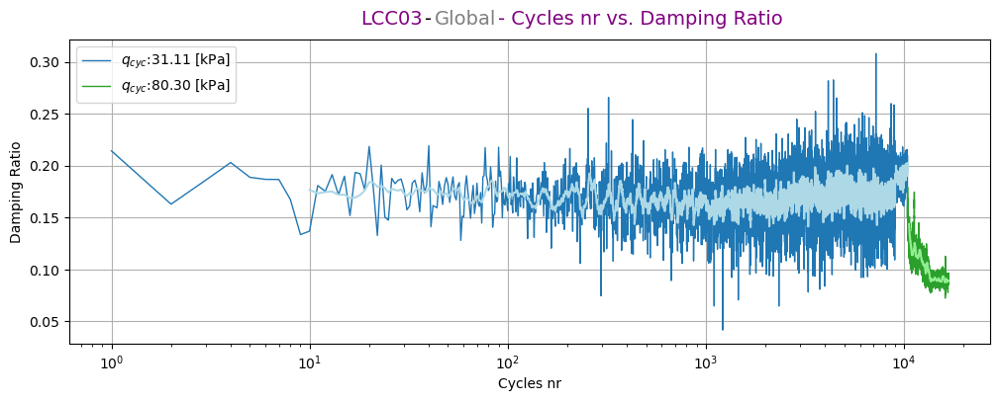

In [7]:
plt.figure(figsize=(12, 4)) 

x_values_G_1 = cycle_info_LCC03_G_1['Loop_Number']
y_values_G_1 = cycle_info_LCC03_G_1['Damping_ratio']
y_series_G_1 = pd.Series(y_values_G_1)
moving_avg_G_1 = y_series_G_1.rolling(10).mean()

x_values_G_2 = cycle_info_LCC03_G_2['Loop_Number']
y_values_G_2 = cycle_info_LCC03_G_2['Damping_ratio']
y_series_G_2 = pd.Series(y_values_G_2)
moving_avg_G_2 = y_series_G_2.rolling(200).mean()


import matplotlib.pyplot as plt
from matplotlib.colors import to_rgb

plt.figure(figsize=(12, 4))
plt.plot(x_values_G_1, y_values_G_1, color=to_rgb('tab:blue'), label=f'$q_{{cyc}}$:{qcyc_LCC03_1:.2f} [kPa]', linewidth=1)
plt.plot(x_values_G_1, moving_avg_G_1, color=to_rgb('lightblue'))
plt.plot(x_values_G_2, y_values_G_2, color=to_rgb('tab:green'), label=f'$q_{{cyc}}$:{qcyc_LCC03_2:.2f} [kPa]', linewidth=1)
plt.plot(x_values_G_2, moving_avg_G_2, color=to_rgb('lightgreen'))

plt.legend(loc='upper left')
plt.xscale('log')
plt.xlabel("Cycles nr")
plt.ylabel("Damping Ratio")
plt.text(0.35, 1.05, 'LCC03', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.39, 1.05, '-', fontsize=14, color='black', ha='center', transform=plt.gca().transAxes)
plt.text(0.43, 1.05, 'Global', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.62, 1.05, '- Cycles nr vs. Damping Ratio', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()




## Secant Stiffness E & Time

<Figure size 1200x400 with 0 Axes>

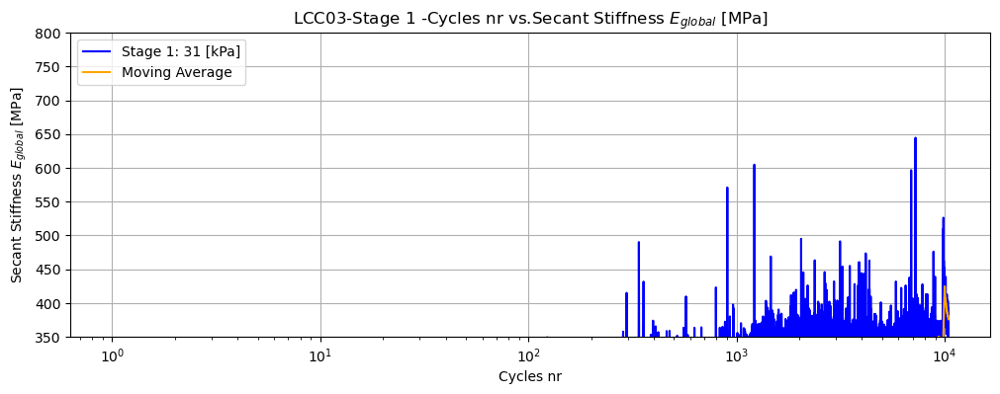

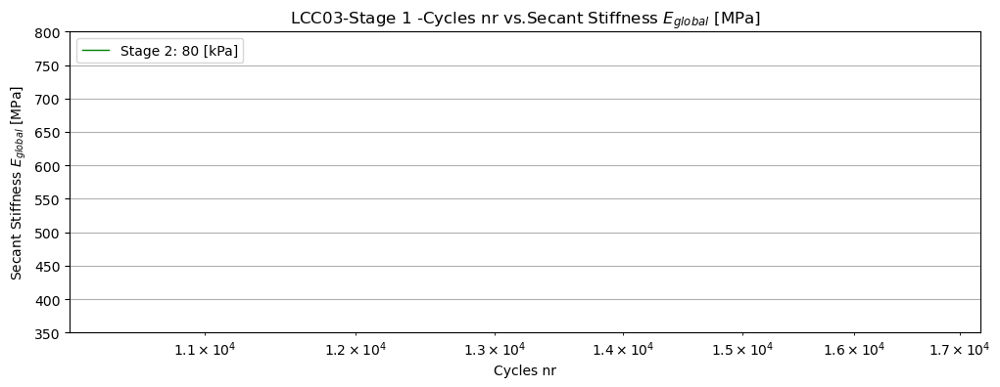

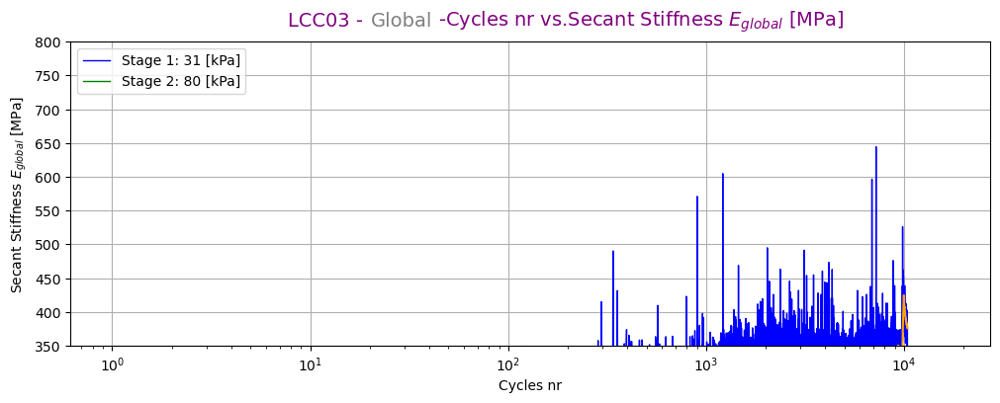

In [8]:
plt.figure(figsize=(12, 4)) 
window_size = 100
x_values_G_1 = cycle_info_LCC03_G_1['Loop_Number']
x_values_G_2 = cycle_info_LCC03_G_2['Loop_Number']
y_values_G_1 = cycle_info_LCC03_G_1['E(MPa)']
y_values_G_2 = cycle_info_LCC03_G_2['E(MPa)']
y_series_G_1 = pd.Series(y_values_G_1)
y_series_G_2 = pd.Series(y_values_G_2)
moving_avg_G_1 = y_series_G_1.rolling(150).mean()
moving_avg_G_2 = y_series_G_2.rolling(150).mean()


plt.figure(figsize=(12, 4)) 
plt.plot(x_values_G_1, y_values_G_1, color='blue', label=f'Stage 1: {qcyc_LCC03_1:.0f} [kPa]')
plt.plot(x_values_G_1, moving_avg_G_1, color='orange', label='Moving Average')
plt.ylim([350, 800])
plt.legend(loc='upper left')
plt.xscale('log')
plt.xlabel("Cycles nr")
plt.ylabel("Secant Stiffness $E_{global}$ [MPa]")
plt.title('LCC03-Stage 1 -Cycles nr vs.Secant Stiffness $E_{global}$ [MPa]')
plt.grid(True)
plt.show()

plt.figure(figsize=(12, 4)) 
plt.plot(x_values_G_2, y_values_G_2, color='green', label=f'Stage 2: {qcyc_LCC03_2:.0f} [kPa]', linewidth=1)
plt.plot(x_values_G_2, moving_avg_G_2, color='orange')
plt.ylim([350, 800])
plt.legend(loc='upper left')
plt.xscale('log')
plt.xlabel("Cycles nr")
plt.ylabel("Secant Stiffness $E_{global}$ [MPa]")
plt.title('LCC03-Stage 1 -Cycles nr vs.Secant Stiffness $E_{global}$ [MPa]')
plt.grid(True)
plt.show()

plt.figure(figsize=(12, 4)) 
plt.plot(x_values_G_1, y_values_G_1, color='blue', label=f'Stage 1: {qcyc_LCC03_1:.0f} [kPa]', linewidth=1)
plt.plot(x_values_G_2, y_values_G_2, color='green', label=f'Stage 2: {qcyc_LCC03_2:.0f} [kPa]', linewidth=1)
plt.plot(x_values_G_1, moving_avg_G_1, color='orange' ) #, label='Moving Average')
plt.plot(x_values_G_2, moving_avg_G_2, color='orange')
plt.ylim([350, 800])
plt.legend(loc='upper left')
plt.xscale('log')
plt.ylabel("Secant Stiffness $E_{global}$ [MPa]")
plt.xlabel("Cycles nr")
plt.text(0.28, 1.05, 'LCC03 - ', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.36, 1.05, 'Global', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.62, 1.05, '-Cycles nr vs.Secant Stiffness $E_{global}$ [MPa]', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()

## Shear Modulus G

<Figure size 1200x400 with 0 Axes>

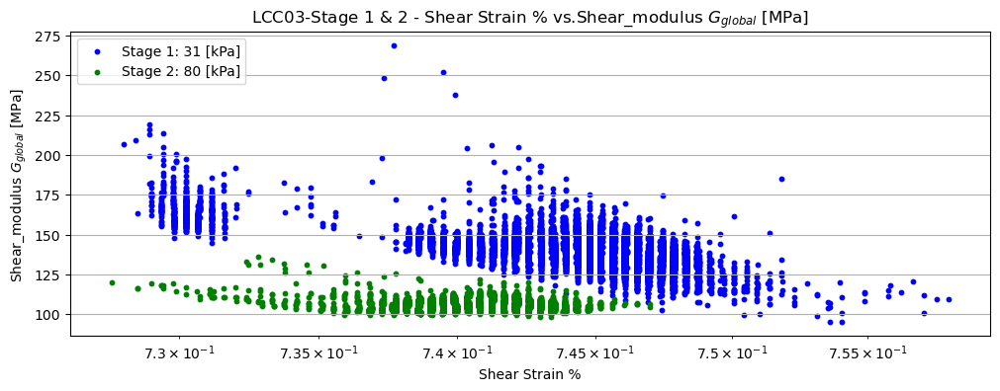

In [9]:
plt.figure(figsize=(12, 4)) 
window_size = 100
x_values_G_1 = unp.nominal_values(cycle_info_LCC03_G_1['Shear Strain'])
x_values_G_2 = unp.nominal_values(cycle_info_LCC03_G_2['Shear Strain'])
y_values_G_1 = unp.nominal_values(cycle_info_LCC03_G_1['Shear_modulus_(MPa)'])
y_values_G_2 = unp.nominal_values(cycle_info_LCC03_G_2['Shear_modulus_(MPa)'])
y_series_G_1 = pd.Series(y_values_G_1)
y_series_G_2 = pd.Series(y_values_G_2)
moving_avg_G_1 = y_series_G_1.rolling(150).mean()
moving_avg_G_2 = y_series_G_2.rolling(150).mean()





plt.figure(figsize=(12, 4)) 
plt.scatter(x_values_G_1, y_values_G_1, color='blue', label=f'Stage 1: {qcyc_LCC03_1:.0f} [kPa]', s = 10 )
plt.scatter(x_values_G_2, y_values_G_2, color='green', label=f'Stage 2: {qcyc_LCC03_2:.0f} [kPa]', s = 10 )
#plt.plot(x_values_G_1, moving_avg_G_1, color='orange', label='Moving Average')
#plt.plot(x_values_G_2, moving_avg_G_2, color='orange')
#plt.ylim([200, 350])
plt.legend(loc='upper left')
plt.xscale('log')
plt.xlabel("Shear Strain %")
plt.ylabel("Shear_modulus $G_{global}$ [MPa]")
plt.title('LCC03-Stage 1 & 2 - Shear Strain % vs.Shear_modulus $G_{global}$ [MPa]')
plt.grid(True)
plt.show()



## G/G0

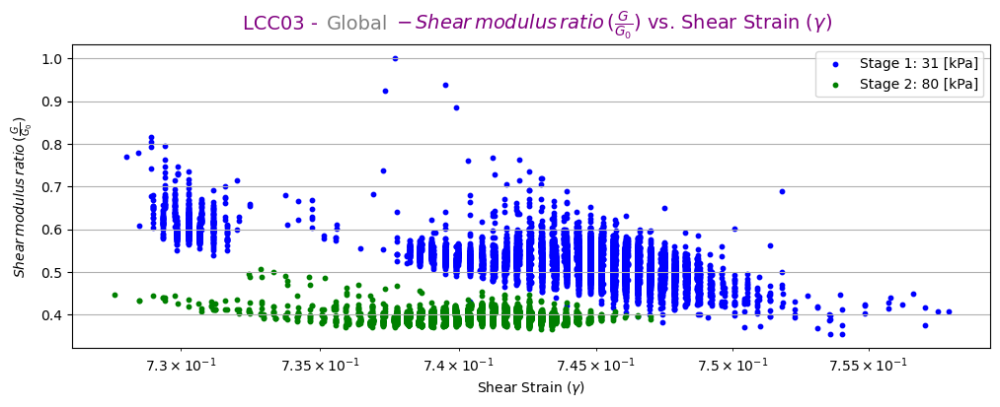

In [10]:
import matplotlib.ticker as mticker
window_size = 100
# G/G0  global
Gmax_LCC03_G_1 = np.max(cycle_info_LCC03_G_1['Shear_modulus_(MPa)'])
Gmax_LCC03_G_2 = np.max(cycle_info_LCC03_G_2['Shear_modulus_(MPa)'])
Gmax_LCC03_G = np.max(cycle_info_LCC03_G['Shear_modulus_(MPa)'])
Gmax_LCC03_L_1 = np.max(cycle_info_LCC03_L_1['Shear_modulus_(MPa)'])
Gmax_LCC03_L_2 = np.max(cycle_info_LCC03_L_2['Shear_modulus_(MPa)'])
Gmax_LCC03_L = np.max(cycle_info_LCC03_L['Shear_modulus_(MPa)'])

x_values_G_1 = unp.nominal_values(cycle_info_LCC03_G_1['Shear Strain'])
x_values_G_2 = unp.nominal_values(cycle_info_LCC03_G_2['Shear Strain'])
y_values_G_1 = unp.nominal_values(cycle_info_LCC03_G_1['Shear_modulus_(MPa)']) / unp.nominal_values(Gmax_LCC03_G)
y_values_G_2 = unp.nominal_values(cycle_info_LCC03_G_2['Shear_modulus_(MPa)']) / unp.nominal_values(Gmax_LCC03_G)

y_series_G_1 = pd.Series(y_values_G_1)
y_series_G_2 = pd.Series(y_values_G_2)
moving_avg_G_1 = y_series_G_1.rolling(150).mean()
moving_avg_G_2 = y_series_G_2.rolling(150).mean()


plt.figure(figsize=(12, 4)) 
plt.scatter(x_values_G_1, y_values_G_1, color='blue', label=f'Stage 1: {qcyc_LCC03_1:.0f} [kPa]', s = 10)
plt.scatter(x_values_G_2, y_values_G_2, color='green', label=f'Stage 2: {qcyc_LCC03_2:.0f} [kPa]', s = 10 )
#plt.plot(x_values_G_1, moving_avg_G_1, color='orange', label='Moving Average')
#plt.plot(x_values_G_2, moving_avg_G_2, color='orange')
#plt.ylim([200, 350])
plt.xscale('log')



plt.legend(loc='upper right')
plt.xlabel(r'Shear Strain $\gamma$ %')
plt.ylabel(r'$Shear\, modulus\, ratio\,(\frac{G}{G_0}$)')
plt.xlabel(r'Shear Strain ($\gamma$)')
plt.text(0.23, 1.05, 'LCC03 - ', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.31, 1.05, 'Global', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.59, 1.05, r'$-\,Shear\, modulus\, ratio\,(\frac{G}{G_0}$) vs. Shear Strain ($\gamma$)', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()



## PWP $\Delta \text{{u}}$

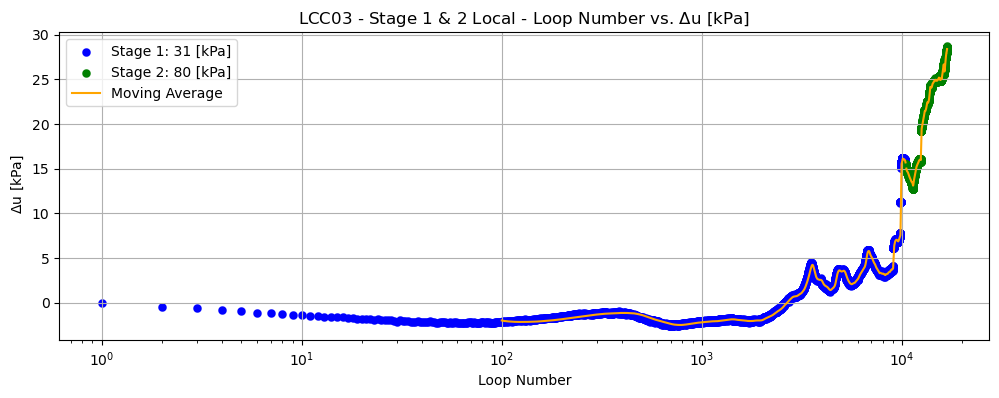

In [11]:
window_size = 100
x_values_G_1 = cycle_info_LCC03_G_1['Loop_Number']
x_values_G_2 = cycle_info_LCC03_G_2['Loop_Number']
y_values_G_1 = unp.nominal_values(cycle_info_LCC03_G_1['delta_pwp'])
y_values_G_2 = unp.nominal_values(cycle_info_LCC03_G_2['delta_pwp'])
y_series_G_1 = pd.Series(y_values_G_1)
y_series_G_2 = pd.Series(y_values_G_2)
moving_avg_G_1 = y_series_G_1.rolling(100).mean()
moving_avg_G_2 = y_series_G_2.rolling(100).mean()


plt.figure(figsize=(12, 4)) 
plt.scatter(x_values_G_1, y_values_G_1, color='blue', label=f'Stage 1: {qcyc_LCC03_1:.0f} [kPa]', linewidth=0.1)
plt.scatter(x_values_G_2, y_values_G_2, color='green', label=f'Stage 2: {qcyc_LCC03_2:.0f} [kPa]', linewidth=0.1)
plt.plot(x_values_G_1, moving_avg_G_1, color='orange', label='Moving Average')
plt.plot(x_values_G_2, moving_avg_G_2, color='orange')
plt.legend(loc='upper left')
plt.xscale('log')
plt.xlabel(r'Loop Number')
plt.ylabel(r' $\Delta$u [kPa]')
plt.title(r'LCC03 - Stage 1 & 2 Local - Loop Number vs. $\Delta$u [kPa]')
plt.grid(True)
plt.show()


# LCC17

## Reading the data with its cycles

In [13]:
# To read the CSV file and identify each cycle separately, you can use:                                   
Path_df_LCC17_new = os.path.join('Outputs_csv', 'df_LCC17_new.csv')
df_LCC17_new = pd.read_csv(Path_df_LCC17_new)
df_LCC17_new = convert_uncertainty_columns(df_LCC17_new)

cycles_LCC17 = {}
for cycle_nr in df_LCC17_new['Cycle nr'].unique():
    cycles_LCC17[cycle_nr] = df_LCC17_new[df_LCC17_new['Cycle nr'] == cycle_nr]

Path_cycle_info_LCC17_G = os.path.join('Outputs_csv', 'cycle_info_LCC17_G.csv')
cycle_info_LCC17_G = pd.read_csv(Path_cycle_info_LCC17_G)
cycle_info_LCC17_G = convert_uncertainty_columns(cycle_info_LCC17_G)

Path_cycle_info_LCC17_L = os.path.join('Outputs_csv', 'cycle_info_LCC17_L.csv')
cycle_info_LCC17_L = pd.read_csv(Path_cycle_info_LCC17_L)
cycle_info_LCC17_L = convert_uncertainty_columns(cycle_info_LCC17_L)

split_index = 10065
cycle_info_LCC17_G_1 = cycle_info_LCC17_G.iloc[:split_index].reset_index(drop=True)
cycle_info_LCC17_G_2 = cycle_info_LCC17_G.iloc[split_index:].reset_index(drop=True)
cycle_info_LCC17_L_1 = cycle_info_LCC17_L.iloc[:split_index].reset_index(drop=True)
cycle_info_LCC17_L_2 = cycle_info_LCC17_L.iloc[split_index:].reset_index(drop=True)

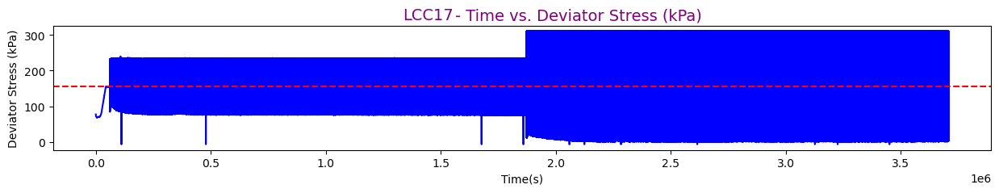

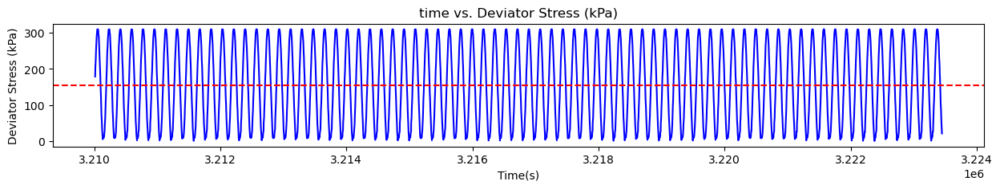

In [14]:
X1 = 1200  #216600  #1000 
X2 = 1400  #216900  #1200
mean_val_LCC17 = np.mean(df_LCC17_new.loc[1027:,'Deviator Stress (kPa)']) 
plt.figure(figsize=(15, 2)) 
plt.plot(df_LCC17_new['Time since start of test (s)'], df_LCC17_new['Deviator Stress (kPa)'], color='b')        # Deviator Stress (kPa)
plt.xlabel("Time(s)")
plt.ylabel("Deviator Stress (kPa)")
#plt.title('time vs. Deviator Stress (kPa)')
plt.axhline(y=mean_val_LCC17, color='r', linestyle='--', label='Mean Value')
plt.text(0.40, 1.05, 'LCC17', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.56, 1.05, '- Time vs. Deviator Stress (kPa)', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.show()

X1 = 499000  #502495  #1000 
X2 = 502000 #502502  #1200 
mean_val_LCC17 = np.mean(df_LCC17_new.loc[1027:,'Deviator Stress (kPa)']) 
plt.figure(figsize=(15, 2)) 
plt.plot(df_LCC17_new.loc[X1:X2, 'Time since start of test (s)'], df_LCC17_new.loc[X1:X2,'Deviator Stress (kPa)'], color='b')        # Deviator Stress (kPa)
plt.xlabel("Time(s)")
plt.ylabel("Deviator Stress (kPa)")
plt.title('time vs. Deviator Stress (kPa)')
plt.axhline(y=mean_val_LCC17, color='r', linestyle='--', label='Mean Value')
plt.show()

## Stage info 

In [15]:
Path_Stage_info_LCC17 = os.path.join('Outputs_csv', 'Stage_info_LCC17.csv')
Stage_info_LCC17 = pd.read_csv(Path_Stage_info_LCC17)
Stage_info_LCC17 = convert_uncertainty_columns(Stage_info_LCC17)

qcyc_LCC17_1 = unp.nominal_values(Stage_info_LCC17.loc[0]['qcyc'])
qcyc_LCC17_2 = unp.nominal_values(Stage_info_LCC17.loc[1]['qcyc'])

Stage_info_LCC17

,Sample type,Stage Number,Start index,End index,Rows nr,Star time,End time,Test duration(d),Cyclic loading duration(d),Cycles nr,...,q_m,q_p,q_min,q_max,q_avg,qcyc,qcyc/p0,CSR,qc/2Su,qm/2Su
0,LCC17,1,1026,216770,215745,61498,1872958,42.91963,20.965972,10064,...,(1.6+/-0.4)e+02,0,78.28+/-0.29,233.1+/-0.6,155.60+/-0.10,77.41+/-0.31,0.250+/-0.011,0.01976+/-0.00008,0.03953+/-0.00016,0.079+/-0.022
1,LCC17,2,216771,603730,386960,1872964,3708268,42.91963,21.241944,10196,...,(1.6+/-0.4)e+02,0,4.82+/-0.16,310.0+/-0.7,154.72+/-0.08,152.57+/-0.35,0.493+/-0.023,0.03895+/-0.00009,0.07791+/-0.00018,0.079+/-0.022


In [16]:
total_Cycle_nr = Stage_info_LCC17.loc[0]['Cycles nr'] + Stage_info_LCC17.loc[1]['Cycles nr'] 
total_Cycle_nr

20260

## Axial Stress & Axial Strain

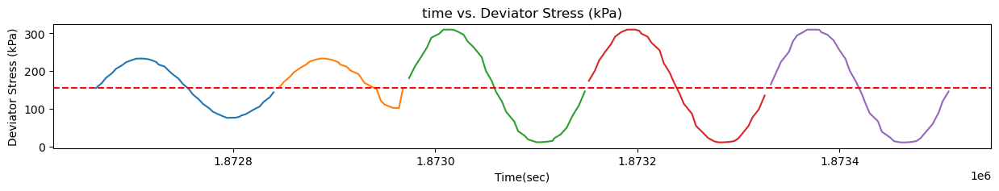

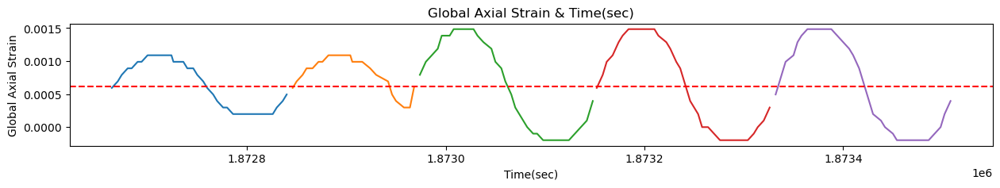

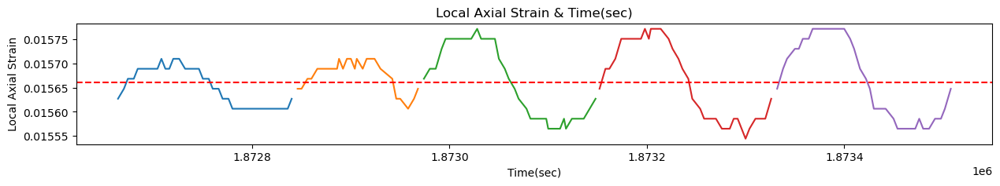

In [17]:
# The data for fitting
#['Local Axial 2 (mm)']
time = df_LCC17_new.loc[: ,'Time since start of test (s)']
stress = df_LCC17_new.loc[: ,'Axial Stress (kPa)']
local_strain = df_LCC17_new.loc[: ,'Local Axial Strain'] 
global_strain = df_LCC17_new.loc[: ,'Global Axial Strain'] 

###### Plot the data for several loops ################################# 236899
X1 = 10063
X2 = 10068

loop_indices = list(range(X1, X2)) 


plt.figure(figsize=(15, 2))

for i in loop_indices:
    if i < len(cycles_LCC17):
      time_values = cycles_LCC17[i]['Time since start of test (s)']
      stress_values = cycles_LCC17[i]['Deviator Stress (kPa)']
      plt.plot(time_values, stress_values)

plt.xlabel("Time(sec)")
plt.ylabel('Deviator Stress (kPa)')
plt.title('time vs. Deviator Stress (kPa)')
plt.axhline(y=mean_val_LCC17, color='r', linestyle='--', label='Mean Value')
plt.show()




plt.figure(figsize=(15, 2))
for i in loop_indices:
    if i < len(cycles_LCC17):
      time = cycles_LCC17[i]['Time since start of test (s)']
      global_strain = cycles_LCC17[i]['Global Axial Strain']
      plt.plot(time, global_strain)
      
plt.xlabel("Time(sec)")
plt.ylabel('Global Axial Strain')
plt.title('Global Axial Strain & Time(sec)')
plt.axhline(y=np.mean(df_LCC17_new.loc[1104:415153 ,'Global Axial Strain']), color='r', linestyle='--', label='Mean Value')
plt.show()    



plt.figure(figsize=(15, 2))
for i in loop_indices:
    if i < len(cycles_LCC17):
      time = cycles_LCC17[i]['Time since start of test (s)']
      local_strain = cycles_LCC17[i]['Local Axial Strain'] 
      plt.plot(time, local_strain)

plt.xlabel("Time(sec)")
plt.ylabel('Local Axial Strain')
plt.title('Local Axial Strain & Time(sec)')
plt.axhline(y=np.mean(df_LCC17_new.loc[1104:415153 ,'Local Axial Strain']), color='r', linestyle='--', label='Mean Value')

##  Damping Ratio

<Figure size 1200x400 with 0 Axes>

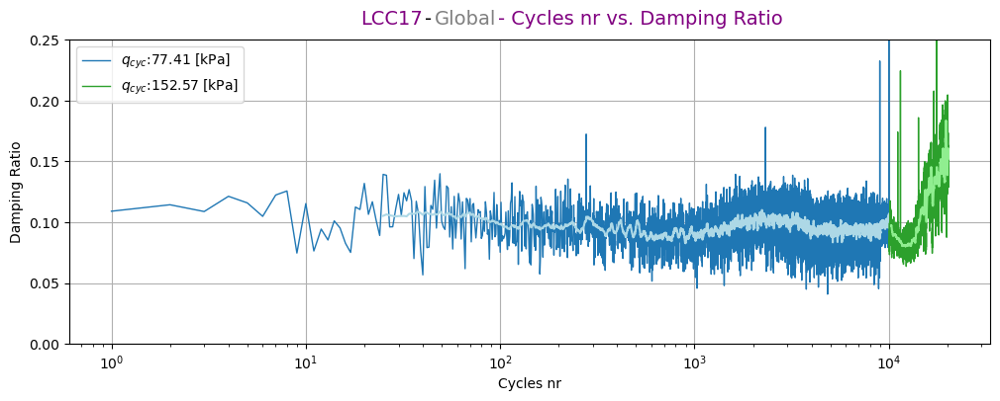

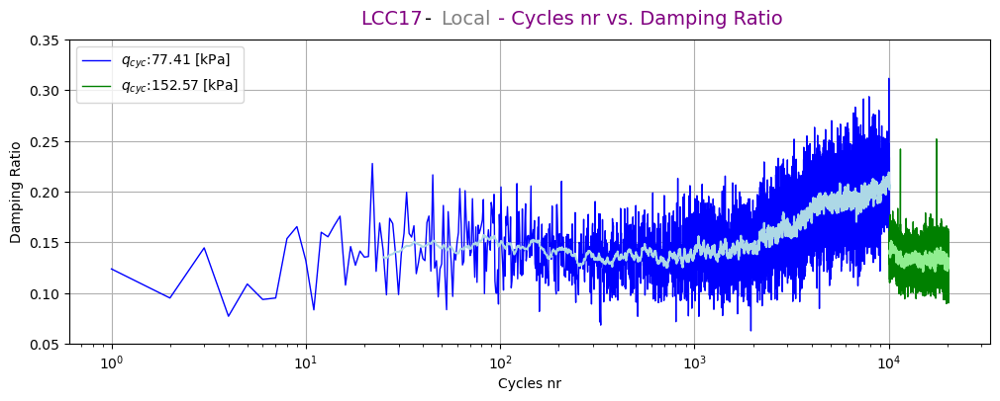

In [18]:
plt.figure(figsize=(12, 4)) 

x_values_G_1 = cycle_info_LCC17_G_1['Loop_Number']
y_values_G_1 = cycle_info_LCC17_G_1['Damping_ratio']
y_series_G_1 = pd.Series(y_values_G_1)
moving_avg_G_1 = y_series_G_1.rolling(25).mean()

x_values_G_2 = cycle_info_LCC17_G_2['Loop_Number']
y_values_G_2 = cycle_info_LCC17_G_2['Damping_ratio']
y_series_G_2 = pd.Series(y_values_G_2)
moving_avg_G_2 = y_series_G_2.rolling(200).mean()

x_values_L_1 = cycle_info_LCC17_L_1['Loop_Number']
y_values_L_1 = cycle_info_LCC17_L_1['Damping_ratio']
y_series_L_1 = pd.Series(y_values_L_1)
moving_avg_L_1 = y_series_L_1.rolling(25).mean()

x_values_L_2 = cycle_info_LCC17_L_2['Loop_Number']
y_values_L_2 = cycle_info_LCC17_L_2['Damping_ratio']
y_series_L_2 = pd.Series(y_values_L_2)
moving_avg_L_2 = y_series_L_2.rolling(25).mean()

colors = mcolors.TABLEAU_COLORS

plt.figure(figsize=(12, 4)) 
plt.plot(x_values_G_1, y_values_G_1, color=colors['tab:blue'], label=f'$q_{{cyc}}$:{qcyc_LCC17_1:.2f} [kPa]', linewidth=1)
plt.plot(x_values_G_1, moving_avg_G_1, color='lightblue') #, label='Moving Average')

plt.plot(x_values_G_2, y_values_G_2, color=colors['tab:green'], label=f'$q_{{cyc}}$:{qcyc_LCC17_2:.2f} [kPa]', linewidth=1)
plt.plot(x_values_G_2, moving_avg_G_2, color='lightgreen') #, label='Moving Average')

plt.ylim([0, 0.25])
plt.legend(loc='upper left')
plt.xscale('log')
plt.xlabel("Cycles nr")
plt.ylabel("Damping Ratio")
plt.text(0.35, 1.05, 'LCC17', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.39, 1.05, '-', fontsize=14, color='black', ha='center', transform=plt.gca().transAxes)
plt.text(0.43, 1.05, 'Global', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.62, 1.05, '- Cycles nr vs. Damping Ratio', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()


plt.figure(figsize=(12, 4)) 
plt.plot(x_values_L_1, y_values_L_1, color= 'blue', label=f'$q_{{cyc}}$:{qcyc_LCC17_1:.2f} [kPa]', linewidth=1)
plt.plot(x_values_L_1, moving_avg_L_1, color='lightblue') #, label='Moving Average')

plt.plot(x_values_L_2, y_values_L_2, color= 'green', label=f'$q_{{cyc}}$:{qcyc_LCC17_2:.2f} [kPa]', linewidth=1)
plt.plot(x_values_L_2, moving_avg_L_2, color='lightgreen' ) #, label='Moving Average')

plt.ylim([0.05, 0.35])
plt.legend(loc='upper left')
plt.xscale('log')
plt.xlabel("Cycles nr")
plt.ylabel("Damping Ratio")
plt.text(0.35, 1.05, 'LCC17', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.39, 1.05, '-', fontsize=14, color='black', ha='center', transform=plt.gca().transAxes)
plt.text(0.43, 1.05, 'Local', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.62, 1.05, '- Cycles nr vs. Damping Ratio', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()


## Secant Stiffness E & Time

<Figure size 1200x400 with 0 Axes>

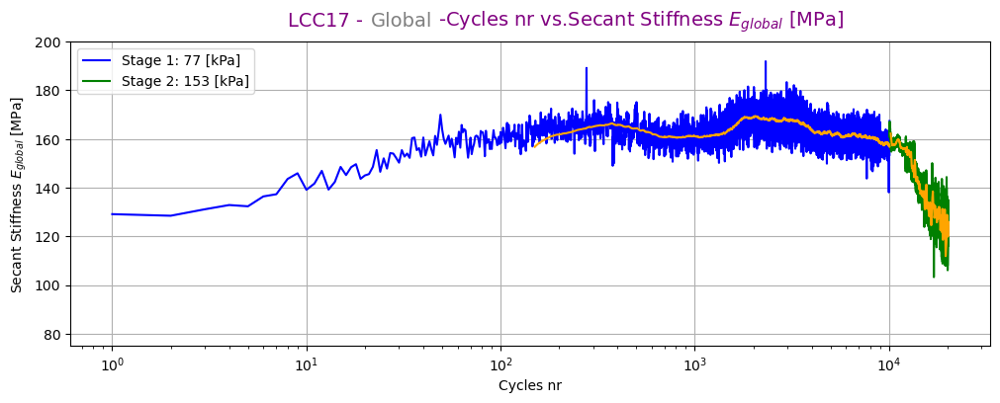

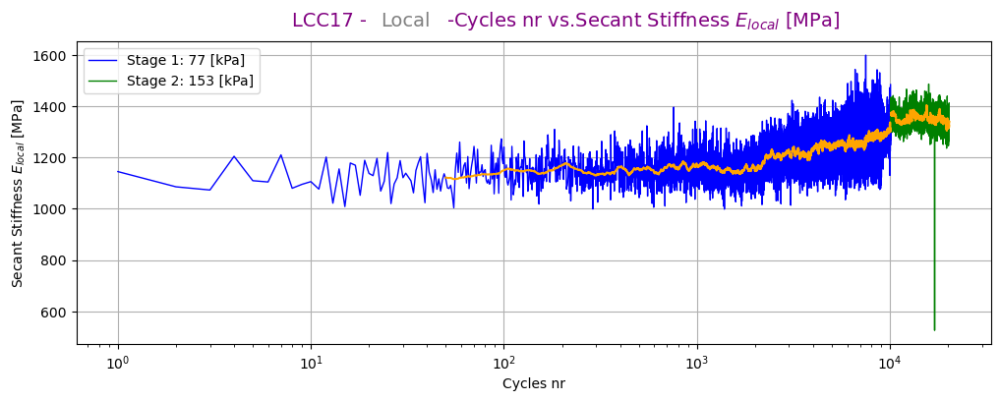

In [19]:
plt.figure(figsize=(12, 4)) 
window_size = 100
x_values_G_1 = cycle_info_LCC17_G_1['Loop_Number']
x_values_G_2 = cycle_info_LCC17_G_2['Loop_Number']
y_values_G_1 = cycle_info_LCC17_G_1['E(MPa)']
y_values_G_2 = cycle_info_LCC17_G_2['E(MPa)']
y_series_G_1 = pd.Series(y_values_G_1)
y_series_G_2 = pd.Series(y_values_G_2)
moving_avg_G_1 = y_series_G_1.rolling(150).mean()
moving_avg_G_2 = y_series_G_2.rolling(150).mean()

qcyc_LCC17_1 = unp.nominal_values(Stage_info_LCC17.loc[0]['qcyc'])
qcyc_LCC17_2 = unp.nominal_values(Stage_info_LCC17.loc[1]['qcyc'])
x_values_L_1 = cycle_info_LCC17_L_1['Loop_Number']
x_values_L_2 = cycle_info_LCC17_L_2['Loop_Number']
y_values_L_1 = cycle_info_LCC17_L_1['E(MPa)']
y_values_L_2 = cycle_info_LCC17_L_2['E(MPa)']
y_series_L_1 = pd.Series(y_values_L_1)
y_series_L_2 = pd.Series(y_values_L_2)
moving_avg_L_1 = y_series_L_1.rolling(50).mean()
moving_avg_L_2 = y_series_L_2.rolling(50).mean()



plt.figure(figsize=(12, 4)) 
plt.plot(x_values_G_1, y_values_G_1, color='blue', label=f'Stage 1: {qcyc_LCC17_1:.0f} [kPa]')
plt.plot(x_values_G_2, y_values_G_2, color='green', label=f'Stage 2: {qcyc_LCC17_2:.0f} [kPa]')
plt.plot(x_values_G_1, moving_avg_G_1, color='orange' ) #, label='Moving Average')
plt.plot(x_values_G_2, moving_avg_G_2, color='orange')
plt.ylim([75, 200])
plt.legend(loc='upper left')
plt.xscale('log')
plt.xlabel("Cycles nr")
plt.ylabel("Secant Stiffness $E_{global}$ [MPa]")
plt.text(0.28, 1.05, 'LCC17 - ', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.36, 1.05, 'Global', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.62, 1.05, '-Cycles nr vs.Secant Stiffness $E_{global}$ [MPa]', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()






plt.figure(figsize=(12, 4)) 
plt.plot(x_values_L_1, y_values_L_1, color='blue', label=f'Stage 1: {qcyc_LCC17_1:.0f} [kPa]', linewidth=1)
plt.plot(x_values_L_2, y_values_L_2, color='green', label=f'Stage 2: {qcyc_LCC17_2:.0f} [kPa]', linewidth=1)
plt.plot(x_values_L_1, moving_avg_L_1, color='orange') #, label='Moving Average')
plt.plot(x_values_L_2, moving_avg_L_2, color='orange')
#plt.ylim([750, 3500])
plt.legend(loc='upper left')
plt.xscale('log')
plt.xlabel("Cycles nr")
plt.ylabel("Secant Stiffness $E_{local}$ [MPa]")
plt.text(0.28, 1.05, 'LCC17 - ', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.36, 1.05, 'Local', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.62, 1.05, '-Cycles nr vs.Secant Stiffness $E_{local}$ [MPa]', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()




## Shear Modulus G

<Figure size 1200x400 with 0 Axes>

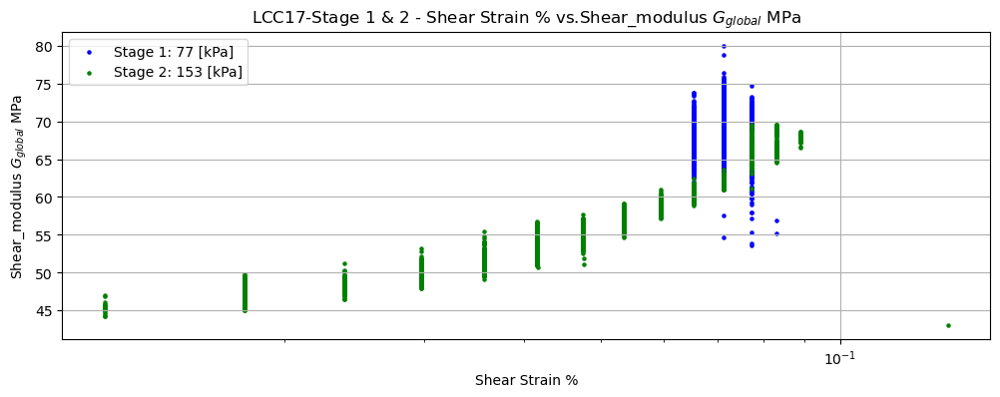

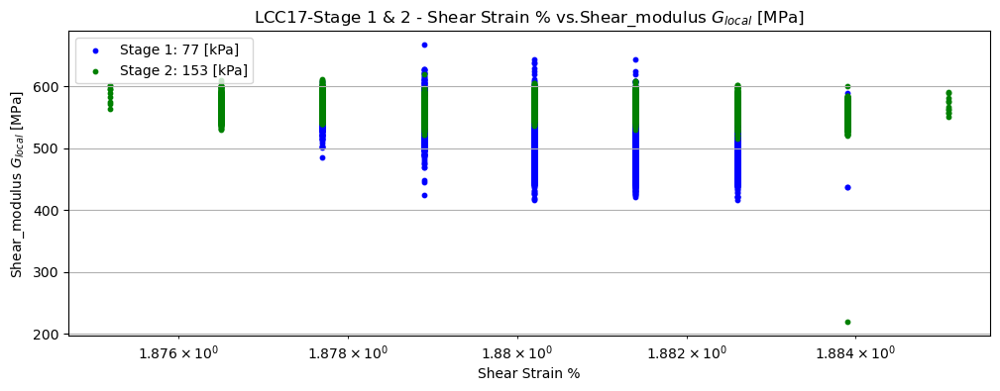

In [20]:
plt.figure(figsize=(12, 4)) 
window_size = 100
x_values_G_1 = unp.nominal_values(cycle_info_LCC17_G_1['Shear Strain'])
x_values_G_2 = unp.nominal_values(cycle_info_LCC17_G_2['Shear Strain'])
y_values_G_1 = cycle_info_LCC17_G_1['Shear_modulus_(MPa)']
y_values_G_2 = cycle_info_LCC17_G_2['Shear_modulus_(MPa)']
y_series_G_1 = pd.Series(y_values_G_1)
y_series_G_2 = pd.Series(y_values_G_2)
moving_avg_G_1 = y_series_G_1.rolling(150).mean()
moving_avg_G_2 = y_series_G_2.rolling(150).mean()

qcyc_LCC17_1 = unp.nominal_values(Stage_info_LCC17.loc[0]['qcyc'])
qcyc_LCC17_2 = unp.nominal_values(Stage_info_LCC17.loc[1]['qcyc'])
x_values_L_1 = unp.nominal_values(cycle_info_LCC17_L_1['Shear Strain'])
x_values_L_2 = unp.nominal_values(cycle_info_LCC17_L_2['Shear Strain']) 
y_values_L_1 = cycle_info_LCC17_L_1['Shear_modulus_(MPa)']
y_values_L_2 = cycle_info_LCC17_L_2['Shear_modulus_(MPa)']
#y_series_L_1 = pd.Series(y_values_L_1)
#y_series_L_2 = pd.Series(y_values_L_2)
moving_avg_L_1 = y_series_L_1.rolling(100).mean()
moving_avg_L_2 = y_series_L_2.rolling(100).mean()



plt.figure(figsize=(12, 4)) 
plt.scatter(x_values_G_1, y_values_G_1, color='blue', label=f'Stage 1: {qcyc_LCC17_1:.0f} [kPa]', s=5)
plt.scatter(x_values_G_2, y_values_G_2, color='green', label=f'Stage 2: {qcyc_LCC17_2:.0f} [kPa]', s = 5)
#plt.plot(x_values_G_1, moving_avg_G_1, color='orange', label='Moving Average')
#plt.plot(x_values_G_2, moving_avg_G_2, color='orange')
#plt.ylim([200, 350])
plt.legend(loc='upper left')
plt.xscale('log')
plt.xlabel("Shear Strain %")
plt.ylabel("Shear_modulus $G_{global}$ MPa")
plt.title('LCC17-Stage 1 & 2 - Shear Strain % vs.Shear_modulus $G_{global}$ MPa')
plt.grid(True)
plt.show()


plt.figure(figsize=(12, 4)) 
plt.scatter(x_values_L_1, y_values_L_1, color='blue', label=f'Stage 1: {qcyc_LCC17_1:.0f} [kPa]', s = 10)
plt.scatter(x_values_L_2, y_values_L_2, color='green', label=f'Stage 2: {qcyc_LCC17_2:.0f} [kPa]', s = 10)
#plt.plot(x_values_L_1, moving_avg_L_1, color='orange', label='Moving Average')
#plt.plot(x_values_L_2, moving_avg_L_2, color='orange')
#plt.ylim([750, 3500])
plt.legend(loc='upper left')
plt.xscale('log')
plt.xlabel("Shear Strain %")
plt.ylabel("Shear_modulus $G_{local}$ [MPa]")
plt.title('LCC17-Stage 1 & 2 - Shear Strain % vs.Shear_modulus $G_{local}$ [MPa]')
plt.grid(True)
plt.show()


## G/G0

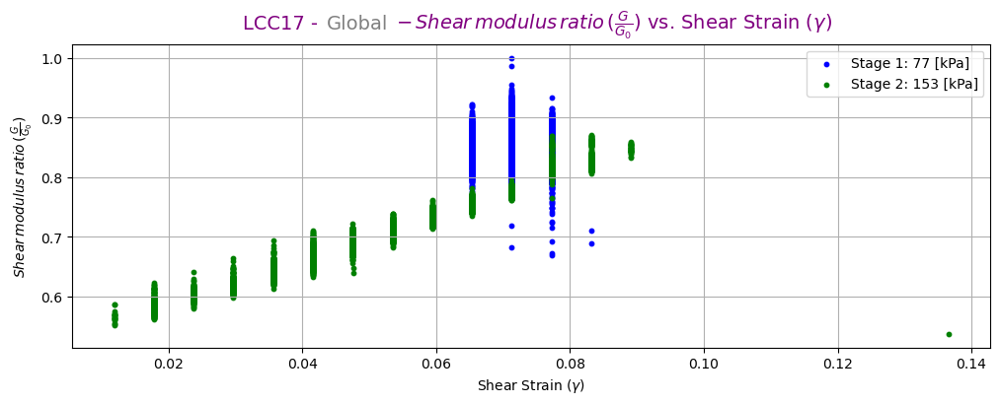

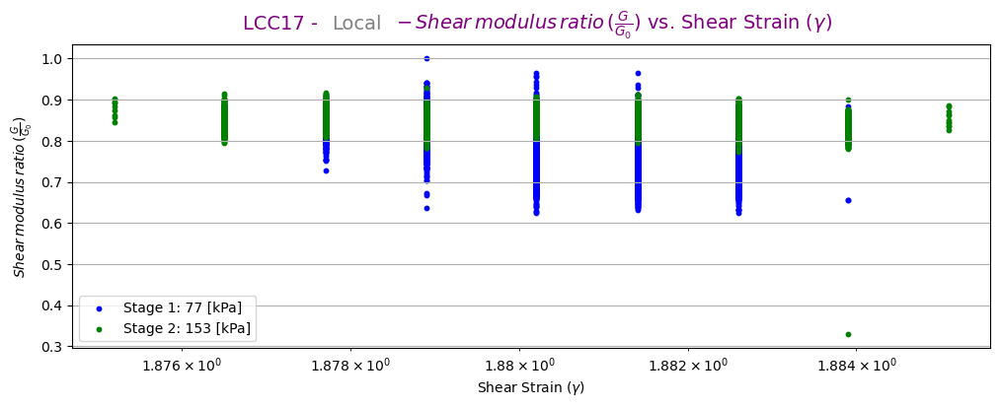

In [21]:

window_size = 100
# G/G0  global
Gmax_LCC17_G_1 = np.max(cycle_info_LCC17_G_1['Shear_modulus_(MPa)'])
Gmax_LCC17_G_2 = np.max(cycle_info_LCC17_G_2['Shear_modulus_(MPa)'])
Gmax_LCC17_G = np.max(cycle_info_LCC17_G['Shear_modulus_(MPa)'])
Gmax_LCC17_L_1 = np.max(cycle_info_LCC17_L_1['Shear_modulus_(MPa)'])
Gmax_LCC17_L_2 = np.max(cycle_info_LCC17_L_2['Shear_modulus_(MPa)'])
Gmax_LCC17_L = np.max(cycle_info_LCC17_L['Shear_modulus_(MPa)'])

x_values_G_1 = unp.nominal_values(cycle_info_LCC17_G_1['Shear Strain'])
x_values_G_2 = unp.nominal_values(cycle_info_LCC17_G_2['Shear Strain'])
y_values_G_1 = cycle_info_LCC17_G_1['Shear_modulus_(MPa)'] / Gmax_LCC17_G
y_values_G_2 = cycle_info_LCC17_G_2['Shear_modulus_(MPa)'] / Gmax_LCC17_G

y_series_G_1 = pd.Series(y_values_G_1)
y_series_G_2 = pd.Series(y_values_G_2)
moving_avg_G_1 = y_series_G_1.rolling(150).mean()
moving_avg_G_2 = y_series_G_2.rolling(150).mean()

qcyc_LCC17_1 = unp.nominal_values(Stage_info_LCC17.loc[0]['qcyc'])
qcyc_LCC17_2 = unp.nominal_values(Stage_info_LCC17.loc[1]['qcyc'])
x_values_L_1 = unp.nominal_values(cycle_info_LCC17_L_1['Shear Strain'])
x_values_L_2 = unp.nominal_values(cycle_info_LCC17_L_2['Shear Strain'])
y_values_L_1 = cycle_info_LCC17_L_1['Shear_modulus_(MPa)'] / Gmax_LCC17_L
y_values_L_2 = cycle_info_LCC17_L_2['Shear_modulus_(MPa)'] / Gmax_LCC17_L
y_series_L_1 = pd.Series(y_values_L_1)
y_series_L_2 = pd.Series(y_values_L_2)
moving_avg_L_1 = y_series_L_1.rolling(100).mean()
moving_avg_L_2 = y_series_L_2.rolling(100).mean()



plt.figure(figsize=(12, 4)) 
plt.scatter(x_values_G_1, y_values_G_1, color='blue', label=f'Stage 1: {qcyc_LCC17_1:.0f} [kPa]' , s = 10 ) 
plt.scatter(x_values_G_2, y_values_G_2, color='green', label=f'Stage 2: {qcyc_LCC17_2:.0f} [kPa]', s = 10 ) 
#plt.plot(x_values_G_1, moving_avg_G_1, color='orange', label='Moving Average')
#plt.plot(x_values_G_2, moving_avg_G_2, color='orange')
#plt.ylim([200, 350])

plt.legend(loc='upper right')
plt.xlabel(r'Shear Strain $\gamma$ %')
plt.ylabel(r'$Shear\, modulus\, ratio\,(\frac{G}{G_0}$)')
plt.xlabel(r'Shear Strain ($\gamma$)')
plt.text(0.23, 1.05, 'LCC17 - ', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.31, 1.05, 'Global', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.59, 1.05, r'$-\,Shear\, modulus\, ratio\,(\frac{G}{G_0}$) vs. Shear Strain ($\gamma$)', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()


plt.figure(figsize=(12, 4)) 
plt.scatter(x_values_L_1, y_values_L_1, color='blue', label=f'Stage 1: {qcyc_LCC17_1:.0f} [kPa]', s =10)
plt.scatter(x_values_L_2, y_values_L_2, color='green', label=f'Stage 2: {qcyc_LCC17_2:.0f} [kPa]', s = 10)
#plt.plot(x_values_L_1, moving_avg_L_1, color='orange', label='Moving Average')
#plt.plot(x_values_L_2, moving_avg_L_2, color='orange')
#plt.ylim([750, 3500])
plt.xscale('log')

plt.legend(loc='lower left')
plt.xlabel(r'Shear Strain $\gamma$ %')
plt.ylabel(r'$Shear\, modulus\, ratio\,(\frac{G}{G_0}$)')
plt.xlabel(r'Shear Strain ($\gamma$)')
plt.text(0.23, 1.05, 'LCC17 - ', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.31, 1.05, 'Local', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.59, 1.05, r'$-\,Shear\, modulus\, ratio\,(\frac{G}{G_0}$) vs. Shear Strain ($\gamma$)', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()


## PWP $\Delta \text{{u}}$

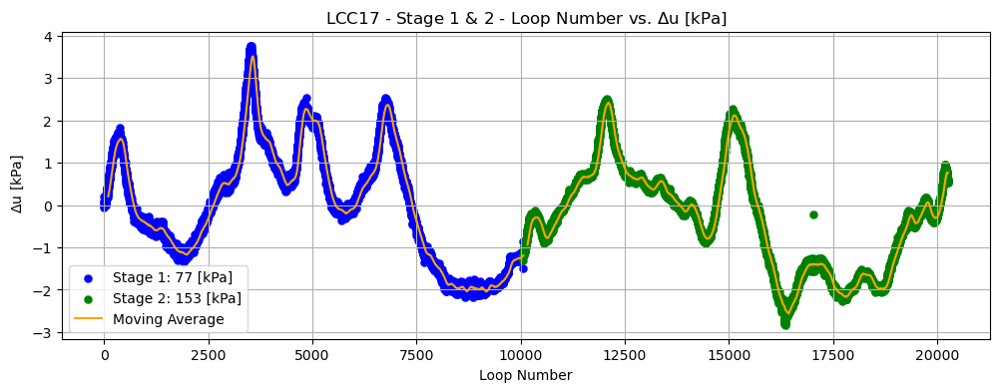

In [22]:
window_size = 100
x_values_G_1 = cycle_info_LCC17_G_1['Loop_Number']
x_values_G_2 = cycle_info_LCC17_G_2['Loop_Number']
y_values_G_1 = unp.nominal_values(cycle_info_LCC17_G_1['delta_pwp'])
y_values_G_2 = unp.nominal_values(cycle_info_LCC17_G_2['delta_pwp'])
y_series_G_1 = pd.Series(y_values_G_1)
y_series_G_2 = pd.Series(y_values_G_2)
moving_avg_G_1 = y_series_G_1.rolling(100).mean()
moving_avg_G_2 = y_series_G_2.rolling(100).mean()



plt.figure(figsize=(12, 4)) 
plt.scatter(x_values_G_1, y_values_G_1, color='blue', label=f'Stage 1: {qcyc_LCC17_1:.0f} [kPa]', linewidth=0.1)
plt.scatter(x_values_G_2, y_values_G_2, color='green', label=f'Stage 2: {qcyc_LCC17_2:.0f} [kPa]', linewidth=0.1)
plt.plot(x_values_G_1, moving_avg_G_1, color='orange', label='Moving Average')
plt.plot(x_values_G_2, moving_avg_G_2, color='orange')
plt.legend(loc='lower left')
plt.xlabel(r'Loop Number')
plt.ylabel(r' $\Delta$u [kPa]')
plt.title(r'LCC17 - Stage 1 & 2 - Loop Number vs. $\Delta$u [kPa]')
plt.grid(True)
plt.show()


# NC04

## Reading the data with its cycles

In [25]:
# To read the CSV file and identify each cycle separately, you can use:                                   
Path_df_NC04_new = os.path.join('Outputs_csv', 'df_NC04_new.csv')
df_NC04_new = pd.read_csv(Path_df_NC04_new)
df_NC04_new = convert_uncertainty_columns(df_NC04_new)

cycles_NC04 = {}
for cycle_nr in df_NC04_new['Cycle nr'].unique():
    cycles_NC04[cycle_nr] = df_NC04_new[df_NC04_new['Cycle nr'] == cycle_nr]

Path_cycle_info_NC04_G = os.path.join('Outputs_csv', 'cycle_info_NC04_G.csv')
cycle_info_NC04_G = pd.read_csv(Path_cycle_info_NC04_G)
cycle_info_NC04_G = convert_uncertainty_columns(cycle_info_NC04_G)


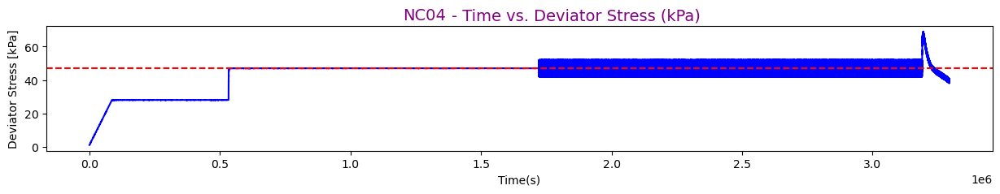

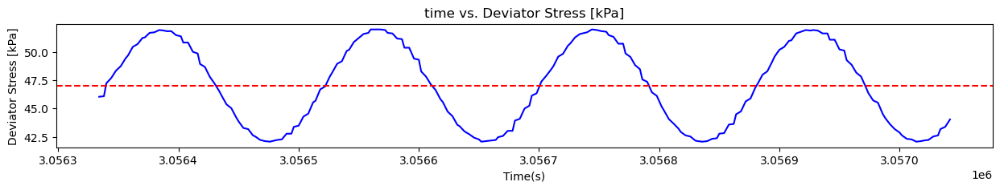

In [26]:
X1 = 1200  #216600  #1000 
X2 = 1400  #216900  #1200
mean_val_NC04 = np.mean(df_NC04_new.loc[28886:439829,'Deviator Stress (kPa)']) 
plt.figure(figsize=(15, 2)) 
plt.plot(df_NC04_new['Time since start of test (s)'], df_NC04_new['Deviator Stress (kPa)'], color='b')        # Deviator Stress (kPa)
plt.xlabel("Time(s)")
plt.ylabel("Deviator Stress [kPa]")
#plt.title('time vs. Deviator Stress (kPa)')
plt.axhline(y=mean_val_NC04, color='r', linestyle='--', label='Mean Value')
plt.text(0.40, 1.05, 'NC04', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.56, 1.05, '- Time vs. Deviator Stress (kPa)', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.show()


X1 = 402400  #502495  #1000 
X2 = 402600 #502502  #1200 
mean_val_NC04 = np.mean(df_NC04_new.loc[28886:439829,'Deviator Stress (kPa)']) 
plt.figure(figsize=(15, 2)) 
plt.plot(df_NC04_new.loc[X1:X2, 'Time since start of test (s)'], df_NC04_new.loc[X1:X2,'Deviator Stress (kPa)'], color='b')        # Deviator Stress (kPa)
plt.xlabel("Time(s)")
plt.ylabel("Deviator Stress [kPa]")
plt.title('time vs. Deviator Stress [kPa]')
plt.axhline(y=mean_val_NC04, color='r', linestyle='--', label='Mean Value')
plt.show()

## Stage info 

In [27]:
Path_Stage_info_NC04 = os.path.join('Outputs_csv', 'Stage_info_NC04.csv')
Stage_info_NC04 = pd.read_csv(Path_Stage_info_NC04)
Stage_info_NC04 = convert_uncertainty_columns(Stage_info_NC04)

qcyc_NC04 = unp.nominal_values(Stage_info_NC04.loc[0]['qcyc'])

Stage_info_NC04

,Sample type,Stage Number,Start index,End index,Rows nr,Star time,End time,Test duration(d),Cyclic loading duration(d),Cycles nr,...,q_m,q_p,q_min,q_max,q_avg,qcyc,qcyc/p0,CSR,qc/2Su,qm/2Su
0,NC04,1,28885,439870,410986,1722356,3189337,38.12088,16.978947,8148,...,47.0+/-1.1,19.0+/-1.5,42.050+/-0.012,51.978+/-0.012,47.0135+/-0.0017,4.964+/-0.008,0.0922+/-0.0013,0.03761+/-0.00006,0.07521+/-0.00013,0.712+/-0.016


## Axial Stress & Axial Strain

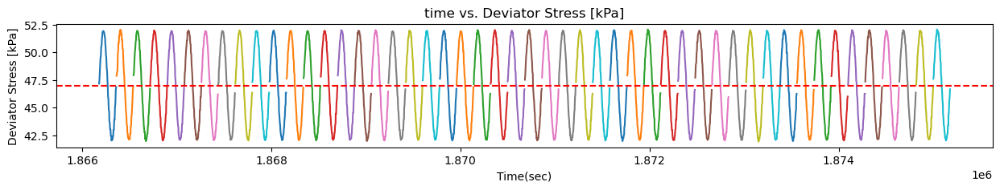

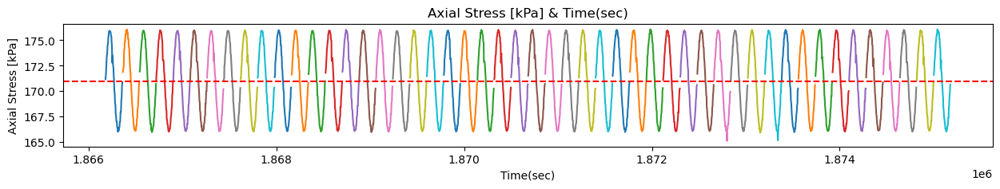

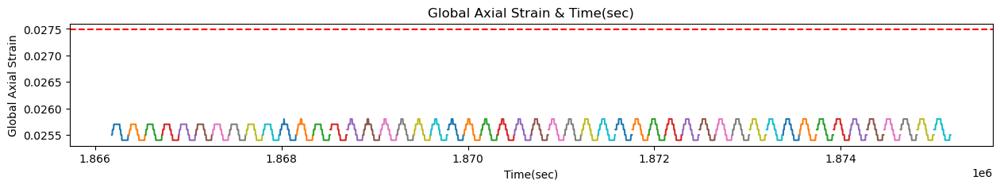

In [28]:
# The data for fitting
#['Local Axial 2 (mm)']
time = df_NC04_new.loc[: ,'Time since start of test (s)']
stress = df_NC04_new.loc[: ,'Axial Stress (kPa)']
global_strain = df_NC04_new.loc[: ,'Global Axial Strain'] 

###### Plot the data for several loops ################################# 236899
X1 = 800
X2 = 850

loop_indices = list(range(X1, X2)) 


plt.figure(figsize=(15, 2))

for i in loop_indices:
    if i < len(cycles_NC04):
      time_values = cycles_NC04[i]['Time since start of test (s)']
      stress_values = cycles_NC04[i]['Deviator Stress (kPa)']
      plt.plot(time_values, stress_values)

plt.xlabel("Time(sec)")
plt.ylabel('Deviator Stress [kPa]')
plt.title('time vs. Deviator Stress [kPa]')
plt.axhline(y=mean_val_NC04, color='r', linestyle='--', label='Mean Value')
plt.show()


plt.figure(figsize=(15, 2))
for i in loop_indices:
    if i < len(cycles_NC04):
      time = cycles_NC04[i]['Time since start of test (s)']
      stress = cycles_NC04[i]['Axial Stress (kPa)']
      plt.plot(time, stress)
      
plt.xlabel("Time(sec)")
plt.ylabel('Axial Stress [kPa]')
plt.title('Axial Stress [kPa] & Time(sec)')
plt.axhline(y=np.mean(df_NC04_new.loc[28886:439829,'Axial Stress (kPa)']), color='r', linestyle='--', label='Mean Value')
plt.show()  



plt.figure(figsize=(15, 2))
for i in loop_indices:
    if i < len(cycles_NC04):
      time = cycles_NC04[i]['Time since start of test (s)']
      global_strain = cycles_NC04[i]['Global Axial Strain']
      plt.plot(time, global_strain)
      
plt.xlabel("Time(sec)")
plt.ylabel('Global Axial Strain')
plt.title('Global Axial Strain & Time(sec)')
plt.axhline(y=np.mean(df_NC04_new.loc[28886:439829,'Global Axial Strain']), color='r', linestyle='--', label='Mean Value')
plt.show()    


##  Damping Ratio

<Figure size 1200x400 with 0 Axes>

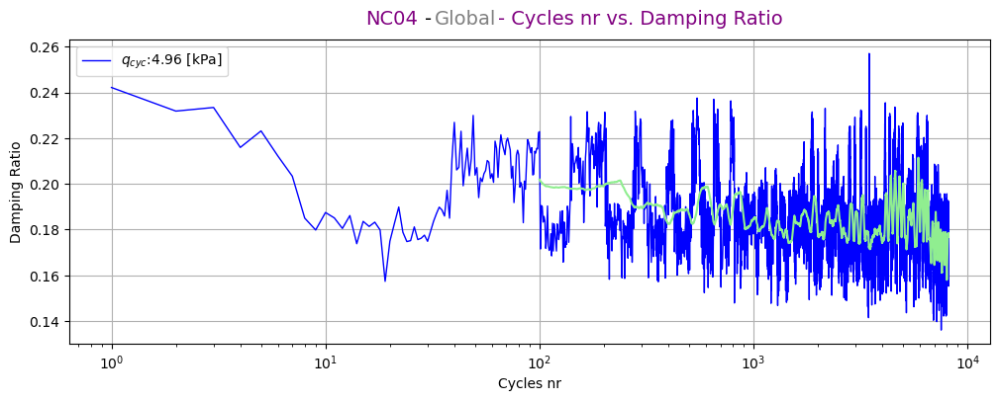

In [29]:

plt.figure(figsize=(12, 4)) 

x_values_G = cycle_info_NC04_G['Loop_Number']
y_values_G = unp.nominal_values(cycle_info_NC04_G['Damping_ratio'])
y_series_G = pd.Series(y_values_G)
moving_avg_G = y_series_G.rolling(100).mean()

plt.figure(figsize=(12, 4)) 
plt.plot(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC04:.2f} [kPa]', linewidth=1)
plt.plot(x_values_G, moving_avg_G, color='lightgreen') #, label='Moving Average')

plt.legend(loc='upper left')
plt.xscale('log')
plt.xlabel("Cycles nr")
plt.ylabel("Damping Ratio")
plt.text(0.35, 1.05, 'NC04', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.39, 1.05, '-', fontsize=14, color='black', ha='center', transform=plt.gca().transAxes)
plt.text(0.43, 1.05, 'Global', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.62, 1.05, '- Cycles nr vs. Damping Ratio', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()


## Secant Stiffness E & Time

<Figure size 1200x400 with 0 Axes>

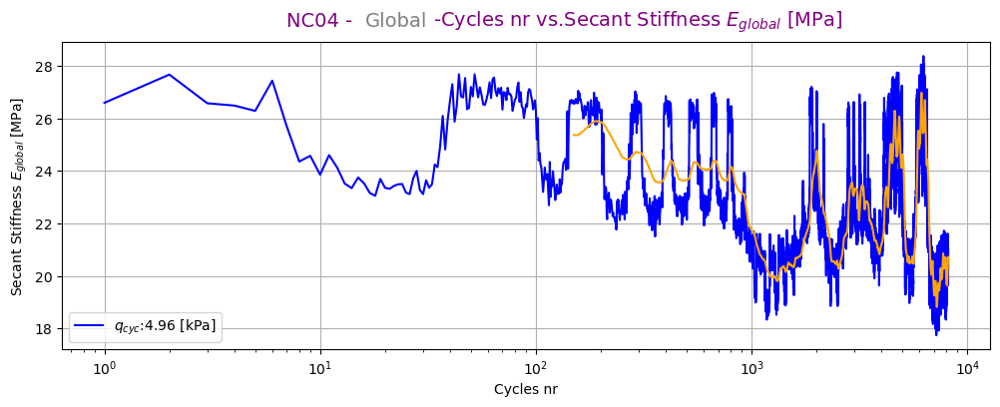

In [30]:
plt.figure(figsize=(12, 4)) 
window_size = 100
x_values_G = cycle_info_NC04_G['Loop_Number']
y_values_G = cycle_info_NC04_G['E(MPa)']
y_series_G = pd.Series(y_values_G)
moving_avg_G = y_series_G.rolling(150).mean()

plt.figure(figsize=(12, 4)) 
plt.plot(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC04:.2f} [kPa]')
plt.plot(x_values_G, moving_avg_G, color='orange')#, label='Moving Average')
#plt.ylim([200, 350])
plt.xscale('log')
plt.legend(loc='lower left')
plt.xlabel("Cycles nr")
plt.ylabel("Secant Stiffness $E_{global}$ [MPa]")
plt.text(0.28, 1.05, 'NC04 - ', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.36, 1.05, 'Global', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.62, 1.05, '-Cycles nr vs.Secant Stiffness $E_{global}$ [MPa]', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()


## Shear Modulus G

<Figure size 1200x400 with 0 Axes>

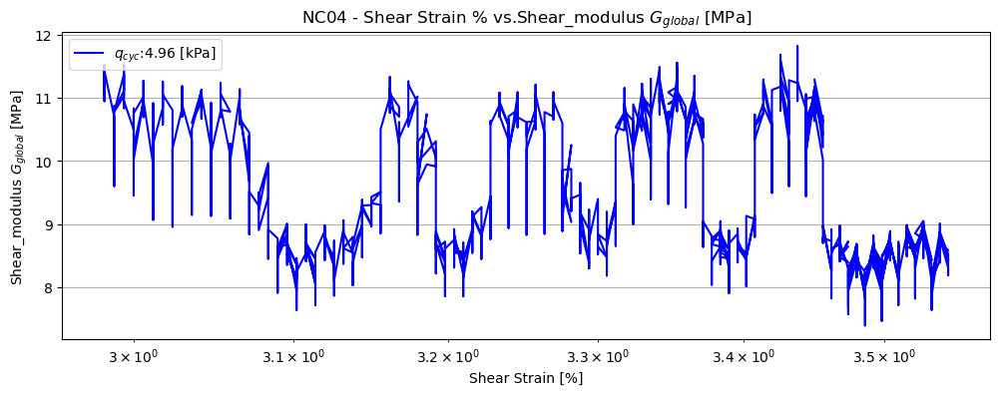

In [31]:
plt.figure(figsize=(12, 4)) 
window_size = 100
x_values_G = unp.nominal_values(cycle_info_NC04_G['Shear Strain'])
y_values_G = unp.nominal_values(cycle_info_NC04_G['Shear_modulus_(MPa)'])
y_series_G = pd.Series(y_values_G)
moving_avg_G_1 = y_series_G.rolling(150).mean()


plt.figure(figsize=(12, 4)) 
plt.plot(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC04:.2f} [kPa]')
#plt.plot(x_values_G_1, moving_avg_G_1, color='orange', label='Moving Average')
#plt.plot(x_values_G_2, moving_avg_G_2, color='orange')
#plt.ylim([200, 350])
plt.legend(loc='upper left')
plt.xscale('log')
plt.xlabel("Shear Strain [%]")
plt.ylabel("Shear_modulus $G_{global}$ [MPa]")
plt.title('NC04 - Shear Strain % vs.Shear_modulus $G_{global}$ [MPa]')
plt.grid(True)
plt.show()


## G/G0

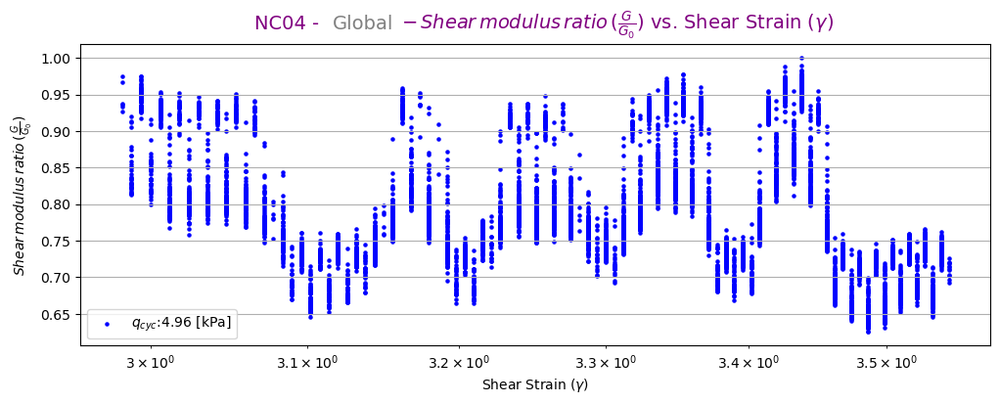

In [32]:

window_size = 100
# G/G0  global
Gmax_NC04_G = np.max(cycle_info_NC04_G['Shear_modulus_(MPa)'])

x_values_G = unp.nominal_values(cycle_info_NC04_G['Shear Strain'])
y_values_G = unp.nominal_values(cycle_info_NC04_G['Shear_modulus_(MPa)']) / unp.nominal_values(Gmax_NC04_G)

y_series_G_1 = pd.Series(y_values_G)
moving_avg_G_1 = y_series_G_1.rolling(150).mean()



plt.figure(figsize=(12, 4)) 
plt.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC04:.2f} [kPa]', s = 5)
#plt.plot(x_values_G_1, moving_avg_G_1, color='orange', label='Moving Average')
#plt.plot(x_values_G_2, moving_avg_G_2, color='orange')
#plt.ylim([200, 350])
plt.xscale('log')

plt.legend(loc='lower left')
plt.xlabel(r'Shear Strain $\gamma$ %')
plt.ylabel(r'$Shear\, modulus\, ratio\,(\frac{G}{G_0}$)')
plt.xlabel(r'Shear Strain ($\gamma$)')
plt.text(0.23, 1.05, 'NC04 - ', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.31, 1.05, 'Global', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.59, 1.05, r'$-\,Shear\, modulus\, ratio\,(\frac{G}{G_0}$) vs. Shear Strain ($\gamma$)', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()



## PWP $\Delta \text{{u}}$

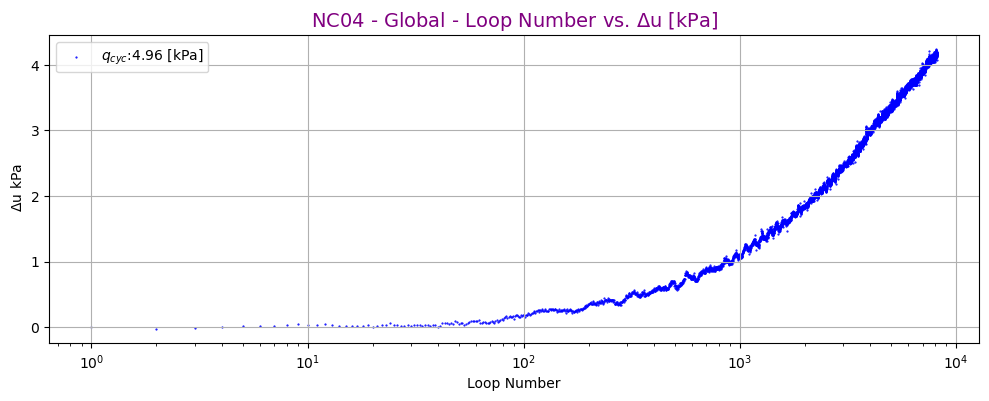

In [33]:
window_size = 10
x_values_G = cycle_info_NC04_G['Loop_Number']
y_values_G = unp.nominal_values(cycle_info_NC04_G['delta_pwp'])
y_series_G = pd.Series(y_values_G)
moving_avg_G = y_series_G_1.rolling(100).mean()


plt.figure(figsize=(12, 4)) 
plt.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC04:.2f} [kPa]', s = 0.3)
#plt.plot(x_values_G, moving_avg_G, color='orange')
plt.legend(loc='upper left')
plt.xscale('log')
plt.xlabel(r'Loop Number')
plt.ylabel(r' $\Delta$u kPa')
plt.title(r'NC04 - Global - Loop Number vs. $\Delta$u [kPa]', fontsize=14, color='purple')
plt.grid(True)
plt.show()


# NC05

## Reading the data with its cycles

In [36]:
# To read the CSV file and identify each cycle separately, you can use:                                   
Path_df_NC05_new = os.path.join('Outputs_csv', 'df_NC05_new.csv')
df_NC05_new = pd.read_csv(Path_df_NC05_new)
df_NC05_new = convert_uncertainty_columns(df_NC05_new)

cycles_NC05 = {}
for cycle_nr in df_NC05_new['Cycle nr'].unique():
    cycles_NC05[cycle_nr] = df_NC05_new[df_NC05_new['Cycle nr'] == cycle_nr]

Path_cycle_info_NC05_G = os.path.join('Outputs_csv', 'cycle_info_NC05_G.csv')
cycle_info_NC05_G = pd.read_csv(Path_cycle_info_NC05_G)
cycle_info_NC05_G = convert_uncertainty_columns(cycle_info_NC05_G)


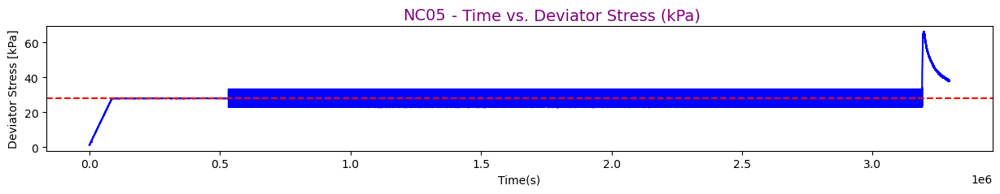

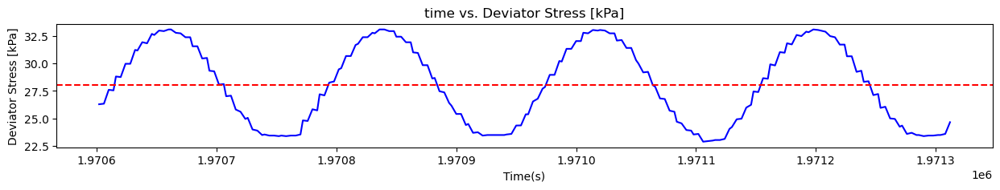

In [37]:
X1 = 1200  #216600  #1000 
X2 = 1400  #216900  #1200
mean_val_NC05 = np.mean(df_NC05_new.loc[28886:439829,'Deviator Stress (kPa)']) 
plt.figure(figsize=(15, 2)) 
plt.plot(df_NC05_new['Time since start of test (s)'], df_NC05_new['Deviator Stress (kPa)'], color='b')        # Deviator Stress (kPa)
plt.xlabel("Time(s)")
plt.ylabel("Deviator Stress [kPa]")
#plt.title('time vs. Deviator Stress (kPa)')
plt.axhline(y=mean_val_NC05, color='r', linestyle='--', label='Mean Value')
plt.text(0.40, 1.05, 'NC05', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.56, 1.05, '- Time vs. Deviator Stress (kPa)', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.show()

X1 = 402400  #502495  #1000 
X2 = 402600 #502502  #1200 
mean_val_NC05 = np.mean(df_NC05_new.loc[28886:439829,'Deviator Stress (kPa)']) 
plt.figure(figsize=(15, 2)) 
plt.plot(df_NC05_new.loc[X1:X2, 'Time since start of test (s)'], df_NC05_new.loc[X1:X2,'Deviator Stress (kPa)'], color='b')        # Deviator Stress (kPa)
plt.xlabel("Time(s)")
plt.ylabel("Deviator Stress [kPa]")
plt.title('time vs. Deviator Stress [kPa]')
plt.axhline(y=mean_val_NC05, color='r', linestyle='--', label='Mean Value')
plt.show()

## Stage info 

In [38]:
Path_Stage_info_NC05 = os.path.join('Outputs_csv', 'Stage_info_NC05.csv')
Stage_info_NC05 = pd.read_csv(Path_Stage_info_NC05)
Stage_info_NC05 = convert_uncertainty_columns(Stage_info_NC05)

qcyc_NC05 = unp.nominal_values(Stage_info_NC05.loc[0]['qcyc'])

Stage_info_NC05

,Sample type,Stage Number,Start index,End index,Rows nr,Star time,End time,Test duration(d),Cyclic loading duration(d),Cycles nr,...,q_m,q_p,q_min,q_max,q_avg,qcyc,qcyc/p0,CSR,qc/2Su,qm/2Su
0,NC05,1,8883,744042,735160,532920,3189195,38.120995,30.743924,14755,...,28.0+/-1.1,0,23.196+/-0.009,33.055+/-0.009,28.0671+/-0.0012,4.929+/-0.006,0.0995+/-0.0015,0.03734+/-0.00005,0.07469+/-0.00009,0.425+/-0.016


## Axial Stress & Axial Strain

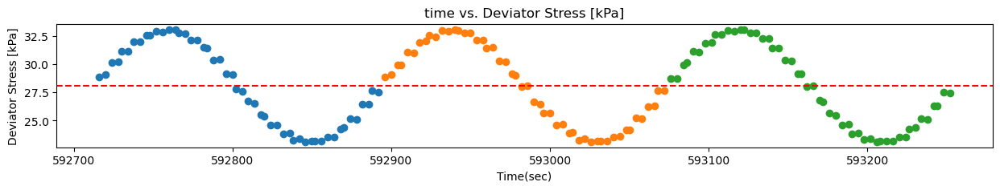

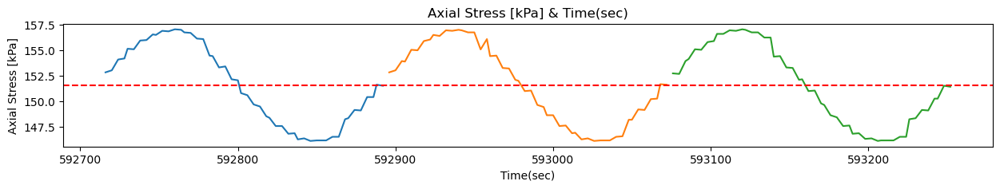

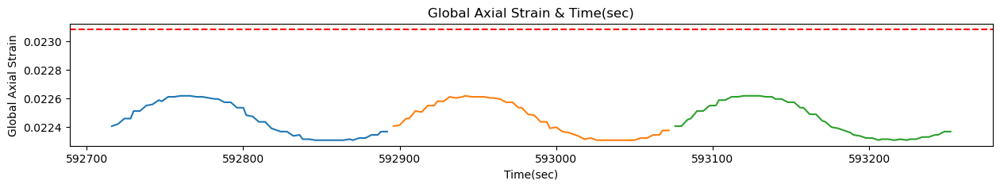

In [39]:
# The data for fitting
#['Local Axial 2 (mm)']
time = df_NC05_new.loc[: ,'Time since start of test (s)']
stress = df_NC05_new.loc[: ,'Axial Stress (kPa)']
global_strain = df_NC05_new.loc[: ,'Global Axial Strain'] 

###### Plot the data for several loops ################################# 236899
X1 =333 #10000
X2 =336 #10030

loop_indices = list(range(X1, X2)) 


plt.figure(figsize=(15, 2))

for i in loop_indices:
    if i < len(cycles_NC05):
      time_values = cycles_NC05[i]['Time since start of test (s)']
      stress_values = cycles_NC05[i]['Deviator Stress (kPa)']
      plt.scatter(time_values, stress_values)

plt.xlabel("Time(sec)")
plt.ylabel('Deviator Stress [kPa]')
plt.title('time vs. Deviator Stress [kPa]')
plt.axhline(y=mean_val_NC05, color='r', linestyle='--', label='Mean Value')
plt.show()


plt.figure(figsize=(15, 2))
for i in loop_indices:
    if i < len(cycles_NC05):
      time = cycles_NC05[i]['Time since start of test (s)']
      stress = cycles_NC05[i]['Axial Stress (kPa)']
      plt.plot(time, stress)
      
plt.xlabel("Time(sec)")
plt.ylabel('Axial Stress [kPa]')
plt.title('Axial Stress [kPa] & Time(sec)')
plt.axhline(y=np.mean(df_NC05_new.loc[28886:439829,'Axial Stress (kPa)']), color='r', linestyle='--', label='Mean Value')
plt.show()  



plt.figure(figsize=(15, 2))
for i in loop_indices:
    if i < len(cycles_NC05):
      time = cycles_NC05[i]['Time since start of test (s)']
      global_strain = cycles_NC05[i]['Global Axial Strain']
      plt.plot(time, global_strain)
      
plt.xlabel("Time(sec)")
plt.ylabel('Global Axial Strain')
plt.title('Global Axial Strain & Time(sec)')
plt.axhline(y=np.mean(df_NC05_new.loc[28886:439829,'Global Axial Strain']), color='r', linestyle='--', label='Mean Value')
plt.show()    






##  Damping Ratio

<Figure size 1200x400 with 0 Axes>

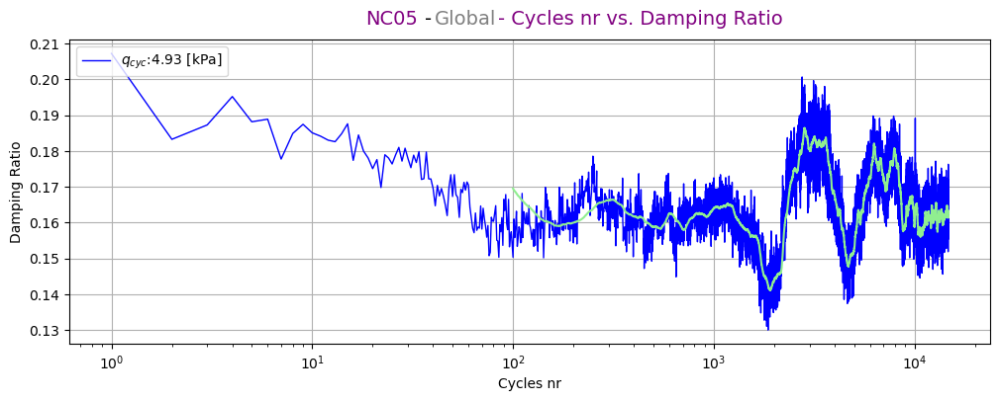

In [40]:

plt.figure(figsize=(12, 4)) 

x_values_G = cycle_info_NC05_G['Loop_Number']
y_values_G = unp.nominal_values(cycle_info_NC05_G['Damping_ratio'])
y_series_G = pd.Series(y_values_G)
moving_avg_G = y_series_G.rolling(100).mean()

plt.figure(figsize=(12, 4)) 
plt.plot(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC05:.2f} [kPa]', linewidth=1)
plt.plot(x_values_G, moving_avg_G, color='lightgreen') #, label='Moving Average')

plt.legend(loc='upper left')
plt.xscale('log')
plt.xlabel("Cycles nr")
plt.ylabel("Damping Ratio")
plt.text(0.35, 1.05, 'NC05', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.39, 1.05, '-', fontsize=14, color='black', ha='center', transform=plt.gca().transAxes)
plt.text(0.43, 1.05, 'Global', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.62, 1.05, '- Cycles nr vs. Damping Ratio', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()

## Secant Stiffness E & Time

<Figure size 1200x400 with 0 Axes>

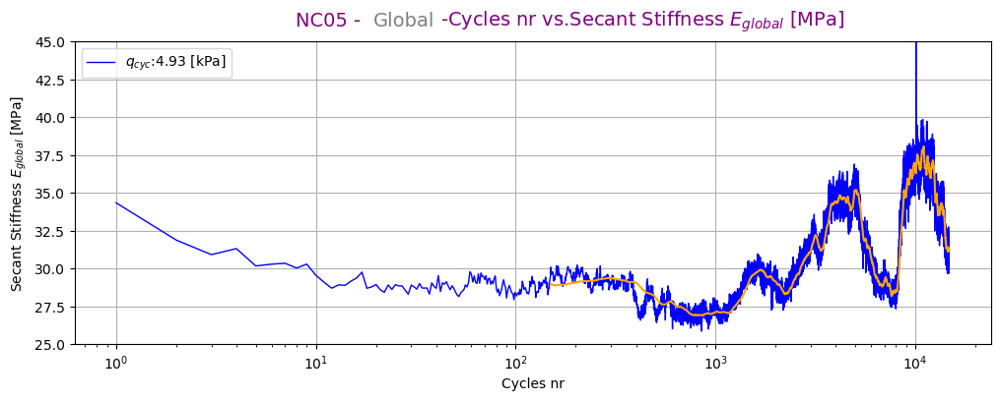

In [41]:
plt.figure(figsize=(12, 4)) 
window_size = 100
x_values_G = cycle_info_NC05_G['Loop_Number']
y_values_G = cycle_info_NC05_G['E(MPa)']
y_series_G = pd.Series(y_values_G)
moving_avg_G = y_series_G.rolling(150).mean()

plt.figure(figsize=(12, 4)) 
plt.plot(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC05:.2f} [kPa]', linewidth=1)
plt.plot(x_values_G, moving_avg_G, color='orange')#, label='Moving Average')
plt.ylim([25, 45])
plt.xscale('log')
plt.legend(loc='upper left')
plt.xlabel("Cycles nr")
plt.ylabel("Secant Stiffness $E_{global}$ [MPa]")
plt.text(0.28, 1.05, 'NC05 - ', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.36, 1.05, 'Global', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.62, 1.05, '-Cycles nr vs.Secant Stiffness $E_{global}$ [MPa]', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()

## Shear Modulus G

<Figure size 1200x400 with 0 Axes>

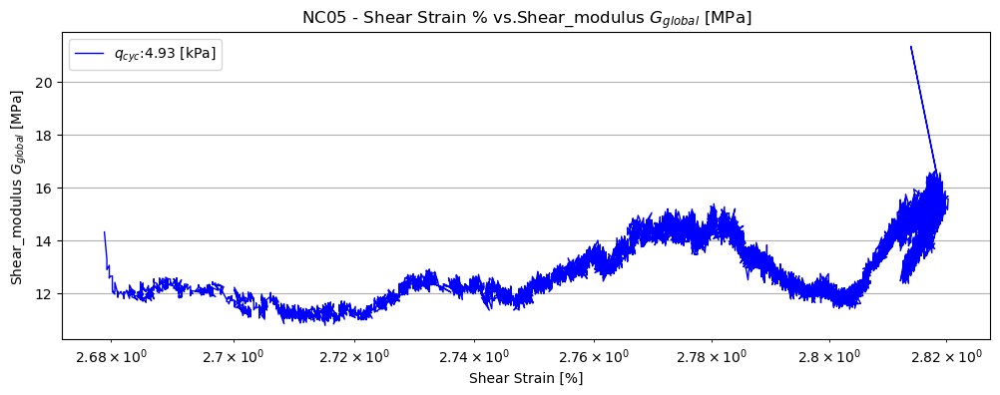

In [42]:
plt.figure(figsize=(12, 4)) 
window_size = 100
x_values_G = unp.nominal_values(cycle_info_NC05_G['Shear Strain'])
y_values_G = unp.nominal_values(cycle_info_NC05_G['Shear_modulus_(MPa)'])
y_series_G = pd.Series(y_values_G)
moving_avg_G_1 = y_series_G.rolling(150).mean()


plt.figure(figsize=(12, 4)) 
plt.plot(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC05:.2f} [kPa]', linewidth=1)
#plt.plot(x_values_G_1, moving_avg_G_1, color='orange', label='Moving Average')
#plt.plot(x_values_G_2, moving_avg_G_2, color='orange')
#plt.ylim([200, 350])
plt.legend(loc='upper left')
plt.xscale('log')
plt.xlabel("Shear Strain [%]")
plt.ylabel("Shear_modulus $G_{global}$ [MPa]")
plt.title('NC05 - Shear Strain % vs.Shear_modulus $G_{global}$ [MPa]')
plt.grid(True)
plt.show()


## G/G0

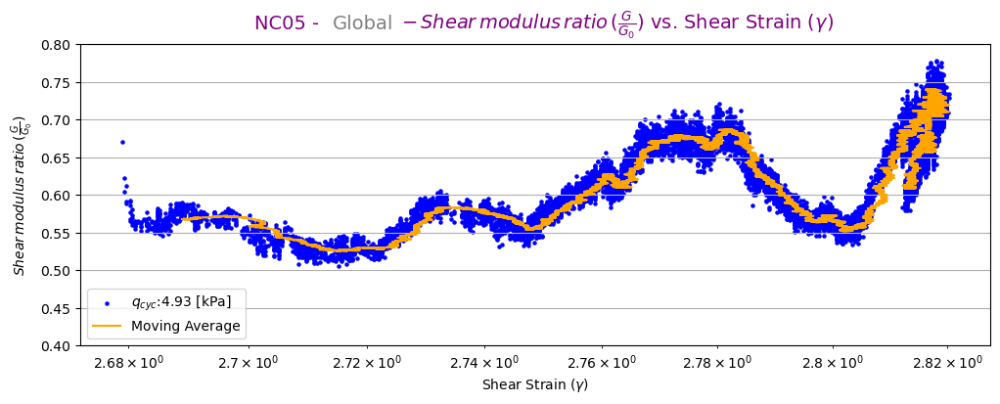

In [43]:

window_size = 100
# G/G0  global
Gmax_NC05_G = np.max(cycle_info_NC05_G['Shear_modulus_(MPa)'])

x_values_G = unp.nominal_values(cycle_info_NC05_G['Shear Strain'])
y_values_G = unp.nominal_values(cycle_info_NC05_G['Shear_modulus_(MPa)']) / unp.nominal_values(Gmax_NC05_G)

y_series_G = pd.Series(y_values_G)
moving_avg_G = y_series_G.rolling(200).mean()



plt.figure(figsize=(12, 4)) 
plt.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC05:.2f} [kPa]', s=5)
plt.plot(x_values_G, moving_avg_G, color='orange', label='Moving Average')

plt.ylim([0.4, 0.8])
plt.xscale('log')
plt.legend(loc='lower left')
plt.xlabel(r'Shear Strain $\gamma$ %')
plt.ylabel(r'$Shear\, modulus\, ratio\,(\frac{G}{G_0}$)')
plt.xlabel(r'Shear Strain ($\gamma$)')
plt.text(0.23, 1.05, 'NC05 - ', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.31, 1.05, 'Global', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.59, 1.05, r'$-\,Shear\, modulus\, ratio\,(\frac{G}{G_0}$) vs. Shear Strain ($\gamma$)', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()


## PWP $\Delta \text{{u}}$

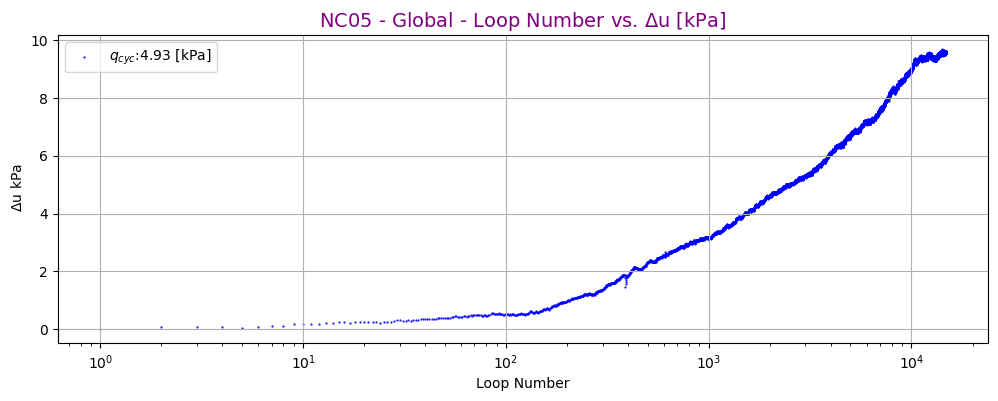

In [44]:
window_size = 10
x_values_G = cycle_info_NC05_G['Loop_Number']
y_values_G = unp.nominal_values(cycle_info_NC05_G['delta_pwp'])
y_series_G = pd.Series(y_values_G)
moving_avg_G = y_series_G_1.rolling(100).mean()


plt.figure(figsize=(12, 4)) 
plt.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC05:.2f} [kPa]', s=0.3)
#plt.plot(x_values_G, moving_avg_G, color='orange')
plt.legend(loc='upper left')
plt.xscale('log')
plt.xlabel(r'Loop Number')
plt.ylabel(r' $\Delta$u kPa')
plt.title(r'NC05 - Global - Loop Number vs. $\Delta$u [kPa]', fontsize=14, color='purple')
plt.grid(True)
plt.show()


# NC06

## Reading the data with its cycles

In [47]:
# To read the CSV file and identify each cycle separately, you can use:                                   
Path_df_NC06_new = os.path.join('Outputs_csv', 'df_NC06_new.csv')
df_NC06_new = pd.read_csv(Path_df_NC06_new)
df_NC06_new = convert_uncertainty_columns(df_NC06_new)

cycles_NC06 = {}
for cycle_nr in df_NC06_new['Cycle nr'].unique():
    cycles_NC06[cycle_nr] = df_NC06_new[df_NC06_new['Cycle nr'] == cycle_nr]

Path_cycle_info_NC06_G = os.path.join('Outputs_csv', 'cycle_info_NC06_G.csv')
cycle_info_NC06_G = pd.read_csv(Path_cycle_info_NC06_G)
cycle_info_NC06_G = convert_uncertainty_columns(cycle_info_NC06_G)


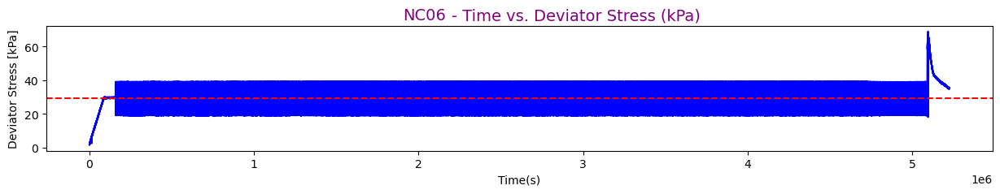

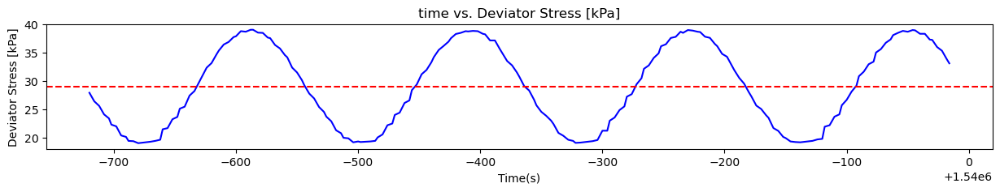

In [48]:
X1 = 1200  #216600  #1000 
X2 = 1400  #216900  #1200
mean_val_NC06 = np.mean(df_NC06_new.loc[28886:439829,'Deviator Stress (kPa)']) 
plt.figure(figsize=(15, 2)) 
plt.plot(df_NC06_new['Time since start of test (s)'], df_NC06_new['Deviator Stress (kPa)'], color='b')        # Deviator Stress (kPa)
plt.xlabel("Time(s)")
plt.ylabel("Deviator Stress [kPa]")
#plt.title('time vs. Deviator Stress (kPa)')
plt.axhline(y=mean_val_NC06, color='r', linestyle='--', label='Mean Value')
plt.text(0.40, 1.05, 'NC06', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.56, 1.05, '- Time vs. Deviator Stress (kPa)', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.show()

X1 = 402400  #502495  #1000 
X2 = 402600 #502502  #1200 
mean_val_NC06 = np.mean(df_NC06_new.loc[28886:439829,'Deviator Stress (kPa)']) 
plt.figure(figsize=(15, 2)) 
plt.plot(df_NC06_new.loc[X1:X2, 'Time since start of test (s)'], df_NC06_new.loc[X1:X2,'Deviator Stress (kPa)'], color='b')        # Deviator Stress (kPa)
plt.xlabel("Time(s)")
plt.ylabel("Deviator Stress [kPa]")
plt.title('time vs. Deviator Stress [kPa]')
plt.axhline(y=mean_val_NC06, color='r', linestyle='--', label='Mean Value')
plt.show()

## Stage info 

In [49]:
Path_Stage_info_NC06 = os.path.join('Outputs_csv', 'Stage_info_NC06.csv')
Stage_info_NC06 = pd.read_csv(Path_Stage_info_NC06)
Stage_info_NC06 = convert_uncertainty_columns(Stage_info_NC06)

qcyc_NC06 = unp.nominal_values(Stage_info_NC06.loc[0]['qcyc'])

Stage_info_NC06

,Sample type,Stage Number,Start index,End index,Rows nr,Star time,End time,Test duration(d),Cyclic loading duration(d),Cycles nr,...,q_m,q_p,q_min,q_max,q_avg,qcyc,qcyc/p0,CSR,qc/2Su,qm/2Su
0,NC06,1,15851,1412213,1396363,158580,5091023,60.479444,57.088461,27401,...,29.7+/-1.1,0,19.135+/-0.006,38.903+/-0.006,28.9950+/-0.0009,9.884+/-0.005,0.1936+/-0.0029,0.074880+/-0.000034,0.14976+/-0.00007,0.451+/-0.016


## Axial Stress & Axial Strain

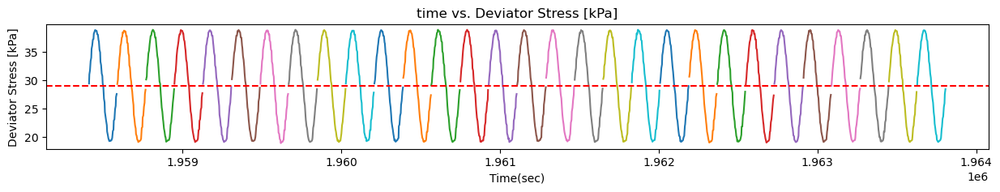

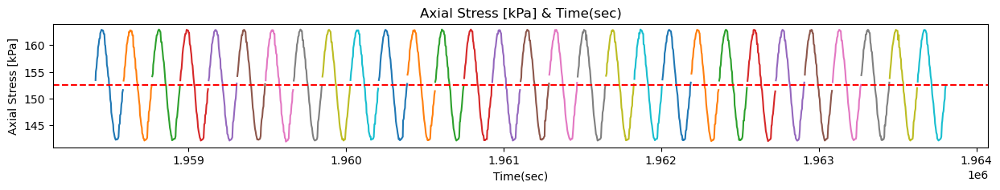

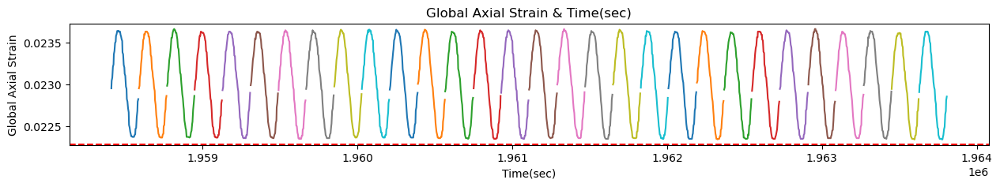

In [50]:
# The data for fitting
#['Local Axial 2 (mm)']
time = df_NC06_new.loc[: ,'Time since start of test (s)']
stress = df_NC06_new.loc[: ,'Axial Stress (kPa)']
global_strain = df_NC06_new.loc[: ,'Global Axial Strain'] 

###### Plot the data for several loops ################################# 236899
X1 = 10000
X2 = 10030

loop_indices = list(range(X1, X2)) 


plt.figure(figsize=(15, 2))

for i in loop_indices:
    if i < len(cycles_NC06):
      time_values = cycles_NC06[i]['Time since start of test (s)']
      stress_values = cycles_NC06[i]['Deviator Stress (kPa)']
      plt.plot(time_values, stress_values)

plt.xlabel("Time(sec)")
plt.ylabel('Deviator Stress [kPa]')
plt.title('time vs. Deviator Stress [kPa]')
plt.axhline(y=mean_val_NC06, color='r', linestyle='--', label='Mean Value')
plt.show()


plt.figure(figsize=(15, 2))
for i in loop_indices:
    if i < len(cycles_NC06):
      time = cycles_NC06[i]['Time since start of test (s)']
      stress = cycles_NC06[i]['Axial Stress (kPa)']
      plt.plot(time, stress)
      
plt.xlabel("Time(sec)")
plt.ylabel('Axial Stress [kPa]')
plt.title('Axial Stress [kPa] & Time(sec)')
plt.axhline(y=np.mean(df_NC06_new.loc[28886:439829,'Axial Stress (kPa)']), color='r', linestyle='--', label='Mean Value')
plt.show()  



plt.figure(figsize=(15, 2))
for i in loop_indices:
    if i < len(cycles_NC06):
      time = cycles_NC06[i]['Time since start of test (s)']
      global_strain = cycles_NC06[i]['Global Axial Strain']
      plt.plot(time, global_strain)
      
plt.xlabel("Time(sec)")
plt.ylabel('Global Axial Strain')
plt.title('Global Axial Strain & Time(sec)')
plt.axhline(y=np.mean(df_NC06_new.loc[28886:439829,'Global Axial Strain']), color='r', linestyle='--', label='Mean Value')
plt.show()    


##  Damping Ratio

<Figure size 1200x400 with 0 Axes>

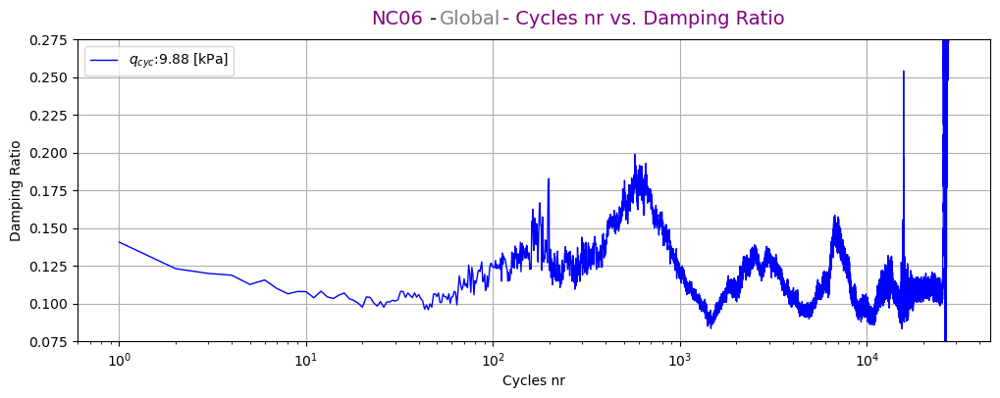

In [51]:
plt.figure(figsize=(12, 4)) 

x_values_G = cycle_info_NC06_G['Loop_Number']
y_values_G = unp.nominal_values(cycle_info_NC06_G['Damping_ratio'])
y_series_G = pd.Series(y_values_G)
moving_avg_G = y_series_G.rolling(500).mean()

plt.figure(figsize=(12, 4)) 
plt.plot(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC06:.2f} [kPa]', linewidth=1)
#plt.plot(x_values_G, moving_avg_G, color='lightgreen') #, label='Moving Average')
plt.ylim([0.075, 0.275])
plt.legend(loc='upper left')
plt.xscale('log')
plt.xlabel("Cycles nr")
plt.ylabel("Damping Ratio")
plt.text(0.35, 1.05, 'NC06', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.39, 1.05, '-', fontsize=14, color='black', ha='center', transform=plt.gca().transAxes)
plt.text(0.43, 1.05, 'Global', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.62, 1.05, '- Cycles nr vs. Damping Ratio', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()


## Secant Stiffness E & Time

<Figure size 1200x400 with 0 Axes>

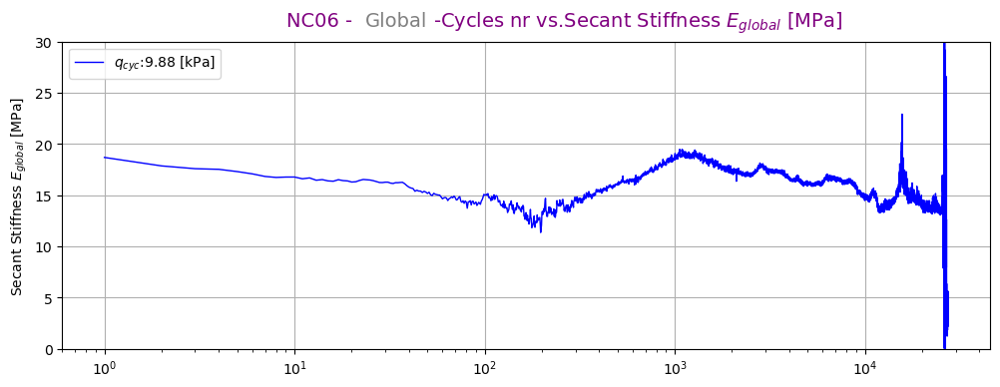

In [52]:
plt.figure(figsize=(12, 4)) 
window_size = 100
x_values_G = cycle_info_NC06_G['Loop_Number']
y_values_G = cycle_info_NC06_G['E(MPa)']
y_series_G = pd.Series(y_values_G)
moving_avg_G = y_series_G.rolling(150).mean()

plt.figure(figsize=(12, 4)) 
plt.plot(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC06:.2f} [kPa]', linewidth=1)
#plt.plot(x_values_G, moving_avg_G, color='orange', label='Moving Average')
plt.ylim([0, 30])
plt.xscale('log')
plt.legend(loc='upper left')
plt.ylabel("Secant Stiffness $E_{global}$ [MPa]")
plt.text(0.28, 1.05, 'NC06 - ', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.36, 1.05, 'Global', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.62, 1.05, '-Cycles nr vs.Secant Stiffness $E_{global}$ [MPa]', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()

## Shear Modulus G

<Figure size 1200x400 with 0 Axes>

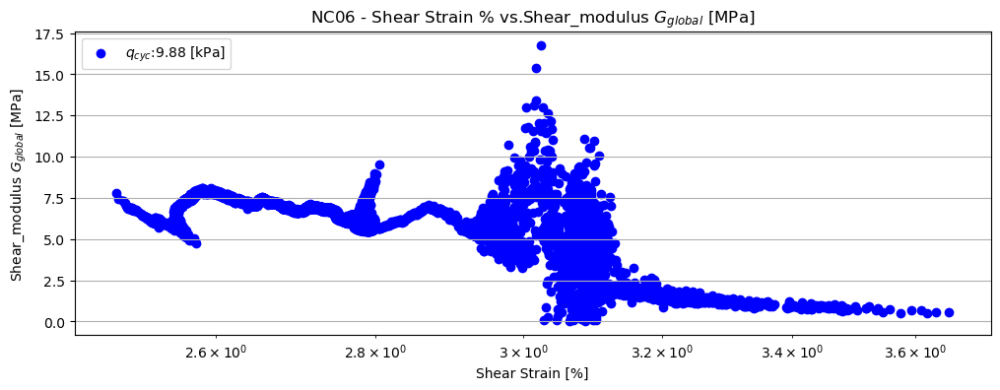

In [53]:
plt.figure(figsize=(12, 4)) 
window_size = 100
x_values_G = unp.nominal_values(cycle_info_NC06_G['Shear Strain'])
y_values_G = unp.nominal_values(cycle_info_NC06_G['Shear_modulus_(MPa)'])
y_series_G = pd.Series(y_values_G)
moving_avg_G_1 = y_series_G.rolling(150).mean()


plt.figure(figsize=(12, 4)) 
plt.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC06:.2f} [kPa]', linewidth=1)
#plt.plot(x_values_G_1, moving_avg_G_1, color='orange', label='Moving Average')
#plt.plot(x_values_G_2, moving_avg_G_2, color='orange')
#plt.ylim([200, 350])
plt.legend(loc='upper left')
plt.xscale('log')
plt.xlabel("Shear Strain [%]")
plt.ylabel("Shear_modulus $G_{global}$ [MPa]")
plt.title('NC06 - Shear Strain % vs.Shear_modulus $G_{global}$ [MPa]')
plt.grid(True)
plt.show()


## G/G0

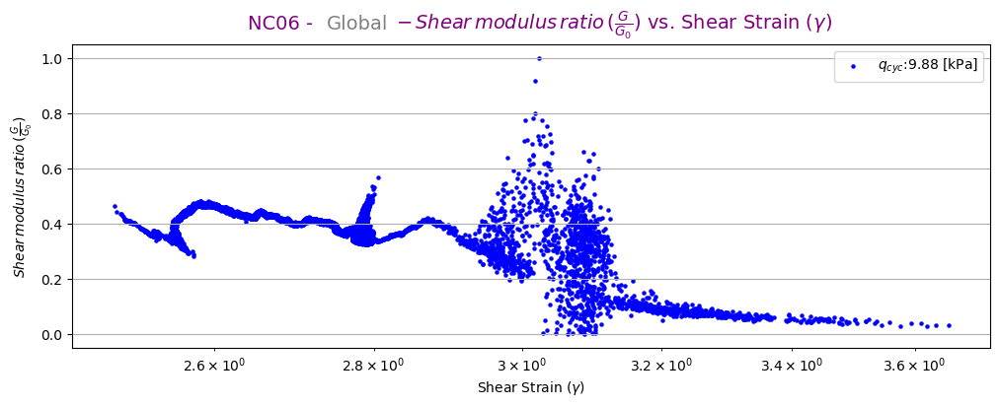

In [54]:

window_size = 100
# G/G0  global
Gmax_NC06_G = np.max(cycle_info_NC06_G['Shear_modulus_(MPa)'])

x_values_G = unp.nominal_values(cycle_info_NC06_G['Shear Strain'])
y_values_G = unp.nominal_values(cycle_info_NC06_G['Shear_modulus_(MPa)']) / unp.nominal_values(Gmax_NC06_G)

y_series_G = pd.Series(y_values_G)
moving_avg_G = y_series_G_1.rolling(550).mean()



plt.figure(figsize=(12, 4)) 
plt.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC06:.2f} [kPa]', s=5)
#plt.plot(x_values_G, moving_avg_G, color='orange', label='Moving Average')

#plt.ylim([200, 350])
plt.xscale('log')
plt.legend(loc='upper right')
plt.xlabel(r'Shear Strain $\gamma$ %')
plt.ylabel(r'$Shear\, modulus\, ratio\,(\frac{G}{G_0}$)')
plt.xlabel(r'Shear Strain ($\gamma$)')
plt.text(0.23, 1.05, 'NC06 - ', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.31, 1.05, 'Global', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.59, 1.05, r'$-\,Shear\, modulus\, ratio\,(\frac{G}{G_0}$) vs. Shear Strain ($\gamma$)', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()



## PWP $\Delta \text{{u}}$

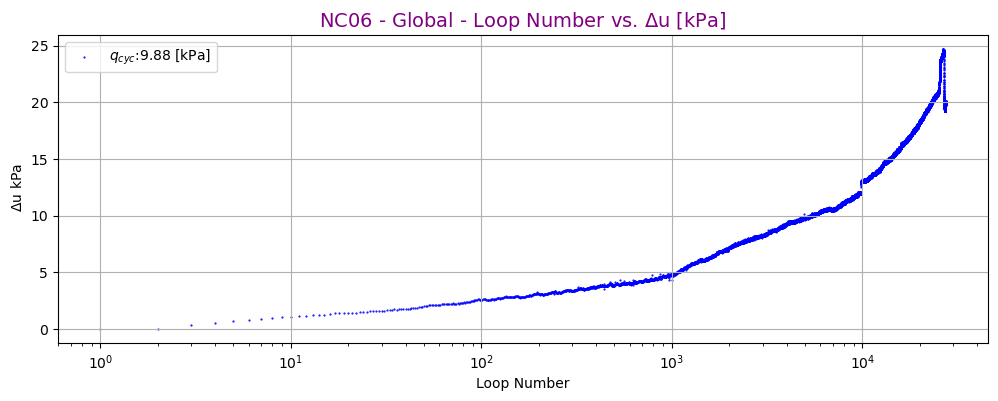

In [55]:
window_size = 10
x_values_G = cycle_info_NC06_G['Loop_Number']
y_values_G = unp.nominal_values(cycle_info_NC06_G['delta_pwp'])
y_series_G = pd.Series(y_values_G)
moving_avg_G = y_series_G_1.rolling(100).mean()


plt.figure(figsize=(12, 4)) 
plt.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC06:.2f} [kPa]', s=0.3)
#plt.plot(x_values_G, moving_avg_G, color='orange')
plt.legend(loc='upper left')
plt.xscale('log')
plt.xlabel(r'Loop Number')
plt.ylabel(r' $\Delta$u kPa')
plt.title(r'NC06 - Global - Loop Number vs. $\Delta$u [kPa]', fontsize=14, color='purple')
plt.grid(True)
plt.show()


# NC07

## Reading the data with its cycles

In [57]:
# To read the CSV file and identify each cycle separately, you can use:                                   
Path_df_NC07_new = os.path.join('Outputs_csv', 'df_NC07_new.csv')
df_NC07_new = pd.read_csv(Path_df_NC07_new)
df_NC07_new = convert_uncertainty_columns(df_NC07_new)

cycles_NC07 = {}
for cycle_nr in df_NC07_new['Cycle nr'].unique():
    cycles_NC07[cycle_nr] = df_NC07_new[df_NC07_new['Cycle nr'] == cycle_nr]

Path_cycle_info_NC07_G = os.path.join('Outputs_csv', 'cycle_info_NC07_G.csv')
cycle_info_NC07_G = pd.read_csv(Path_cycle_info_NC07_G)
cycle_info_NC07_G = convert_uncertainty_columns(cycle_info_NC07_G)


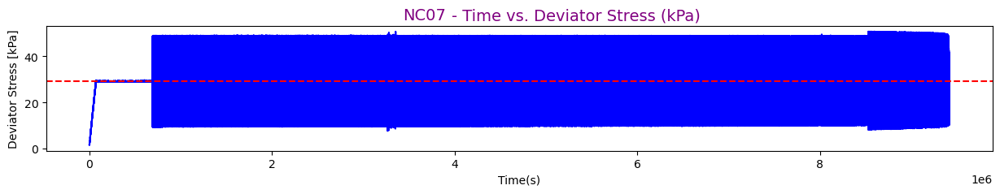

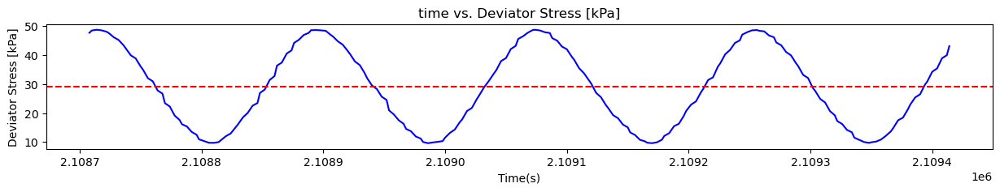

In [58]:
X1 = 1200  #216600  #1000 
X2 = 1400  #216900  #1200
mean_val_NC07 = np.mean(df_NC07_new.loc[28886:439829,'Deviator Stress (kPa)']) 
plt.figure(figsize=(15, 2)) 
plt.plot(df_NC07_new['Time since start of test (s)'], df_NC07_new['Deviator Stress (kPa)'], color='b')        # Deviator Stress (kPa)
plt.xlabel("Time(s)")
plt.ylabel("Deviator Stress [kPa]")
#plt.title('time vs. Deviator Stress (kPa)')
plt.axhline(y=mean_val_NC07, color='r', linestyle='--', label='Mean Value')
plt.text(0.40, 1.05, 'NC07', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.56, 1.05, '- Time vs. Deviator Stress (kPa)', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.show()

X1 = 402400  #502495  #1000 
X2 = 402600 #502502  #1200 
mean_val_NC07 = np.mean(df_NC07_new.loc[28886:439829,'Deviator Stress (kPa)']) 
plt.figure(figsize=(15, 2)) 
plt.plot(df_NC07_new.loc[X1:X2, 'Time since start of test (s)'], df_NC07_new.loc[X1:X2,'Deviator Stress (kPa)'], color='b')        # Deviator Stress (kPa)
plt.xlabel("Time(s)")
plt.ylabel("Deviator Stress [kPa]")
plt.title('time vs. Deviator Stress [kPa]')
plt.axhline(y=mean_val_NC07, color='r', linestyle='--', label='Mean Value')
plt.show()

## Stage info 

In [59]:
Path_Stage_info_NC07 = os.path.join('Outputs_csv', 'Stage_info_NC07.csv')
Stage_info_NC07 = pd.read_csv(Path_Stage_info_NC07)
Stage_info_NC07 = convert_uncertainty_columns(Stage_info_NC07)

qcyc_NC07 = unp.nominal_values(Stage_info_NC07.loc[0]['qcyc'])

Stage_info_NC07

,Sample type,Stage Number,Start index,End index,Rows nr,Star time,End time,Test duration(d),Cyclic loading duration(d),Cycles nr,...,q_m,q_p,q_min,q_max,q_avg,qcyc,qcyc/p0,CSR,qc/2Su,qm/2Su
0,NC07,1,11554,2400346,2388793,693322,9417181,108.994965,100.970451,48436,...,29.1+/-1.1,0,9.841+/-0.008,48.958+/-0.008,29.0223+/-0.0012,19.559+/-0.006,0.351+/-0.005,0.14817+/-0.00005,0.29634+/-0.00009,0.441+/-0.016


## Axial Stress & Axial Strain

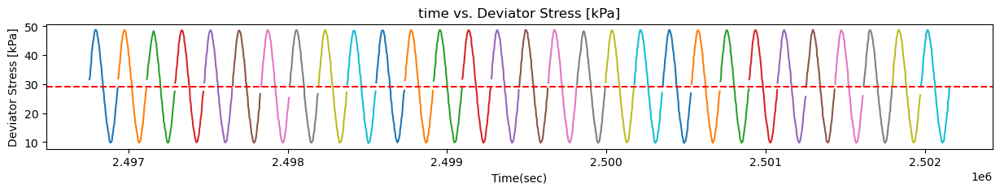

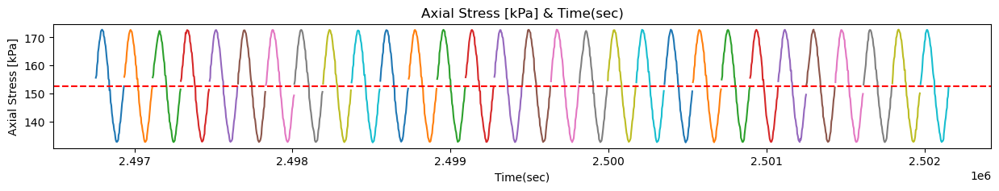

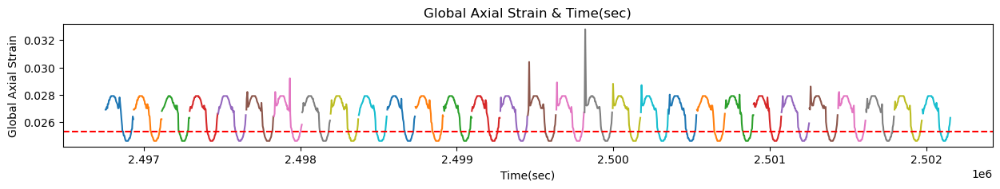

In [60]:
# The data for fitting
#['Local Axial 2 (mm)']
time = df_NC07_new.loc[: ,'Time since start of test (s)']
stress = df_NC07_new.loc[: ,'Axial Stress (kPa)']
global_strain = df_NC07_new.loc[: ,'Global Axial Strain'] 

###### Plot the data for several loops ################################# 236899
X1 = 10000
X2 = 10030

loop_indices = list(range(X1, X2)) 


plt.figure(figsize=(15, 2))

for i in loop_indices:
    if i < len(cycles_NC07):
      time_values = cycles_NC07[i]['Time since start of test (s)']
      stress_values = cycles_NC07[i]['Deviator Stress (kPa)']
      plt.plot(time_values, stress_values)

plt.xlabel("Time(sec)")
plt.ylabel('Deviator Stress [kPa]')
plt.title('time vs. Deviator Stress [kPa]')
plt.axhline(y=mean_val_NC07, color='r', linestyle='--', label='Mean Value')
plt.show()


plt.figure(figsize=(15, 2))
for i in loop_indices:
    if i < len(cycles_NC07):
      time = cycles_NC07[i]['Time since start of test (s)']
      stress = cycles_NC07[i]['Axial Stress (kPa)']
      plt.plot(time, stress)
      
plt.xlabel("Time(sec)")
plt.ylabel('Axial Stress [kPa]')
plt.title('Axial Stress [kPa] & Time(sec)')
plt.axhline(y=np.mean(df_NC07_new.loc[28886:439829,'Axial Stress (kPa)']), color='r', linestyle='--', label='Mean Value')
plt.show()  



plt.figure(figsize=(15, 2))
for i in loop_indices:
    if i < len(cycles_NC07):
      time = cycles_NC07[i]['Time since start of test (s)']
      global_strain = cycles_NC07[i]['Global Axial Strain']
      plt.plot(time, global_strain)
      
plt.xlabel("Time(sec)")
plt.ylabel('Global Axial Strain')
plt.title('Global Axial Strain & Time(sec)')
plt.axhline(y=np.mean(df_NC07_new.loc[28886:439829,'Global Axial Strain']), color='r', linestyle='--', label='Mean Value')
plt.show()    


##  Damping Ratio

<Figure size 1200x400 with 0 Axes>

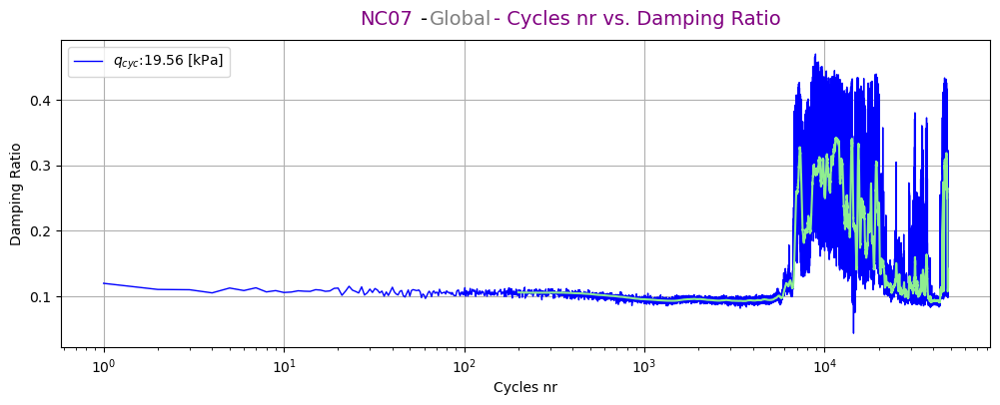

In [61]:
plt.figure(figsize=(12, 4)) 

x_values_G = cycle_info_NC07_G['Loop_Number']
y_values_G = unp.nominal_values(cycle_info_NC07_G['Damping_ratio'])
y_series_G = pd.Series(y_values_G)
moving_avg_G = y_series_G.rolling(200).mean()

plt.figure(figsize=(12, 4)) 
plt.plot(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC07:.2f} [kPa]', linewidth=1)
plt.plot(x_values_G, moving_avg_G, color='lightgreen') #, label='Moving Average')

plt.legend(loc='upper left')
plt.xscale('log')
plt.xlabel("Cycles nr")
plt.ylabel("Damping Ratio")
plt.text(0.35, 1.05, 'NC07', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.39, 1.05, '-', fontsize=14, color='black', ha='center', transform=plt.gca().transAxes)
plt.text(0.43, 1.05, 'Global', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.62, 1.05, '- Cycles nr vs. Damping Ratio', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()

## Secant Stiffness E & Time

<Figure size 1200x400 with 0 Axes>

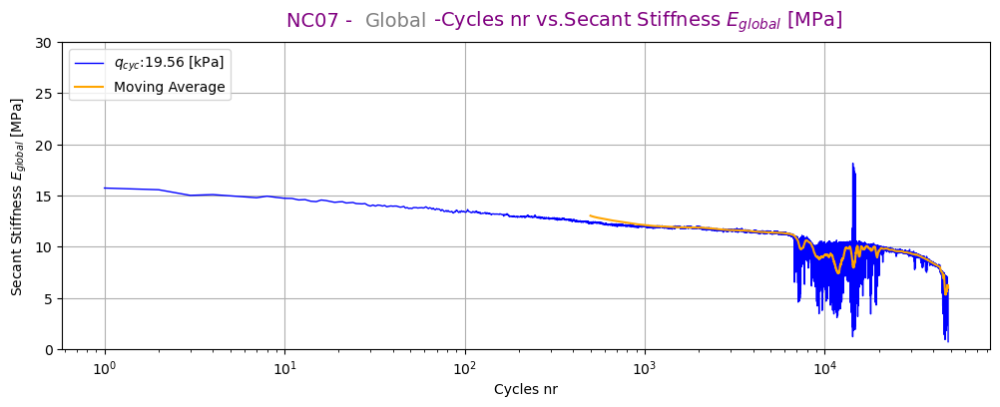

In [62]:
plt.figure(figsize=(12, 4)) 
window_size = 100
x_values_G = cycle_info_NC07_G['Loop_Number']
y_values_G = cycle_info_NC07_G['E(MPa)']
y_series_G = pd.Series(y_values_G)
moving_avg_G = y_series_G.rolling(500).mean()

plt.figure(figsize=(12, 4)) 
plt.plot(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC07:.2f} [kPa]', linewidth=1)
plt.plot(x_values_G, moving_avg_G, color='orange', label='Moving Average')
plt.ylim([0, 30])
plt.xscale('log')
plt.legend(loc='upper left')
plt.xlabel("Cycles nr")
plt.ylabel("Secant Stiffness $E_{global}$ [MPa]")
plt.text(0.28, 1.05, 'NC07 - ', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.36, 1.05, 'Global', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.62, 1.05, '-Cycles nr vs.Secant Stiffness $E_{global}$ [MPa]', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()

## Shear Modulus G

<Figure size 1200x400 with 0 Axes>

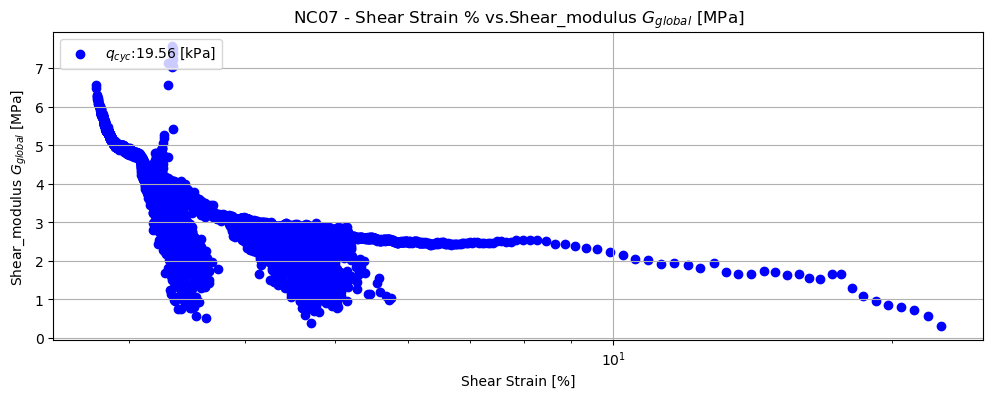

In [63]:
plt.figure(figsize=(12, 4)) 
window_size = 100
x_values_G = unp.nominal_values(cycle_info_NC07_G['Shear Strain'])
y_values_G = unp.nominal_values(cycle_info_NC07_G['Shear_modulus_(MPa)'])
y_series_G = pd.Series(y_values_G)
moving_avg_G_1 = y_series_G.rolling(150).mean()


plt.figure(figsize=(12, 4)) 
plt.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC07:.2f} [kPa]', linewidth=1)
#plt.plot(x_values_G_1, moving_avg_G_1, color='orange', label='Moving Average')
#plt.plot(x_values_G_2, moving_avg_G_2, color='orange')
#plt.ylim([200, 350])
plt.legend(loc='upper left')
plt.xscale('log')
plt.xlabel("Shear Strain [%]")
plt.ylabel("Shear_modulus $G_{global}$ [MPa]")
plt.title('NC07 - Shear Strain % vs.Shear_modulus $G_{global}$ [MPa]')
plt.grid(True)
plt.show()


## G/G0

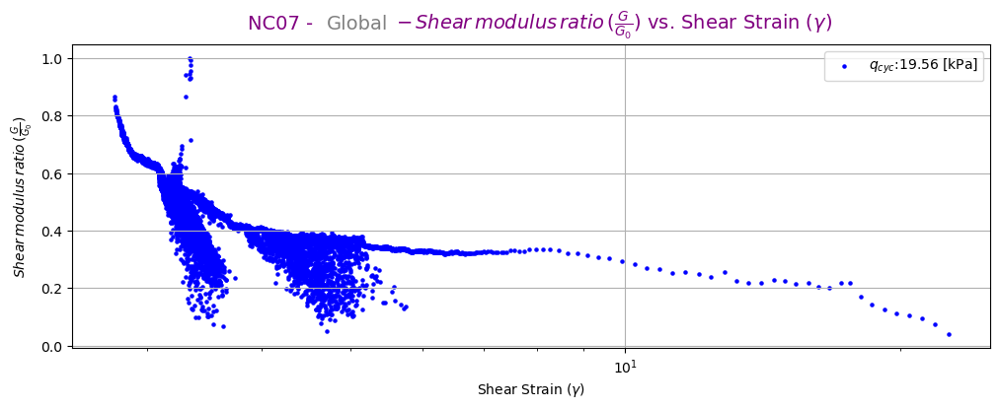

In [64]:

window_size = 100
# G/G0  global
Gmax_NC07_G = np.max(cycle_info_NC07_G['Shear_modulus_(MPa)'])

x_values_G = unp.nominal_values(cycle_info_NC07_G['Shear Strain'])
y_values_G = unp.nominal_values(cycle_info_NC07_G['Shear_modulus_(MPa)']) / unp.nominal_values(Gmax_NC07_G)

y_series_G_1 = pd.Series(y_values_G)
moving_avg_G_1 = y_series_G_1.rolling(150).mean()



plt.figure(figsize=(12, 4)) 
plt.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC07:.2f} [kPa]', s=5)
#plt.plot(x_values_G_1, moving_avg_G_1, color='orange', label='Moving Average')
#plt.plot(x_values_G_2, moving_avg_G_2, color='orange')
#plt.ylim([200, 350])
plt.xscale('log')
plt.legend(loc='upper right')
plt.xlabel(r'Shear Strain $\gamma$ %')
plt.ylabel(r'$Shear\, modulus\, ratio\,(\frac{G}{G_0}$)')
plt.xlabel(r'Shear Strain ($\gamma$)')
plt.text(0.23, 1.05, 'NC07 - ', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.31, 1.05, 'Global', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.59, 1.05, r'$-\,Shear\, modulus\, ratio\,(\frac{G}{G_0}$) vs. Shear Strain ($\gamma$)', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()


## PWP $\Delta \text{{u}}$

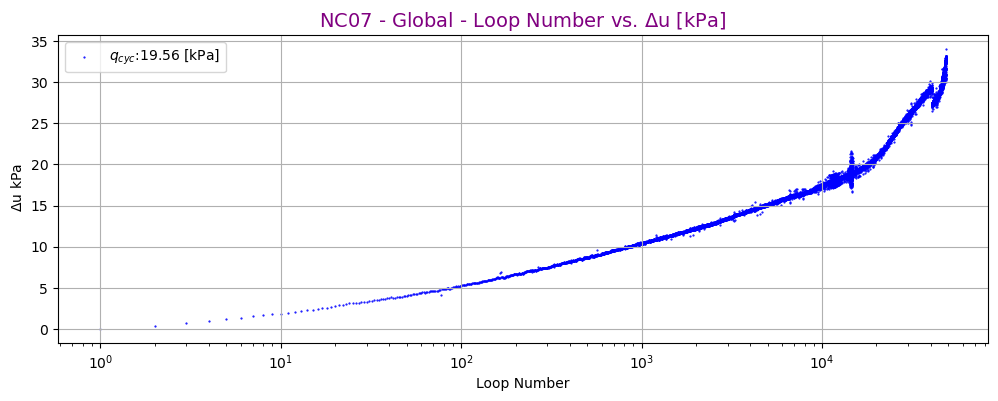

In [65]:
window_size = 10
x_values_G = cycle_info_NC07_G['Loop_Number']
y_values_G = unp.nominal_values(cycle_info_NC07_G['delta_pwp'])
y_series_G = pd.Series(y_values_G)
moving_avg_G = y_series_G_1.rolling(100).mean()


plt.figure(figsize=(12, 4)) 
plt.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC07:.2f} [kPa]', s=0.3)
#plt.plot(x_values_G, moving_avg_G, color='orange')
plt.legend(loc='upper left')
plt.xscale('log')
plt.xlabel(r'Loop Number')
plt.ylabel(r' $\Delta$u kPa')
plt.title(r'NC07 - Global - Loop Number vs. $\Delta$u [kPa]', fontsize=14, color='purple')
plt.grid(True)
plt.show()


# NC08

## Reading the data with its cycles

In [67]:
# To read the CSV file and identify each cycle separately, you can use:                                   
Path_df_NC08_new = os.path.join('Outputs_csv', 'df_NC08_new.csv')
df_NC08_new = pd.read_csv(Path_df_NC08_new)
df_NC08_new = convert_uncertainty_columns(df_NC08_new)

cycles_NC08 = {}
for cycle_nr in df_NC08_new['Cycle nr'].unique():
    cycles_NC08[cycle_nr] = df_NC08_new[df_NC08_new['Cycle nr'] == cycle_nr]

Path_cycle_info_NC08_G = os.path.join('Outputs_csv', 'cycle_info_NC08_G.csv')
cycle_info_NC08_G = pd.read_csv(Path_cycle_info_NC08_G)
cycle_info_NC08_G = convert_uncertainty_columns(cycle_info_NC08_G)


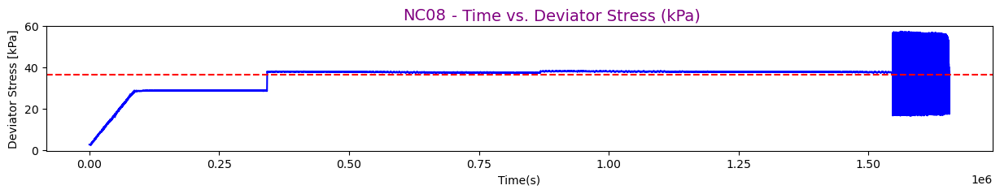

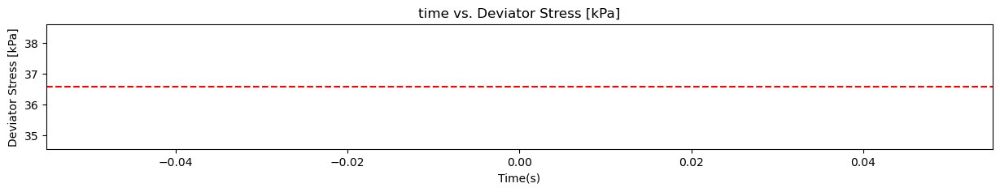

In [68]:
X1 = 1200  #216600  #1000 
X2 = 1400  #216900  #1200
mean_val_NC08 = np.mean(df_NC08_new.loc[28886:439829,'Deviator Stress (kPa)']) 
plt.figure(figsize=(15, 2)) 
plt.plot(df_NC08_new['Time since start of test (s)'], df_NC08_new['Deviator Stress (kPa)'], color='b')        # Deviator Stress (kPa)
plt.xlabel("Time(s)")
plt.ylabel("Deviator Stress [kPa]")
#plt.title('time vs. Deviator Stress (kPa)')
plt.axhline(y=mean_val_NC08, color='r', linestyle='--', label='Mean Value')
plt.text(0.40, 1.05, 'NC08', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.56, 1.05, '- Time vs. Deviator Stress (kPa)', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.show()
X1 = 402400  #502495  #1000 
X2 = 402600 #502502  #1200 
mean_val_NC08 = np.mean(df_NC08_new.loc[28886:439829,'Deviator Stress (kPa)']) 
plt.figure(figsize=(15, 2)) 
plt.plot(df_NC08_new.loc[X1:X2, 'Time since start of test (s)'], df_NC08_new.loc[X1:X2,'Deviator Stress (kPa)'], color='b')        # Deviator Stress (kPa)
plt.xlabel("Time(s)")
plt.ylabel("Deviator Stress [kPa]")
plt.title('time vs. Deviator Stress [kPa]')
plt.axhline(y=mean_val_NC08, color='r', linestyle='--', label='Mean Value')
plt.show()

## Stage info 

In [69]:
Path_Stage_info_NC08 = os.path.join('Outputs_csv', 'Stage_info_NC08.csv')
Stage_info_NC08 = pd.read_csv(Path_Stage_info_NC08)
Stage_info_NC08 = convert_uncertainty_columns(Stage_info_NC08)

qcyc_NC08 = unp.nominal_values(Stage_info_NC08.loc[0]['qcyc'])

Stage_info_NC08

,Sample type,Stage Number,Start index,End index,Rows nr,Star time,End time,Test duration(d),Cyclic loading duration(d),Cycles nr,...,q_m,q_p,q_min,q_max,q_avg,qcyc,qcyc/p0,CSR,qc/2Su,qm/2Su
0,NC08,1,25799,80311,54513,1546320,1655516,19.162083,1.263843,599,...,37.7+/-1.1,9.2+/-1.5,17.22+/-0.04,56.27+/-0.04,36.643+/-0.005,19.527+/-0.031,0.367+/-0.005,0.14794+/-0.00023,0.2959+/-0.0005,0.572+/-0.016


## Axial Stress & Axial Strain

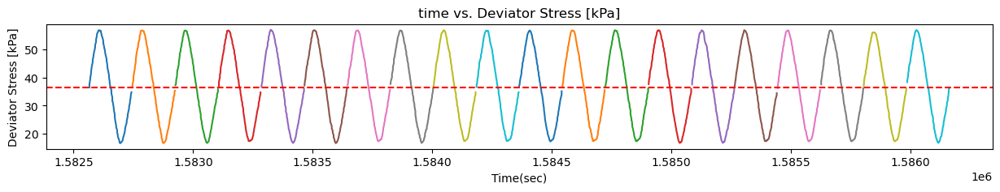

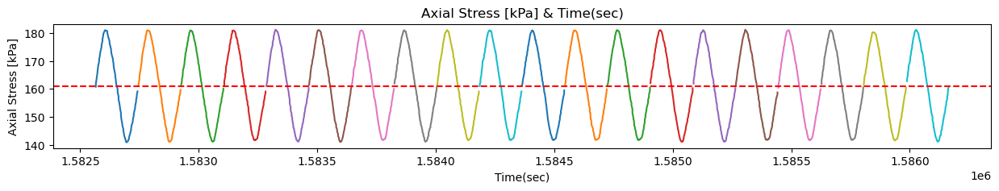

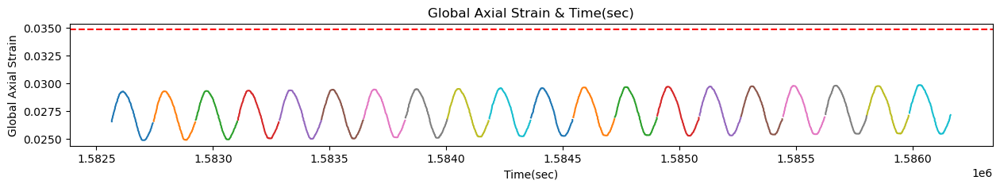

In [70]:
# The data for fitting
#['Local Axial 2 (mm)']
time = df_NC08_new.loc[: ,'Time since start of test (s)']
stress = df_NC08_new.loc[: ,'Axial Stress (kPa)']
global_strain = df_NC08_new.loc[: ,'Global Axial Strain'] 

###### Plot the data for several loops ################################# 236899
X1 = 200
X2 = 220

loop_indices = list(range(X1, X2)) 


plt.figure(figsize=(15, 2))

for i in loop_indices:
    if i < len(cycles_NC08):
      time_values = cycles_NC08[i]['Time since start of test (s)']
      stress_values = cycles_NC08[i]['Deviator Stress (kPa)']
      plt.plot(time_values, stress_values)

plt.xlabel("Time(sec)")
plt.ylabel('Deviator Stress [kPa]')
plt.title('time vs. Deviator Stress [kPa]')
plt.axhline(y=mean_val_NC08, color='r', linestyle='--', label='Mean Value')
plt.show()


plt.figure(figsize=(15, 2))
for i in loop_indices:
    if i < len(cycles_NC08):
      time = cycles_NC08[i]['Time since start of test (s)']
      stress = cycles_NC08[i]['Axial Stress (kPa)']
      plt.plot(time, stress)
      
plt.xlabel("Time(sec)")
plt.ylabel('Axial Stress [kPa]')
plt.title('Axial Stress [kPa] & Time(sec)')
plt.axhline(y=np.mean(df_NC08_new.loc[28886:439829,'Axial Stress (kPa)']), color='r', linestyle='--', label='Mean Value')
plt.show()  



plt.figure(figsize=(15, 2))
for i in loop_indices:
    if i < len(cycles_NC08):
      time = cycles_NC08[i]['Time since start of test (s)']
      global_strain = cycles_NC08[i]['Global Axial Strain']
      plt.plot(time, global_strain)
      
plt.xlabel("Time(sec)")
plt.ylabel('Global Axial Strain')
plt.title('Global Axial Strain & Time(sec)')
plt.axhline(y=np.mean(df_NC08_new.loc[28886:439829,'Global Axial Strain']), color='r', linestyle='--', label='Mean Value')
plt.show()    


##  Damping Ratio

<Figure size 1200x400 with 0 Axes>

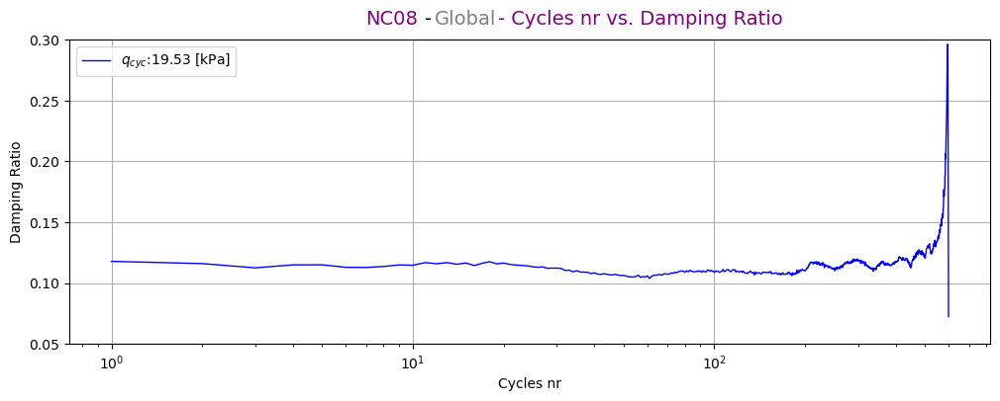

In [71]:

plt.figure(figsize=(12, 4)) 

x_values_G = cycle_info_NC08_G['Loop_Number']
y_values_G = unp.nominal_values(cycle_info_NC08_G['Damping_ratio'])
y_series_G = pd.Series(y_values_G)
moving_avg_G = y_series_G.rolling(100).mean()

plt.figure(figsize=(12, 4)) 
plt.plot(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC08:.2f} [kPa]', linewidth=1)
#plt.plot(x_values_G, moving_avg_G, color='lightgreen') #, label='Moving Average')
plt.legend(loc='upper left')
plt.ylim([0.05, 0.3])
plt.xscale('log')
plt.xlabel("Cycles nr")
plt.ylabel("Damping Ratio")
plt.text(0.35, 1.05, 'NC08', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.39, 1.05, '-', fontsize=14, color='black', ha='center', transform=plt.gca().transAxes)
plt.text(0.43, 1.05, 'Global', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.62, 1.05, '- Cycles nr vs. Damping Ratio', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()



## Secant Stiffness E & Time

<Figure size 1200x400 with 0 Axes>

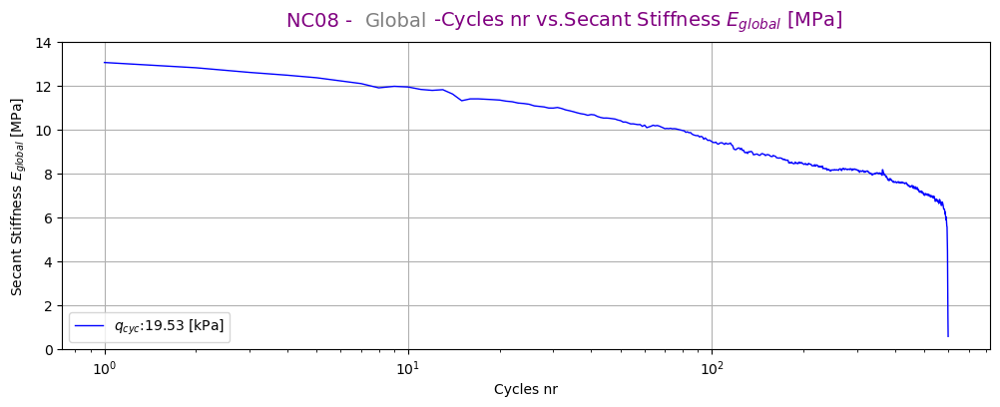

In [72]:
plt.figure(figsize=(12, 4)) 
window_size = 100
x_values_G = cycle_info_NC08_G['Loop_Number']
y_values_G = cycle_info_NC08_G['E(MPa)']
y_series_G = pd.Series(y_values_G)
moving_avg_G = y_series_G.rolling(150).mean()

plt.figure(figsize=(12, 4)) 
plt.plot(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC08:.2f} [kPa]', linewidth=1)
#plt.plot(x_values_G, moving_avg_G, color='orange', label='Moving Average')
plt.ylim([0, 14])
plt.xscale('log')
plt.legend(loc='lower left')
plt.xlabel("Cycles nr")
plt.ylabel("Secant Stiffness $E_{global}$ [MPa]")
plt.text(0.28, 1.05, 'NC08 - ', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.36, 1.05, 'Global', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.62, 1.05, '-Cycles nr vs.Secant Stiffness $E_{global}$ [MPa]', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()

## Shear Modulus G

<Figure size 1200x400 with 0 Axes>

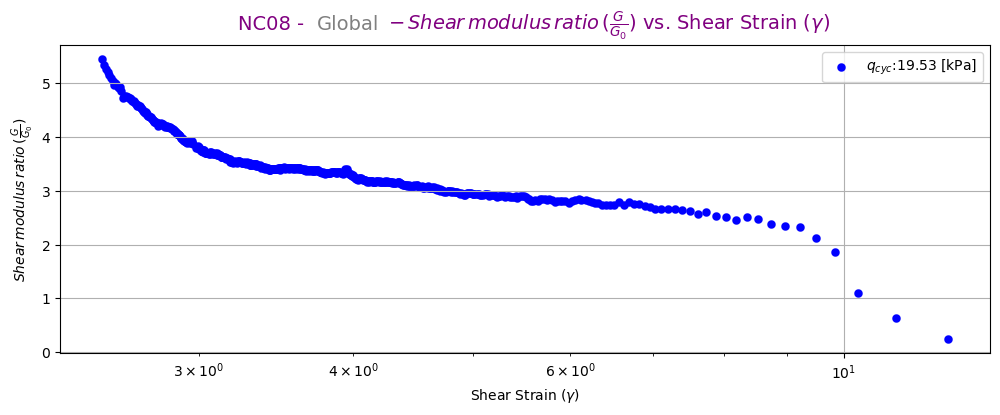

In [73]:
plt.figure(figsize=(12, 4)) 
window_size = 100
x_values_G = unp.nominal_values(cycle_info_NC08_G['Shear Strain'])
y_values_G = unp.nominal_values(cycle_info_NC08_G['Shear_modulus_(MPa)'])
y_series_G = pd.Series(y_values_G)
moving_avg_G_1 = y_series_G.rolling(150).mean()


plt.figure(figsize=(12, 4)) 
plt.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC08:.2f} [kPa]', linewidth=0.1)
#plt.plot(x_values_G_1, moving_avg_G_1, color='orange', label='Moving Average')
#plt.plot(x_values_G_2, moving_avg_G_2, color='orange')
#plt.ylim([200, 350])
plt.legend(loc='upper right')
plt.xscale('log')
plt.xlabel(r'Shear Strain $\gamma$ %')
plt.ylabel(r'$Shear\, modulus\, ratio\,(\frac{G}{G_0}$)')
plt.xlabel(r'Shear Strain ($\gamma$)')
plt.text(0.23, 1.05, 'NC08 - ', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.31, 1.05, 'Global', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.59, 1.05, r'$-\,Shear\, modulus\, ratio\,(\frac{G}{G_0}$) vs. Shear Strain ($\gamma$)', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()



## G/G0

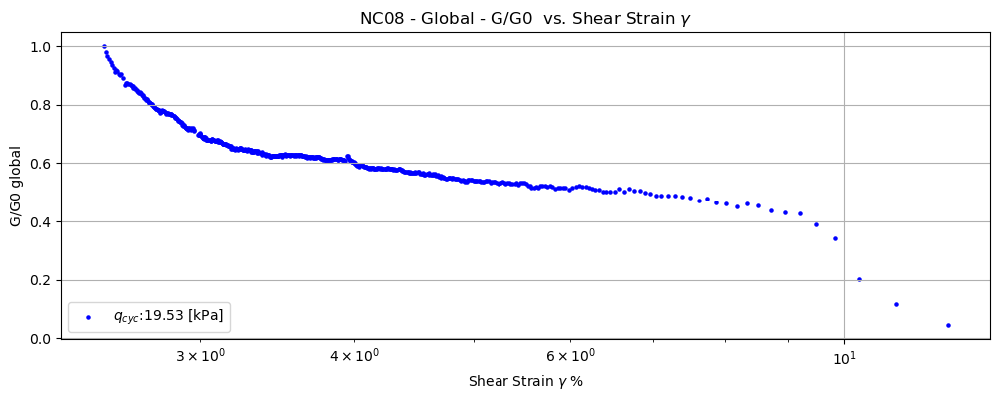

In [74]:

window_size = 100
# G/G0  global
Gmax_NC08_G = np.max(cycle_info_NC08_G['Shear_modulus_(MPa)'])

x_values_G = unp.nominal_values(cycle_info_NC08_G['Shear Strain'])
y_values_G = unp.nominal_values(cycle_info_NC08_G['Shear_modulus_(MPa)']) / unp.nominal_values(Gmax_NC08_G)

y_series_G_1 = pd.Series(y_values_G)
moving_avg_G_1 = y_series_G_1.rolling(150).mean()



plt.figure(figsize=(12, 4)) 
plt.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC08:.2f} [kPa]', s=5)
#plt.plot(x_values_G_1, moving_avg_G_1, color='orange', label='Moving Average')
#plt.plot(x_values_G_2, moving_avg_G_2, color='orange')
#plt.ylim([200, 350])
plt.xscale('log')
plt.legend(loc='lower left')
plt.xlabel(r'Shear Strain $\gamma$ %')
plt.ylabel(r'G/G0 global')
plt.title(r'NC08 - Global - G/G0  vs. Shear Strain $\gamma$')
plt.grid(True)
plt.show()


## PWP $\Delta \text{{u}}$

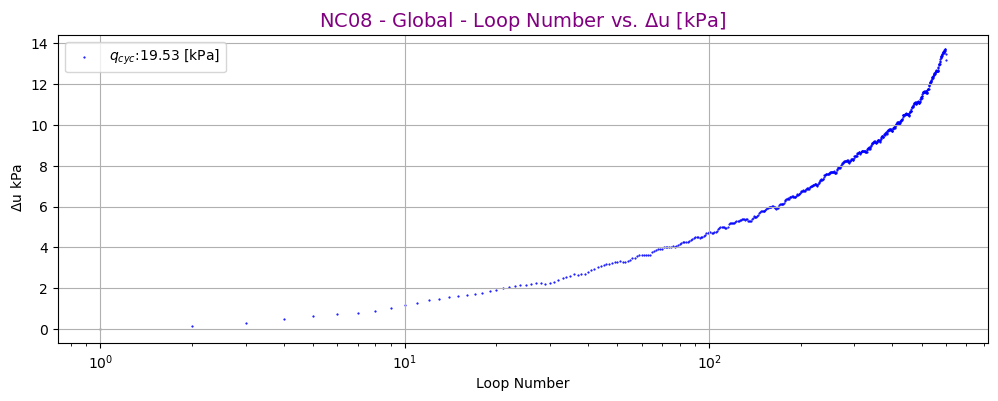

In [75]:
window_size = 10
x_values_G = cycle_info_NC08_G['Loop_Number']
y_values_G = unp.nominal_values(cycle_info_NC08_G['delta_pwp'])
y_series_G = pd.Series(y_values_G)
moving_avg_G = y_series_G_1.rolling(100).mean()


plt.figure(figsize=(12, 4)) 
plt.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC08:.2f} [kPa]', s=0.3)
#plt.plot(x_values_G, moving_avg_G, color='orange')
plt.legend(loc='upper left')
plt.xscale('log')
plt.xlabel(r'Loop Number')
plt.ylabel(r' $\Delta$u kPa')
plt.title(r'NC08 - Global - Loop Number vs. $\Delta$u [kPa]', fontsize=14, color='purple')
plt.grid(True)
plt.show()


# NC09

## Reading the data with its cycles

In [76]:
# To read the CSV file and identify each cycle separately, you can use:                                   
Path_df_NC09_new = os.path.join('Outputs_csv', 'df_NC09_new.csv')
df_NC09_new = pd.read_csv(Path_df_NC09_new)
df_NC09_new = convert_uncertainty_columns(df_NC09_new)

cycles_NC09 = {}
for cycle_nr in df_NC09_new['Cycle nr'].unique():
    cycles_NC09[cycle_nr] = df_NC09_new[df_NC09_new['Cycle nr'] == cycle_nr]

Path_cycle_info_NC09_G = os.path.join('Outputs_csv', 'cycle_info_NC09_G.csv')
cycle_info_NC09_G = pd.read_csv(Path_cycle_info_NC09_G)
cycle_info_NC09_G = convert_uncertainty_columns(cycle_info_NC09_G)


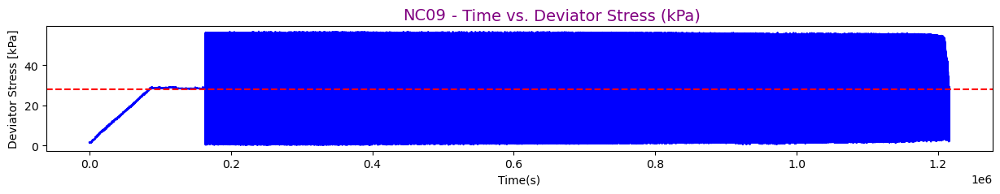

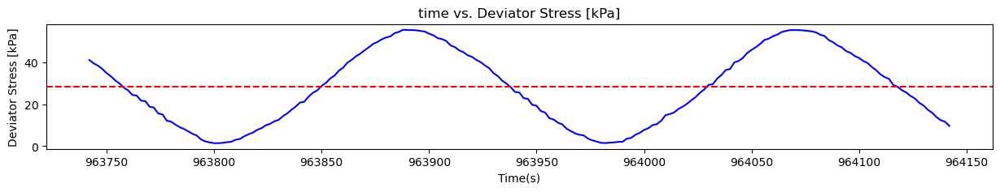

In [77]:
X1 = 1200  #216600  #1000 
X2 = 1400  #216900  #1200
mean_val_NC09 = np.mean(df_NC09_new.loc[28886:439829,'Deviator Stress (kPa)']) 
plt.figure(figsize=(15, 2)) 
plt.plot(df_NC09_new['Time since start of test (s)'], df_NC09_new['Deviator Stress (kPa)'], color='b')        # Deviator Stress (kPa)
plt.xlabel("Time(s)")
plt.ylabel("Deviator Stress [kPa]")
#plt.title('time vs. Deviator Stress (kPa)')
plt.axhline(y=mean_val_NC09, color='r', linestyle='--', label='Mean Value')
plt.text(0.40, 1.05, 'NC09', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.56, 1.05, '- Time vs. Deviator Stress (kPa)', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.show()
X1 = 402400  #502495  #1000 
X2 = 402600 #502502  #1200 
mean_val_NC09 = np.mean(df_NC09_new.loc[28886:439829,'Deviator Stress (kPa)']) 
plt.figure(figsize=(15, 2)) 
plt.plot(df_NC09_new.loc[X1:X2, 'Time since start of test (s)'], df_NC09_new.loc[X1:X2,'Deviator Stress (kPa)'], color='b')        # Deviator Stress (kPa)
plt.xlabel("Time(s)")
plt.ylabel("Deviator Stress [kPa]")
plt.title('time vs. Deviator Stress [kPa]')
plt.axhline(y=mean_val_NC09, color='r', linestyle='--', label='Mean Value')
plt.show()

## Stage info 

In [78]:
Path_Stage_info_NC09 = os.path.join('Outputs_csv', 'Stage_info_NC09.csv')
Stage_info_NC09 = pd.read_csv(Path_Stage_info_NC09)
Stage_info_NC09 = convert_uncertainty_columns(Stage_info_NC09)

qcyc_NC09 = unp.nominal_values(Stage_info_NC09.loc[0]['qcyc'])

Stage_info_NC09

,Sample type,Stage Number,Start index,End index,Rows nr,Star time,End time,Test duration(d),Cyclic loading duration(d),Cycles nr,...,q_m,q_p,q_min,q_max,q_avg,qcyc,qcyc/p0,CSR,qc/2Su,qm/2Su
0,NC09,1,2733,528093,525361,163918,1215882,14.072674,12.175509,5835,...,28.3+/-1.1,0,1.358+/-0.014,55.641+/-0.014,28.1232+/-0.0015,27.141+/-0.010,0.516+/-0.008,0.20562+/-0.00007,0.41123+/-0.00015,0.429+/-0.016


## Axial Stress & Axial Strain

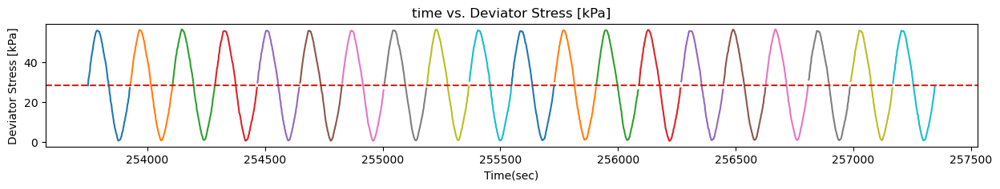

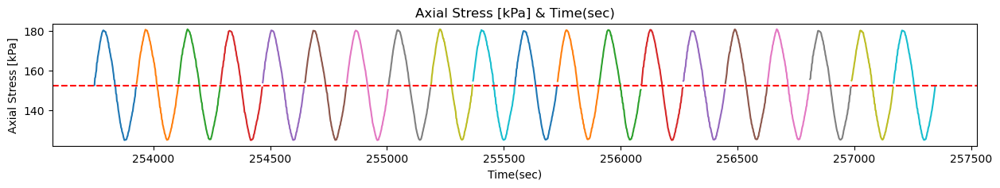

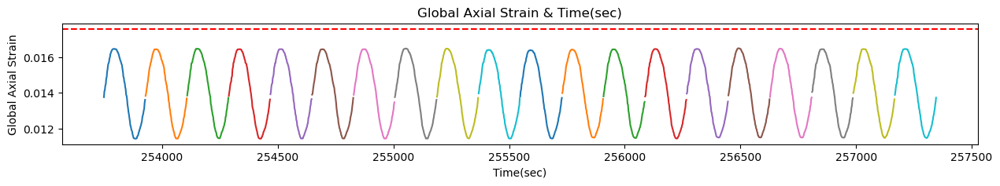

In [79]:
# The data for fitting
#['Local Axial 2 (mm)']
time = df_NC09_new.loc[: ,'Time since start of test (s)']
stress = df_NC09_new.loc[: ,'Axial Stress (kPa)']
global_strain = df_NC09_new.loc[: ,'Global Axial Strain'] 

###### Plot the data for several loops ################################# 236899
X1 = 500
X2 = 520

loop_indices = list(range(X1, X2)) 


plt.figure(figsize=(15, 2))

for i in loop_indices:
    if i < len(cycles_NC09):
      time_values = cycles_NC09[i]['Time since start of test (s)']
      stress_values = cycles_NC09[i]['Deviator Stress (kPa)']
      plt.plot(time_values, stress_values)

plt.xlabel("Time(sec)")
plt.ylabel('Deviator Stress [kPa]')
plt.title('time vs. Deviator Stress [kPa]')
plt.axhline(y=mean_val_NC09, color='r', linestyle='--', label='Mean Value')
plt.show()


plt.figure(figsize=(15, 2))
for i in loop_indices:
    if i < len(cycles_NC09):
      time = cycles_NC09[i]['Time since start of test (s)']
      stress = cycles_NC09[i]['Axial Stress (kPa)']
      plt.plot(time, stress)
      
plt.xlabel("Time(sec)")
plt.ylabel('Axial Stress [kPa]')
plt.title('Axial Stress [kPa] & Time(sec)')
plt.axhline(y=np.mean(df_NC09_new.loc[28886:439829,'Axial Stress (kPa)']), color='r', linestyle='--', label='Mean Value')
plt.show()  



plt.figure(figsize=(15, 2))
for i in loop_indices:
    if i < len(cycles_NC09):
      time = cycles_NC09[i]['Time since start of test (s)']
      global_strain = cycles_NC09[i]['Global Axial Strain']
      plt.plot(time, global_strain)
      
plt.xlabel("Time(sec)")
plt.ylabel('Global Axial Strain')
plt.title('Global Axial Strain & Time(sec)')
plt.axhline(y=np.mean(df_NC09_new.loc[28886:439829,'Global Axial Strain']), color='r', linestyle='--', label='Mean Value')
plt.show()    


##  Damping Ratio

<Figure size 1200x400 with 0 Axes>

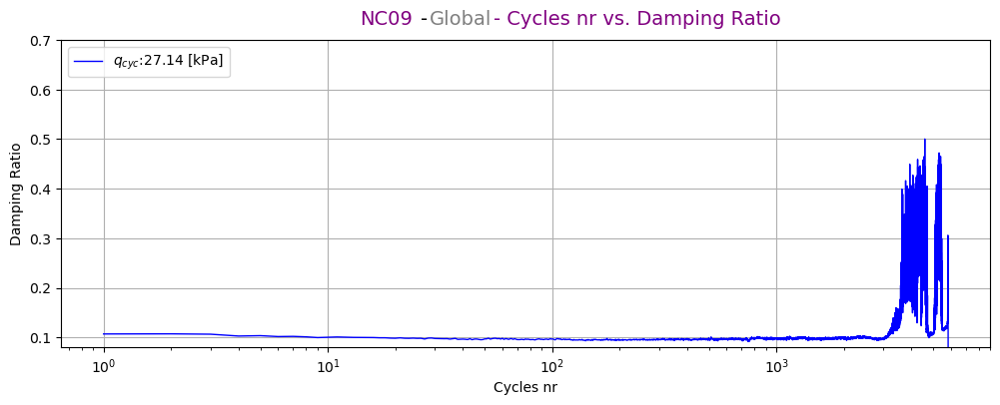

In [80]:

plt.figure(figsize=(12, 4)) 

x_values_G = cycle_info_NC09_G['Loop_Number']
y_values_G = unp.nominal_values(cycle_info_NC09_G['Damping_ratio'])
y_series_G = pd.Series(y_values_G)
moving_avg_G = y_series_G.rolling(100).mean()

plt.figure(figsize=(12, 4)) 
plt.plot(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC09:.2f} [kPa]', linewidth=1)
#plt.plot(x_values_G, moving_avg_G, color='lightgreen') #, label='Moving Average')
plt.legend(loc='upper left')
plt.ylim([0.08, 0.7])
plt.xscale('log')
plt.xlabel("Cycles nr")
plt.ylabel("Damping Ratio")
plt.text(0.35, 1.05, 'NC09', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.39, 1.05, '-', fontsize=14, color='black', ha='center', transform=plt.gca().transAxes)
plt.text(0.43, 1.05, 'Global', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.62, 1.05, '- Cycles nr vs. Damping Ratio', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()


## Secant Stiffness E & Time

<Figure size 1200x400 with 0 Axes>

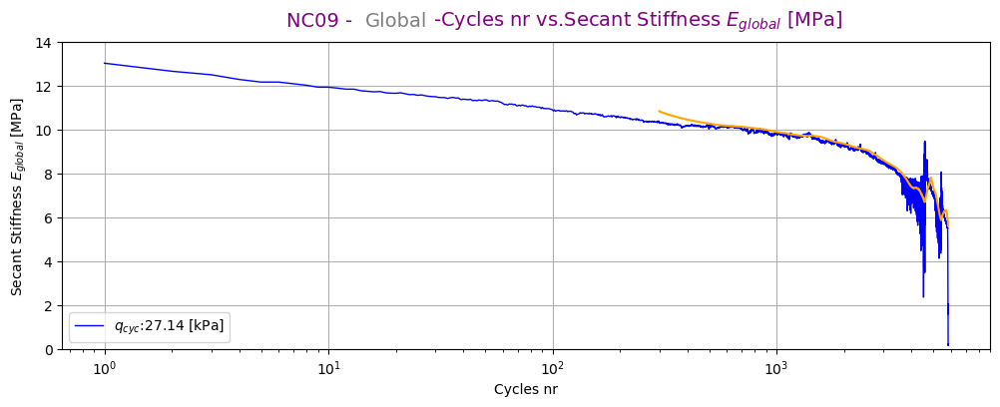

In [81]:
plt.figure(figsize=(12, 4)) 
window_size = 100
x_values_G = cycle_info_NC09_G['Loop_Number']
y_values_G = cycle_info_NC09_G['E(MPa)']
y_series_G = pd.Series(y_values_G)
moving_avg_G = y_series_G.rolling(300).mean()

plt.figure(figsize=(12, 4)) 
plt.plot(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC09:.2f} [kPa]', linewidth=1)
plt.plot(x_values_G, moving_avg_G, color='orange')#, label='Moving Average')
plt.ylim([0, 14])
plt.xscale('log')
plt.legend(loc='lower left')
plt.xlabel("Cycles nr")
plt.ylabel("Secant Stiffness $E_{global}$ [MPa]")
plt.text(0.28, 1.05, 'NC09 - ', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.36, 1.05, 'Global', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.62, 1.05, '-Cycles nr vs.Secant Stiffness $E_{global}$ [MPa]', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()

## Shear Modulus G

<Figure size 1200x400 with 0 Axes>

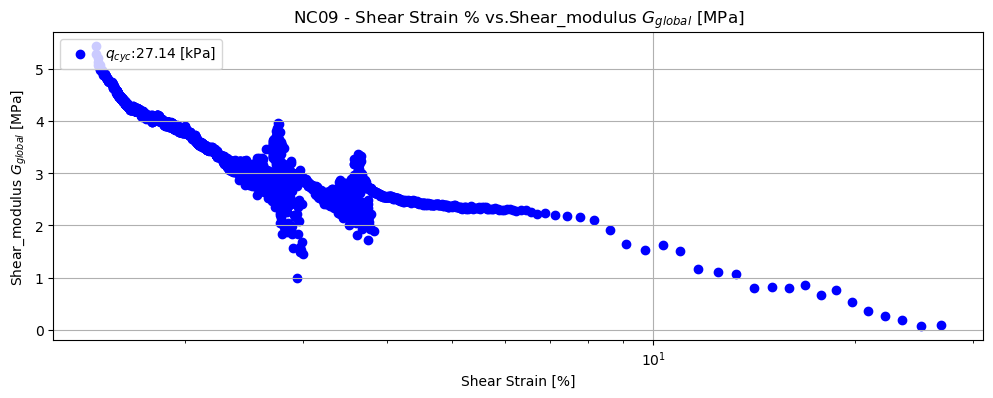

In [82]:
plt.figure(figsize=(12, 4)) 
window_size = 100
x_values_G = unp.nominal_values(cycle_info_NC09_G['Shear Strain'])
y_values_G = unp.nominal_values(cycle_info_NC09_G['Shear_modulus_(MPa)'])
y_series_G = pd.Series(y_values_G)
moving_avg_G_1 = y_series_G.rolling(150).mean()


plt.figure(figsize=(12, 4)) 
plt.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC09:.2f} [kPa]', linewidth=1)
#plt.plot(x_values_G_1, moving_avg_G_1, color='orange', label='Moving Average')
#plt.plot(x_values_G_2, moving_avg_G_2, color='orange')
#plt.ylim([200, 350])
plt.legend(loc='upper left')
plt.xscale('log')
plt.xlabel("Shear Strain [%]")
plt.ylabel("Shear_modulus $G_{global}$ [MPa]")
plt.title('NC09 - Shear Strain % vs.Shear_modulus $G_{global}$ [MPa]')
plt.grid(True)
plt.show()


## G/G0

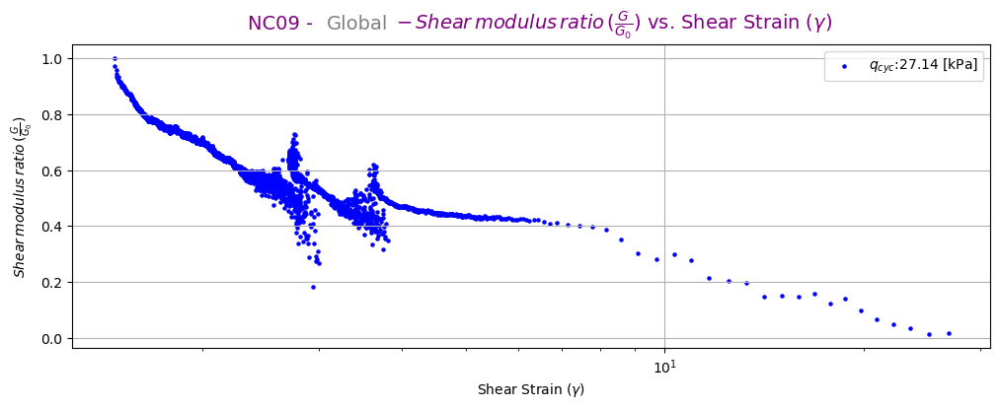

In [83]:

window_size = 100
# G/G0  global
Gmax_NC09_G = np.max(cycle_info_NC09_G['Shear_modulus_(MPa)'])

x_values_G = unp.nominal_values(cycle_info_NC09_G['Shear Strain'])
y_values_G = unp.nominal_values(cycle_info_NC09_G['Shear_modulus_(MPa)']) / unp.nominal_values(Gmax_NC09_G)

y_series_G_1 = pd.Series(y_values_G)
moving_avg_G_1 = y_series_G_1.rolling(150).mean()



plt.figure(figsize=(12, 4)) 
plt.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC09:.2f} [kPa]', s=5)
#plt.plot(x_values_G_1, moving_avg_G_1, color='orange', label='Moving Average')
#plt.plot(x_values_G_2, moving_avg_G_2, color='orange')
#plt.ylim([200, 350])
plt.xscale('log')
plt.legend(loc='upper right')
plt.xlabel(r'Shear Strain $\gamma$ %')
plt.ylabel(r'$Shear\, modulus\, ratio\,(\frac{G}{G_0}$)')
plt.xlabel(r'Shear Strain ($\gamma$)')
plt.text(0.23, 1.05, 'NC09 - ', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.31, 1.05, 'Global', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.59, 1.05, r'$-\,Shear\, modulus\, ratio\,(\frac{G}{G_0}$) vs. Shear Strain ($\gamma$)', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()


## PWP $\Delta \text{{u}}$

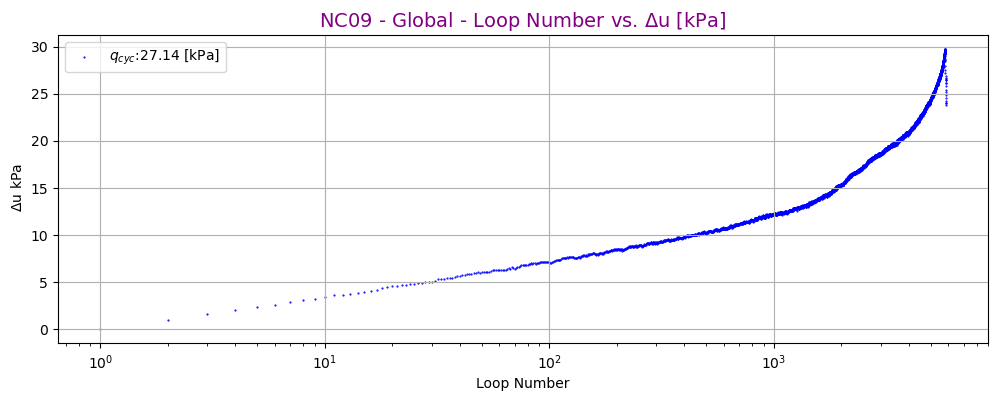

In [84]:
window_size = 10
x_values_G = cycle_info_NC09_G['Loop_Number']
y_values_G = unp.nominal_values(cycle_info_NC09_G['delta_pwp'])
y_series_G = pd.Series(y_values_G)
moving_avg_G = y_series_G_1.rolling(100).mean()


plt.figure(figsize=(12, 4)) 
plt.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC09:.2f} [kPa]', s=0.3)
#plt.plot(x_values_G, moving_avg_G, color='orange')
plt.legend(loc='upper left')
plt.xscale('log')
plt.xlabel(r'Loop Number')
plt.ylabel(r' $\Delta$u kPa')
plt.title(r'NC09 - Global - Loop Number vs. $\Delta$u [kPa]', fontsize=14, color='purple')
plt.grid(True)
plt.show()


# NC10

## Reading the data with its cycles

In [85]:
# To read the CSV file and identify each cycle separately, you can use:                                   
Path_df_NC10_new = os.path.join('Outputs_csv', 'df_NC10_new.csv')
df_NC10_new = pd.read_csv(Path_df_NC10_new)
df_NC10_new = convert_uncertainty_columns(df_NC10_new)

cycles_NC10 = {}
for cycle_nr in df_NC10_new['Cycle nr'].unique():
    cycles_NC10[cycle_nr] = df_NC10_new[df_NC10_new['Cycle nr'] == cycle_nr]

Path_cycle_info_NC10_G = os.path.join('Outputs_csv', 'cycle_info_NC10_G.csv')
cycle_info_NC10_G = pd.read_csv(Path_cycle_info_NC10_G)
cycle_info_NC10_G = convert_uncertainty_columns(cycle_info_NC10_G)


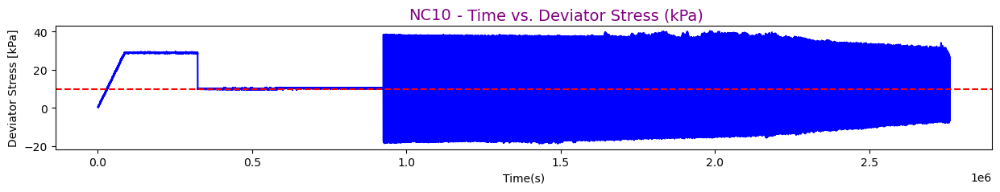

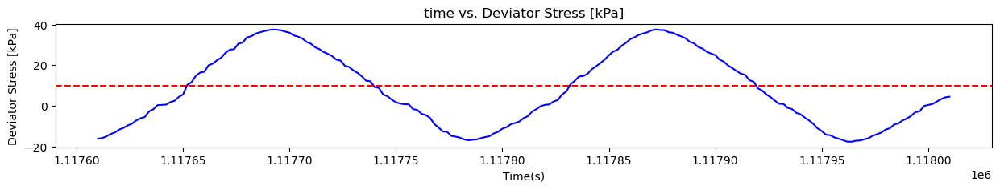

In [86]:
X1 = 1200  #216600  #1000 
X2 = 1400  #216900  #1200
mean_val_NC10 = np.mean(df_NC10_new.loc[28886:439829,'Deviator Stress (kPa)']) 
plt.figure(figsize=(15, 2)) 
plt.plot(df_NC10_new['Time since start of test (s)'], df_NC10_new['Deviator Stress (kPa)'], color='b')        # Deviator Stress (kPa)
plt.xlabel("Time(s)")
plt.ylabel("Deviator Stress [kPa]")
#plt.title('time vs. Deviator Stress (kPa)')
plt.axhline(y=mean_val_NC10, color='r', linestyle='--', label='Mean Value')
plt.text(0.40, 1.05, 'NC10', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.56, 1.05, '- Time vs. Deviator Stress (kPa)', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.show()

X1 = 402400  #502495  #1000 
X2 = 402600 #502502  #1200 
mean_val_NC10 = np.mean(df_NC10_new.loc[28886:439829,'Deviator Stress (kPa)']) 
plt.figure(figsize=(15, 2)) 
plt.plot(df_NC10_new.loc[X1:X2, 'Time since start of test (s)'], df_NC10_new.loc[X1:X2,'Deviator Stress (kPa)'], color='b')        # Deviator Stress (kPa)
plt.xlabel("Time(s)")
plt.ylabel("Deviator Stress [kPa]")
plt.title('time vs. Deviator Stress [kPa]')
plt.axhline(y=mean_val_NC10, color='r', linestyle='--', label='Mean Value')
plt.show()

## Stage info 

In [87]:
Path_Stage_info_NC10 = os.path.join('Outputs_csv', 'Stage_info_NC10.csv')
Stage_info_NC10 = pd.read_csv(Path_Stage_info_NC10)
Stage_info_NC10 = convert_uncertainty_columns(Stage_info_NC10)

qcyc_NC10 = unp.nominal_values(Stage_info_NC10.loc[0]['qcyc'])

Stage_info_NC10

,Sample type,Stage Number,Start index,End index,Rows nr,Star time,End time,Test duration(d),Cyclic loading duration(d),Cycles nr,...,q_m,q_p,q_min,q_max,q_avg,qcyc,qcyc/p0,CSR,qc/2Su,qm/2Su
0,NC10,1,306457,1214271,907815,925578,2760393,31.948912,21.219757,10184,...,10.3+/-1.1,-18.4+/-1.5,-10.43+/-0.04,32.91+/-0.04,9.450+/-0.005,21.669+/-0.031,0.414+/-0.006,0.16416+/-0.00024,0.3283+/-0.0005,0.156+/-0.016


## Axial Stress & Axial Strain

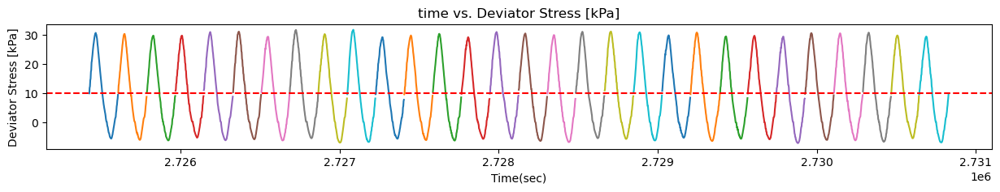

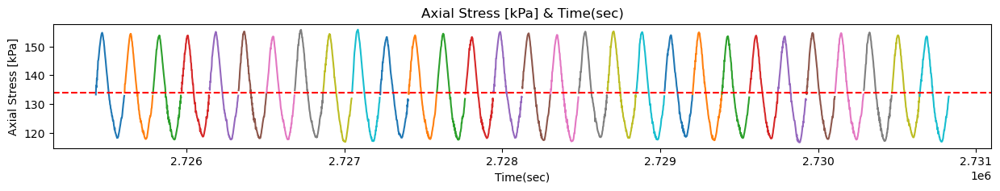

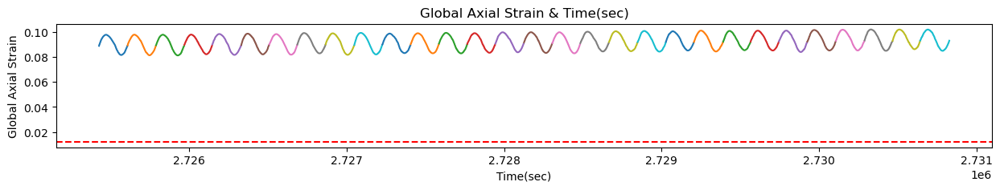

In [88]:
# The data for fitting
#['Local Axial 2 (mm)']
time = df_NC10_new.loc[: ,'Time since start of test (s)']
stress = df_NC10_new.loc[: ,'Axial Stress (kPa)']
global_strain = df_NC10_new.loc[: ,'Global Axial Strain'] 

###### Plot the data for several loops ################################# 236899
X1 = 10000
X2 = 10030

loop_indices = list(range(X1, X2)) 


plt.figure(figsize=(15, 2))

for i in loop_indices:
    if i < len(cycles_NC10):
      time_values = cycles_NC10[i]['Time since start of test (s)']
      stress_values = cycles_NC10[i]['Deviator Stress (kPa)']
      plt.plot(time_values, stress_values)

plt.xlabel("Time(sec)")
plt.ylabel('Deviator Stress [kPa]')
plt.title('time vs. Deviator Stress [kPa]')
plt.axhline(y=mean_val_NC10, color='r', linestyle='--', label='Mean Value')
plt.show()


plt.figure(figsize=(15, 2))
for i in loop_indices:
    if i < len(cycles_NC10):
      time = cycles_NC10[i]['Time since start of test (s)']
      stress = cycles_NC10[i]['Axial Stress (kPa)']
      plt.plot(time, stress)
      
plt.xlabel("Time(sec)")
plt.ylabel('Axial Stress [kPa]')
plt.title('Axial Stress [kPa] & Time(sec)')
plt.axhline(y=np.mean(df_NC10_new.loc[28886:439829,'Axial Stress (kPa)']), color='r', linestyle='--', label='Mean Value')
plt.show()  



plt.figure(figsize=(15, 2))
for i in loop_indices:
    if i < len(cycles_NC10):
      time = cycles_NC10[i]['Time since start of test (s)']
      global_strain = cycles_NC10[i]['Global Axial Strain']
      plt.plot(time, global_strain)
      
plt.xlabel("Time(sec)")
plt.ylabel('Global Axial Strain')
plt.title('Global Axial Strain & Time(sec)')
plt.axhline(y=np.mean(df_NC10_new.loc[28886:439829,'Global Axial Strain']), color='r', linestyle='--', label='Mean Value')
plt.show()    


##  Damping Ratio

<Figure size 1200x400 with 0 Axes>

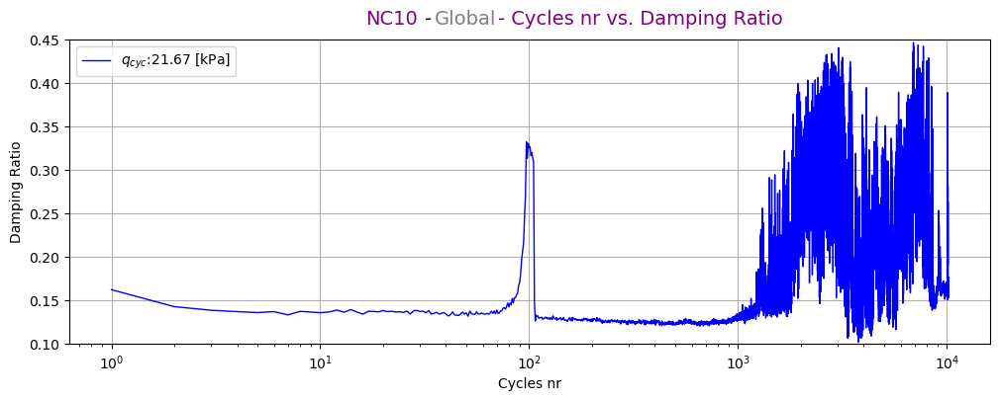

In [89]:

plt.figure(figsize=(12, 4)) 

x_values_G = cycle_info_NC10_G['Loop_Number']
y_values_G = cycle_info_NC10_G['Damping_ratio']
y_series_G = pd.Series(y_values_G)
moving_avg_G = y_series_G.rolling(100).mean()

plt.figure(figsize=(12, 4)) 
plt.plot(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC10:.2f} [kPa]', linewidth=1)
#plt.plot(x_values_G, moving_avg_G, color='lightgreen') #, label='Moving Average')
plt.legend(loc='upper left')
plt.ylim([0.1, 0.45])
plt.xscale('log')
plt.xlabel("Cycles nr")
plt.ylabel("Damping Ratio")
plt.text(0.35, 1.05, 'NC10', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.39, 1.05, '-', fontsize=14, color='black', ha='center', transform=plt.gca().transAxes)
plt.text(0.43, 1.05, 'Global', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.62, 1.05, '- Cycles nr vs. Damping Ratio', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()





## Secant Stiffness E & Time

<Figure size 1200x400 with 0 Axes>

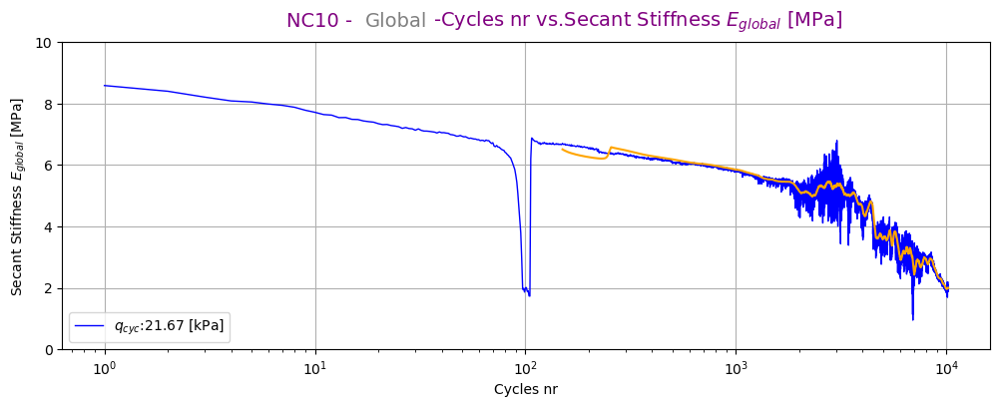

In [90]:
plt.figure(figsize=(12, 4)) 
window_size = 100
x_values_G = cycle_info_NC10_G['Loop_Number']
y_values_G = cycle_info_NC10_G['E(MPa)']
y_series_G = pd.Series(y_values_G)
moving_avg_G = y_series_G.rolling(150).mean()

plt.figure(figsize=(12, 4)) 
plt.plot(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC10:.2f} [kPa]', linewidth=1)
plt.plot(x_values_G, moving_avg_G, color='orange')#, label='Moving Average')
plt.ylim([0, 10])
plt.xscale('log')
plt.legend(loc='lower left')
plt.xlabel("Cycles nr")
plt.ylabel("Secant Stiffness $E_{global}$ [MPa]")
plt.text(0.28, 1.05, 'NC10 - ', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.36, 1.05, 'Global', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.62, 1.05, '-Cycles nr vs.Secant Stiffness $E_{global}$ [MPa]', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()

## Shear Modulus G

<Figure size 1200x400 with 0 Axes>

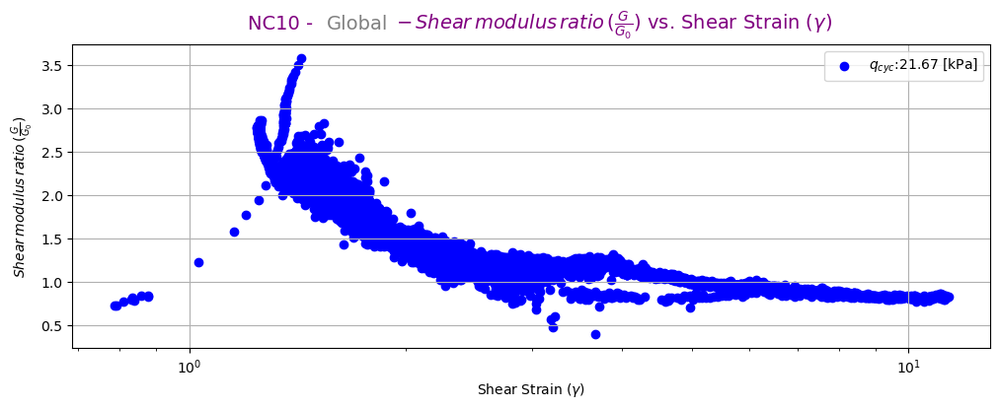

In [91]:
plt.figure(figsize=(12, 4)) 
window_size = 100
x_values_G = unp.nominal_values(cycle_info_NC10_G['Shear Strain'])
y_values_G = unp.nominal_values(cycle_info_NC10_G['Shear_modulus_(MPa)'])
y_series_G = pd.Series(y_values_G)
moving_avg_G_1 = y_series_G.rolling(3000).mean()


plt.figure(figsize=(12, 4)) 
plt.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC10:.2f} [kPa]', linewidth=1)
#plt.plot(x_values_G, moving_avg_G_1, color='orange', label='Moving Average')

#plt.ylim([200, 350])
plt.legend(loc='upper right')
plt.xscale('log')
plt.xlabel(r'Shear Strain $\gamma$ %')
plt.ylabel(r'$Shear\, modulus\, ratio\,(\frac{G}{G_0}$)')
plt.xlabel(r'Shear Strain ($\gamma$)')
plt.text(0.23, 1.05, 'NC10 - ', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.31, 1.05, 'Global', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.59, 1.05, r'$-\,Shear\, modulus\, ratio\,(\frac{G}{G_0}$) vs. Shear Strain ($\gamma$)', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()



## G/G0

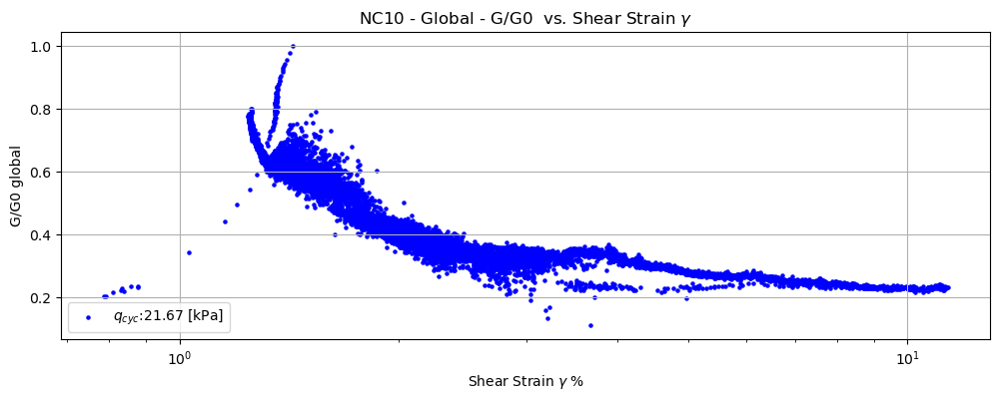

In [92]:

window_size = 100
# G/G0  global
Gmax_NC10_G = np.max(cycle_info_NC10_G['Shear_modulus_(MPa)'])

x_values_G = unp.nominal_values(cycle_info_NC10_G['Shear Strain'])
y_values_G = unp.nominal_values(cycle_info_NC10_G['Shear_modulus_(MPa)']) / unp.nominal_values(Gmax_NC10_G)

y_series_G_1 = pd.Series(y_values_G)
moving_avg_G_1 = y_series_G_1.rolling(150).mean()



plt.figure(figsize=(12, 4)) 
plt.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC10:.2f} [kPa]', s=5)
#plt.plot(x_values_G_1, moving_avg_G_1, color='orange', label='Moving Average')
#plt.plot(x_values_G_2, moving_avg_G_2, color='orange')
#plt.ylim([200, 350])
plt.xscale('log')
plt.legend(loc='lower left')
plt.xlabel(r'Shear Strain $\gamma$ %')
plt.ylabel(r'G/G0 global')
plt.title(r'NC10 - Global - G/G0  vs. Shear Strain $\gamma$')
plt.grid(True)
plt.show()


## PWP $\Delta \text{{u}}$

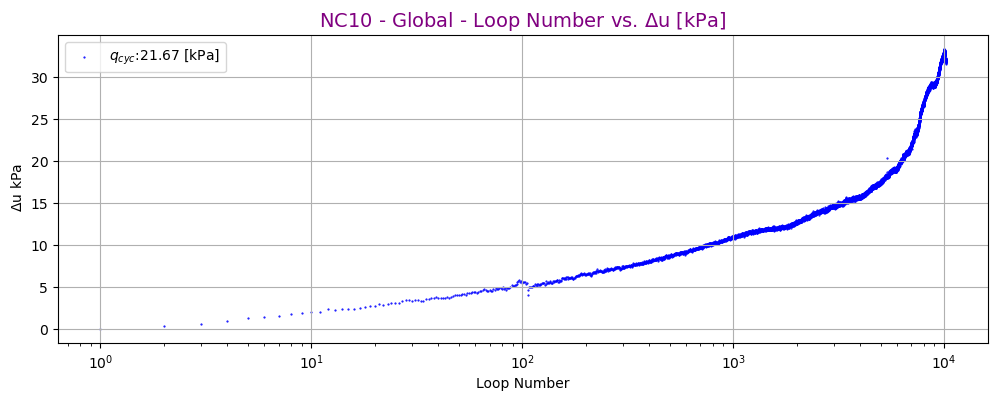

In [93]:
window_size = 10
x_values_G = cycle_info_NC10_G['Loop_Number']
y_values_G = unp.nominal_values(cycle_info_NC10_G['delta_pwp'])
y_series_G = pd.Series(y_values_G)
moving_avg_G = y_series_G_1.rolling(100).mean()


plt.figure(figsize=(12, 4)) 
plt.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC10:.2f} [kPa]', s=0.3)
#plt.plot(x_values_G, moving_avg_G, color='orange')
plt.legend(loc='upper left')
plt.xscale('log')
plt.xlabel(r'Loop Number')
plt.ylabel(r' $\Delta$u kPa')
plt.title(r'NC10 - Global - Loop Number vs. $\Delta$u [kPa]', fontsize=14, color='purple')
plt.grid(True)
plt.show()


# NC11

## Reading the data with its cycles

In [94]:
# To read the CSV file and identify each cycle separately, you can use:                                   
Path_df_NC11_new = os.path.join('Outputs_csv', 'df_NC11_new.csv')
df_NC11_new = pd.read_csv(Path_df_NC11_new)
df_NC11_new = convert_uncertainty_columns(df_NC11_new)

cycles_NC11 = {}
for cycle_nr in df_NC11_new['Cycle nr'].unique():
    cycles_NC11[cycle_nr] = df_NC11_new[df_NC11_new['Cycle nr'] == cycle_nr]

Path_cycle_info_NC11_G = os.path.join('Outputs_csv', 'cycle_info_NC11_G.csv')
cycle_info_NC11_G = pd.read_csv(Path_cycle_info_NC11_G)
cycle_info_NC11_G = convert_uncertainty_columns(cycle_info_NC11_G)


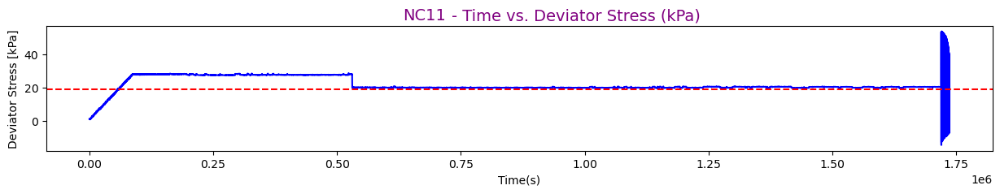

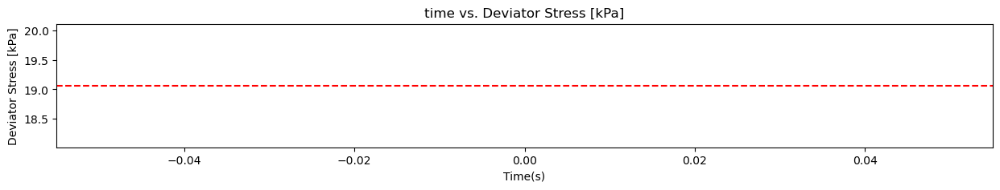

In [95]:
X1 = 1200  #216600  #1000 
X2 = 1400  #216900  #1200
mean_val_NC11 = np.mean(df_NC11_new.loc[28886:439829,'Deviator Stress (kPa)']) 
plt.figure(figsize=(15, 2)) 
plt.plot(df_NC11_new['Time since start of test (s)'], df_NC11_new['Deviator Stress (kPa)'], color='b')        # Deviator Stress (kPa)
plt.xlabel("Time(s)")
plt.ylabel("Deviator Stress [kPa]")
#plt.title('time vs. Deviator Stress (kPa)')
plt.axhline(y=mean_val_NC11, color='r', linestyle='--', label='Mean Value')
plt.text(0.40, 1.05, 'NC11', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.56, 1.05, '- Time vs. Deviator Stress (kPa)', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.show()

X1 = 402400  #502495  #1000 
X2 = 402600 #502502  #1200 
mean_val_NC11 = np.mean(df_NC11_new.loc[28886:439829,'Deviator Stress (kPa)']) 
plt.figure(figsize=(15, 2)) 
plt.plot(df_NC11_new.loc[X1:X2, 'Time since start of test (s)'], df_NC11_new.loc[X1:X2,'Deviator Stress (kPa)'], color='b')        # Deviator Stress (kPa)
plt.xlabel("Time(s)")
plt.ylabel("Deviator Stress [kPa]")
plt.title('time vs. Deviator Stress [kPa]')
plt.axhline(y=mean_val_NC11, color='r', linestyle='--', label='Mean Value')
plt.show()

## Stage info 

In [96]:
Path_Stage_info_NC11 = os.path.join('Outputs_csv', 'Stage_info_NC11.csv')
Stage_info_NC11 = pd.read_csv(Path_Stage_info_NC11)
Stage_info_NC11 = convert_uncertainty_columns(Stage_info_NC11)

qcyc_NC11 = unp.nominal_values(Stage_info_NC11.loc[0]['qcyc'])

Stage_info_NC11

,Sample type,Stage Number,Start index,End index,Rows nr,Star time,End time,Test duration(d),Cyclic loading duration(d),Cycles nr,...,q_m,q_p,q_min,q_max,q_avg,qcyc,qcyc/p0,CSR,qc/2Su,qm/2Su
0,NC11,1,28779,36874,8096,1719594,1735837,20.089595,0.187998,89,...,20.4+/-1.1,-7.5+/-1.5,-9.37+/-0.11,49.50+/-0.11,19.157+/-0.012,29.43+/-0.08,0.595+/-0.009,0.2230+/-0.0006,0.4459+/-0.0012,0.309+/-0.016


## Axial Stress & Axial Strain

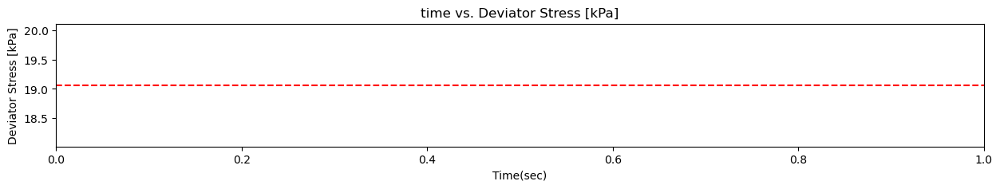

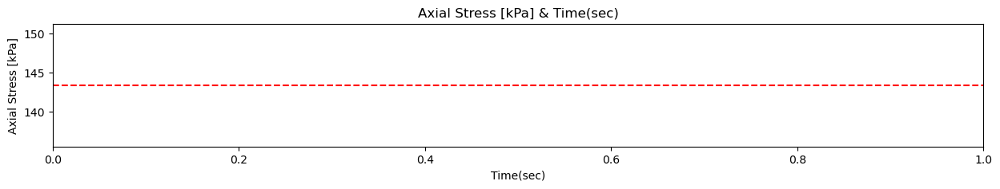

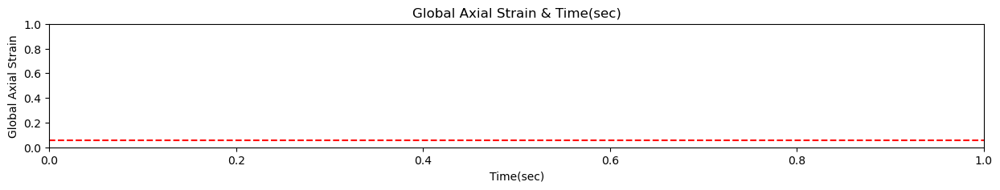

In [97]:
# The data for fitting
#['Local Axial 2 (mm)']
time = df_NC11_new.loc[: ,'Time since start of test (s)']
stress = df_NC11_new.loc[: ,'Axial Stress (kPa)']
global_strain = df_NC11_new.loc[: ,'Global Axial Strain'] 

###### Plot the data for several loops ################################# 236899
X1 = 500
X2 = 520

loop_indices = list(range(X1, X2)) 


plt.figure(figsize=(15, 2))

for i in loop_indices:
    if i < len(cycles_NC11):
      time_values = cycles_NC11[i]['Time since start of test (s)']
      stress_values = cycles_NC11[i]['Deviator Stress (kPa)']
      plt.plot(time_values, stress_values)

plt.xlabel("Time(sec)")
plt.ylabel('Deviator Stress [kPa]')
plt.title('time vs. Deviator Stress [kPa]')
plt.axhline(y=mean_val_NC11, color='r', linestyle='--', label='Mean Value')
plt.show()


plt.figure(figsize=(15, 2))
for i in loop_indices:
    if i < len(cycles_NC11):
      time = cycles_NC11[i]['Time since start of test (s)']
      stress = cycles_NC11[i]['Axial Stress (kPa)']
      plt.plot(time, stress)
      
plt.xlabel("Time(sec)")
plt.ylabel('Axial Stress [kPa]')
plt.title('Axial Stress [kPa] & Time(sec)')
plt.axhline(y=np.mean(df_NC11_new.loc[28886:439829,'Axial Stress (kPa)']), color='r', linestyle='--', label='Mean Value')
plt.show()  



plt.figure(figsize=(15, 2))
for i in loop_indices:
    if i < len(cycles_NC11):
      time = cycles_NC11[i]['Time since start of test (s)']
      global_strain = cycles_NC11[i]['Global Axial Strain']
      plt.plot(time, global_strain)
      
plt.xlabel("Time(sec)")
plt.ylabel('Global Axial Strain')
plt.title('Global Axial Strain & Time(sec)')
plt.axhline(y=np.mean(df_NC11_new.loc[28886:439829,'Global Axial Strain']), color='r', linestyle='--', label='Mean Value')
plt.show()    


##  Damping Ratio

<Figure size 1200x400 with 0 Axes>

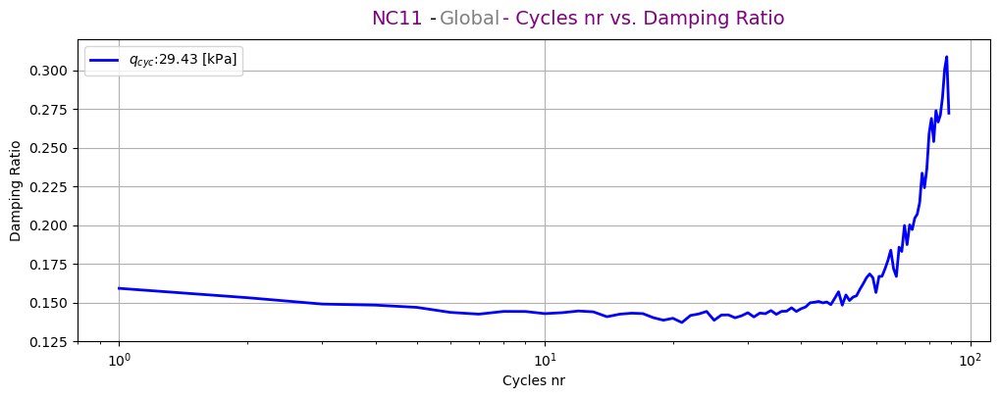

In [98]:

plt.figure(figsize=(12, 4)) 

x_values_G = cycle_info_NC11_G['Loop_Number']
y_values_G = unp.nominal_values(cycle_info_NC11_G['Damping_ratio'])
y_series_G = pd.Series(y_values_G)
moving_avg_G = y_series_G.rolling(100).mean()

plt.figure(figsize=(12, 4)) 
plt.plot(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC11:.2f} [kPa]', linewidth=2)
plt.plot(x_values_G, moving_avg_G, color='lightgreen') #, label='Moving Average')
plt.legend(loc='upper left')
plt.ylim([0.125, 0.32])
plt.xscale('log')
plt.xlabel("Cycles nr")
plt.ylabel("Damping Ratio")
plt.text(0.35, 1.05, 'NC11', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.39, 1.05, '-', fontsize=14, color='black', ha='center', transform=plt.gca().transAxes)
plt.text(0.43, 1.05, 'Global', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.62, 1.05, '- Cycles nr vs. Damping Ratio', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()


## Secant Stiffness E & Time

<Figure size 1200x400 with 0 Axes>

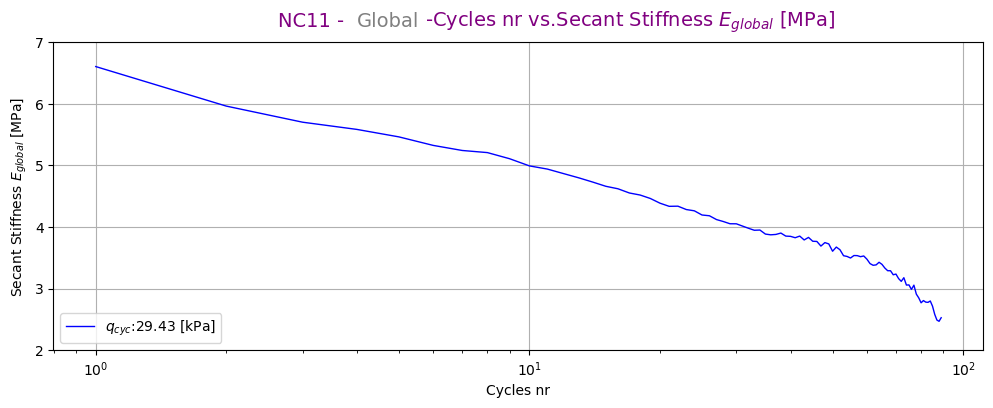

In [99]:
plt.figure(figsize=(12, 4)) 
window_size = 100
x_values_G = cycle_info_NC11_G['Loop_Number']
y_values_G = cycle_info_NC11_G['E(MPa)']
y_series_G = pd.Series(y_values_G)
moving_avg_G = y_series_G.rolling(150).mean()

plt.figure(figsize=(12, 4)) 
plt.plot(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC11:.2f} [kPa]', linewidth=1)
#plt.plot(x_values_G, moving_avg_G, color='orange', label='Moving Average')
plt.ylim([2, 7])
plt.xscale('log')
plt.legend(loc='lower left')
plt.xlabel("Cycles nr")
plt.ylabel("Secant Stiffness $E_{global}$ [MPa]")
plt.text(0.28, 1.05, 'NC11 - ', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.36, 1.05, 'Global', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.62, 1.05, '-Cycles nr vs.Secant Stiffness $E_{global}$ [MPa]', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()

## Shear Modulus G

<Figure size 1200x400 with 0 Axes>

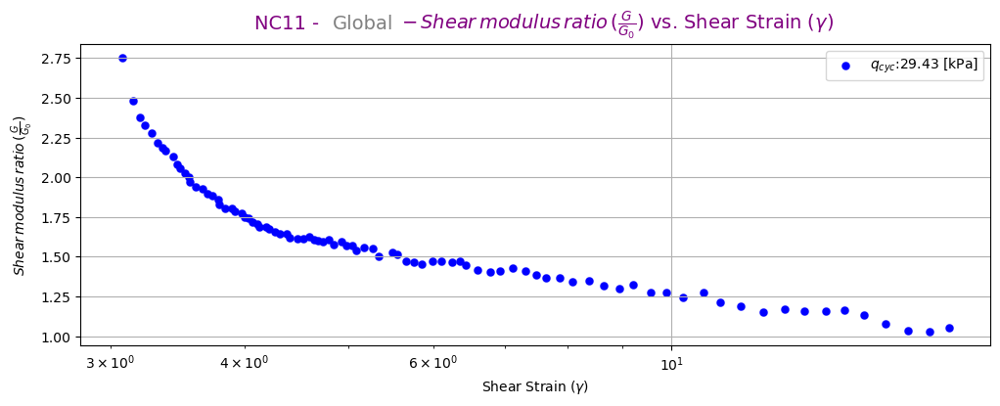

In [100]:
plt.figure(figsize=(12, 4)) 
window_size = 100
x_values_G = unp.nominal_values(cycle_info_NC11_G['Shear Strain'])
y_values_G = unp.nominal_values(cycle_info_NC11_G['Shear_modulus_(MPa)'])
y_series_G = pd.Series(y_values_G)
moving_avg_G_1 = y_series_G.rolling(150).mean()


plt.figure(figsize=(12, 4)) 
plt.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC11:.2f} [kPa]', linewidth=0.1)
#plt.plot(x_values_G_1, moving_avg_G_1, color='orange', label='Moving Average')
#plt.plot(x_values_G_2, moving_avg_G_2, color='orange')
#plt.ylim([200, 350])
plt.legend(loc='upper right')
plt.xscale('log')
plt.xlabel(r'Shear Strain $\gamma$ %')
plt.ylabel(r'$Shear\, modulus\, ratio\,(\frac{G}{G_0}$)')
plt.xlabel(r'Shear Strain ($\gamma$)')
plt.text(0.23, 1.05, 'NC11 - ', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.31, 1.05, 'Global', fontsize=14, color='Gray', ha='center', transform=plt.gca().transAxes)
plt.text(0.59, 1.05, r'$-\,Shear\, modulus\, ratio\,(\frac{G}{G_0}$) vs. Shear Strain ($\gamma$)', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()



## G/G0

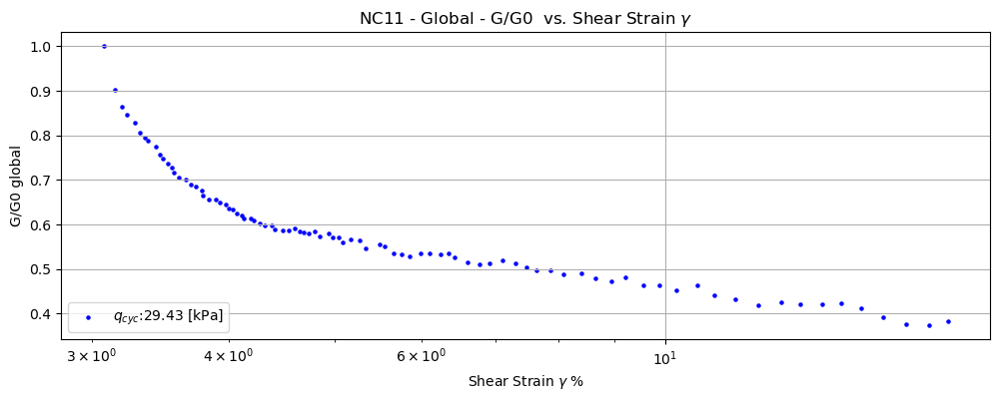

In [101]:

window_size = 100
# G/G0  global
Gmax_NC11_G = np.max(cycle_info_NC11_G['Shear_modulus_(MPa)'])

x_values_G = unp.nominal_values(cycle_info_NC11_G['Shear Strain'])
y_values_G = unp.nominal_values(cycle_info_NC11_G['Shear_modulus_(MPa)']) / unp.nominal_values(Gmax_NC11_G)

y_series_G_1 = pd.Series(y_values_G)
moving_avg_G_1 = y_series_G_1.rolling(150).mean()



plt.figure(figsize=(12, 4)) 
plt.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC11:.2f} [kPa]', s=5)
#plt.plot(x_values_G_1, moving_avg_G_1, color='orange', label='Moving Average')
#plt.plot(x_values_G_2, moving_avg_G_2, color='orange')
#plt.ylim([200, 350])
plt.xscale('log')
plt.legend(loc='lower left')
plt.xlabel(r'Shear Strain $\gamma$ %')
plt.ylabel(r'G/G0 global')
plt.title(r'NC11 - Global - G/G0  vs. Shear Strain $\gamma$')
plt.grid(True)
plt.show()


## PWP $\Delta \text{{u}}$

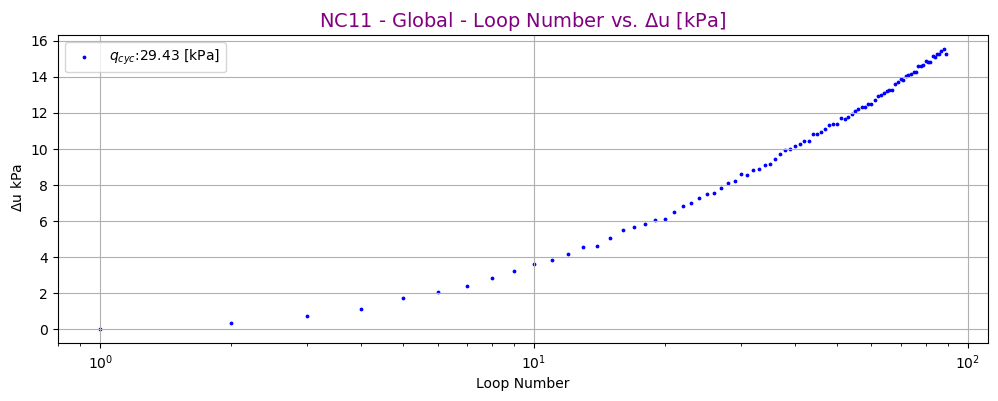

In [102]:
window_size = 10
x_values_G = cycle_info_NC11_G['Loop_Number']
y_values_G = unp.nominal_values(cycle_info_NC11_G['delta_pwp'])
y_series_G = pd.Series(y_values_G)
moving_avg_G = y_series_G_1.rolling(100).mean()


plt.figure(figsize=(12, 4)) 
plt.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC11:.2f} [kPa]', s=3)
#plt.plot(x_values_G, moving_avg_G, color='orange')
plt.legend(loc='upper left')
plt.xscale('log')
plt.xlabel(r'Loop Number')
plt.ylabel(r' $\Delta$u kPa')
plt.title(r'NC11 - Global - Loop Number vs. $\Delta$u [kPa]', fontsize=14, color='purple')
plt.grid(True)
plt.show()


# Combination

## Stage info For all samples

In [103]:
# Combine the stage info
combined_stage_info = pd.concat([Stage_info_LCC03, Stage_info_LCC17, 
Stage_info_NC04, Stage_info_NC05, Stage_info_NC06, Stage_info_NC07,
Stage_info_NC08, Stage_info_NC09, Stage_info_NC10, Stage_info_NC11], 
keys=['LCC03', 'LCC17','NC04', 'NC05', 'NC06','NC07','NC08','NC09','NC10','NC11'])

Path_combined_stage_info = os.path.join('Outputs_csv', 'combined_stage_info.csv')
combined_stage_info.to_csv(Path_combined_stage_info, index=False)
combined_stage_info


Sample type  Stage Number  Start index  End index  Rows nr  Star time  \
LCC03 0       LCC03             1         1103     166709   165607      65614   
      1       LCC03             2       166710     415166   248457    2850886   
LCC17 0       LCC17             1         1026     216770   215745      61498   
      1       LCC17             2       216771     603730   386960    1872964   
NC04  0        NC04             1        28885     439870   410986    1722356   
NC05  0        NC05             1         8883     744042   735160     532920   
NC06  0        NC06             1        15851    1412213  1396363     158580   
NC07  0        NC07             1        11554    2400346  2388793     693322   
NC08  0        NC08             1        25799      80311    54513    1546320   
NC09  0        NC09             1         2733     528093   525361     163918   
NC10  0        NC10             1       306457    1214271   907815     925578   
NC11  0        NC11             1        28779      36874     8096    1719594   

         End time  Test duration(d)  Cyclic loading duration(d)  Cycles nr  \
LCC03 0   2850879         54.012917                   32.236863      10420   
      1   4666569         54.012917                   21.014850       6383   
LCC17 0   1872958         42.919630                   20.965972      10064   
      1   3708268         42.919630                   21.241944      10196   
NC04  0   3189337         38.120880                   16.978947       8148   
NC05  0   3189195         38.120995                   30.743924      14755   
NC06  0   5091023         60.479444                   57.088461      27401   
NC07  0   9417181        108.994965                  100.970451      48436   
NC08  0   1655516         19.162083                    1.263843        599   
NC09  0   1215882         14.072674                   12.175509       5835   
NC10  0   2760393         31.948912                   21.219757      10184   
NC11  0   1735837         20.089595                    0.187998         89   

         ...              q_m          q_p           q_min           q_max  \
LCC03 0  ...  (1.6+/-0.4)e+02            0     123.4+/-0.4     185.7+/-0.5   
      1  ...  (1.6+/-0.4)e+02            0      73.8+/-0.4     234.4+/-0.7   
LCC17 0  ...  (1.6+/-0.4)e+02            0    78.28+/-0.29     233.1+/-0.6   
      1  ...  (1.6+/-0.4)e+02            0     4.82+/-0.16     310.0+/-0.7   
NC04  0  ...       47.0+/-1.1   19.0+/-1.5  42.050+/-0.012  51.978+/-0.012   
NC05  0  ...       28.0+/-1.1            0  23.196+/-0.009  33.055+/-0.009   
NC06  0  ...       29.7+/-1.1            0  19.135+/-0.006  38.903+/-0.006   
NC07  0  ...       29.1+/-1.1            0   9.841+/-0.008  48.958+/-0.008   
NC08  0  ...       37.7+/-1.1    9.2+/-1.5    17.22+/-0.04    56.27+/-0.04   
NC09  0  ...       28.3+/-1.1            0   1.358+/-0.014  55.641+/-0.014   
NC10  0  ...       10.3+/-1.1  -18.4+/-1.5   -10.43+/-0.04    32.91+/-0.04   
NC11  0  ...       20.4+/-1.1   -7.5+/-1.5    -9.37+/-0.11    49.50+/-0.11   

                    q_avg            qcyc          qcyc/p0  \
LCC03 0     154.45+/-0.11    31.11+/-0.30    0.109+/-0.006   
      1     154.12+/-0.09      80.3+/-0.4    0.282+/-0.014   
LCC17 0     155.60+/-0.10    77.41+/-0.31    0.250+/-0.011   
      1     154.72+/-0.08   152.57+/-0.35    0.493+/-0.023   
NC04  0  47.0135+/-0.0017   4.964+/-0.008  0.0922+/-0.0013   
NC05  0  28.0671+/-0.0012   4.929+/-0.006  0.0995+/-0.0015   
NC06  0  28.9950+/-0.0009   9.884+/-0.005  0.1936+/-0.0029   
NC07  0  29.0223+/-0.0012  19.559+/-0.006    0.351+/-0.005   
NC08  0    36.643+/-0.005  19.527+/-0.031    0.367+/-0.005   
NC09  0  28.1232+/-0.0015  27.141+/-0.010    0.516+/-0.008   
NC10  0     9.450+/-0.005  21.669+/-0.031    0.414+/-0.006   
NC11  0    19.157+/-0.012    29.43+/-0.08    0.595+/-0.009   

                         CSR             qc/2Su         qm/2Su  
LCC03 0    0.00794+/-0.00008  0.01589+/-0.00015  0.0

## Overview of the loading programme in qm - qcyc space

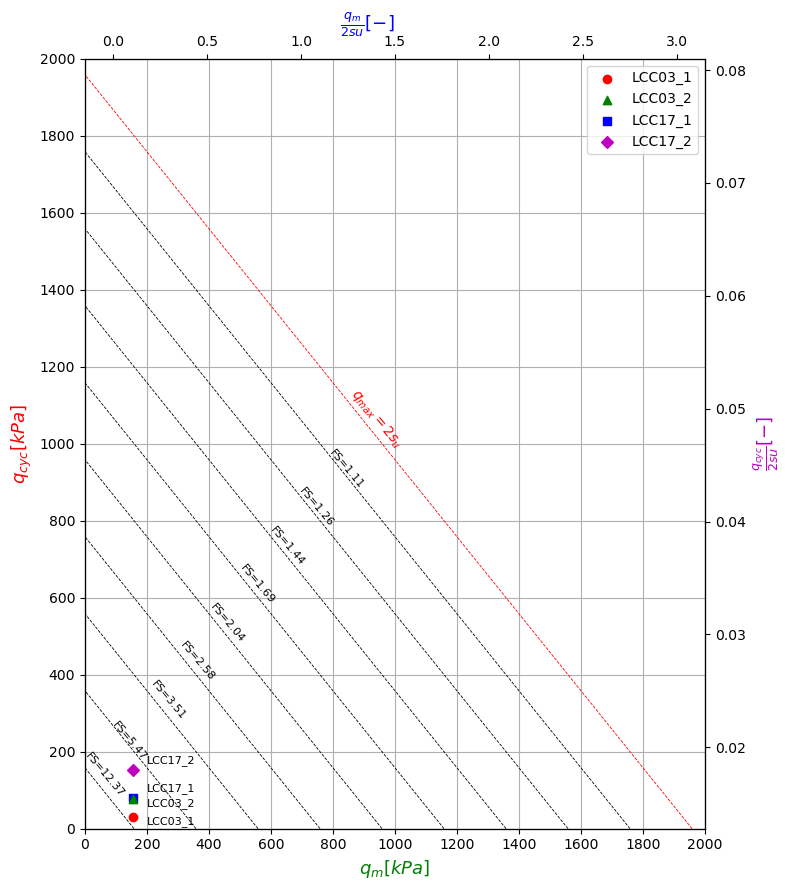

In [104]:
from matplotlib.ticker import FixedLocator, FixedFormatter
# Your data

qm_LCC03_1 = unp.nominal_values(Stage_info_LCC03.loc[0]['q_avg'])
qm_LCC03_2 = unp.nominal_values(Stage_info_LCC03.loc[1]['q_avg'])
qm_LCC17_1 = unp.nominal_values(Stage_info_LCC17.loc[0]['q_avg'])
qm_LCC17_2 = unp.nominal_values(Stage_info_LCC17.loc[1]['q_avg'])
qm = np.array([qm_LCC03_1, qm_LCC03_2, qm_LCC17_1, qm_LCC17_2])  # qm

qcyc_LCC03_1 = unp.nominal_values(Stage_info_LCC03.loc[0]['qcyc'])
qcyc_LCC03_2 = unp.nominal_values(Stage_info_LCC03.loc[1]['qcyc'])
qcyc_LCC17_1 = unp.nominal_values(Stage_info_LCC17.loc[0]['qcyc'])
qcyc_LCC17_2 = unp.nominal_values(Stage_info_LCC17.loc[1]['qcyc'])
qcyc = np.array([qcyc_LCC03_1, qcyc_LCC03_2, qcyc_LCC17_1, qcyc_LCC17_2])  # qm

# Calculating z and w axes
qm_2su = qm / (2 * Su_LCC)  # qm/(2*su)
qcyc_2su = qcyc / (2 * Su_LCC)  # qcyc/(2*su)


fig, ax1 = plt.subplots(figsize=(8, 10))



# Plot x and y on the first axes
lcc03_points1 = ax1.scatter(qm[0], qcyc[0], color='r', marker='o', label='LCC03_1')  # Plot LCC03 point 1 with blue circle
lcc17_points1 = ax1.scatter(qm[1], qcyc[1], color='b', marker='s', label='LCC17_1')  # Plot LCC17 point 1 with blue square
lcc03_points2 = ax1.scatter(qm[2], qcyc[2], color='g', marker='^', label='LCC03_2')  # Plot LCC03 point 2 with green triangle
lcc17_points2 = ax1.scatter(qm[3], qcyc[3], color='m', marker='D', label='LCC17_2')  # Plot LCC17 point 2 with magenta diamond

# Add labels for the symbols
ax1.annotate('LCC03_1', (qm[0], qcyc[0]), xytext=(10, -5), textcoords='offset points', fontsize=8)
ax1.annotate('LCC17_1', (qm[1], qcyc[1]), xytext=(10, 5), textcoords='offset points', fontsize=8)
ax1.annotate('LCC03_2', (qm[2], qcyc[2]), xytext=(10, -5), textcoords='offset points', fontsize=8)
ax1.annotate('LCC17_2', (qm[3], qcyc[3]), xytext=(10, 5), textcoords='offset points', fontsize=8)

# ax1.scatter(qm, qcyc, color='r')  # Plot the points (commented out)
ax1.set_xlabel(r'$q_{m}[kPa]$', color='g', fontsize=13)
ax1.set_ylabel(r'$q_{cyc}[kPa]$', color='r', fontsize=13)

# Set the limits of x and y to 1000
ax1.set_xlim([0, 2000])
ax1.set_ylim([0, 2000])

# Draw grid lines every 100 units
ax1.set_xticks(np.arange(0, 2001, 200), minor=False)
ax1.set_yticks(np.arange(0, 2001, 200), minor=False)
ax1.grid(True)

# Create a second x-axis for z
ax2 = ax1.twiny()
ax2.plot(qm_2su, color='white', alpha=0.1)
ax2.set_xlabel(r'$\frac{q_{m}}{2su}[-]$', color='b', fontsize=13, ha='right')

# Create a second y-axis for w
ax3 = ax1.twinx()
ax3.plot(qcyc_2su, color='white', alpha=0.1)
ax3.set_ylabel(r'$\frac{q_{cyc}}{2su}[-]$', color='m', fontsize=13)

# Draw diagonal lines
n = 10
incr = 200
Re = qf_LCC - ((n-1) * incr )
for i in range(10):
    start = Re + 200*i
    if start >= 0:  # Only draw the line if the start point is within the plot
        if i == 9:  # Check if it's the last line
            ax1.plot([start, 0], [0, start], 'r--', linewidth=0.6)  # Line goes from (0, 0) to (start, start)
            ax1.text(0.48*start, 0.5*start, r'$q_{max} = 2s_{u}$', fontsize=10, color='r', ha='center', va='bottom', rotation=310)  # Add label for the last line
        elif i == 0 or i == 1:
            ax1.plot([start, 0], [0, start], 'k--', linewidth=0.6)  # Line goes from (0, 0) to (start, start)
            ax1.text(0.40*start, 0.48*start, f'FS={((qf_LCC)/start):.2f}', fontsize=8, color='k', ha='center', va='bottom', rotation=310)  # Add label for other lines
        else: 
           ax1.plot([start, 0], [0, start], 'k--', linewidth=0.6)  # Line goes from (0, 0) to (start, start)
           ax1.text(0.48*start, 0.5*start, f'FS={((qf_LCC)/start):.2f}', fontsize=8, color='k', ha='center', va='bottom', rotation=310)  # Add label for other lines

ax1.legend(handles=[lcc03_points1, lcc03_points2, lcc17_points1, lcc17_points2], labels=['LCC03_1', 'LCC03_2', 'LCC17_1', 'LCC17_2'], loc='upper right')
plt.show()

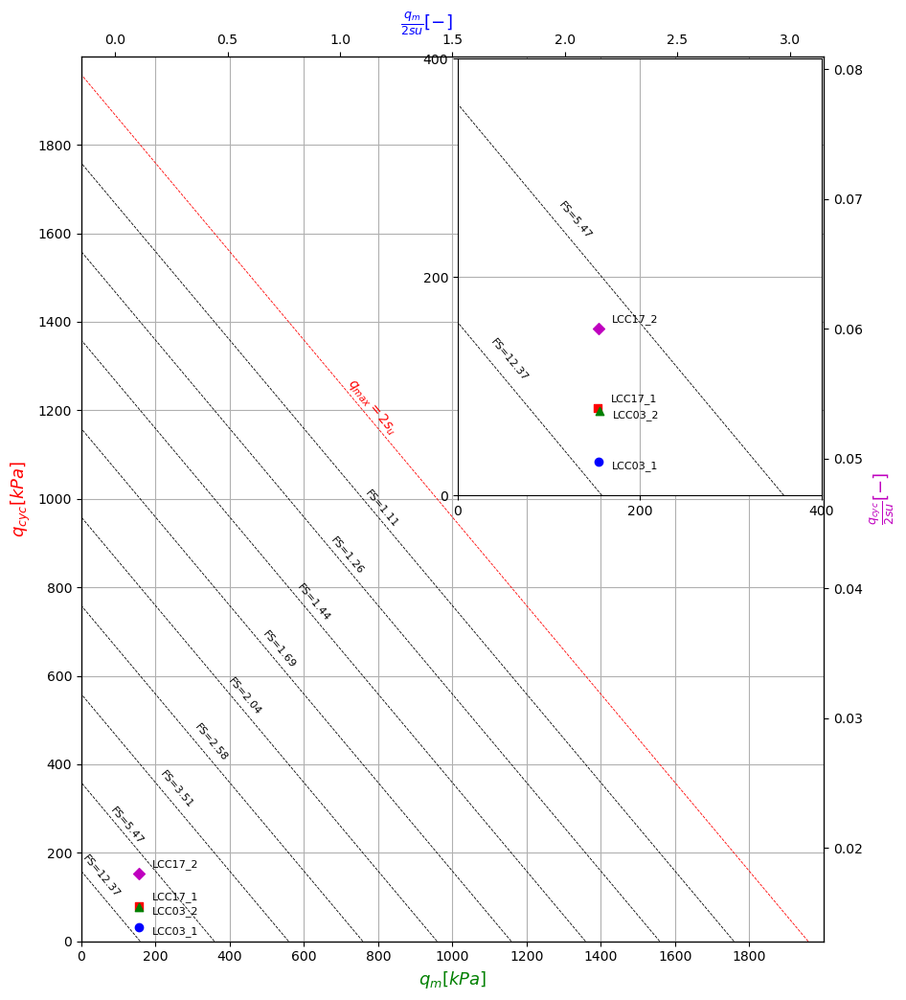

In [105]:

# Your data

qm_LCC03_1 = unp.nominal_values(Stage_info_LCC03.loc[0]['q_avg'])
qm_LCC03_2 = unp.nominal_values(Stage_info_LCC03.loc[1]['q_avg'])
qm_LCC17_1 = unp.nominal_values(Stage_info_LCC17.loc[0]['q_avg'])
qm_LCC17_2 = unp.nominal_values(Stage_info_LCC17.loc[1]['q_avg'])
qm = np.array([qm_LCC03_1, qm_LCC03_2, qm_LCC17_1, qm_LCC17_2])  # qm

qcyc_LCC03_1 = unp.nominal_values(Stage_info_LCC03.loc[0]['qcyc'])
qcyc_LCC03_2 = unp.nominal_values(Stage_info_LCC03.loc[1]['qcyc'])
qcyc_LCC17_1 = unp.nominal_values(Stage_info_LCC17.loc[0]['qcyc'])
qcyc_LCC17_2 = unp.nominal_values(Stage_info_LCC17.loc[1]['qcyc'])
qcyc = np.array([qcyc_LCC03_1, qcyc_LCC03_2, qcyc_LCC17_1, qcyc_LCC17_2])  # qm




# Calculating z and w axes
qm_2su = qm / (2 * Su_LCC)  # qm/(2*su)
qcyc_2su = qcyc / (2 * Su_LCC)  # qcyc/(2*su)

fig, ax1 = plt.subplots(figsize=(10, 12))

# Plot x and y on the first axes
lcc03_points1 = ax1.scatter(qm[0], qcyc[0], color='b', marker='o', label='LCC03_1')  # Plot LCC03 point 1 with blue circle
lcc17_points1 = ax1.scatter(qm[1], qcyc[1], color='r', marker='s', label='LCC17_1')  # Plot LCC17 point 1 with blue square
lcc03_points2 = ax1.scatter(qm[2], qcyc[2], color='g', marker='^', label='LCC03_2')  # Plot LCC03 point 2 with green triangle
lcc17_points2 = ax1.scatter(qm[3], qcyc[3], color='m', marker='D', label='LCC17_2')  # Plot LCC17 point 2 with magenta diamond

# Add labels for the symbols
ax1.annotate('LCC03_1', (qm[0], qcyc[0]), xytext=(10, -5), textcoords='offset points', fontsize=8)
ax1.annotate('LCC17_1', (qm[1], qcyc[1]), xytext=(10, 5), textcoords='offset points', fontsize=8)
ax1.annotate('LCC03_2', (qm[2], qcyc[2]), xytext=(10, -5), textcoords='offset points', fontsize=8)
ax1.annotate('LCC17_2', (qm[3], qcyc[3]), xytext=(10, 5), textcoords='offset points', fontsize=8)

# ax1.scatter(qm, qcyc, color='r')  # Plot the points (commented out)
ax1.set_xlabel(r'$q_{m}[kPa]$', color='g', fontsize=13)
ax1.set_ylabel(r'$q_{cyc}[kPa]$', color='r', fontsize=13)

# Set the limits of x and y to 1000
ax1.set_xlim([0, 2000])
ax1.set_ylim([0, 2000])

# Draw grid lines every 100 units
ax1.set_xticks(np.arange(0, 2000, 200), minor=False)
ax1.set_yticks(np.arange(0, 2000, 200), minor=False)
ax1.grid(True)

# Create a second x-axis for z
ax2 = ax1.twiny()
ax2.plot(qm_2su, color='white', alpha=0.1)
ax2.set_xlabel(r'$\frac{q_{m}}{2su}[-]$', color='b', fontsize=13, ha='right')

# Create a second y-axis for w
ax3 = ax1.twinx()
ax3.plot(qcyc_2su, color='white', alpha=0.1)
ax3.set_ylabel(r'$\frac{q_{cyc}}{2su}[-]$', color='m', fontsize=13)




# Create a new axis for the "small scale" part, sharing the same x and y axis
ax4 = plt.axes([0.518, 0.498, 0.38, 0.38], facecolor='w')

# Draw grid lines every 100 units
ax4.set_xticks(np.arange(0, 401, 200), minor=False)
ax4.set_yticks(np.arange(0, 401, 200), minor=False)
ax4.grid(True)


# Set the limits of x and y to 1000
ax4.set_xlim([0, 400])
ax4.set_ylim([0, 400])

n = 10
incr = 200
Re = qf_LCC - ((n-1) * incr )
for i in range(2):
    start = Re + 200*i
    if start >= 0:  # Only draw the line if the start point is within the plot
        if i == 0 or i == 1:
            ax4.plot([start, 0], [0, start], 'k--', linewidth=0.6)  # Line goes from (0, 0) to (start, start)
            ax4.text(0.36*start, 0.65*start, f'FS={((2*Su_LCC)/start):.2f}', fontsize=8, color='k', ha='center', va='bottom', rotation=310)  # Add label for other lines

# Plot x and y on the first axes
lcc03_points11 = ax4.scatter(qm[0], qcyc[0], color='b', marker='o', label='LCC03_1')  # Plot LCC03 point 1 with blue circle
lcc17_points11 = ax4.scatter(qm[1], qcyc[1], color='r', marker='s', label='LCC17_1')  # Plot LCC17 point 1 with blue square
lcc03_points22 = ax4.scatter(qm[2], qcyc[2], color='g', marker='^', label='LCC03_2')  # Plot LCC03 point 2 with green triangle
lcc17_points22 = ax4.scatter(qm[3], qcyc[3], color='m', marker='D', label='LCC17_2')  # Plot LCC17 point 2 with magenta diamond

# Add labels for the symbols
ax4.annotate('LCC03_1', (qm[0], qcyc[0]), xytext=(10, -5), textcoords='offset points', fontsize=8)
ax4.annotate('LCC17_1', (qm[1], qcyc[1]), xytext=(10, 5), textcoords='offset points', fontsize=8)
ax4.annotate('LCC03_2', (qm[2], qcyc[2]), xytext=(10, -5), textcoords='offset points', fontsize=8)
ax4.annotate('LCC17_2', (qm[3], qcyc[3]), xytext=(10, 5), textcoords='offset points', fontsize=8)


# Use blended transformations to position the second axis correctly
trans = BlendedGenericTransform(fig.transFigure, ax1.transAxes)
ax4.set_transform(trans)



# Draw diagonal lines
n = 10
incr = 200
Re = qf_LCC - ((n-1) * incr )
for i in range(10):
    start = Re + 200*i
    if start >= 0:  # Only draw the line if the start point is within the plot
        if i == 9:  # Check if it's the last line
            ax1.plot([start, 0], [0, start], 'r--', linewidth=0.6)  # Line goes from (0, 0) to (start, start)
            ax1.text(0.4*start, 0.58*start, r'$q_{max} = 2s_{u}$', fontsize=10, color='r', ha='center', va='bottom', rotation=310)  # Add label for the last line
        elif i == 0 or i == 1:
            ax1.plot([start, 0], [0, start], 'k--', linewidth=0.6)  # Line goes from (0, 0) to (start, start)
            ax1.text(0.34*start, 0.6*start, f'FS={((2*Su_LCC)/start):.2f}', fontsize=8, color='k', ha='center', va='bottom', rotation=310)  # Add label for other lines
        else: 
            ax1.plot([start, 0], [0, start], 'k--', linewidth=0.6)  # Line goes from (0, 0) to (start, start)
            ax1.text(0.46*start, 0.53*start, f'FS={((2*Su_LCC)/start):.2f}', fontsize=8, color='k', ha='center', va='bottom', rotation=310)  # Add label for other lines

#ax1.legend(handles=[lcc03_points1, lcc03_points2, lcc17_points1, lcc17_points2],labels=['LCC03_1', 'LCC03_2', 'LCC17_1', 'LCC17_2'], loc='upper left', bbox_to_anchor=(1600/2000, 800/2000), fontsize=10)
#ax1.legend(handles=[lcc03_points1, lcc03_points2, lcc17_points1, lcc17_points2], labels=['LCC03_1', 'LCC03_2', 'LCC17_1', 'LCC17_2'], loc='upper right')

plt.show()

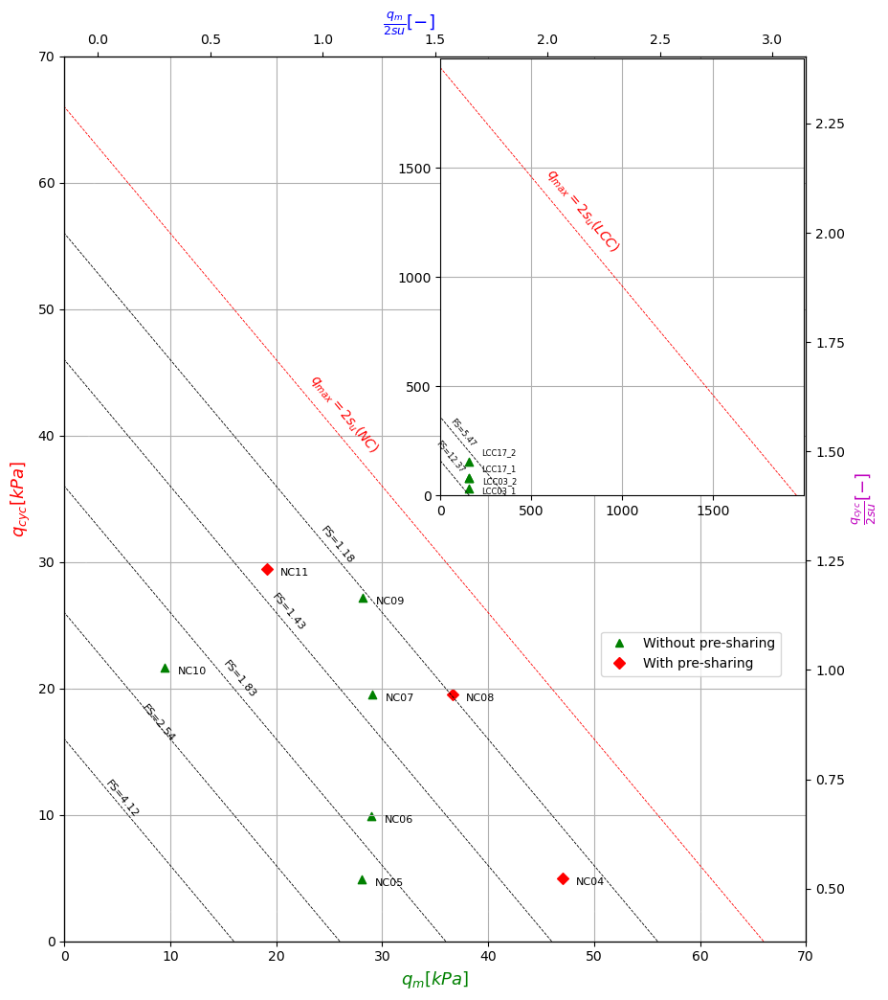

In [106]:

# Your data

qm_NC04 = unp.nominal_values(Stage_info_NC04.loc[0]['q_avg'])
qm_NC05 = unp.nominal_values(Stage_info_NC05.loc[0]['q_avg'])
qm_NC06 = unp.nominal_values(Stage_info_NC06.loc[0]['q_avg'])
qm_NC07 = unp.nominal_values(Stage_info_NC07.loc[0]['q_avg'])
qm_NC08 = unp.nominal_values(Stage_info_NC08.loc[0]['q_avg'])
qm_NC09 = unp.nominal_values(Stage_info_NC09.loc[0]['q_avg'])
qm_NC10 = unp.nominal_values(Stage_info_NC10.loc[0]['q_avg'])
qm_NC11 = unp.nominal_values(Stage_info_NC11.loc[0]['q_avg'])
qm1 = np.array([qm_NC04, qm_NC05, qm_NC06, qm_NC07, qm_NC08, qm_NC09, qm_NC10, qm_NC11])  # qm

qcyc_NC04 = unp.nominal_values(Stage_info_NC04.loc[0]['qcyc'])
qcyc_NC05 = unp.nominal_values(Stage_info_NC05.loc[0]['qcyc'])
qcyc_NC06 = unp.nominal_values(Stage_info_NC06.loc[0]['qcyc'])
qcyc_NC07 = unp.nominal_values(Stage_info_NC07.loc[0]['qcyc'])
qcyc_NC08 = unp.nominal_values(Stage_info_NC08.loc[0]['qcyc'])
qcyc_NC09 = unp.nominal_values(Stage_info_NC09.loc[0]['qcyc'])
qcyc_NC10 = unp.nominal_values(Stage_info_NC10.loc[0]['qcyc'])
qcyc_NC11 = unp.nominal_values(Stage_info_NC11.loc[0]['qcyc'])
qcyc1 = np.array([qcyc_NC04, qcyc_NC05, qcyc_NC06, qcyc_NC07, qcyc_NC08, qcyc_NC09, qcyc_NC10, qcyc_NC11]) 


# Calculating z and w axes
qm_2su = qm / (2 * Su_NC)  # qm/(2*su)
qcyc_2su = qcyc / (2 * Su_NC)  # qcyc/(2*su)

fig, ax1 = plt.subplots(figsize=(10, 12))

# Plot x and y on the first axes
nc04_points1 = ax1.scatter(qm1[0], qcyc1[0], color='r', marker='D', label='NC04')  
nc05_points1 = ax1.scatter(qm1[1], qcyc1[1], color='g', marker='^', label='NC05')  
nc06_points1 = ax1.scatter(qm1[2], qcyc1[2], color='g', marker='^', label='NC06')  
nc07_points1 = ax1.scatter(qm1[3], qcyc1[3], color='g', marker='^', label='NC07')  
nc08_points1 = ax1.scatter(qm1[4], qcyc1[4], color='r', marker='D', label='NC08')  
nc09_points1 = ax1.scatter(qm1[5], qcyc1[5], color='g', marker='^', label='NC09')  
nc10_points1 = ax1.scatter(qm1[6], qcyc1[6], color='g', marker='^', label='NC10')  
nc11_points1 = ax1.scatter(qm1[7], qcyc1[7], color='r', marker='D', label='NC11')  

# Add labels for the symbols
ax1.annotate('NC04', (qm1[0], qcyc1[0]), xytext=(10, -5), textcoords='offset points', fontsize=8)
ax1.annotate('NC05', (qm1[1], qcyc1[1]), xytext=(10, -5), textcoords='offset points', fontsize=8)
ax1.annotate('NC06', (qm1[2], qcyc1[2]), xytext=(10, -5), textcoords='offset points', fontsize=8)
ax1.annotate('NC07', (qm1[3], qcyc1[3]), xytext=(10, -5), textcoords='offset points', fontsize=8)
ax1.annotate('NC08', (qm1[4], qcyc1[4]), xytext=(10, -5), textcoords='offset points', fontsize=8)
ax1.annotate('NC09', (qm1[5], qcyc1[5]), xytext=(10, -5), textcoords='offset points', fontsize=8)
ax1.annotate('NC10', (qm1[6], qcyc1[6]), xytext=(10, -5), textcoords='offset points', fontsize=8)
ax1.annotate('NC11', (qm1[7], qcyc1[7]), xytext=(10, -5), textcoords='offset points', fontsize=8)


# ax1.scatter(qm, qcyc, color='r')  # Plot the points (commented out)
ax1.set_xlabel(r'$q_{m}[kPa]$', color='g', fontsize=13)
ax1.set_ylabel(r'$q_{cyc}[kPa]$', color='r', fontsize=13)

# Set the limits of x and y to 1000
ax1.set_xlim([0, 70])
ax1.set_ylim([0, 70])

# Draw grid lines every 100 units
ax1.set_xticks(np.arange(0, 71, 10), minor=False)
ax1.set_yticks(np.arange(0, 71, 10), minor=False)
ax1.grid(True)

# Create a second x-axis for z
ax2 = ax1.twiny()
ax2.plot(qm_2su, color='white', alpha=0.1)
ax2.set_xlabel(r'$\frac{q_{m}}{2su}[-]$', color='b', fontsize=13, ha='right')

# Create a second y-axis for w
ax3 = ax1.twinx()
ax3.plot(qcyc_2su, color='white', alpha=0.1)
ax3.set_ylabel(r'$\frac{q_{cyc}}{2su}[-]$', color='m', fontsize=13)


""" Subplot  """    

# Create a new axis for the "small scale" part, sharing the same x and y axis
ax4 = plt.axes([0.518, 0.498, 0.38, 0.38], facecolor='w')

# Set the limits of x and y to 1000
ax4.set_xlim([0, 2000])
ax4.set_ylim([0, 2000])
# Draw grid lines every 100 units
ax4.set_xticks(np.arange(0, 2000, 500), minor=False)
ax4.set_yticks(np.arange(0, 2000, 500), minor=False)
ax4.grid(True)


# Draw diagonal lines
n = 10
incr = 200
Re = qf_LCC - ((n-1) * incr )
for i in range(10):
    start = Re + 200*i
    if start >= 0:  # Only draw the line if the start point is within the plot
        if i == 9:  # Check if it's the last line
            ax4.plot([start, 0], [0, start], 'r--', linewidth=0.6)  # Line goes from (0, 0) to (start, start)
            ax4.text(0.4*start, 0.56*start, r'$q_{max} = 2s_{u} (LCC)$', fontsize=10, color='r', ha='center', va='bottom', rotation=310)  # Add label for the last line
        elif i == 0 or i == 1:
            ax4.plot([start, 0], [0, start], 'k--', linewidth=0.6)  # Line goes from (0, 0) to (start, start)
            ax4.text(0.34*start, 0.6*start, f'FS={((2*Su_LCC)/start):.2f}', fontsize=6, color='k', ha='center', va='bottom', rotation=310)  # Add label for other lines
        #else: 
        #    ax4.plot([start, 0], [0, start], 'k--', linewidth=0.6)  # Line goes from (0, 0) to (start, start)
        #    ax4.text(0.46*start, 0.53*start, f'FS={((2*Su_LCC)/start):.2f}', fontsize=8, color='k', ha='center', va='bottom', rotation=310)  # Add label for other lines

qm_LCC03_1 = unp.nominal_values(Stage_info_LCC03.loc[0]['q_avg'])
qm_LCC03_2 = unp.nominal_values(Stage_info_LCC03.loc[1]['q_avg'])
qm_LCC17_1 = unp.nominal_values(Stage_info_LCC17.loc[0]['q_avg'])
qm_LCC17_2 = unp.nominal_values(Stage_info_LCC17.loc[1]['q_avg'])
qm = np.array([qm_LCC03_1, qm_LCC03_2, qm_LCC17_1, qm_LCC17_2])  # qm

qcyc_LCC03_1 = unp.nominal_values(Stage_info_LCC03.loc[0]['qcyc'])
qcyc_LCC03_2 = unp.nominal_values(Stage_info_LCC03.loc[1]['qcyc'])
qcyc_LCC17_1 = unp.nominal_values(Stage_info_LCC17.loc[0]['qcyc'])
qcyc_LCC17_2 = unp.nominal_values(Stage_info_LCC17.loc[1]['qcyc'])
qcyc = np.array([qcyc_LCC03_1, qcyc_LCC03_2, qcyc_LCC17_1, qcyc_LCC17_2])  # qm


# Plot x and y on the first axes
lcc03_points11 = ax4.scatter(qm[0], qcyc[0], color='g', marker='^', label='LCC03_1')  # Plot LCC03 point 1 with blue circle
lcc17_points11 = ax4.scatter(qm[1], qcyc[1], color='g', marker='^', label='LCC17_1')  # Plot LCC17 point 1 with blue square
lcc03_points22 = ax4.scatter(qm[2], qcyc[2], color='g', marker='^', label='LCC03_2')  # Plot LCC03 point 2 with green triangle
lcc17_points22 = ax4.scatter(qm[3], qcyc[3], color='g', marker='^', label='LCC17_2')  # Plot LCC17 point 2 with magenta diamond

# Add labels for the symbols
ax4.annotate('LCC03_1', (qm[0], qcyc[0]), xytext=(10, -4), textcoords='offset points',fontsize=6)
ax4.annotate('LCC17_1', (qm[1], qcyc[1]), xytext=(10, 5), textcoords='offset points', fontsize=6 )
ax4.annotate('LCC03_2', (qm[2], qcyc[2]), xytext=(10, -4), textcoords='offset points',fontsize=6)
ax4.annotate('LCC17_2', (qm[3], qcyc[3]), xytext=(10, 5), textcoords='offset points', fontsize=6 )


# Use blended transformations to position the second axis correctly
trans = BlendedGenericTransform(fig.transFigure, ax1.transAxes)
ax4.set_transform(trans)

"""  """"""""""""    """

# Draw diagonal lines
n = 6
incr = 10
Re = qf_NC - ((n-1) * incr )
for i in range(6):
    start = Re + incr*i
    if start >= 0:  # Only draw the line if the start point is within the plot
        if i == 5:  # Check if it's the last line
            ax1.plot([start, 0], [0, start], 'r--', linewidth=0.6)  # Line goes from (0, 0) to (start, start)
            ax1.text(0.4*start, 0.58*start, r'$q_{max} = 2s_{u} (NC)$', fontsize=10, color='r', ha='center', va='bottom', rotation=310)  # Add label for the last line
        elif i == 0 or i == 1:
            ax1.plot([start, 0], [0, start], 'k--', linewidth=0.6)  # Line goes from (0, 0) to (start, start)
            ax1.text(0.34*start, 0.6*start, f'FS={((2*Su_NC)/start):.2f}', fontsize=8, color='k', ha='center', va='bottom', rotation=310)  # Add label for other lines
        else: 
            ax1.plot([start, 0], [0, start], 'k--', linewidth=0.6)  # Line goes from (0, 0) to (start, start)
            ax1.text(0.46*start, 0.53*start, f'FS={((2*Su_NC)/start):.2f}', fontsize=8, color='k', ha='center', va='bottom', rotation=310)  # Add label for other lines

ax1.legend(handles=[  plt.Line2D([], [], marker='^', color='green', linestyle='None'),  plt.Line2D([], [], marker='D', color='red', linestyle='None')],labels=['Without pre-sharing', 'With pre-sharing'], loc='upper left', bbox_to_anchor=(50/70, 25/70), fontsize=10)
#ax1.legend(handles=[lcc03_points1, lcc03_points2, lcc17_points1, lcc17_points2], labels=['LCC03_1', 'LCC03_2', 'LCC17_1', 'LCC17_2'], loc='upper right')

plt.show()

## CRS 

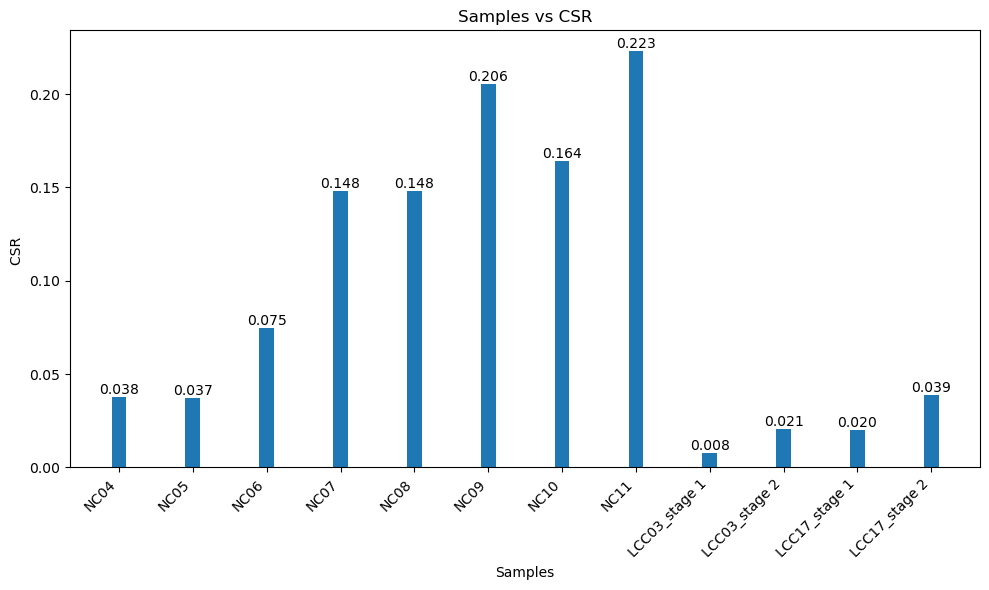

In [107]:
CSR_NC04    = unp.nominal_values(Stage_info_NC04.loc[0]['CSR'])
CSR_NC05    = unp.nominal_values(Stage_info_NC05.loc[0]['CSR'])
CSR_NC06    = unp.nominal_values(Stage_info_NC06.loc[0]['CSR'])
CSR_NC07    = unp.nominal_values(Stage_info_NC07.loc[0]['CSR'])
CSR_NC08    = unp.nominal_values(Stage_info_NC08.loc[0]['CSR'])
CSR_NC09    = unp.nominal_values(Stage_info_NC09.loc[0]['CSR'])
CSR_NC10    = unp.nominal_values(Stage_info_NC10.loc[0]['CSR'])
CSR_NC11    = unp.nominal_values(Stage_info_NC11.loc[0]['CSR'])
CSR_LCC03_1 = unp.nominal_values(Stage_info_LCC03.loc[0]['CSR'])
CSR_LCC03_2 = unp.nominal_values(Stage_info_LCC03.loc[1]['CSR'])
CSR_LCC17_1 = unp.nominal_values(Stage_info_LCC17.loc[0]['CSR'])
CSR_LCC17_2 = unp.nominal_values(Stage_info_LCC17.loc[1]['CSR'])

CSR = np.array([CSR_NC04, CSR_NC05, CSR_NC06, CSR_NC07, CSR_NC08, CSR_NC09, CSR_NC10, CSR_NC11, CSR_LCC03_1, CSR_LCC03_2, CSR_LCC17_1, CSR_LCC17_2]) 
labels = ['NC04', 'NC05', 'NC06', 'NC07', 'NC08', 'NC09', 'NC10', 'NC11', 'LCC03_stage 1', 'LCC03_stage 2', 'LCC17_stage 1', 'LCC17_stage 2']

# Create a bar plot
plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.bar(labels, CSR, width=0.2)
plt.xlabel('Samples')
plt.ylabel('CSR ')
plt.title('Samples vs CSR')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for readability
# Add values on top of bars
for i, v in enumerate(CSR):
    plt.text(i, v, f"{v:.3f}", ha='center', va='bottom')  # Adjust vertical alignment as needed

plt.tight_layout()

# Display the plot
plt.show()


## E & qcyc LCC global

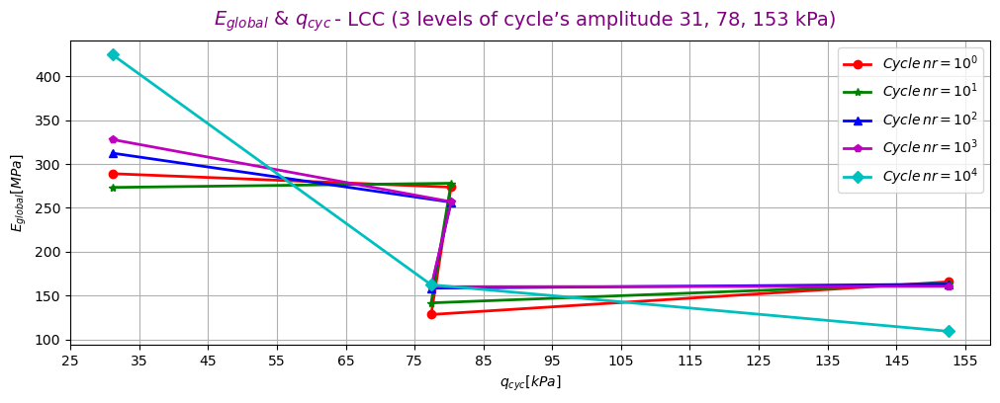

For LCC global:

Min_Strain_min: 2.05*10^-4 %
Max_Strain_min: 1.39*10^-4 %
avg_Strain_min: 1.72*10^-4 %


Min_Strain_max: 1.68*10^-3 %
Max_Strain_max: 2.97*10^-3 %
avg_Strain_max: 2.33*10^-3 %


In [177]:

n0 = 10**0 ; n1 = 10**1 ; n2 = 10**2 ; n3 = 10**3 ; n4 = 10**4 

qcyc_10 = unp.nominal_values(Stage_info_LCC03.loc[0]['qcyc'])      
qcyc_20 = unp.nominal_values(Stage_info_LCC03.loc[1]['qcyc'])    
qcyc_30 = unp.nominal_values(Stage_info_LCC17.loc[0]['qcyc'])  
qcyc_40 = unp.nominal_values(Stage_info_LCC17.loc[1]['qcyc'])  
qcyc_E = np.array([qcyc_10, qcyc_20, qcyc_30, qcyc_40])        

E_global_10    = unp.nominal_values(cycle_info_LCC03_G_1.loc[n0]['E(MPa)']) ; E_global_11    = unp.nominal_values(cycle_info_LCC03_G_1.loc[n1]['E(MPa)']) 
E_global_20    = unp.nominal_values(cycle_info_LCC03_G_2.loc[n0]['E(MPa)']) ; E_global_21    = unp.nominal_values(cycle_info_LCC03_G_2.loc[n1]['E(MPa)']) 
E_global_30    = unp.nominal_values(cycle_info_LCC17_G_1.loc[n0]['E(MPa)']) ; E_global_31    = unp.nominal_values(cycle_info_LCC17_G_1.loc[n1]['E(MPa)']) 
E_global_40    = unp.nominal_values(cycle_info_LCC17_G_2.loc[n0]['E(MPa)']) ; E_global_41    = unp.nominal_values(cycle_info_LCC17_G_2.loc[n1]['E(MPa)']) 
E_global_0     = np.array([E_global_10, E_global_20, E_global_30, E_global_40])         ; E_global_1     = np.array([E_global_11, E_global_21, E_global_31, E_global_41])  

E_global_12    = unp.nominal_values(cycle_info_LCC03_G_1.loc[n2]['E(MPa)']) ; E_global_13    = unp.nominal_values(cycle_info_LCC03_G_1.loc[n3]['E(MPa)']) 
E_global_22    = unp.nominal_values(cycle_info_LCC03_G_2.loc[n2]['E(MPa)']) ; E_global_23    = unp.nominal_values(cycle_info_LCC03_G_2.loc[n3]['E(MPa)']) 
E_global_32    = unp.nominal_values(cycle_info_LCC17_G_1.loc[n2]['E(MPa)']) ; E_global_33    = unp.nominal_values(cycle_info_LCC17_G_1.loc[n3]['E(MPa)']) 
E_global_42    = unp.nominal_values(cycle_info_LCC17_G_2.loc[n2]['E(MPa)']) ; E_global_43    = unp.nominal_values(cycle_info_LCC17_G_2.loc[n3]['E(MPa)']) 
E_global_2     = np.array([E_global_12, E_global_22, E_global_32, E_global_42])         ; E_global_3     = np.array([E_global_13, E_global_23, E_global_33, E_global_43])  


E_global_14    = unp.nominal_values(cycle_info_LCC03_G_1.loc[n4]['E(MPa)']) 
E_global_34    = unp.nominal_values(cycle_info_LCC17_G_1.loc[n4]['E(MPa)']) 
E_global_44    = unp.nominal_values(cycle_info_LCC17_G_2.loc[n4]['E(MPa)']) 
qcyc_E4 = np.array([qcyc_10, qcyc_30, qcyc_40])
E_global_4     = np.array([E_global_14, E_global_34, E_global_44])     

plt.figure(figsize=(12, 4)) 
plt.plot(qcyc_E, E_global_0, color='r', marker='o', linewidth=2, label=r'$Cycle\,  nr = 10^{0}$')
plt.plot(qcyc_E, E_global_1, color='g', marker='*', linewidth=2, label=r'$Cycle\,  nr = 10^{1}$')
plt.plot(qcyc_E, E_global_2, color='b', marker='^', linewidth=2, label=r'$Cycle\,  nr = 10^{2}$')
plt.plot(qcyc_E, E_global_3, color='m', marker='p', linewidth=2, label=r'$Cycle\,  nr = 10^{3}$')
plt.plot(qcyc_E4, E_global_4, color='c', marker='D', linewidth=2, label=r'$Cycle\, nr = 10^{4}$')

plt.legend(loc='upper right')
plt.xlabel(r'$q_{cyc} [kPa]$')
plt.ylabel(r'$E_{global} [MPa]$')
plt.xticks(np.arange(25, 161, 10), minor=False)
#plt.set_yticks(np.arange(0, 2001, 200), minor=False)
plt.text(0.22, 1.05, r'$E_{global} \,\,  & \,\,  q_{cyc}$', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.56, 1.05, '- LCC (3 levels of cycle’s amplitude 31, 78, 153 kPa)', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()

print("For LCC global:")
print()
Min_Strain_min = unp.nominal_values(cycle_info_LCC03_G_1.loc[n0]['Delta_x'])
Max_Strain_min = unp.nominal_values(cycle_info_LCC03_G_1.loc[n4]['Delta_x']) 
avg_Strain_min = (unp.nominal_values(cycle_info_LCC03_G_1.loc[n0]['Delta_x'])+ unp.nominal_values(cycle_info_LCC03_G_1.loc[n4]['Delta_x'])) / 2
print(f'Min_Strain_min: {Min_Strain_min*1e4:.2f}*10^-4 %')
print(f'Max_Strain_min: {Max_Strain_min*1e4:.2f}*10^-4 %')
print(f'avg_Strain_min: {avg_Strain_min*1e4:.2f}*10^-4 %')
print()
print()
Min_Strain_max = unp.nominal_values(cycle_info_LCC17_G_2.loc[n0]['Delta_x']) 
Max_Strain_max = unp.nominal_values(cycle_info_LCC17_G_2.loc[n4]['Delta_x']) 
avg_Strain_max = (unp.nominal_values(cycle_info_LCC17_G_2.loc[n0]['Delta_x']) + unp.nominal_values(cycle_info_LCC17_G_2.loc[n4]['Delta_x']) ) / 2
print(f'Min_Strain_max: {Min_Strain_max*1e3:.2f}*10^-3 %')
print(f'Max_Strain_max: {Max_Strain_max*1e3:.2f}*10^-3 %')
print(f'avg_Strain_max: {avg_Strain_max*1e3:.2f}*10^-3 %')

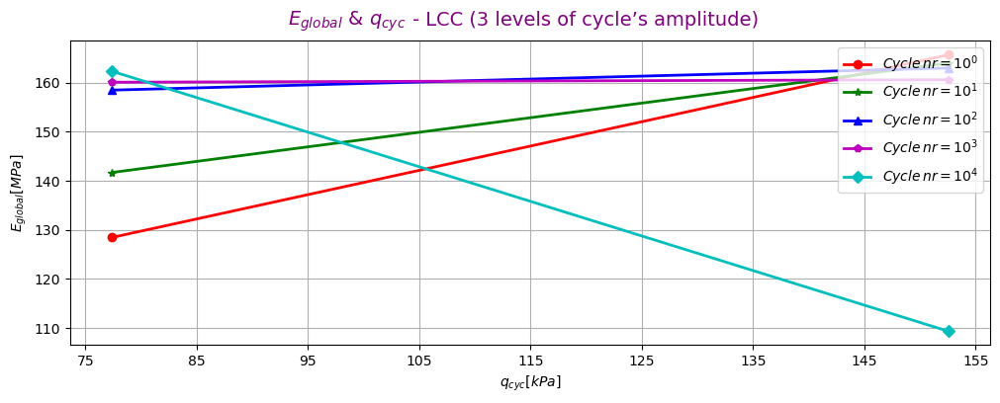

In [109]:
n0 = 10**0 ; n1 = 10**1 ; n2 = 10**2 ; n3 = 10**3 ; n4 = 10**4 

qcyc_10 = unp.nominal_values(Stage_info_LCC03.loc[0]['qcyc'])      
qcyc_20 = unp.nominal_values(Stage_info_LCC03.loc[1]['qcyc'])    
qcyc_30 = unp.nominal_values(Stage_info_LCC17.loc[0]['qcyc'])  
qcyc_40 = unp.nominal_values(Stage_info_LCC17.loc[1]['qcyc'])  
qcyc_E = np.array([qcyc_30, qcyc_40])        


E_global_30    = unp.nominal_values(cycle_info_LCC17_G_1.loc[n0]['E(MPa)']) ; E_global_31    = unp.nominal_values(cycle_info_LCC17_G_1.loc[n1]['E(MPa)']) 
E_global_40    = unp.nominal_values(cycle_info_LCC17_G_2.loc[n0]['E(MPa)']) ; E_global_41    = unp.nominal_values(cycle_info_LCC17_G_2.loc[n1]['E(MPa)']) 
E_global_0     = np.array([E_global_30, E_global_40])         ; E_global_1     = np.array([E_global_31, E_global_41])  

 
E_global_32    = unp.nominal_values(cycle_info_LCC17_G_1.loc[n2]['E(MPa)']) ; E_global_33    = unp.nominal_values(cycle_info_LCC17_G_1.loc[n3]['E(MPa)']) 
E_global_42    = unp.nominal_values(cycle_info_LCC17_G_2.loc[n2]['E(MPa)']) ; E_global_43    = unp.nominal_values(cycle_info_LCC17_G_2.loc[n3]['E(MPa)']) 
E_global_2     = np.array([E_global_32, E_global_42])         ; E_global_3     = np.array([E_global_33, E_global_43])  


E_global_14    = unp.nominal_values(cycle_info_LCC03_G_1.loc[n4]['E(MPa)']) 
E_global_34    = unp.nominal_values(cycle_info_LCC17_G_1.loc[n4]['E(MPa)']) 
E_global_44    = unp.nominal_values(cycle_info_LCC17_G_2.loc[n4]['E(MPa)']) 
qcyc_E4 = np.array([qcyc_10, qcyc_30, qcyc_40])
E_global_4     = np.array([E_global_34, E_global_44])     

plt.figure(figsize=(12, 4)) 
plt.plot(qcyc_E, E_global_0, color='r', marker='o', linewidth=2, label=r'$Cycle\,  nr = 10^{0}$')
plt.plot(qcyc_E, E_global_1, color='g', marker='*', linewidth=2, label=r'$Cycle\,  nr = 10^{1}$')
plt.plot(qcyc_E, E_global_2, color='b', marker='^', linewidth=2, label=r'$Cycle\,  nr = 10^{2}$')
plt.plot(qcyc_E, E_global_3, color='m', marker='p', linewidth=2, label=r'$Cycle\,  nr = 10^{3}$')
plt.plot(qcyc_E, E_global_4, color='c', marker='D', linewidth=2, label=r'$Cycle\, nr = 10^{4}$')

plt.legend(loc='upper right')
plt.xlabel(r'$q_{cyc} [kPa]$')
plt.ylabel(r'$E_{global} [MPa]$')
plt.xticks(np.arange(75, 161, 10), minor=False)
#plt.set_yticks(np.arange(0, 2001, 200), minor=False)
plt.text(0.30, 1.05, r'$E_{global} \,\,  & \,\,  q_{cyc}$', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.56, 1.05, '- LCC (3 levels of cycle’s amplitude)', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()

## E & qcyc LCC Local

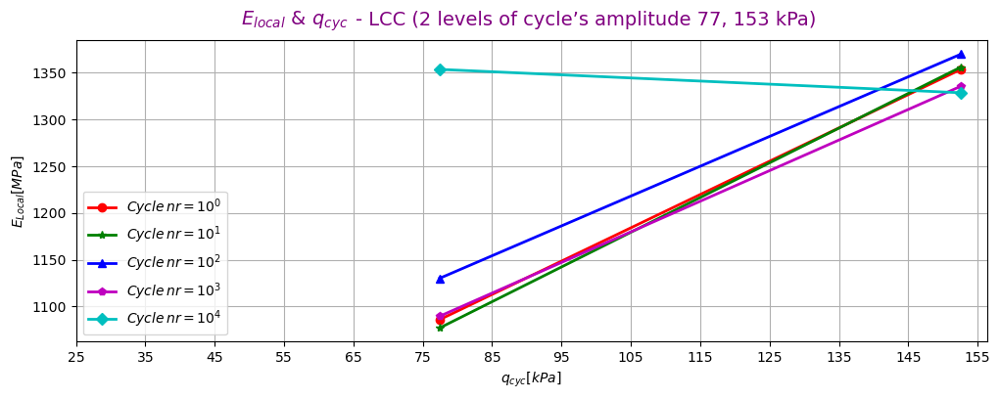

For LCC local:

Min_Strain_min: 1.24*10^-4 %
Max_Strain_min: 1.03*10^-4 %
avg_Strain_min: 1.13*10^-4 %


Min_Strain_max: 2.06*10^-4 %
Max_Strain_max: 2.26*10^-4 %
avg_Strain_max: 2.16*10^-4 %


In [179]:

n0 = 10**0 ; n1 = 10**1 ; n2 = 10**2 ; n3 = 10**3 ; n4 = 10**4 

qcyc_30 = unp.nominal_values(Stage_info_LCC17.loc[0]['qcyc'])  
qcyc_40 = unp.nominal_values(Stage_info_LCC17.loc[1]['qcyc'])  
qcyc_E = np.array([qcyc_30, qcyc_40])        


E_local_30    = unp.nominal_values(cycle_info_LCC17_L_1.loc[n0]['E(MPa)']) ; E_local_31    = unp.nominal_values(cycle_info_LCC17_L_1.loc[n1]['E(MPa)']) 
E_local_40    = unp.nominal_values(cycle_info_LCC17_L_2.loc[n0]['E(MPa)']) ; E_local_41    = unp.nominal_values(cycle_info_LCC17_L_2.loc[n1]['E(MPa)']) 
E_local_0     = np.array([E_local_30, E_local_40])         ; E_local_1     = np.array([E_local_31, E_local_41])  


E_local_32    = unp.nominal_values(cycle_info_LCC17_L_1.loc[n2]['E(MPa)']) ; E_local_33    = unp.nominal_values(cycle_info_LCC17_L_1.loc[n3]['E(MPa)']) 
E_local_42    = unp.nominal_values(cycle_info_LCC17_L_2.loc[n2]['E(MPa)']) ; E_local_43    = unp.nominal_values(cycle_info_LCC17_L_2.loc[n3]['E(MPa)']) 
E_local_2     = np.array([E_local_32, E_local_42])         ; E_local_3     = np.array([E_local_33, E_local_43])  


E_local_34    = unp.nominal_values(cycle_info_LCC17_L_1.loc[n4]['E(MPa)']) 
E_local_44    = unp.nominal_values(cycle_info_LCC17_L_2.loc[n4]['E(MPa)']) 
E_local_4     = np.array([E_local_34, E_local_44])     



plt.figure(figsize=(12, 4)) 
plt.plot(qcyc_E, E_local_0, color='r', marker='o', linewidth=2, label=r'$Cycle\,  nr = 10^{0}$')
plt.plot(qcyc_E, E_local_1, color='g', marker='*', linewidth=2, label=r'$Cycle\,  nr = 10^{1}$')
plt.plot(qcyc_E, E_local_2, color='b', marker='^', linewidth=2, label=r'$Cycle\,  nr = 10^{2}$')
plt.plot(qcyc_E, E_local_3, color='m', marker='p', linewidth=2, label=r'$Cycle\,  nr = 10^{3}$')
plt.plot(qcyc_E ,E_local_4, color='c', marker='D', linewidth=2, label=r'$Cycle\, nr = 10^{4}$')

plt.legend(loc='lower left')
plt.xlabel(r'$q_{cyc} [kPa]$')
plt.ylabel(r'$E_{Local} [MPa]$')
plt.xticks(np.arange(25, 161, 10), minor=False)
#plt.set_yticks(np.arange(0, 2001, 200), minor=False)
plt.text(0.24, 1.05, r'$E_{local} \,\,  & \,\,  q_{cyc}$', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.56, 1.05, '- LCC (2 levels of cycle’s amplitude 77, 153 kPa)', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()



print("For LCC local:")
print()
Min_Strain_min = unp.nominal_values(cycle_info_LCC17_L_1.loc[n0]['Delta_x'])
Max_Strain_min = unp.nominal_values(cycle_info_LCC17_L_1.loc[n4]['Delta_x']) 
avg_Strain_min = (unp.nominal_values(cycle_info_LCC17_L_1.loc[n0]['Delta_x'])+ unp.nominal_values(cycle_info_LCC17_L_1.loc[n4]['Delta_x'])) / 2
print(f'Min_Strain_min: {Min_Strain_min*1e4:.2f}*10^-4 %')
print(f'Max_Strain_min: {Max_Strain_min*1e4:.2f}*10^-4 %')
print(f'avg_Strain_min: {avg_Strain_min*1e4:.2f}*10^-4 %')
print()
print()
Min_Strain_max = unp.nominal_values(cycle_info_LCC17_L_2.loc[n0]['Delta_x']) 
Max_Strain_max = unp.nominal_values(cycle_info_LCC17_L_2.loc[n4]['Delta_x']) 
avg_Strain_max = (unp.nominal_values(cycle_info_LCC17_L_2.loc[n0]['Delta_x']) + unp.nominal_values(cycle_info_LCC17_L_2.loc[n4]['Delta_x']) ) / 2
print(f'Min_Strain_max: {Min_Strain_max*1e4:.2f}*10^-4 %')
print(f'Max_Strain_max: {Max_Strain_max*1e4:.2f}*10^-4 %')
print(f'avg_Strain_max: {avg_Strain_max*1e4:.2f}*10^-4 %')


## E & qcyc NC global

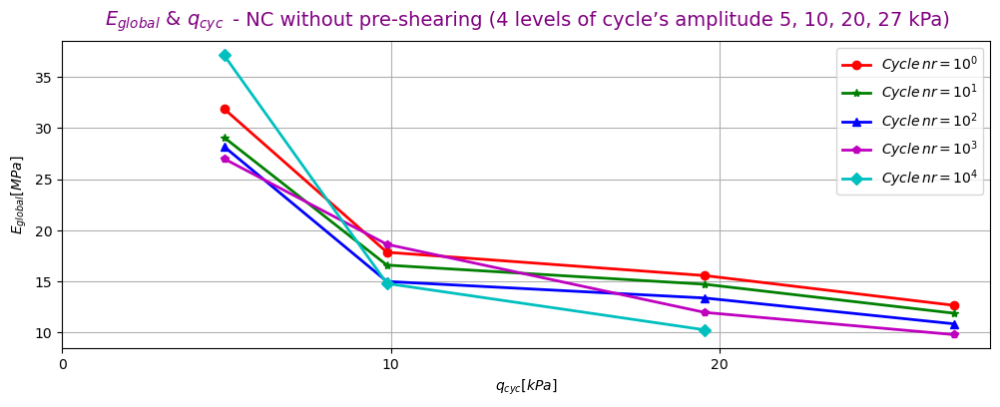

For NC:

Min_Strain_min: 2.81*10^-4 %
Max_Strain_min: 2.43*10^-4 %
avg_Strain_min: 2.62*10^-4 %


Min_Strain_max: 4.20*10^-3 %
Max_Strain_max: 3.30*10^-3 %
avg_Strain_max: 3.75*10^-3 %


In [182]:

n0 = 10**0 ; n1 = 10**1 ; n2 = 10**2 ; n3 = 10**3 ; n4 = 10**4 

   
qcyc_10 = unp.nominal_values(Stage_info_NC05.loc[0]['qcyc'])    
qcyc_20 = unp.nominal_values(Stage_info_NC06.loc[0]['qcyc'])  
qcyc_30 = unp.nominal_values(Stage_info_NC07.loc[0]['qcyc']) 
qcyc_40 = unp.nominal_values(Stage_info_NC09.loc[0]['qcyc'])  
 
qcyc_E = np.array([qcyc_10, qcyc_20, qcyc_30, qcyc_40])        

E_global_10    = unp.nominal_values(cycle_info_NC05_G.loc[n0]['E(MPa)']) ; E_global_11    = unp.nominal_values(cycle_info_NC05_G.loc[n1]['E(MPa)']) 
E_global_20    = unp.nominal_values(cycle_info_NC06_G.loc[n0]['E(MPa)']) ; E_global_21    = unp.nominal_values(cycle_info_NC06_G.loc[n1]['E(MPa)']) 
E_global_30    = unp.nominal_values(cycle_info_NC07_G.loc[n0]['E(MPa)']) ; E_global_31    = unp.nominal_values(cycle_info_NC07_G.loc[n1]['E(MPa)']) 
E_global_40    = unp.nominal_values(cycle_info_NC09_G.loc[n0]['E(MPa)']) ; E_global_41    = unp.nominal_values(cycle_info_NC09_G.loc[n1]['E(MPa)']) 
E_global_0     = np.array([E_global_10, E_global_20, E_global_30, E_global_40])         ; E_global_1     = np.array([E_global_11, E_global_21, E_global_31, E_global_41])  

E_global_12    = unp.nominal_values(cycle_info_NC05_G.loc[n2]['E(MPa)']) ; E_global_13    = unp.nominal_values(cycle_info_NC05_G.loc[n3]['E(MPa)']) 
E_global_22    = unp.nominal_values(cycle_info_NC06_G.loc[n2]['E(MPa)']) ; E_global_23    = unp.nominal_values(cycle_info_NC06_G.loc[n3]['E(MPa)']) 
E_global_32    = unp.nominal_values(cycle_info_NC07_G.loc[n2]['E(MPa)']) ; E_global_33    = unp.nominal_values(cycle_info_NC07_G.loc[n3]['E(MPa)']) 
E_global_42    = unp.nominal_values(cycle_info_NC09_G.loc[n2]['E(MPa)']) ; E_global_43    = unp.nominal_values(cycle_info_NC09_G.loc[n3]['E(MPa)']) 
E_global_2     = np.array([E_global_12, E_global_22, E_global_32, E_global_42])         ; E_global_3     = np.array([E_global_13, E_global_23, E_global_33, E_global_43])  


E_global_14    = unp.nominal_values(cycle_info_NC05_G.loc[n4]['E(MPa)']) 
E_global_24    = unp.nominal_values(cycle_info_NC06_G.loc[n4]['E(MPa)']) 
E_global_34    = unp.nominal_values(cycle_info_NC07_G.loc[n4]['E(MPa)']) 
qcyc_E4 = np.array([qcyc_10, qcyc_20, qcyc_30])
E_global_4     = np.array([E_global_14, E_global_24, E_global_34])     

plt.figure(figsize=(12, 4)) 
plt.plot(qcyc_E, E_global_0, color='r', marker='o', linewidth=2, label=r'$Cycle\,  nr = 10^{0}$')
plt.plot(qcyc_E, E_global_1, color='g', marker='*', linewidth=2, label=r'$Cycle\,  nr = 10^{1}$')
plt.plot(qcyc_E, E_global_2, color='b', marker='^', linewidth=2, label=r'$Cycle\,  nr = 10^{2}$')
plt.plot(qcyc_E, E_global_3, color='m', marker='p', linewidth=2, label=r'$Cycle\,  nr = 10^{3}$')
plt.plot(qcyc_E4, E_global_4, color='c', marker='D', linewidth=2, label=r'$Cycle\, nr = 10^{4}$')

plt.legend(loc='upper right')
plt.xlabel(r'$q_{cyc} [kPa]$')
plt.ylabel(r'$E_{global} [MPa]$')
plt.xticks(np.arange(0, 30, 10), minor=False)
#plt.set_yticks(np.arange(0, 2001, 200), minor=False)
plt.text(0.11, 1.05, r'$E_{global} \,\,  & \,\,  q_{cyc}$', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.57, 1.05, '- NC without pre-shearing (4 levels of cycle’s amplitude 5, 10, 20, 27 kPa)', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()



print("For NC:")
print()
Min_Strain_min = unp.nominal_values(cycle_info_NC05_G.loc[n0]['Delta_x'])
Max_Strain_min = unp.nominal_values(cycle_info_NC05_G.loc[n4]['Delta_x']) 
avg_Strain_min = (unp.nominal_values(cycle_info_NC05_G.loc[n0]['Delta_x'])+ unp.nominal_values(cycle_info_NC05_G.loc[n4]['Delta_x'])) / 2
print(f'Min_Strain_min: {Min_Strain_min*1e4:.2f}*10^-4 %')
print(f'Max_Strain_min: {Max_Strain_min*1e4:.2f}*10^-4 %')
print(f'avg_Strain_min: {avg_Strain_min*1e4:.2f}*10^-4 %')
print()
print()
Min_Strain_max = unp.nominal_values(cycle_info_NC09_G.loc[n0]['Delta_x']) 
Max_Strain_max = unp.nominal_values(cycle_info_NC07_G.loc[n4]['Delta_x']) 
avg_Strain_max = (unp.nominal_values(cycle_info_NC09_G.loc[n0]['Delta_x']) + unp.nominal_values(cycle_info_NC07_G.loc[n4]['Delta_x']) ) / 2
print(f'Min_Strain_max: {Min_Strain_max*1e3:.2f}*10^-3 %')
print(f'Max_Strain_max: {Max_Strain_max*1e3:.2f}*10^-3 %')
print(f'avg_Strain_max: {avg_Strain_max*1e3:.2f}*10^-3 %')


## D/E& qcyc LCC global

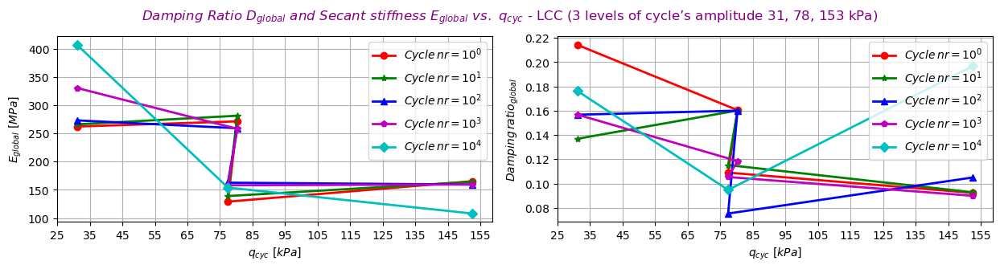

In [112]:


n0 = 10**0-1 ; n1 = 10**1 - 1 ; n2 = 10**2 - 1 ; n3 = 10**3 - 1  ; n4 = 10**4 - 1

fig, axs = plt.subplots(1, 2, figsize=(15, 3))  # 1 row, 2 columns

qcyc_10 = unp.nominal_values(Stage_info_LCC03.loc[0]['qcyc'])      
qcyc_20 = unp.nominal_values(Stage_info_LCC03.loc[1]['qcyc'])    
qcyc_30 = unp.nominal_values(Stage_info_LCC17.loc[0]['qcyc'])  
qcyc_40 = unp.nominal_values(Stage_info_LCC17.loc[1]['qcyc'])  
qcyc_E = np.array([qcyc_10, qcyc_20, qcyc_30, qcyc_40])
qcyc_E4 = np.array([qcyc_10, qcyc_30, qcyc_40])        

E_global_10    = unp.nominal_values(cycle_info_LCC03_G_1.loc[n0]['E(MPa)']) ; E_global_11    = unp.nominal_values(cycle_info_LCC03_G_1.loc[n1]['E(MPa)']) 
E_global_20    = unp.nominal_values(cycle_info_LCC03_G_2.loc[n0]['E(MPa)']) ; E_global_21    = unp.nominal_values(cycle_info_LCC03_G_2.loc[n1]['E(MPa)']) 
E_global_30    = unp.nominal_values(cycle_info_LCC17_G_1.loc[n0]['E(MPa)']) ; E_global_31    = unp.nominal_values(cycle_info_LCC17_G_1.loc[n1]['E(MPa)']) 
E_global_40    = unp.nominal_values(cycle_info_LCC17_G_2.loc[n0]['E(MPa)']) ; E_global_41    = unp.nominal_values(cycle_info_LCC17_G_2.loc[n1]['E(MPa)']) 
E_global_0     = np.array([E_global_10, E_global_20, E_global_30, E_global_40])         ; E_global_1     = np.array([E_global_11, E_global_21, E_global_31, E_global_41])  

E_global_12    = unp.nominal_values(cycle_info_LCC03_G_1.loc[n2]['E(MPa)']) ; E_global_13    = unp.nominal_values(cycle_info_LCC03_G_1.loc[n3]['E(MPa)']) 
E_global_22    = unp.nominal_values(cycle_info_LCC03_G_2.loc[n2]['E(MPa)']) ; E_global_23    = unp.nominal_values(cycle_info_LCC03_G_2.loc[n3]['E(MPa)']) 
E_global_32    = unp.nominal_values(cycle_info_LCC17_G_1.loc[n2]['E(MPa)']) ; E_global_33    = unp.nominal_values(cycle_info_LCC17_G_1.loc[n3]['E(MPa)']) 
E_global_42    = unp.nominal_values(cycle_info_LCC17_G_2.loc[n2]['E(MPa)']) ; E_global_43    = unp.nominal_values(cycle_info_LCC17_G_2.loc[n3]['E(MPa)']) 
E_global_2     = np.array([E_global_12, E_global_22, E_global_32, E_global_42])         ; E_global_3     = np.array([E_global_13, E_global_23, E_global_33, E_global_43])  


E_global_14    = unp.nominal_values(cycle_info_LCC03_G_1.loc[n4]['E(MPa)']) 
E_global_34    = unp.nominal_values(cycle_info_LCC17_G_1.loc[n4]['E(MPa)']) 
E_global_44    = unp.nominal_values(cycle_info_LCC17_G_2.loc[n4]['E(MPa)']) 
E_global_4     = np.array([E_global_14, E_global_34, E_global_44])     

axs[0].plot(qcyc_E, E_global_0, color='r', marker='o', linewidth=2, label=r'$Cycle\,  nr = 10^{0}$')
axs[0].plot(qcyc_E, E_global_1, color='g', marker='*', linewidth=2, label=r'$Cycle\,  nr = 10^{1}$')
axs[0].plot(qcyc_E, E_global_2, color='b', marker='^', linewidth=2, label=r'$Cycle\,  nr = 10^{2}$')
axs[0].plot(qcyc_E, E_global_3, color='m', marker='p', linewidth=2, label=r'$Cycle\,  nr = 10^{3}$')
axs[0].plot(qcyc_E4, E_global_4, color='c', marker='D', linewidth=2, label=r'$Cycle\, nr = 10^{4}$')
axs[0].legend(loc='upper right')
axs[0].set_xlabel(r'$q_{cyc}\,\, [kPa]$')
axs[0].set_ylabel(r'$E_{global}\,\,[MPa]$')
axs[0].set_xticks(np.arange(25, 161, 10), minor=False)
axs[0].grid(True)



qcyc_10 = unp.nominal_values(Stage_info_LCC03.loc[0]['qcyc'])      
qcyc_20 = unp.nominal_values(Stage_info_LCC03.loc[1]['qcyc'])    
qcyc_30 = unp.nominal_values(Stage_info_LCC17.loc[0]['qcyc'])  
qcyc_40 = unp.nominal_values(Stage_info_LCC17.loc[1]['qcyc'])  
qcyc_E = np.array([qcyc_10, qcyc_20, qcyc_30, qcyc_40]) 
qcyc_E4 = np.array([qcyc_10, qcyc_30, qcyc_40])       

E_global_10    = unp.nominal_values(cycle_info_LCC03_G_1.loc[n0]['Damping_ratio']) ; E_global_11    = unp.nominal_values(cycle_info_LCC03_G_1.loc[n1]['Damping_ratio']) 
E_global_20    = unp.nominal_values(cycle_info_LCC03_G_2.loc[n0]['Damping_ratio']) ; E_global_21    = unp.nominal_values(cycle_info_LCC03_G_2.loc[n1]['Damping_ratio']) 
E_global_30    = unp.nominal_values(cycle_info_LCC17_G_1.loc[n0]['Damping_ratio']) ; E_global_31    = unp.nominal_values(cycle_info_LCC17_G_1.loc[n1]['Damping_ratio']) 
E_global_40    = unp.nominal_values(cycle_info_LCC17_G_2.loc[n0]['Damping_ratio']) ; E_global_41    = unp.nominal_values(cycle_info_LCC17_G_2.loc[n1]['Damping_ratio']) 
E_global_0     = np.array([E_global_10, E_global_20, E_global_30, E_global_40])         ; E_global_1     = np.array([E_global_11, E_global_21, E_global_31, E_global_41])  

E_global_12    = unp.nominal_values(cycle_info_LCC03_G_1.loc[n2]['Damping_ratio']) ; E_global_13    = unp.nominal_values(cycle_info_LCC03_G_1.loc[n3]['Damping_ratio']) 
E_global_22    = unp.nominal_values(cycle_info_LCC03_G_2.loc[n2]['Damping_ratio']) ; E_global_23    = unp.nominal_values(cycle_info_LCC03_G_2.loc[n3]['Damping_ratio']) 
E_global_32    = unp.nominal_values(cycle_info_LCC17_G_1.loc[n2]['Damping_ratio']) ; E_global_33    = unp.nominal_values(cycle_info_LCC17_G_1.loc[n3]['Damping_ratio']) 
E_global_42    = unp.nominal_values(cycle_info_LCC17_G_2.loc[n2]['Damping_ratio']) ; E_global_43    = unp.nominal_values(cycle_info_LCC17_G_2.loc[n3]['Damping_ratio']) 
E_global_2     = np.array([E_global_12, E_global_22, E_global_32, E_global_42])         ; E_global_3     = np.array([E_global_13, E_global_23, E_global_33, E_global_43])  


E_global_14    = unp.nominal_values(cycle_info_LCC03_G_1.loc[n4]['Damping_ratio']) 
E_global_34    = unp.nominal_values(cycle_info_LCC17_G_1.loc[n4]['Damping_ratio']) 
E_global_44    = unp.nominal_values(cycle_info_LCC17_G_2.loc[n4]['Damping_ratio']) 
E_global_4     = np.array([E_global_14, E_global_34, E_global_44])     

axs[1].plot(qcyc_E, E_global_0, color='r', marker='o', linewidth=2, label=r'$Cycle\,  nr = 10^{0}$')
axs[1].plot(qcyc_E, E_global_1, color='g', marker='*', linewidth=2, label=r'$Cycle\,  nr = 10^{1}$')
axs[1].plot(qcyc_E, E_global_2, color='b', marker='^', linewidth=2, label=r'$Cycle\,  nr = 10^{2}$')
axs[1].plot(qcyc_E, E_global_3, color='m', marker='p', linewidth=2, label=r'$Cycle\,  nr = 10^{3}$')
axs[1].plot(qcyc_E4, E_global_4, color='c', marker='D', linewidth=2, label=r'$Cycle\, nr = 10^{4}$')
axs[1].legend(loc='upper right')
axs[1].set_xlabel(r'$q_{cyc}\,\,[kPa]$')
axs[1].set_ylabel(r'$Damping\, ratio _{global}$')
axs[1].set_xticks(np.arange(25, 161, 10), minor=False)
axs[1].grid(True)
plt.subplots_adjust(hspace=0.7, wspace=0.15)
fig.suptitle(r'$Damping \,\, Ratio\,\, {D}_{global} \,\, and \,\,  Secant \,\, stiffness \,\, E_{global} \,\,  vs. \,\, q_{cyc}$ - LCC (3 levels of cycle’s amplitude 31, 78, 153 kPa)', fontsize=12, color='purple', y=1.0)

plt.show()

## D/E& qcyc LCC Local

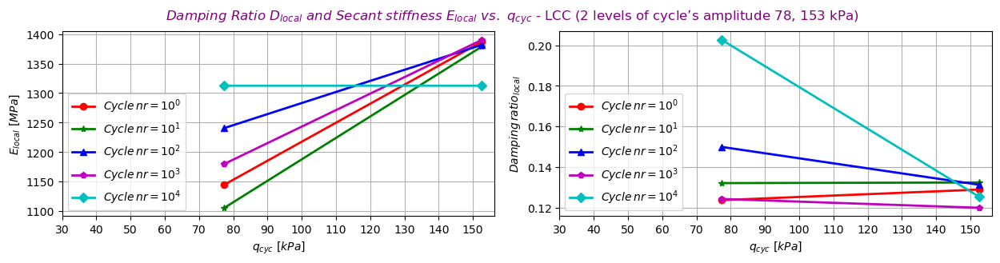

In [113]:
n0 = 10**0-1 ; n1 = 10**1 - 1 ; n2 = 10**2 - 1 ; n3 = 10**3 - 1  ; n4 = 10**4 - 1

fig, axs = plt.subplots(1, 2, figsize=(15, 3))
qcyc_30 = unp.nominal_values(Stage_info_LCC17.loc[0]['qcyc'])  
qcyc_40 = unp.nominal_values(Stage_info_LCC17.loc[1]['qcyc'])  
qcyc_E = np.array([qcyc_30, qcyc_40])        


E_local_30    = unp.nominal_values(cycle_info_LCC17_L_1.loc[n0]['E(MPa)']) ; E_local_31    = unp.nominal_values(cycle_info_LCC17_L_1.loc[n1]['E(MPa)']) 
E_local_40    = unp.nominal_values(cycle_info_LCC17_L_2.loc[n0]['E(MPa)']) ; E_local_41    = unp.nominal_values(cycle_info_LCC17_L_2.loc[n1]['E(MPa)']) 
E_local_0     = np.array([E_local_30, E_local_40])         ; E_local_1     = np.array([E_local_31, E_local_41])  


E_local_32    = unp.nominal_values(cycle_info_LCC17_L_1.loc[n2]['E(MPa)']) ; E_local_33    = unp.nominal_values(cycle_info_LCC17_L_1.loc[n3]['E(MPa)']) 
E_local_42    = unp.nominal_values(cycle_info_LCC17_L_2.loc[n2]['E(MPa)']) ; E_local_43    = unp.nominal_values(cycle_info_LCC17_L_2.loc[n3]['E(MPa)']) 
E_local_2     = np.array([E_local_32, E_local_42])         ; E_local_3     = np.array([E_local_33, E_local_43])  


E_local_34    = unp.nominal_values(cycle_info_LCC17_L_1.loc[n4]['E(MPa)']) 
E_local_44    = unp.nominal_values(cycle_info_LCC17_L_2.loc[n4]['E(MPa)']) 
E_local_4     = np.array([E_local_34, E_local_44])     



axs[0].plot(qcyc_E, E_local_0, color='r', marker='o', linewidth=2, label=r'$Cycle\,  nr = 10^{0}$')
axs[0].plot(qcyc_E, E_local_1, color='g', marker='*', linewidth=2, label=r'$Cycle\,  nr = 10^{1}$')
axs[0].plot(qcyc_E, E_local_2, color='b', marker='^', linewidth=2, label=r'$Cycle\,  nr = 10^{2}$')
axs[0].plot(qcyc_E, E_local_3, color='m', marker='p', linewidth=2, label=r'$Cycle\,  nr = 10^{3}$')
axs[0].plot(qcyc_E, E_local_4, color='c', marker='D', linewidth=2, label=r'$Cycle\, nr = 10^{4}$')
axs[0].legend(loc='lower left', fontsize=10)
axs[0].set_xlabel(r'$q_{cyc}\,\, [kPa]$')
axs[0].set_ylabel(r'$E_{local}\,\,[MPa]$')
axs[0].set_xticks(np.arange(30, 160, 10), minor=False)
axs[0].grid(True)

   


E_local_30    = unp.nominal_values(cycle_info_LCC17_L_1.loc[n0]['Damping_ratio']) ; E_local_31    = unp.nominal_values(cycle_info_LCC17_L_1.loc[n1]['Damping_ratio']) 
E_local_40    = unp.nominal_values(cycle_info_LCC17_L_2.loc[n0]['Damping_ratio']) ; E_local_41    = unp.nominal_values(cycle_info_LCC17_L_2.loc[n1]['Damping_ratio']) 
E_local_0     = np.array([E_local_30, E_local_40])         ; E_local_1     = np.array([E_local_31, E_local_41])  


E_local_32    = unp.nominal_values(cycle_info_LCC17_L_1.loc[n2]['Damping_ratio']) ; E_local_33    = unp.nominal_values(cycle_info_LCC17_L_1.loc[n3]['Damping_ratio']) 
E_local_42    = unp.nominal_values(cycle_info_LCC17_L_2.loc[n2]['Damping_ratio']) ; E_local_43    = unp.nominal_values(cycle_info_LCC17_L_2.loc[n3]['Damping_ratio']) 
E_local_2     = np.array([E_local_32, E_local_42])         ; E_local_3     = np.array([E_local_33, E_local_43])  


E_local_34    = unp.nominal_values(cycle_info_LCC17_L_1.loc[n4]['Damping_ratio']) 
E_local_44    = unp.nominal_values(cycle_info_LCC17_L_2.loc[n4]['Damping_ratio']) 
E_local_4     = np.array([E_local_34, E_local_44])     


# Plot Damping_ratio_global
axs[1].plot(qcyc_E, E_local_0, color='r', marker='o', linewidth=2, label=r'$Cycle\,  nr = 10^{0}$')
axs[1].plot(qcyc_E, E_local_1, color='g', marker='*', linewidth=2, label=r'$Cycle\,  nr = 10^{1}$')
axs[1].plot(qcyc_E, E_local_2, color='b', marker='^', linewidth=2, label=r'$Cycle\,  nr = 10^{2}$')
axs[1].plot(qcyc_E, E_local_3, color='m', marker='p', linewidth=2, label=r'$Cycle\,  nr = 10^{3}$')
axs[1].plot(qcyc_E, E_local_4, color='c', marker='D', linewidth=2, label=r'$Cycle\, nr = 10^{4}$')
axs[1].legend(loc='lower left', fontsize=10)
axs[1].set_xlabel(r'$q_{cyc}\,\, [kPa]$')
axs[1].set_ylabel(r'$Damping\, ratio _{local}$')
axs[1].set_xticks(np.arange(30, 160, 10), minor=False)
axs[1].grid(True)

plt.subplots_adjust(hspace=0.5, wspace=0.15)
fig.suptitle(r'$Damping \,\, Ratio\,\, {D}_{local} \,\, and \,\,  Secant \,\, stiffness \,\, E_{local} \,\,  vs. \,\, q_{cyc}$ - LCC (2 levels of cycle’s amplitude 78, 153 kPa)', fontsize=12, color='purple', y=0.98)
plt.show()

## D/E & qcyc NC global

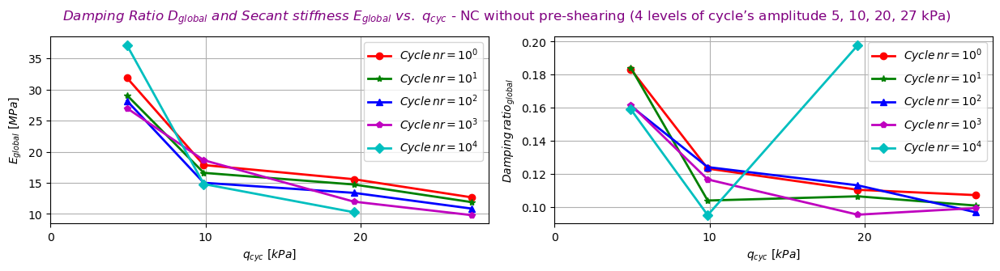

In [114]:


n0 = 10**0 ; n1 = 10**1 ; n2 = 10**2 ; n3 = 10**3 ; n4 = 10**4 

fig, axs = plt.subplots(1, 2, figsize=(15, 3))  # 2 rows, 2 columns

qcyc_10 = unp.nominal_values(Stage_info_NC05.loc[0]['qcyc'])    
qcyc_20 = unp.nominal_values(Stage_info_NC06.loc[0]['qcyc'])  
qcyc_30 = unp.nominal_values(Stage_info_NC07.loc[0]['qcyc']) 
qcyc_40 = unp.nominal_values(Stage_info_NC09.loc[0]['qcyc'])  
 
qcyc_E = np.array([qcyc_10, qcyc_20, qcyc_30, qcyc_40])        

E_global_10    = unp.nominal_values(cycle_info_NC05_G.loc[n0]['E(MPa)']) ; E_global_11    = unp.nominal_values(cycle_info_NC05_G.loc[n1]['E(MPa)']) 
E_global_20    = unp.nominal_values(cycle_info_NC06_G.loc[n0]['E(MPa)']) ; E_global_21    = unp.nominal_values(cycle_info_NC06_G.loc[n1]['E(MPa)']) 
E_global_30    = unp.nominal_values(cycle_info_NC07_G.loc[n0]['E(MPa)']) ; E_global_31    = unp.nominal_values(cycle_info_NC07_G.loc[n1]['E(MPa)']) 
E_global_40    = unp.nominal_values(cycle_info_NC09_G.loc[n0]['E(MPa)']) ; E_global_41    = unp.nominal_values(cycle_info_NC09_G.loc[n1]['E(MPa)']) 
E_global_0     = np.array([E_global_10, E_global_20, E_global_30, E_global_40])         ; E_global_1     = np.array([E_global_11, E_global_21, E_global_31, E_global_41])  

E_global_12    = unp.nominal_values(cycle_info_NC05_G.loc[n2]['E(MPa)']) ; E_global_13    = unp.nominal_values(cycle_info_NC05_G.loc[n3]['E(MPa)']) 
E_global_22    = unp.nominal_values(cycle_info_NC06_G.loc[n2]['E(MPa)']) ; E_global_23    = unp.nominal_values(cycle_info_NC06_G.loc[n3]['E(MPa)']) 
E_global_32    = unp.nominal_values(cycle_info_NC07_G.loc[n2]['E(MPa)']) ; E_global_33    = unp.nominal_values(cycle_info_NC07_G.loc[n3]['E(MPa)']) 
E_global_42    = unp.nominal_values(cycle_info_NC09_G.loc[n2]['E(MPa)']) ; E_global_43    = unp.nominal_values(cycle_info_NC09_G.loc[n3]['E(MPa)']) 
E_global_2     = np.array([E_global_12, E_global_22, E_global_32, E_global_42])         ; E_global_3     = np.array([E_global_13, E_global_23, E_global_33, E_global_43])  


E_global_14    = unp.nominal_values(cycle_info_NC05_G.loc[n4]['E(MPa)']) 
E_global_24    = unp.nominal_values(cycle_info_NC06_G.loc[n4]['E(MPa)']) 
E_global_34    = unp.nominal_values(cycle_info_NC07_G.loc[n4]['E(MPa)']) 
qcyc_E4 = np.array([qcyc_10, qcyc_20, qcyc_30])
E_global_4     = np.array([E_global_14, E_global_24, E_global_34])     

axs[0].plot(qcyc_E, E_global_0, color='r', marker='o', linewidth=2, label=r'$Cycle\,  nr = 10^{0}$')
axs[0].plot(qcyc_E, E_global_1, color='g', marker='*', linewidth=2, label=r'$Cycle\,  nr = 10^{1}$')
axs[0].plot(qcyc_E, E_global_2, color='b', marker='^', linewidth=2, label=r'$Cycle\,  nr = 10^{2}$')
axs[0].plot(qcyc_E, E_global_3, color='m', marker='p', linewidth=2, label=r'$Cycle\,  nr = 10^{3}$')
axs[0].plot(qcyc_E4, E_global_4, color='c', marker='D', linewidth=2, label=r'$Cycle\, nr = 10^{4}$')
axs[0].legend(loc='upper right')
axs[0].set_xlabel(r'$q_{cyc}\,\, [kPa]$')
axs[0].set_ylabel(r'$E_{global}\,\,[MPa]$')
axs[0].set_xticks(np.arange(0, 30, 10), minor=False)
axs[0].grid(True)

   
qcyc_10 = unp.nominal_values(Stage_info_NC05.loc[0]['qcyc'])    
qcyc_20 = unp.nominal_values(Stage_info_NC06.loc[0]['qcyc'])  
qcyc_30 = unp.nominal_values(Stage_info_NC07.loc[0]['qcyc']) 
qcyc_40 = unp.nominal_values(Stage_info_NC09.loc[0]['qcyc'])  
 
qcyc_E = np.array([qcyc_10, qcyc_20, qcyc_30, qcyc_40])        

E_global_10    = unp.nominal_values(cycle_info_NC05_G.loc[n0]['Damping_ratio']) ; E_global_11    = unp.nominal_values(cycle_info_NC05_G.loc[n1]['Damping_ratio']) 
E_global_20    = unp.nominal_values(cycle_info_NC06_G.loc[n0]['Damping_ratio']) ; E_global_21    = unp.nominal_values(cycle_info_NC06_G.loc[n1]['Damping_ratio']) 
E_global_30    = unp.nominal_values(cycle_info_NC07_G.loc[n0]['Damping_ratio']) ; E_global_31    = unp.nominal_values(cycle_info_NC07_G.loc[n1]['Damping_ratio']) 
E_global_40    = unp.nominal_values(cycle_info_NC09_G.loc[n0]['Damping_ratio']) ; E_global_41    = unp.nominal_values(cycle_info_NC09_G.loc[n1]['Damping_ratio']) 
E_global_0     = np.array([E_global_10, E_global_20, E_global_30, E_global_40])         ; E_global_1     = np.array([E_global_11, E_global_21, E_global_31, E_global_41])  

E_global_12    = unp.nominal_values(cycle_info_NC05_G.loc[n2]['Damping_ratio']) ; E_global_13    = unp.nominal_values(cycle_info_NC05_G.loc[n3]['Damping_ratio']) 
E_global_22    = unp.nominal_values(cycle_info_NC06_G.loc[n2]['Damping_ratio']) ; E_global_23    = unp.nominal_values(cycle_info_NC06_G.loc[n3]['Damping_ratio']) 
E_global_32    = unp.nominal_values(cycle_info_NC07_G.loc[n2]['Damping_ratio']) ; E_global_33    = unp.nominal_values(cycle_info_NC07_G.loc[n3]['Damping_ratio']) 
E_global_42    = unp.nominal_values(cycle_info_NC09_G.loc[n2]['Damping_ratio']) ; E_global_43    = unp.nominal_values(cycle_info_NC09_G.loc[n3]['Damping_ratio']) 
E_global_2     = np.array([E_global_12, E_global_22, E_global_32, E_global_42])         ; E_global_3     = np.array([E_global_13, E_global_23, E_global_33, E_global_43])  


E_global_14    = unp.nominal_values(cycle_info_NC05_G.loc[n4]['Damping_ratio']) 
E_global_24    = unp.nominal_values(cycle_info_NC06_G.loc[n4]['Damping_ratio']) 
E_global_34    = unp.nominal_values(cycle_info_NC07_G.loc[n4]['Damping_ratio']) 
qcyc_E4 = np.array([qcyc_10, qcyc_20, qcyc_30])
E_global_4     = np.array([E_global_14, E_global_24, E_global_34])     

axs[1].plot(qcyc_E, E_global_0, color='r', marker='o', linewidth=2, label=r'$Cycle\,  nr = 10^{0}$')
axs[1].plot(qcyc_E, E_global_1, color='g', marker='*', linewidth=2, label=r'$Cycle\,  nr = 10^{1}$')
axs[1].plot(qcyc_E, E_global_2, color='b', marker='^', linewidth=2, label=r'$Cycle\,  nr = 10^{2}$')
axs[1].plot(qcyc_E, E_global_3, color='m', marker='p', linewidth=2, label=r'$Cycle\,  nr = 10^{3}$')
axs[1].plot(qcyc_E4, E_global_4, color='c', marker='D', linewidth=2, label=r'$Cycle\, nr = 10^{4}$')
axs[1].legend(loc='upper right')
axs[1].set_xlabel(r'$q_{cyc}\,\, [kPa]$')
axs[1].set_ylabel(r'$Damping\, ratio _{global}$')
axs[1].set_xticks(np.arange(0, 30, 10), minor=False)
axs[1].grid(True)

plt.subplots_adjust(hspace=0.7, wspace=0.15)
fig.suptitle(r'$Damping \,\, Ratio\,\, {D}_{global} \,\, and \,\,  Secant \,\, stiffness \,\, E_{global} \,\,  vs. \,\, q_{cyc}$ - NC without pre-shearing (4 levels of cycle’s amplitude 5, 10, 20, 27 kPa)', fontsize=12, color='purple', y=1.0)

plt.show()


## D

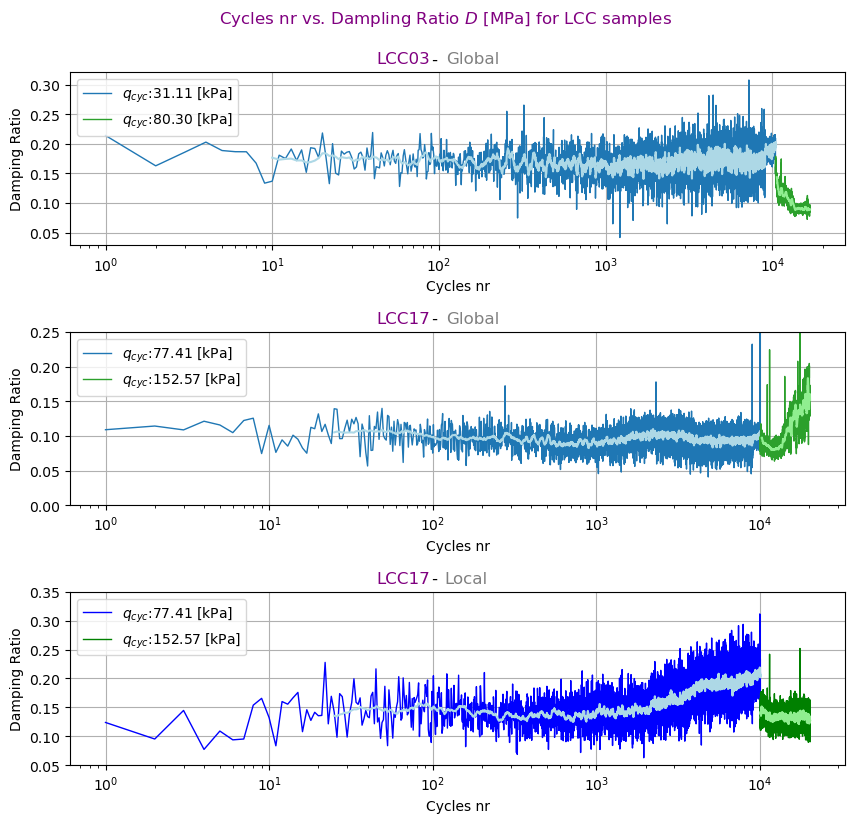

In [115]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Create a figure with 3 rows and 1 column
fig, axs = plt.subplots(3, 1, figsize=(10, 9))

# Plot the first figure on the first row
ax = axs[0]
x_values_G_1 = cycle_info_LCC03_G_1['Loop_Number']
y_values_G_1 = cycle_info_LCC03_G_1['Damping_ratio']
y_series_G_1 = pd.Series(y_values_G_1)
moving_avg_G_1 = y_series_G_1.rolling(10).mean()

x_values_G_2 = cycle_info_LCC03_G_2['Loop_Number']
y_values_G_2 = cycle_info_LCC03_G_2['Damping_ratio']
y_series_G_2 = pd.Series(y_values_G_2)
moving_avg_G_2 = y_series_G_2.rolling(200).mean()

ax.plot(x_values_G_1, y_values_G_1, color=to_rgb('tab:blue'), label=f'$q_{{cyc}}$:{qcyc_LCC03_1:.2f} [kPa]', linewidth=1)
ax.plot(x_values_G_1, moving_avg_G_1, color=to_rgb('lightblue'))
ax.plot(x_values_G_2, y_values_G_2, color=to_rgb('tab:green'), label=f'$q_{{cyc}}$:{qcyc_LCC03_2:.2f} [kPa]', linewidth=1)
ax.plot(x_values_G_2, moving_avg_G_2, color=to_rgb('lightgreen'))

ax.legend(loc='upper left')
ax.set_xscale('log')
ax.set_xlabel("Cycles nr")
ax.set_ylabel("Damping Ratio")
ax.text(0.43, 1.05, 'LCC03', fontsize=12, color='purple', ha='center', transform=ax.transAxes)
ax.text(0.47, 1.05, '-', fontsize=12, color='black', ha='center', transform=ax.transAxes)
ax.text(0.52, 1.05, 'Global', fontsize=12, color='Gray', ha='center', transform=ax.transAxes)

ax.grid(True)

# Plot the second figure on the second row
ax = axs[1]
x_values_G_1 = cycle_info_LCC17_G_1['Loop_Number']
y_values_G_1 = cycle_info_LCC17_G_1['Damping_ratio']
y_series_G_1 = pd.Series(y_values_G_1)
moving_avg_G_1 = y_series_G_1.rolling(25).mean()

x_values_G_2 = cycle_info_LCC17_G_2['Loop_Number']
y_values_G_2 = cycle_info_LCC17_G_2['Damping_ratio']
y_series_G_2 = pd.Series(y_values_G_2)
moving_avg_G_2 = y_series_G_2.rolling(200).mean()

colors = mcolors.TABLEAU_COLORS

ax.plot(x_values_G_1, y_values_G_1, color=colors['tab:blue'], label=f'$q_{{cyc}}$:{qcyc_LCC17_1:.2f} [kPa]', linewidth=1)
ax.plot(x_values_G_1, moving_avg_G_1, color='lightblue')

ax.plot(x_values_G_2, y_values_G_2, color=colors['tab:green'], label=f'$q_{{cyc}}$:{qcyc_LCC17_2:.2f} [kPa]', linewidth=1)
ax.plot(x_values_G_2, moving_avg_G_2, color='lightgreen')

ax.set_ylim([0, 0.25])
ax.legend(loc='upper left')
ax.set_xscale('log')
ax.set_xlabel("Cycles nr")
ax.set_ylabel("Damping Ratio")
ax.text(0.43, 1.05, 'LCC17', fontsize=12, color='purple', ha='center', transform=ax.transAxes)
ax.text(0.47, 1.05, '-', fontsize=12, color='black', ha='center', transform=ax.transAxes)
ax.text(0.52, 1.05, 'Global', fontsize=12, color='Gray', ha='center', transform=ax.transAxes)

ax.grid(True)

# Plot the third figure on the third row
ax = axs[2]
x_values_L_1 = cycle_info_LCC17_L_1['Loop_Number']
y_values_L_1 = cycle_info_LCC17_L_1['Damping_ratio']
y_series_L_1 = pd.Series(y_values_L_1)
moving_avg_L_1 = y_series_L_1.rolling(25).mean()

x_values_L_2 = cycle_info_LCC17_L_2['Loop_Number']
y_values_L_2 = cycle_info_LCC17_L_2['Damping_ratio']
y_series_L_2 = pd.Series(y_values_L_2)
moving_avg_L_2 = y_series_L_2.rolling(25).mean()

ax.plot(x_values_L_1, y_values_L_1, color='blue', label=f'$q_{{cyc}}$:{qcyc_LCC17_1:.2f} [kPa]', linewidth=1)
ax.plot(x_values_L_1, moving_avg_L_1, color='lightblue')

ax.plot(x_values_L_2, y_values_L_2, color='green', label=f'$q_{{cyc}}$:{qcyc_LCC17_2:.2f} [kPa]', linewidth=1)
ax.plot(x_values_L_2, moving_avg_L_2, color='lightgreen')

ax.set_ylim([0.05, 0.35])
ax.legend(loc='upper left')
ax.set_xscale('log')
ax.set_xlabel("Cycles nr")
ax.set_ylabel("Damping Ratio")
ax.text(0.43, 1.05, 'LCC17', fontsize=12, color='purple', ha='center', transform=ax.transAxes)
ax.text(0.47, 1.05, '-', fontsize=12, color='black', ha='center', transform=ax.transAxes)
ax.text(0.51, 1.05, 'Local', fontsize=12, color='Gray', ha='center', transform=ax.transAxes)

ax.grid(True)

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.5)
fig.suptitle('Cycles nr vs. Dampling Ratio ${D}$ [MPa] for LCC samples', fontsize=12, color='purple', y=0.95)

# Show the plot
plt.show()

C:\Users\local_zakial\Temp\ipykernel_20300\3200064291.py:44: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(hspace=0.7, wspace=0.3)


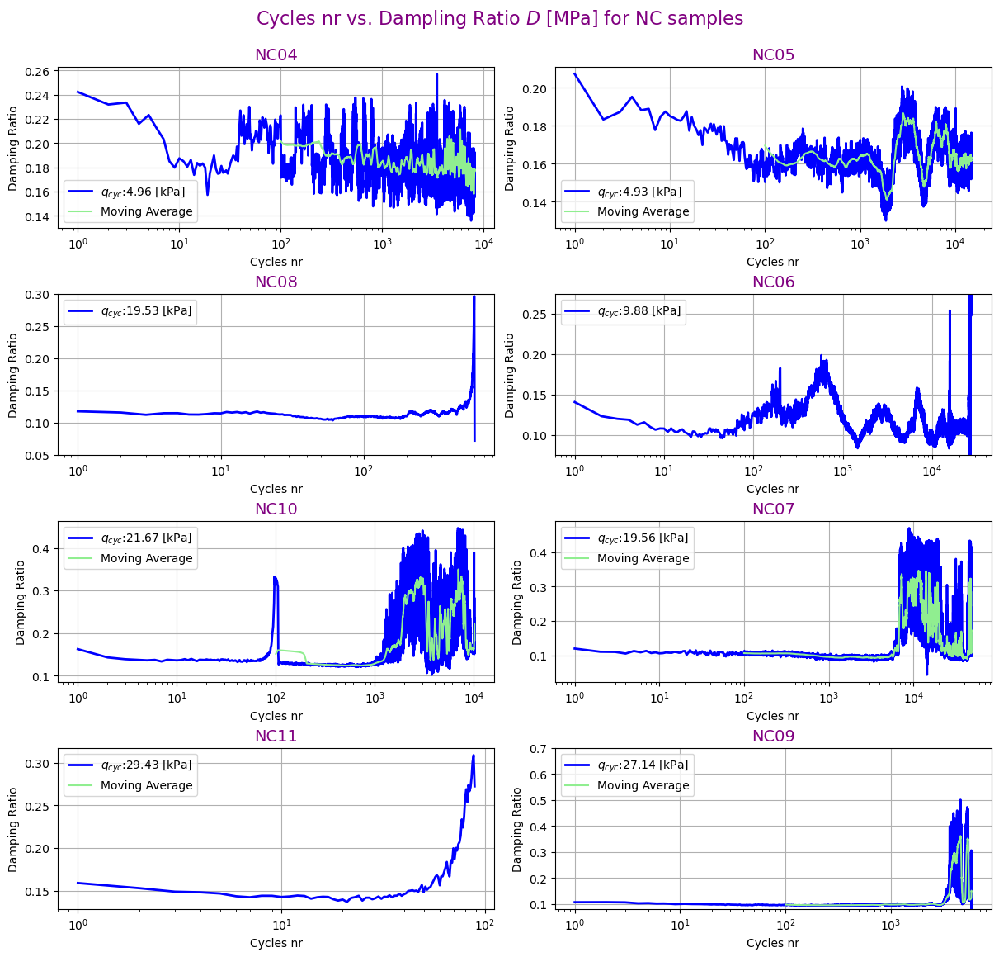

In [116]:
# Function to plot Damping Ratio vs. Cycles nr
def plot_damping_ratio(ax, sample_name, cycle_info, qcyc, ylim=None, show_moving_avg=True):
    window_size = 100
    x_values = cycle_info['Loop_Number']
    y_values = unp.nominal_values(cycle_info['Damping_ratio'])
    y_series = pd.Series(y_values)
    moving_avg = y_series.rolling(100).mean()

    ax.plot(x_values, y_values, color='blue', label=f'$q_{{cyc}}$:{qcyc:.2f} [kPa]', linewidth=2)
    if show_moving_avg:
        ax.plot(x_values, moving_avg, color='lightgreen', label='Moving Average')
    if ylim:
        ax.set_ylim(ylim)
    ax.set_xscale('log')
    
    # Set legend position based on sample name
    if sample_name in ['NC04', 'NC05']:
        ax.legend(loc='lower left')
    elif sample_name in ['NC06']:
        ax.legend(loc='upper left')
    else:
        ax.legend(loc='upper left')
        
    ax.set_xlabel("Cycles nr")
    ax.set_ylabel("Damping Ratio")
    ax.set_title(f'{sample_name}', fontsize=14, color='purple')
    ax.grid(True)

# Create subplots
fig, axs = plt.subplots(4, 2, figsize=(12, 11), constrained_layout=True)

# Plot Damping Ratio vs. Cycles nr for each sample
plot_damping_ratio(axs[0, 0], 'NC04', cycle_info_NC04_G, qcyc_NC04, show_moving_avg=True)
plot_damping_ratio(axs[1, 0], 'NC08', cycle_info_NC08_G, qcyc_NC08, ylim=[0.05, 0.3], show_moving_avg=False)
plot_damping_ratio(axs[2, 0], 'NC10', cycle_info_NC10_G, qcyc_NC10, show_moving_avg=True)
plot_damping_ratio(axs[3, 0], 'NC11', cycle_info_NC11_G, qcyc_NC11, show_moving_avg=True)

plot_damping_ratio(axs[0, 1], 'NC05', cycle_info_NC05_G, qcyc_NC05, show_moving_avg=True)
plot_damping_ratio(axs[1, 1], 'NC06', cycle_info_NC06_G, qcyc_NC06, ylim=[0.075, 0.275], show_moving_avg=False)
plot_damping_ratio(axs[2, 1], 'NC07', cycle_info_NC07_G, qcyc_NC07, show_moving_avg=True)
plot_damping_ratio(axs[3, 1], 'NC09', cycle_info_NC09_G, qcyc_NC09, ylim=[0.08, 0.7], show_moving_avg=True)

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.7, wspace=0.3)
fig.suptitle('Cycles nr vs. Dampling Ratio ${D}$ [MPa] for NC samples', fontsize=16, color='purple', y=1.04)
# Save figure
plt.savefig('damping_ratio.pdf', bbox_inches='tight')

## E

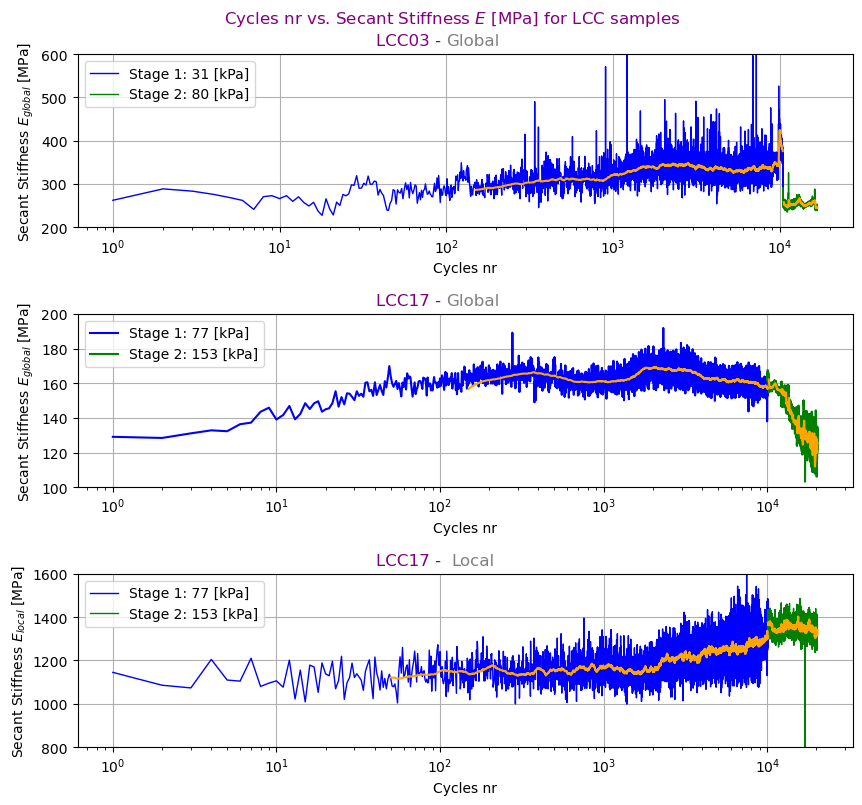

In [117]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Create a figure with 3 rows and 1 column
fig, axs = plt.subplots(3, 1, figsize=(10, 9))

# Plot the first figure on the first row
ax = axs[0]
window_size = 100
x_values_G_1 = cycle_info_LCC03_G_1['Loop_Number']
x_values_G_2 = cycle_info_LCC03_G_2['Loop_Number']
y_values_G_1 = cycle_info_LCC03_G_1['E(MPa)']
y_values_G_2 = cycle_info_LCC03_G_2['E(MPa)']
y_series_G_1 = pd.Series(y_values_G_1)
y_series_G_2 = pd.Series(y_values_G_2)
moving_avg_G_1 = y_series_G_1.rolling(150).mean()
moving_avg_G_2 = y_series_G_2.rolling(150).mean()

ax.plot(x_values_G_1, y_values_G_1, color='blue', label=f'Stage 1: {qcyc_LCC03_1:.0f} [kPa]', linewidth=1)
ax.plot(x_values_G_2, y_values_G_2, color='green', label=f'Stage 2: {qcyc_LCC03_2:.0f} [kPa]', linewidth=1)
ax.plot(x_values_G_1, moving_avg_G_1, color='orange')
ax.plot(x_values_G_2, moving_avg_G_2, color='orange')
ax.set_ylim([200, 600])
ax.legend(loc='upper left')
ax.set_xscale('log')
ax.set_ylabel("Secant Stiffness $E_{global}$ [MPa]")
ax.set_xlabel("Cycles nr")
ax.text(0.43, 1.05, 'LCC03 - ', fontsize=12, color='purple', ha='center', transform=ax.transAxes)
ax.text(0.51, 1.05, 'Global', fontsize=12, color='Gray', ha='center', transform=ax.transAxes)
ax.grid(True)


# Plot the second figure on the second row
ax = axs[1]
window_size = 100
x_values_G_1 = cycle_info_LCC17_G_1['Loop_Number']
x_values_G_2 = cycle_info_LCC17_G_2['Loop_Number']
y_values_G_1 = cycle_info_LCC17_G_1['E(MPa)']
y_values_G_2 = cycle_info_LCC17_G_2['E(MPa)']
y_series_G_1 = pd.Series(y_values_G_1)
y_series_G_2 = pd.Series(y_values_G_2)
moving_avg_G_1 = y_series_G_1.rolling(150).mean()
moving_avg_G_2 = y_series_G_2.rolling(150).mean()

qcyc_LCC17_1 = unp.nominal_values(Stage_info_LCC17.loc[0]['qcyc'])
qcyc_LCC17_2 = unp.nominal_values(Stage_info_LCC17.loc[1]['qcyc'])

ax.plot(x_values_G_1, y_values_G_1, color='blue', label=f'Stage 1: {qcyc_LCC17_1:.0f} [kPa]')
ax.plot(x_values_G_2, y_values_G_2, color='green', label=f'Stage 2: {qcyc_LCC17_2:.0f} [kPa]')
ax.plot(x_values_G_1, moving_avg_G_1, color='orange')
ax.plot(x_values_G_2, moving_avg_G_2, color='orange')
ax.set_ylim([100, 200])
ax.legend(loc='upper left')
ax.set_xscale('log')
ax.set_xlabel("Cycles nr")
ax.set_ylabel("Secant Stiffness $E_{global}$ [MPa]")
ax.text(0.43, 1.05, 'LCC17 - ', fontsize=12, color='purple', ha='center', transform=ax.transAxes)
ax.text(0.51, 1.05, 'Global', fontsize=12, color='Gray', ha='center', transform=ax.transAxes)
ax.grid(True)

# Plot the third figure on the third row
ax = axs[2]
x_values_L_1 = cycle_info_LCC17_L_1['Loop_Number']
x_values_L_2 = cycle_info_LCC17_L_2['Loop_Number']
y_values_L_1 = cycle_info_LCC17_L_1['E(MPa)']
y_values_L_2 = cycle_info_LCC17_L_2['E(MPa)']
y_series_L_1 = pd.Series(y_values_L_1)
y_series_L_2 = pd.Series(y_values_L_2)
moving_avg_L_1 = y_series_L_1.rolling(50).mean()
moving_avg_L_2 = y_series_L_2.rolling(50).mean()

ax.plot(x_values_L_1, y_values_L_1, color='blue', label=f'Stage 1: {qcyc_LCC17_1:.0f} [kPa]', linewidth=1)
ax.plot(x_values_L_2, y_values_L_2, color='green', label=f'Stage 2: {qcyc_LCC17_2:.0f} [kPa]', linewidth=1)
ax.plot(x_values_L_1, moving_avg_L_1, color='orange')
ax.plot(x_values_L_2, moving_avg_L_2, color='orange')
ax.legend(loc='upper left')
ax.set_ylim([800, 1600])
ax.set_xscale('log')
ax.set_xlabel("Cycles nr")
ax.set_ylabel("Secant Stiffness $E_{local}$ [MPa]")
ax.text(0.43, 1.05, 'LCC17 - ', fontsize=12, color='purple', ha='center', transform=ax.transAxes)
ax.text(0.51, 1.05, 'Local', fontsize=12, color='Gray', ha='center', transform=ax.transAxes)
ax.grid(True)

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.5)
fig.suptitle('Cycles nr vs. Secant Stiffness ${E}$ [MPa] for LCC samples', fontsize=12, color='purple', y=0.93)

# Show the plot
plt.show()

C:\Users\local_zakial\Temp\ipykernel_20300\183082851.py:42: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(hspace=0.7, wspace=0.3)


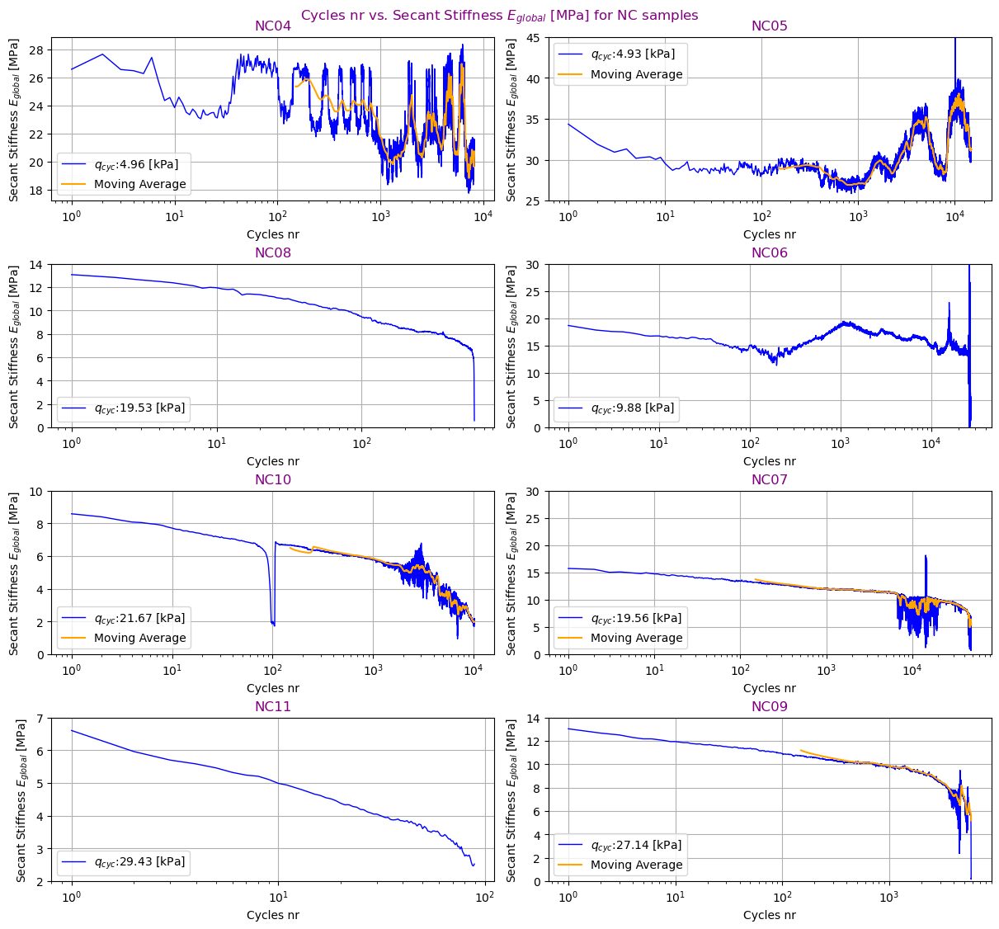

In [118]:
## Function to plot Secant Stiffness vs. Cycles nr
def plot_secant_stiffness(ax, sample_name, cycle_info, qcyc, ylim=None, show_moving_avg=True):
    window_size = 100
    x_values = cycle_info['Loop_Number']
    y_values = cycle_info['E(MPa)']
    y_series = pd.Series(y_values)
    moving_avg = y_series.rolling(150).mean()

    ax.plot(x_values, y_values, color='blue', label=f'$q_{{cyc}}$:{qcyc:.2f} [kPa]', linewidth=1)
    if show_moving_avg:
        ax.plot(x_values, moving_avg, color='orange', label='Moving Average')
    if ylim:
        ax.set_ylim(ylim)
    ax.set_xscale('log')
       # Set legend position based on sample name
    if sample_name == 'NC05':
        ax.legend(loc='upper left')
    else:
        ax.legend(loc='lower left')
    ax.set_xlabel("Cycles nr")
    ax.set_ylabel("Secant Stiffness $E_{global}$ [MPa]")
    ax.set_title(f'{sample_name}', fontsize=12, color='purple')
    #ax.text(0.36, 1.05, 'Global', fontsize=14, color='Gray', ha='center', transform=ax.transAxes)
    #ax.text(0.62, 1.05, '-Cycles nr vs.Secant Stiffness $E_{global}$ [MPa]', fontsize=14, color='purple', ha='center', transform=ax.transAxes)
    ax.grid(True)

## Create subplots
fig, axs = plt.subplots(4, 2, figsize=(12, 11), constrained_layout=True)

## Plot Secant Stiffness vs. Cycles nr for each sample
plot_secant_stiffness(axs[0, 0], 'NC04', cycle_info_NC04_G, qcyc_NC04, show_moving_avg=True)
plot_secant_stiffness(axs[1, 0], 'NC08', cycle_info_NC08_G, qcyc_NC08, ylim=[0, 14], show_moving_avg=False)
plot_secant_stiffness(axs[2, 0], 'NC10', cycle_info_NC10_G, qcyc_NC10, ylim=[0, 10], show_moving_avg=True)
plot_secant_stiffness(axs[3, 0], 'NC11', cycle_info_NC11_G, qcyc_NC11, ylim=[2, 7], show_moving_avg=False)

plot_secant_stiffness(axs[0, 1], 'NC05', cycle_info_NC05_G, qcyc_NC05, ylim=[25, 45], show_moving_avg=True)
plot_secant_stiffness(axs[1, 1], 'NC06', cycle_info_NC06_G, qcyc_NC06, ylim=[0, 30], show_moving_avg=False)
plot_secant_stiffness(axs[2, 1], 'NC07', cycle_info_NC07_G, qcyc_NC07, ylim=[0, 30], show_moving_avg=True)
plot_secant_stiffness(axs[3, 1], 'NC09', cycle_info_NC09_G, qcyc_NC09, ylim=[0, 14], show_moving_avg=True)

## Adjust spacing between subplots
plt.subplots_adjust(hspace=0.7, wspace=0.3)
fig.suptitle('Cycles nr vs. Secant Stiffness $E_{global}$ [MPa] for NC samples', fontsize=12, color='purple', y=1.01)

## Save figur
plt.savefig('secant_stiffness.pdf', bbox_inches='tight')

## G

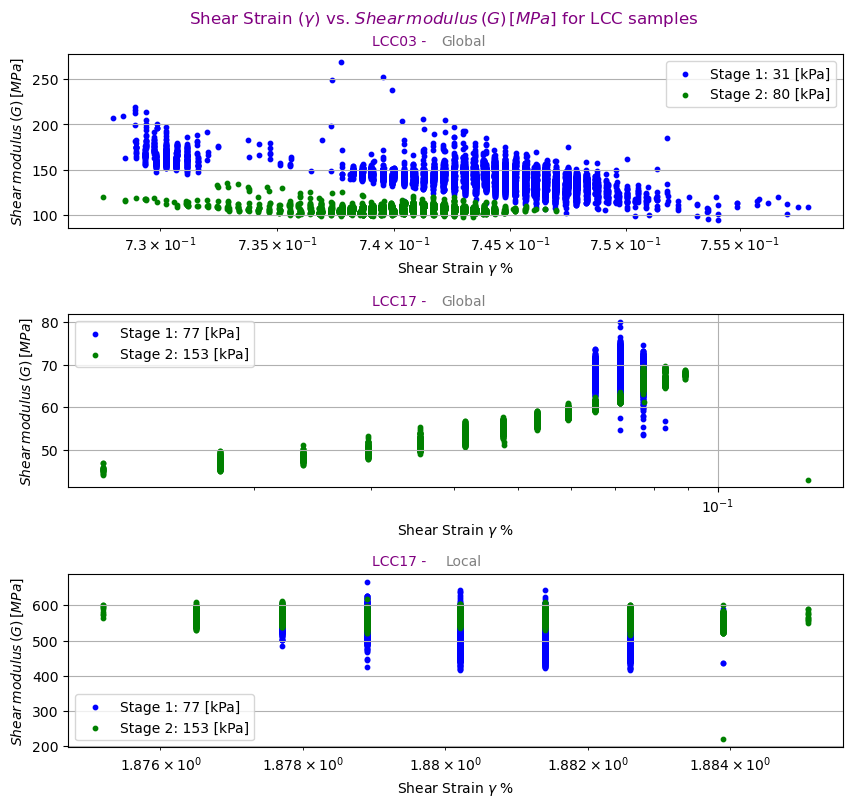

In [119]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.ticker as mticker

# Create a figure with 3 rows and 1 column
fig, axs = plt.subplots(3, 1, figsize=(10, 9))

# Plot the first figure on the first row
ax = axs[0]
window_size = 100
x_values_G_1 = unp.nominal_values(cycle_info_LCC03_G_1['Shear Strain'])
x_values_G_2 = unp.nominal_values(cycle_info_LCC03_G_2['Shear Strain'])
y_values_G_1 = unp.nominal_values(cycle_info_LCC03_G_1['Shear_modulus_(MPa)'])
y_values_G_2 = unp.nominal_values(cycle_info_LCC03_G_2['Shear_modulus_(MPa)'])

ax.scatter(x_values_G_1, y_values_G_1, color='blue', label=f'Stage 1: {qcyc_LCC03_1:.0f} [kPa]', s=10)
ax.scatter(x_values_G_2, y_values_G_2, color='green', label=f'Stage 2: {qcyc_LCC03_2:.0f} [kPa]', s=10)
ax.set_xscale('log')
ax.legend(loc='upper right')
ax.set_xlabel(r'Shear Strain $\gamma$ %')
ax.set_ylabel(r'$Shear\, modulus\, ({G})\,[MPa]$')
ax.text(0.43, 1.05, 'LCC03 - ', fontsize=10, color='purple', ha='center', transform=ax.transAxes)
ax.text(0.51, 1.05, 'Global', fontsize=10, color='Gray', ha='center', transform=ax.transAxes)

ax.grid(True)

# Plot the second figure on the second row
ax = axs[1]
window_size = 100
x_values_G_1 = unp.nominal_values(cycle_info_LCC17_G_1['Shear Strain'])
x_values_G_2 = unp.nominal_values(cycle_info_LCC17_G_2['Shear Strain'])
y_values_G_1 = cycle_info_LCC17_G_1['Shear_modulus_(MPa)'] 
y_values_G_2 = cycle_info_LCC17_G_2['Shear_modulus_(MPa)'] 

qcyc_LCC17_1 = unp.nominal_values(Stage_info_LCC17.loc[0]['qcyc'])
qcyc_LCC17_2 = unp.nominal_values(Stage_info_LCC17.loc[1]['qcyc'])

ax.scatter(x_values_G_1, y_values_G_1, color='blue', label=f'Stage 1: {qcyc_LCC17_1:.0f} [kPa]', s=10)
ax.scatter(x_values_G_2, y_values_G_2, color='green', label=f'Stage 2: {qcyc_LCC17_2:.0f} [kPa]', s=10)
ax.set_xscale('log')
ax.legend(loc='upper left')
ax.set_xlabel(r'Shear Strain $\gamma$ %')
ax.set_ylabel(r'$Shear\, modulus\, ({G})\,[MPa]$')
ax.text(0.43, 1.05, 'LCC17 - ', fontsize=10, color='purple', ha='center', transform=ax.transAxes)
ax.text(0.51, 1.05, 'Global', fontsize=10, color='Gray', ha='center', transform=ax.transAxes)

ax.grid(True)

# Plot the third figure on the third row
ax = axs[2]
x_values_L_1 = unp.nominal_values(cycle_info_LCC17_L_1['Shear Strain'])
x_values_L_2 = unp.nominal_values(cycle_info_LCC17_L_2['Shear Strain'])
y_values_L_1 = cycle_info_LCC17_L_1['Shear_modulus_(MPa)']
y_values_L_2 = cycle_info_LCC17_L_2['Shear_modulus_(MPa)']

ax.scatter(x_values_L_1, y_values_L_1, color='blue', label=f'Stage 1: {qcyc_LCC17_1:.0f} [kPa]', s=10)
ax.scatter(x_values_L_2, y_values_L_2, color='green', label=f'Stage 2: {qcyc_LCC17_2:.0f} [kPa]', s=10)
ax.set_xscale('log')
ax.legend(loc='lower left')
ax.set_xlabel(r'Shear Strain $\gamma$ %')
ax.set_ylabel(r'$Shear\, modulus\, ({G})\,[MPa]$')
ax.text(0.43, 1.05, 'LCC17 - ', fontsize=10, color='purple', ha='center', transform=ax.transAxes)
ax.text(0.51, 1.05, 'Local', fontsize=10, color='Gray', ha='center', transform=ax.transAxes)

ax.grid(True)

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.5)
fig.suptitle(r'Shear Strain ($\gamma$) vs. $Shear\, modulus\, ({G})\,[MPa] $ for LCC samples', fontsize=12, color='purple', y=0.93)

# Show the plot
plt.show()

C:\Users\local_zakial\Temp\ipykernel_20300\3995153221.py:155: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(hspace=0.7, wspace=0.3)


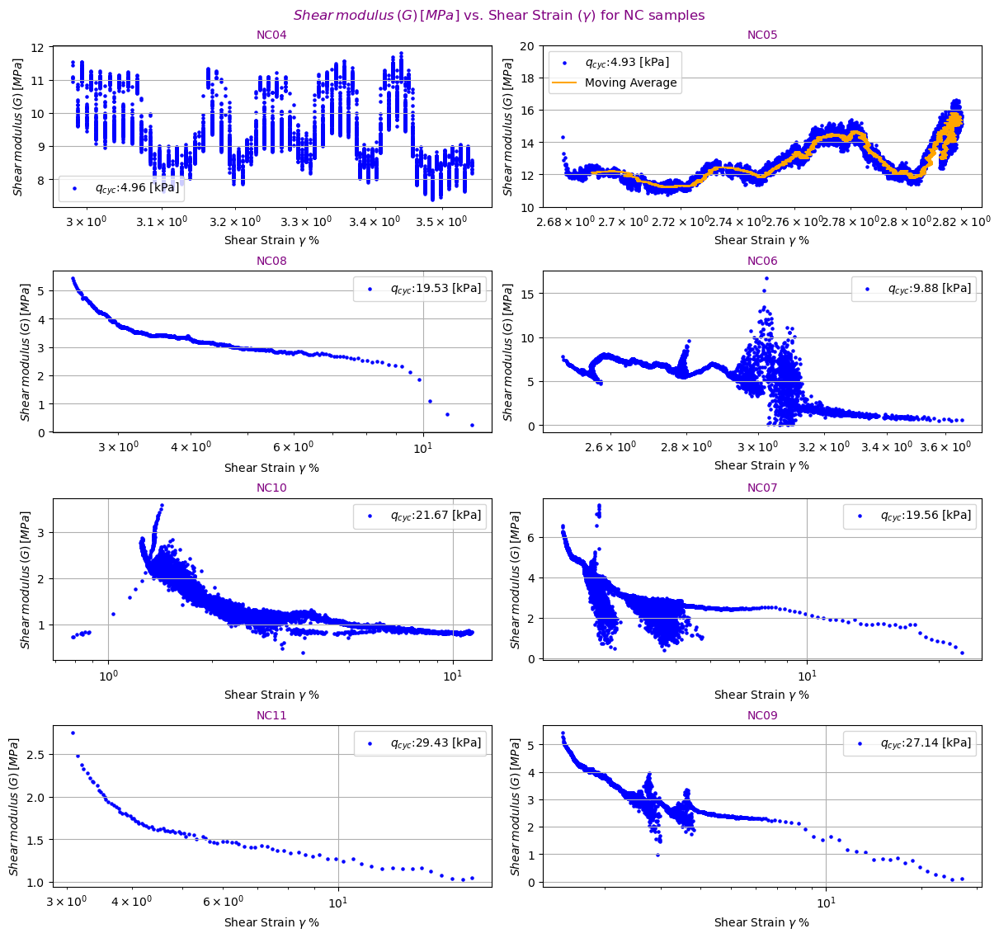

In [120]:


def plot_NC04(ax):
    window_size = 100
    x_values_G = unp.nominal_values(cycle_info_NC04_G['Shear Strain'])
    y_values_G = cycle_info_NC04_G['Shear_modulus_(MPa)']
    y_series_G_1 = pd.Series(y_values_G)
    moving_avg_G_1 = y_series_G_1.rolling(150).mean()
    ax.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC04:.2f} [kPa]', s=5)
    plt.sca(ax)  # Set the current Axes instance
    plt.xscale('log')
    ax.legend(loc='lower left')
    ax.set_xlabel(r'Shear Strain $\gamma$ %')
    ax.set_ylabel(r'$Shear\, modulus\,({G})\,[MPa]$')
    ax.set_title(r'NC04', fontsize=10, color='purple')
    ax.grid(True)

def plot_NC05(ax):
    window_size = 100
    x_values_G = unp.nominal_values(cycle_info_NC05_G['Shear Strain'])
    y_values_G = cycle_info_NC05_G['Shear_modulus_(MPa)']
    y_series_G = pd.Series(y_values_G)
    moving_avg_G = y_series_G.rolling(200).mean()

    ax.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC05:.2f} [kPa]', s=5)
    ax.plot(x_values_G, moving_avg_G, color='orange', label='Moving Average')
    ax.set_ylim([10, 20])
    plt.sca(ax) 
    plt.xscale('log')
    ax.tick_params(axis='both', which='major', labelsize=10)
    ax.legend(loc='upper left')
    ax.set_xlabel(r'Shear Strain $\gamma$ %')
    ax.set_ylabel(r'$Shear\, modulus\,({G})\,[MPa]$')
    ax.set_title(r'NC05', fontsize=10, color='purple')
    ax.grid(True)

def plot_NC06(ax):
    window_size = 100
    x_values_G = unp.nominal_values(cycle_info_NC06_G['Shear Strain'])
    y_values_G = unp.nominal_values(cycle_info_NC06_G['Shear_modulus_(MPa)'])

    y_series_G = pd.Series(y_values_G)
    moving_avg_G = y_series_G.rolling(550).mean()

    ax.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC06:.2f} [kPa]', s=5)
    plt.sca(ax)  # Set the current Axes instance
    plt.xscale('log')
    ax.tick_params(axis='both', which='major', labelsize=10)
    ax.legend(loc='upper right')
    ax.set_xlabel(r'Shear Strain $\gamma$ %')
    ax.set_ylabel(r'$Shear\, modulus\,({G})\,[MPa]$')
    ax.set_title(r'NC06', fontsize=10, color='purple')
    ax.grid(True)

def plot_NC07(ax):
    window_size = 100

    x_values_G = unp.nominal_values(cycle_info_NC07_G['Shear Strain'])
    y_values_G = unp.nominal_values(cycle_info_NC07_G['Shear_modulus_(MPa)'])

    y_series_G_1 = pd.Series(y_values_G)
    moving_avg_G_1 = y_series_G_1.rolling(150).mean()

    ax.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC07:.2f} [kPa]', s=5)
    plt.sca(ax)  # Set the current Axes instance
    plt.xscale('log')
    ax.legend(loc='upper right')
    ax.set_xlabel(r'Shear Strain $\gamma$ %')
    ax.set_ylabel(r'$Shear\, modulus\,({G})\,[MPa]$')
    ax.set_title(r'NC07', fontsize=10, color='purple')

    ax.grid(True)

def plot_NC08(ax):
    window_size = 100
    x_values_G = unp.nominal_values(cycle_info_NC08_G['Shear Strain'])
    y_values_G = unp.nominal_values(cycle_info_NC08_G['Shear_modulus_(MPa)'])

    y_series_G_1 = pd.Series(y_values_G)
    moving_avg_G_1 = y_series_G_1.rolling(150).mean()

    ax.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC08:.2f} [kPa]', s=5)
    plt.sca(ax)  # Set the current Axes instance
    plt.xscale('log')
    ax.legend(loc='upper right')
    ax.set_xlabel(r'Shear Strain $\gamma$ %')
    ax.set_ylabel(r'$Shear\, modulus\,({G})\,[MPa]$')
    ax.set_title(r'NC08', fontsize=10, color='purple')
    ax.grid(True)

def plot_NC09(ax):
    window_size = 100
    x_values_G = unp.nominal_values(cycle_info_NC09_G['Shear Strain'])
    y_values_G = unp.nominal_values(cycle_info_NC09_G['Shear_modulus_(MPa)'])

    y_series_G_1 = pd.Series(y_values_G)
    moving_avg_G_1 = y_series_G_1.rolling(150).mean()

    ax.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC09:.2f} [kPa]', s=5)
    plt.sca(ax)  # Set the current Axes instance
    plt.xscale('log')
    ax.legend(loc='upper right')
    ax.set_xlabel(r'Shear Strain $\gamma$ %')
    ax.set_ylabel(r'$Shear\, modulus\,({G})\,[MPa]$')
    ax.set_title(r'NC09', fontsize=10, color='purple')
    ax.grid(True)

def plot_NC10(ax):
    window_size = 100
    x_values_G = unp.nominal_values(cycle_info_NC10_G['Shear Strain'])
    y_values_G = unp.nominal_values(cycle_info_NC10_G['Shear_modulus_(MPa)'])

    y_series_G_1 = pd.Series(y_values_G)
    moving_avg_G_1 = y_series_G_1.rolling(150).mean()

    ax.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC10:.2f} [kPa]', s=5)
    plt.sca(ax)  # Set the current Axes instance
    plt.xscale('log')
    ax.legend(loc='upper right')
    ax.set_xlabel(r'Shear Strain $\gamma$ %')
    ax.set_ylabel(r'$Shear\, modulus\,({G})\,[MPa]$')
    ax.set_title(r'NC10', fontsize=10, color='purple')
    ax.grid(True)

def plot_NC11(ax):
    window_size = 100
    x_values_G = unp.nominal_values(cycle_info_NC11_G['Shear Strain'])
    y_values_G = unp.nominal_values(cycle_info_NC11_G['Shear_modulus_(MPa)'])

    y_series_G_1 = pd.Series(y_values_G)
    moving_avg_G_1 = y_series_G_1.rolling(150).mean()

    ax.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC11:.2f} [kPa]', s=5)
    plt.sca(ax)  # Set the current Axes instance
    plt.xscale('log')
    ax.legend(loc='upper right')
    ax.set_xlabel(r'Shear Strain $\gamma$ %')
    ax.set_ylabel(r'$Shear\, modulus\,({G})\,[MPa]$')
    ax.set_title(r'NC11', fontsize=10, color='purple')
    ax.grid(True)

fig, axs = plt.subplots(4, 2, figsize=(12, 11), constrained_layout=True)

# First row
plot_NC04(axs[0, 0])
plot_NC08(axs[1, 0])
plot_NC10(axs[2, 0])
plot_NC11(axs[3, 0])

# Second row
plot_NC05(axs[0, 1])
plot_NC06(axs[1, 1])
plot_NC07(axs[2, 1])
plot_NC09(axs[3, 1])

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.7, wspace=0.3)
fig.suptitle(r'$ Shear\, modulus\, ({G})\,[MPa] $ vs. Shear Strain ($\gamma$) for NC samples', fontsize=12, color='purple', y=1.02)
# Save figure
plt.savefig('shear_modulus_ratio.pdf', bbox_inches='tight')

## D&Shear Strain

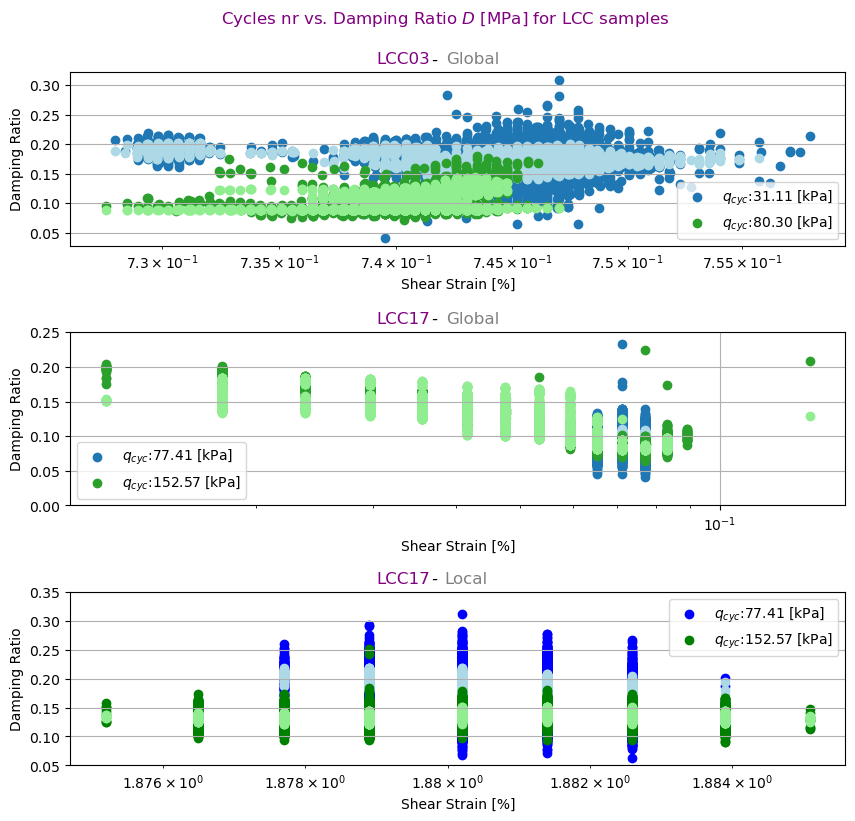

In [121]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from uncertainties import ufloat
# Create a figure with 3 rows and 1 column
fig, axs = plt.subplots(3, 1, figsize=(10, 9))

# Plot the first figure on the first row
ax = axs[0]
x_values_G_1 = unp.nominal_values(cycle_info_LCC03_G_1['Shear Strain'])
y_values_G_1 = cycle_info_LCC03_G_1['Damping_ratio']
y_series_G_1 = pd.Series(y_values_G_1)
moving_avg_G_1 = y_series_G_1.rolling(10).mean()

x_values_G_2 = unp.nominal_values(cycle_info_LCC03_G_2['Shear Strain'])
y_values_G_2 = cycle_info_LCC03_G_2['Damping_ratio']
y_series_G_2 = pd.Series(y_values_G_2)
moving_avg_G_2 = y_series_G_2.rolling(200).mean()

ax.scatter(x_values_G_1, y_values_G_1, color=to_rgb('tab:blue'), label=f'$q_{{cyc}}$:{qcyc_LCC03_1:.2f} [kPa]', linewidth=1)
ax.scatter(x_values_G_1, moving_avg_G_1, color=to_rgb('lightblue'))
ax.scatter(x_values_G_2, y_values_G_2, color=to_rgb('tab:green'), label=f'$q_{{cyc}}$:{qcyc_LCC03_2:.2f} [kPa]', linewidth=1)
ax.scatter(x_values_G_2, moving_avg_G_2, color=to_rgb('lightgreen'))

ax.legend(loc='lower right')
ax.set_xscale('log')
ax.set_xlabel("Shear Strain [%]")
ax.set_ylabel("Damping Ratio")
ax.text(0.43, 1.05, 'LCC03', fontsize=12, color='purple', ha='center', transform=ax.transAxes)
ax.text(0.47, 1.05, '-', fontsize=12, color='black', ha='center', transform=ax.transAxes)
ax.text(0.52, 1.05, 'Global', fontsize=12, color='Gray', ha='center', transform=ax.transAxes)

ax.grid(True)

# Plot the second figure on the second row
ax = axs[1]
x_values_G_1 = unp.nominal_values(cycle_info_LCC17_G_1['Shear Strain'])
y_values_G_1 = cycle_info_LCC17_G_1['Damping_ratio']
y_series_G_1 = pd.Series(y_values_G_1)
moving_avg_G_1 = y_series_G_1.rolling(25).mean()

x_values_G_2 = unp.nominal_values(cycle_info_LCC17_G_2['Shear Strain'])
y_values_G_2 = cycle_info_LCC17_G_2['Damping_ratio']
y_series_G_2 = pd.Series(y_values_G_2)
moving_avg_G_2 = y_series_G_2.rolling(200).mean()

colors = mcolors.TABLEAU_COLORS

ax.scatter(x_values_G_1, y_values_G_1, color=to_rgb('tab:blue'), label=f'$q_{{cyc}}$:{qcyc_LCC17_1:.2f} [kPa]', linewidth=1)
ax.scatter(x_values_G_1, moving_avg_G_1, color=to_rgb('lightblue'))

ax.scatter(x_values_G_2, y_values_G_2, color=to_rgb('tab:green'), label=f'$q_{{cyc}}$:{qcyc_LCC17_2:.2f} [kPa]', linewidth=1)
ax.scatter(x_values_G_2, moving_avg_G_2, color=to_rgb('lightgreen'))

ax.set_ylim([0, 0.25])
ax.legend(loc='lower left')
ax.set_xscale('log')
ax.set_xlabel("Shear Strain [%]")
ax.set_ylabel("Damping Ratio")
ax.text(0.43, 1.05, 'LCC17', fontsize=12, color='purple', ha='center', transform=ax.transAxes)
ax.text(0.47, 1.05, '-', fontsize=12, color='black', ha='center', transform=ax.transAxes)
ax.text(0.52, 1.05, 'Global', fontsize=12, color='Gray', ha='center', transform=ax.transAxes)

ax.grid(True)

# Plot the third figure on the third row
ax = axs[2]
x_values_L_1 = unp.nominal_values(cycle_info_LCC17_L_1['Shear Strain'])
y_values_L_1 = cycle_info_LCC17_L_1['Damping_ratio']
y_series_L_1 = pd.Series(y_values_L_1)
moving_avg_L_1 = y_series_L_1.rolling(25).mean()

x_values_L_2 = unp.nominal_values(cycle_info_LCC17_L_2['Shear Strain'])
y_values_L_2 = cycle_info_LCC17_L_2['Damping_ratio']
y_series_L_2 = pd.Series(y_values_L_2)
moving_avg_L_2 = y_series_L_2.rolling(25).mean()

ax.scatter(x_values_L_1, y_values_L_1, color='blue', label=f'$q_{{cyc}}$:{qcyc_LCC17_1:.2f} [kPa]', linewidth=1)
ax.scatter(x_values_L_1, moving_avg_L_1, color='lightblue')

ax.scatter(x_values_L_2, y_values_L_2, color='green', label=f'$q_{{cyc}}$:{qcyc_LCC17_2:.2f} [kPa]', linewidth=1)
ax.scatter(x_values_L_2, moving_avg_L_2, color='lightgreen')

ax.set_ylim([0.05, 0.35])
ax.legend(loc='upper right')
ax.set_xscale('log')
ax.set_xlabel("Shear Strain [%]")
ax.set_ylabel("Damping Ratio")
ax.text(0.43, 1.05, 'LCC17', fontsize=12, color='purple', ha='center', transform=ax.transAxes)
ax.text(0.47, 1.05, '-', fontsize=12, color='black', ha='center', transform=ax.transAxes)
ax.text(0.51, 1.05, 'Local', fontsize=12, color='Gray', ha='center', transform=ax.transAxes)

ax.grid(True)

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.5)
fig.suptitle('Cycles nr vs. Damping Ratio ${D}$ [MPa] for LCC samples', fontsize=12, color='purple', y=0.95)

# Show the plot
plt.show()

C:\Users\local_zakial\Temp\ipykernel_20300\4156156101.py:45: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(hspace=0.7, wspace=0.3)


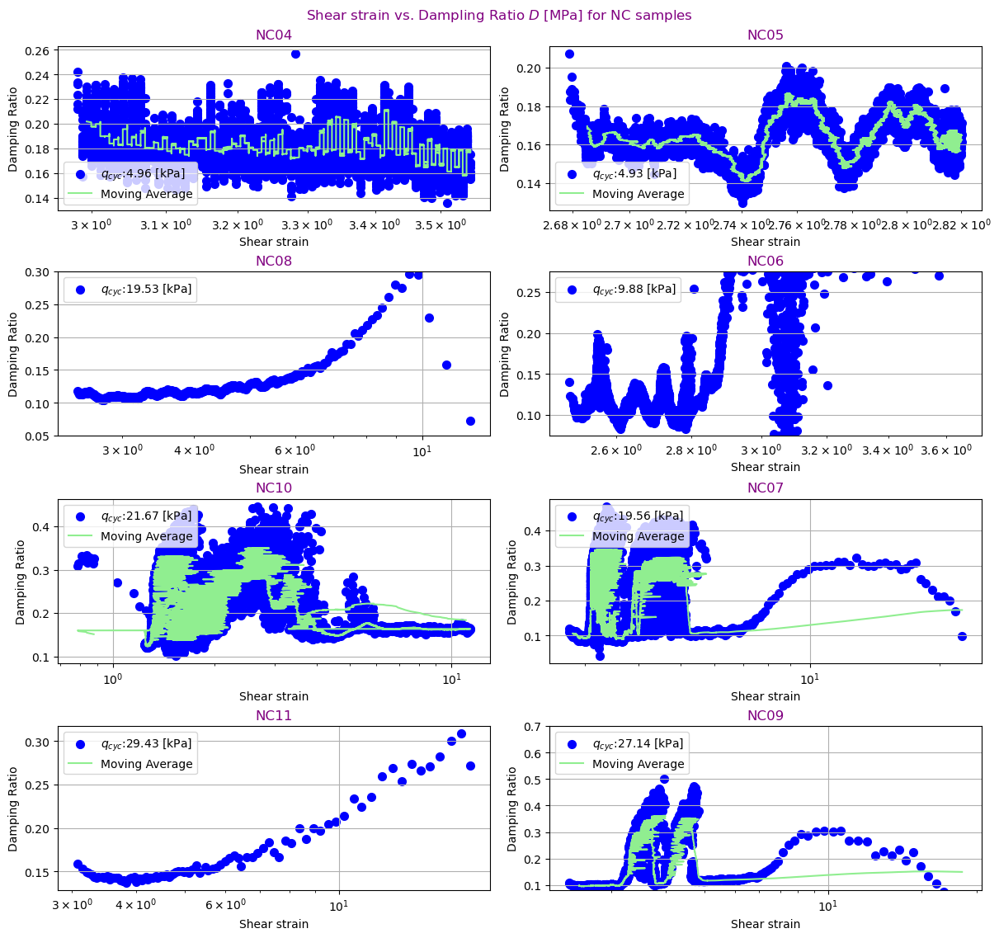

In [122]:
# Function to plot Damping Ratio vs. Cycles nr

def plot_damping_ratio(ax, sample_name, cycle_info, qcyc, ylim=None, show_moving_avg=True):
    window_size = 100
    x_values = unp.nominal_values(cycle_info['Shear Strain'])
    y_values = unp.nominal_values(cycle_info['Damping_ratio'])
    y_series = pd.Series(y_values)
    moving_avg = y_series.rolling(100).mean()

    ax.scatter(x_values, y_values, color='blue', label=f'$q_{{cyc}}$:{qcyc:.2f} [kPa]', linewidth=2)
    if show_moving_avg:
        ax.plot(x_values, moving_avg, color='lightgreen', label='Moving Average')
    if ylim:
        ax.set_ylim(ylim)
    ax.set_xscale('log')
    
    # Set legend position based on sample name
    if sample_name in ['NC04', 'NC05']:
        ax.legend(loc='lower left')
    elif sample_name in ['NC06']:
        ax.legend(loc='upper left')
    else:
        ax.legend(loc='upper left')
        
    ax.set_xlabel("Shear strain")
    ax.set_ylabel("Damping Ratio")
    ax.set_title(f'{sample_name}', fontsize=12, color='purple')
    ax.grid(True)

# Create subplots
fig, axs = plt.subplots(4, 2, figsize=(12, 11), constrained_layout=True)

# Plot Damping Ratio vs. Cycles nr for each sample
plot_damping_ratio(axs[0, 0], 'NC04', cycle_info_NC04_G, qcyc_NC04, show_moving_avg=True)
plot_damping_ratio(axs[1, 0], 'NC08', cycle_info_NC08_G, qcyc_NC08, ylim=[0.05, 0.3], show_moving_avg=False)
plot_damping_ratio(axs[2, 0], 'NC10', cycle_info_NC10_G, qcyc_NC10, show_moving_avg=True)
plot_damping_ratio(axs[3, 0], 'NC11', cycle_info_NC11_G, qcyc_NC11, show_moving_avg=True)

plot_damping_ratio(axs[0, 1], 'NC05', cycle_info_NC05_G, qcyc_NC05, show_moving_avg=True)
plot_damping_ratio(axs[1, 1], 'NC06', cycle_info_NC06_G, qcyc_NC06, ylim=[0.075, 0.275], show_moving_avg=False)
plot_damping_ratio(axs[2, 1], 'NC07', cycle_info_NC07_G, qcyc_NC07, show_moving_avg=True)
plot_damping_ratio(axs[3, 1], 'NC09', cycle_info_NC09_G, qcyc_NC09, ylim=[0.08, 0.7], show_moving_avg=True)

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.7, wspace=0.3)
fig.suptitle('Shear strain vs. Dampling Ratio ${D}$ [MPa] for NC samples', fontsize=12, color='purple', y=1.02)
# Save figure
plt.savefig('damping_ratio.pdf', bbox_inches='tight')

## G/G0

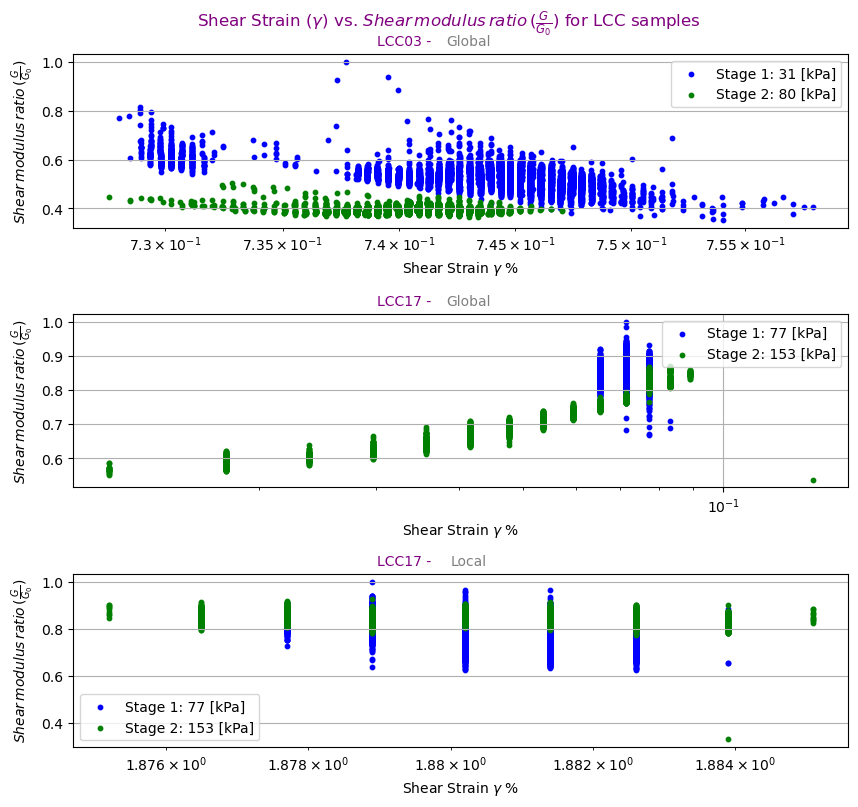

In [123]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.ticker as mticker

# Create a figure with 3 rows and 1 column
fig, axs = plt.subplots(3, 1, figsize=(10, 9))

# Plot the first figure on the first row
ax = axs[0]
window_size = 100
# G/G0  global
Gmax_LCC03_G_1 = np.max(cycle_info_LCC03_G_1['Shear_modulus_(MPa)'])
Gmax_LCC03_G_2 = np.max(cycle_info_LCC03_G_2['Shear_modulus_(MPa)'])
Gmax_LCC03_G = np.max(cycle_info_LCC03_G['Shear_modulus_(MPa)'])

x_values_G_1 = unp.nominal_values(cycle_info_LCC03_G_1['Shear Strain'])
x_values_G_2 = unp.nominal_values(cycle_info_LCC03_G_2['Shear Strain'])
y_values_G_1 = unp.nominal_values(cycle_info_LCC03_G_1['Shear_modulus_(MPa)']) / unp.nominal_values(Gmax_LCC03_G)
y_values_G_2 = unp.nominal_values(cycle_info_LCC03_G_2['Shear_modulus_(MPa)']) / unp.nominal_values(Gmax_LCC03_G)

ax.scatter(x_values_G_1, y_values_G_1, color='blue', label=f'Stage 1: {qcyc_LCC03_1:.0f} [kPa]', s=10)
ax.scatter(x_values_G_2, y_values_G_2, color='green', label=f'Stage 2: {qcyc_LCC03_2:.0f} [kPa]', s=10)
ax.set_xscale('log')
ax.legend(loc='upper right')
ax.set_xlabel(r'Shear Strain $\gamma$ %')
ax.set_ylabel(r'$Shear\, modulus\, ratio\,(\frac{G}{G_0}$)')
ax.text(0.43, 1.05, 'LCC03 - ', fontsize=10, color='purple', ha='center', transform=ax.transAxes)
ax.text(0.51, 1.05, 'Global', fontsize=10, color='Gray', ha='center', transform=ax.transAxes)

ax.grid(True)

# Plot the second figure on the second row
ax = axs[1]
window_size = 100
# G/G0  global
Gmax_LCC17_G_1 = np.max(cycle_info_LCC17_G_1['Shear_modulus_(MPa)'])
Gmax_LCC17_G_2 = np.max(cycle_info_LCC17_G_2['Shear_modulus_(MPa)'])
Gmax_LCC17_G = np.max(cycle_info_LCC17_G['Shear_modulus_(MPa)'])

x_values_G_1 = unp.nominal_values(cycle_info_LCC17_G_1['Shear Strain'])
x_values_G_2 = unp.nominal_values(cycle_info_LCC17_G_2['Shear Strain'])
y_values_G_1 = cycle_info_LCC17_G_1['Shear_modulus_(MPa)'] / Gmax_LCC17_G
y_values_G_2 = cycle_info_LCC17_G_2['Shear_modulus_(MPa)'] / Gmax_LCC17_G

qcyc_LCC17_1 = unp.nominal_values(Stage_info_LCC17.loc[0]['qcyc'])
qcyc_LCC17_2 = unp.nominal_values(Stage_info_LCC17.loc[1]['qcyc'])

ax.scatter(x_values_G_1, y_values_G_1, color='blue', label=f'Stage 1: {qcyc_LCC17_1:.0f} [kPa]', s=10)
ax.scatter(x_values_G_2, y_values_G_2, color='green', label=f'Stage 2: {qcyc_LCC17_2:.0f} [kPa]', s=10)
ax.set_xscale('log')
ax.legend(loc='upper right')
ax.set_xlabel(r'Shear Strain $\gamma$ %')
ax.set_ylabel(r'$Shear\, modulus\, ratio\,(\frac{G}{G_0}$)')
ax.text(0.43, 1.05, 'LCC17 - ', fontsize=10, color='purple', ha='center', transform=ax.transAxes)
ax.text(0.51, 1.05, 'Global', fontsize=10, color='Gray', ha='center', transform=ax.transAxes)

ax.grid(True)

# Plot the third figure on the third row
ax = axs[2]
Gmax_LCC17_L_1 = np.max(cycle_info_LCC17_L_1['Shear_modulus_(MPa)'])
Gmax_LCC17_L_2 = np.max(cycle_info_LCC17_L_2['Shear_modulus_(MPa)'])
Gmax_LCC17_L = np.max(cycle_info_LCC17_L['Shear_modulus_(MPa)'])

x_values_L_1 = unp.nominal_values(cycle_info_LCC17_L_1['Shear Strain'])
x_values_L_2 = unp.nominal_values(cycle_info_LCC17_L_2['Shear Strain'])
y_values_L_1 = cycle_info_LCC17_L_1['Shear_modulus_(MPa)'] / Gmax_LCC17_L
y_values_L_2 = cycle_info_LCC17_L_2['Shear_modulus_(MPa)'] / Gmax_LCC17_L

ax.scatter(x_values_L_1, y_values_L_1, color='blue', label=f'Stage 1: {qcyc_LCC17_1:.0f} [kPa]', s=10)
ax.scatter(x_values_L_2, y_values_L_2, color='green', label=f'Stage 2: {qcyc_LCC17_2:.0f} [kPa]', s=10)
ax.set_xscale('log')
ax.legend(loc='lower left')
ax.set_xlabel(r'Shear Strain $\gamma$ %')
ax.set_ylabel(r'$Shear\, modulus\, ratio\,(\frac{G}{G_0}$)')
ax.text(0.43, 1.05, 'LCC17 - ', fontsize=10, color='purple', ha='center', transform=ax.transAxes)
ax.text(0.51, 1.05, 'Local', fontsize=10, color='Gray', ha='center', transform=ax.transAxes)

ax.grid(True)

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.5)
fig.suptitle(r'Shear Strain ($\gamma$) vs. $Shear\, modulus\, ratio\,(\frac{G}{G_0}$) for LCC samples', fontsize=12, color='purple', y=0.93)

# Show the plot
plt.show()

C:\Users\local_zakial\Temp\ipykernel_20300\4260922754.py:176: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(hspace=0.7, wspace=0.3)


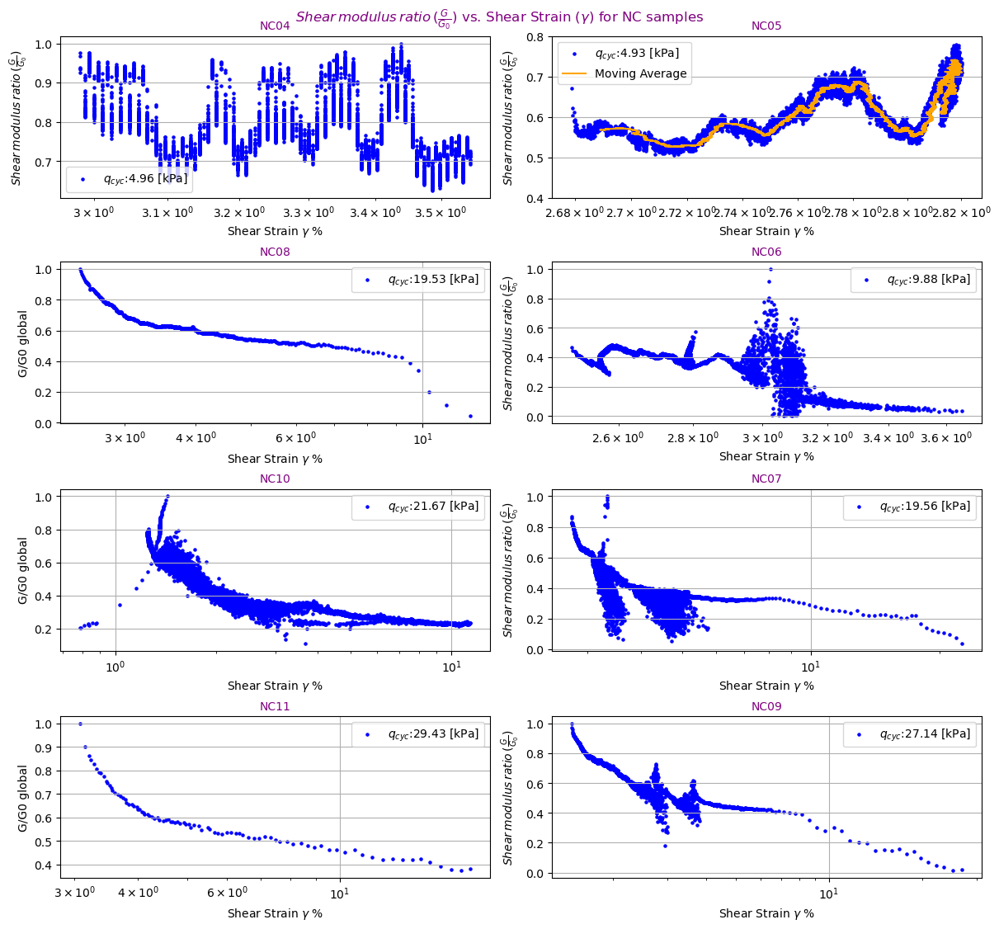

In [124]:


def plot_NC04(ax):
    window_size = 100
    # G/G0  global
    Gmax_NC04_G = np.max(cycle_info_NC04_G['Shear_modulus_(MPa)'])
    x_values_G = unp.nominal_values(cycle_info_NC04_G['Shear Strain'])
    y_values_G = cycle_info_NC04_G['Shear_modulus_(MPa)'] / unp.nominal_values(Gmax_NC04_G)
    y_series_G_1 = pd.Series(y_values_G)
    moving_avg_G_1 = y_series_G_1.rolling(150).mean()
    ax.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC04:.2f} [kPa]', s=5)
    plt.sca(ax)  # Set the current Axes instance
    plt.xscale('log')
    ax.legend(loc='lower left')
    ax.set_xlabel(r'Shear Strain $\gamma$ %')
    ax.set_ylabel(r'$Shear\, modulus\, ratio\,(\frac{G}{G_0}$)')
    ax.set_title(r'NC04', fontsize=10, color='purple')
    ax.grid(True)

def plot_NC05(ax):
    window_size = 100
    # G/G0  global
    Gmax_NC05_G = np.max(cycle_info_NC05_G['Shear_modulus_(MPa)'])
    x_values_G = unp.nominal_values(cycle_info_NC05_G['Shear Strain'])
    y_values_G = unp.nominal_values(cycle_info_NC05_G['Shear_modulus_(MPa)']) / unp.nominal_values(Gmax_NC05_G)
    y_series_G = pd.Series(y_values_G)
    moving_avg_G = y_series_G.rolling(200).mean()

    ax.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC05:.2f} [kPa]', s=5)
    ax.plot(x_values_G, moving_avg_G, color='orange', label='Moving Average')
    ax.set_ylim([0.4, 0.8])
    plt.sca(ax)  # Set the current Axes instance
    plt.xscale('log')
    ax.tick_params(axis='both', which='major', labelsize=10)
    ax.legend(loc='upper left')
    ax.set_xlabel(r'Shear Strain $\gamma$ %')
    ax.set_ylabel(r'$Shear\, modulus\, ratio\,(\frac{G}{G_0}$)')
    ax.set_title(r'NC05', fontsize=10, color='purple')
    ax.grid(True)

def plot_NC06(ax):
    window_size = 100
    # G/G0  global
    Gmax_NC06_G = np.max(cycle_info_NC06_G['Shear_modulus_(MPa)'])

    x_values_G = unp.nominal_values(cycle_info_NC06_G['Shear Strain'])
    y_values_G = unp.nominal_values(cycle_info_NC06_G['Shear_modulus_(MPa)']) / unp.nominal_values(Gmax_NC06_G)

    y_series_G = pd.Series(y_values_G)
    moving_avg_G = y_series_G.rolling(550).mean()

    ax.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC06:.2f} [kPa]', s=5)
    plt.sca(ax)  # Set the current Axes instance
    plt.xscale('log')
    ax.tick_params(axis='both', which='major', labelsize=10)
    ax.legend(loc='upper right')
    ax.set_xlabel(r'Shear Strain $\gamma$ %')
    ax.set_ylabel(r'$Shear\, modulus\, ratio\,(\frac{G}{G_0}$)')
    ax.set_title(r'NC06', fontsize=10, color='purple')
    ax.grid(True)

def plot_NC07(ax):
    window_size = 100
    # G/G0  global
    Gmax_NC07_G = np.max(cycle_info_NC07_G['Shear_modulus_(MPa)'])

    x_values_G = unp.nominal_values(cycle_info_NC07_G['Shear Strain'])
    y_values_G = unp.nominal_values(cycle_info_NC07_G['Shear_modulus_(MPa)']) / unp.nominal_values(Gmax_NC07_G)

    y_series_G_1 = pd.Series(y_values_G)
    moving_avg_G_1 = y_series_G_1.rolling(150).mean()

    ax.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC07:.2f} [kPa]', s=5)
    plt.sca(ax)  # Set the current Axes instance
    plt.xscale('log')
    ax.legend(loc='upper right')
    ax.set_xlabel(r'Shear Strain $\gamma$ %')
    ax.set_ylabel(r'$Shear\, modulus\, ratio\,(\frac{G}{G_0}$)')
    ax.set_title(r'NC07', fontsize=10, color='purple')

    ax.grid(True)

def plot_NC08(ax):
    window_size = 100
    # G/G0  global
    Gmax_NC08_G = np.max(cycle_info_NC08_G['Shear_modulus_(MPa)'])

    x_values_G = unp.nominal_values(cycle_info_NC08_G['Shear Strain'])
    y_values_G = unp.nominal_values(cycle_info_NC08_G['Shear_modulus_(MPa)']) / unp.nominal_values(Gmax_NC08_G)

    y_series_G_1 = pd.Series(y_values_G)
    moving_avg_G_1 = y_series_G_1.rolling(150).mean()

    ax.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC08:.2f} [kPa]', s=5)
    plt.sca(ax)  # Set the current Axes instance
    plt.xscale('log')
    ax.legend(loc='upper right')
    ax.set_xlabel(r'Shear Strain $\gamma$ %')
    ax.set_ylabel(r'G/G0 global')
    ax.set_title(r'NC08', fontsize=10, color='purple')
    ax.grid(True)

def plot_NC09(ax):
    window_size = 100
    # G/G0  global
    Gmax_NC09_G = np.max(cycle_info_NC09_G['Shear_modulus_(MPa)'])

    x_values_G = unp.nominal_values(cycle_info_NC09_G['Shear Strain'])
    y_values_G = unp.nominal_values(cycle_info_NC09_G['Shear_modulus_(MPa)']) / unp.nominal_values(Gmax_NC09_G)

    y_series_G_1 = pd.Series(y_values_G)
    moving_avg_G_1 = y_series_G_1.rolling(150).mean()

    ax.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC09:.2f} [kPa]', s=5)
    plt.sca(ax)  # Set the current Axes instance
    plt.xscale('log')
    ax.legend(loc='upper right')
    ax.set_xlabel(r'Shear Strain $\gamma$ %')
    ax.set_ylabel(r'$Shear\, modulus\, ratio\,(\frac{G}{G_0}$)')
    ax.set_title(r'NC09', fontsize=10, color='purple')
    ax.grid(True)

def plot_NC10(ax):
    window_size = 100
    # G/G0  global
    Gmax_NC10_G = np.max(cycle_info_NC10_G['Shear_modulus_(MPa)'])

    x_values_G = unp.nominal_values(cycle_info_NC10_G['Shear Strain'])
    y_values_G = unp.nominal_values(cycle_info_NC10_G['Shear_modulus_(MPa)']) / unp.nominal_values(Gmax_NC10_G)

    y_series_G_1 = pd.Series(y_values_G)
    moving_avg_G_1 = y_series_G_1.rolling(150).mean()

    ax.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC10:.2f} [kPa]', s=5)
    plt.sca(ax)  # Set the current Axes instance
    plt.xscale('log')
    ax.legend(loc='upper right')
    ax.set_xlabel(r'Shear Strain $\gamma$ %')
    ax.set_ylabel(r'G/G0 global')
    ax.set_title(r'NC10', fontsize=10, color='purple')
    ax.grid(True)

def plot_NC11(ax):
    window_size = 100
    # G/G0  global
    Gmax_NC11_G = np.max(cycle_info_NC11_G['Shear_modulus_(MPa)'])

    x_values_G = unp.nominal_values(cycle_info_NC11_G['Shear Strain'])
    y_values_G = unp.nominal_values(cycle_info_NC11_G['Shear_modulus_(MPa)']) / unp.nominal_values(Gmax_NC11_G)

    y_series_G_1 = pd.Series(y_values_G)
    moving_avg_G_1 = y_series_G_1.rolling(150).mean()

    ax.scatter(x_values_G, y_values_G, color='blue', label=f'$q_{{cyc}}$:{qcyc_NC11:.2f} [kPa]', s=5)
    plt.sca(ax)  # Set the current Axes instance
    plt.xscale('log')
    ax.legend(loc='upper right')
    ax.set_xlabel(r'Shear Strain $\gamma$ %')
    ax.set_ylabel(r'G/G0 global')
    ax.set_title(r'NC11', fontsize=10, color='purple')
    ax.grid(True)

fig, axs = plt.subplots(4, 2, figsize=(12, 11), constrained_layout=True)

# First row
plot_NC04(axs[0, 0])
plot_NC08(axs[1, 0])
plot_NC10(axs[2, 0])
plot_NC11(axs[3, 0])

# Second row
plot_NC05(axs[0, 1])
plot_NC06(axs[1, 1])
plot_NC07(axs[2, 1])
plot_NC09(axs[3, 1])

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.7, wspace=0.3)
fig.suptitle(r'$ Shear\, modulus\, ratio\,(\frac{G}{G_0}$) vs. Shear Strain ($\gamma$) for NC samples', fontsize=12, color='purple', y=1.01)
# Save figure
plt.savefig('shear_modulus_ratio.pdf', bbox_inches='tight')

## PWP $\Delta \text{{u}}$

<>:30: SyntaxWarning: invalid escape sequence '\D'
<>:30: SyntaxWarning: invalid escape sequence '\D'
C:\Users\local_zakial\Temp\ipykernel_20300\3083728854.py:30: SyntaxWarning: invalid escape sequence '\D'
  ax.set_title('Loop Number vs. $\Delta$u [kPa] for LCC samples', fontsize=16, color='purple')


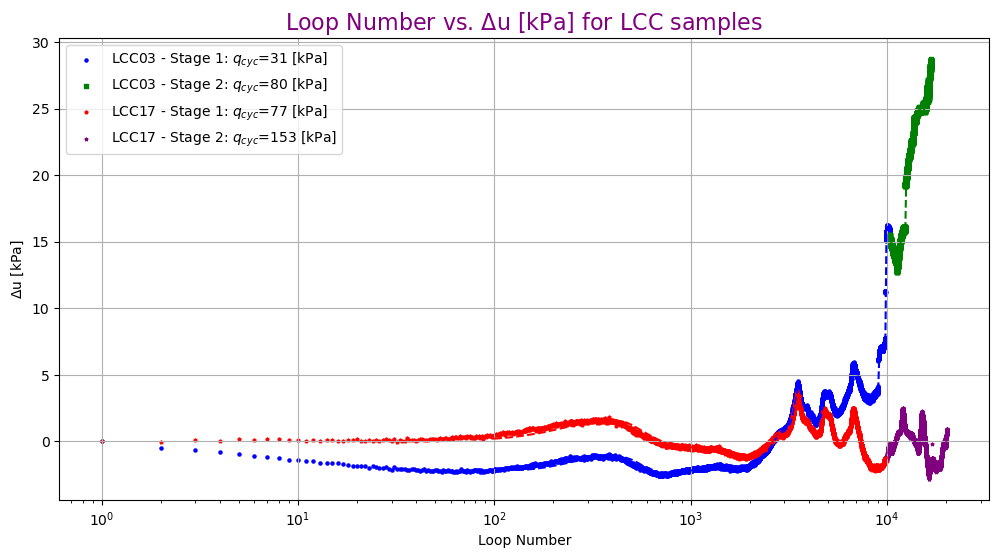

In [125]:
# Function to plot Loop Number vs. Delta u
def plot_delta_u(ax, sample_name, stage, cycle_info, qcyc, color, marker):
    window_size = 100
    x_values = cycle_info['Loop_Number']
    y_values = unp.nominal_values(cycle_info['delta_pwp'])
    y_series = pd.Series(y_values)
    moving_avg = y_series.rolling(100).mean()

    ax.scatter(x_values, y_values, color=color, label=f'{sample_name} - Stage {stage}: $q_{{cyc}}$={qcyc:.0f} [kPa]', marker=marker, s=5)
    ax.plot(x_values, moving_avg, color=color, linestyle='--')
    ax.set_xscale('log')
    ax.set_xlabel(r'Loop Number')
    ax.set_ylabel(r'$\Delta$u [kPa]')
    ax.legend(loc='upper left')
    ax.grid(True)


# Create a single figure and axis
fig, ax = plt.subplots(figsize=(12, 6))

# Plot Loop Number vs. Delta u for LCC03
plot_delta_u(ax, 'LCC03', 1, cycle_info_LCC03_G_1, qcyc_LCC03_1, color='blue', marker='o')
plot_delta_u(ax, 'LCC03', 2, cycle_info_LCC03_G_2, qcyc_LCC03_2, color='green', marker='s')

# Plot Loop Number vs. Delta u for LCC17
plot_delta_u(ax, 'LCC17', 1, cycle_info_LCC17_G_1, qcyc_LCC17_1, color='red', marker='p')
plot_delta_u(ax, 'LCC17', 2, cycle_info_LCC17_G_2, qcyc_LCC17_2, color='purple', marker='*')

# Set the title
ax.set_title('Loop Number vs. $\Delta$u [kPa] for LCC samples', fontsize=16, color='purple')

# Save figure
plt.savefig('delta_u_lcc.pdf', bbox_inches='tight')

<>:33: SyntaxWarning: invalid escape sequence '\D'
<>:33: SyntaxWarning: invalid escape sequence '\D'
C:\Users\local_zakial\Temp\ipykernel_20300\4170466880.py:33: SyntaxWarning: invalid escape sequence '\D'
  fig.suptitle(f'$ Loop Number vs. $\Delta$u [kPa] for NC samples$', fontsize=16, color='purple', y=1.04)
C:\Users\local_zakial\Temp\ipykernel_20300\4170466880.py:32: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(hspace=0.7, wspace=0.3)


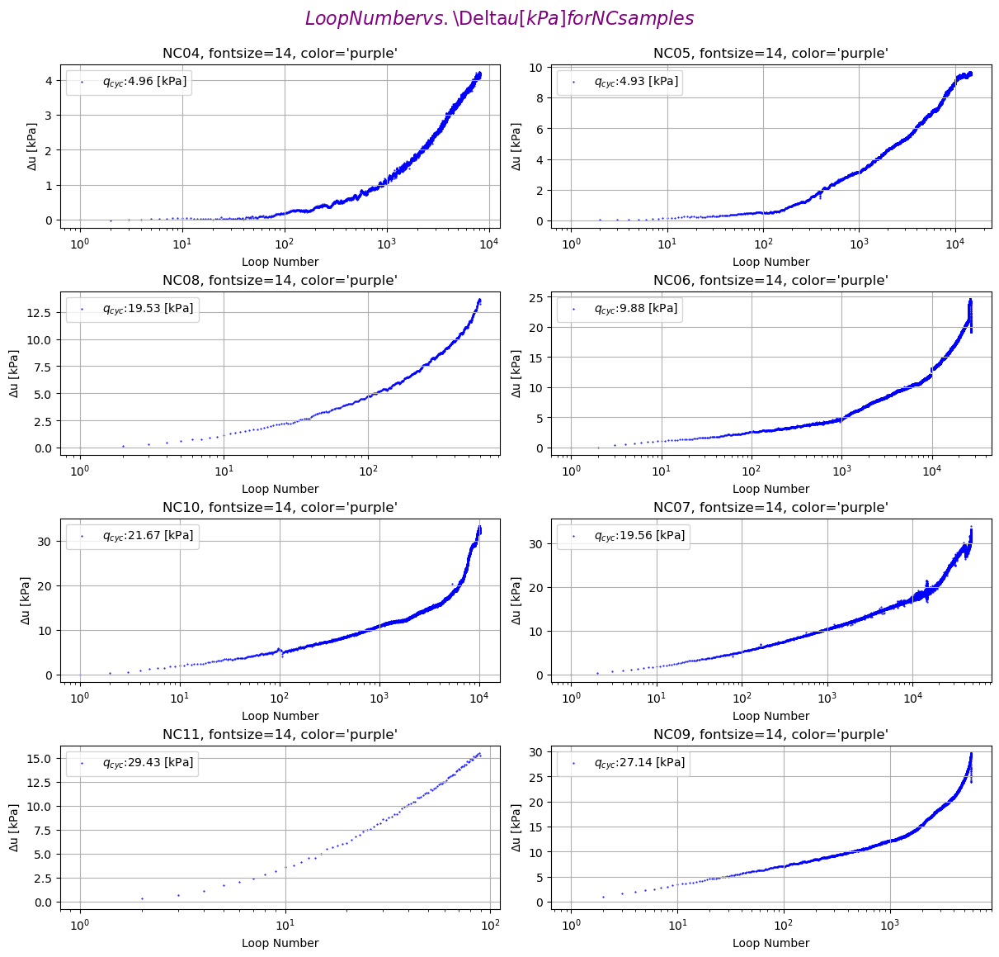

In [126]:
# Function to plot Loop Number vs. Delta u
def plot_delta_u(ax, sample_name, cycle_info, qcyc):
    window_size = 10
    x_values = cycle_info['Loop_Number']
    y_values = unp.nominal_values(cycle_info['delta_pwp'])
    y_series = pd.Series(y_values)
    moving_avg = y_series.rolling(100).mean()

    ax.scatter(x_values, y_values, color='blue', label=f'$q_{{cyc}}$:{qcyc:.2f} [kPa]', s=0.3)
    ax.set_xscale('log')
    ax.set_xlabel(r'Loop Number')
    ax.set_ylabel(r'$\Delta$u [kPa]')
    ax.set_title(f"{sample_name}, fontsize=14, color='purple'")
    ax.legend(loc='upper left')
    ax.grid(True)

# Create subplots
fig, axs = plt.subplots(4, 2, figsize=(12, 11), constrained_layout=True)

# Plot Loop Number vs. Delta u for each sample
plot_delta_u(axs[0, 0], 'NC04', cycle_info_NC04_G, qcyc_NC04)
plot_delta_u(axs[1, 0], 'NC08', cycle_info_NC08_G, qcyc_NC08)
plot_delta_u(axs[2, 0], 'NC10', cycle_info_NC10_G, qcyc_NC10)
plot_delta_u(axs[3, 0], 'NC11', cycle_info_NC11_G, qcyc_NC11)

plot_delta_u(axs[0, 1], 'NC05', cycle_info_NC05_G, qcyc_NC05)
plot_delta_u(axs[1, 1], 'NC06', cycle_info_NC06_G, qcyc_NC06)
plot_delta_u(axs[2, 1], 'NC07', cycle_info_NC07_G, qcyc_NC07)
plot_delta_u(axs[3, 1], 'NC09', cycle_info_NC09_G, qcyc_NC09)

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.7, wspace=0.3)
fig.suptitle(f'$ Loop Number vs. $\Delta$u [kPa] for NC samples$', fontsize=16, color='purple', y=1.04)
# Save figure
plt.savefig('delta_u.pdf', bbox_inches='tight')

<>:28: SyntaxWarning: invalid escape sequence '\D'
<>:28: SyntaxWarning: invalid escape sequence '\D'
C:\Users\local_zakial\Temp\ipykernel_20300\1106149404.py:28: SyntaxWarning: invalid escape sequence '\D'
  ax.set_title('Loop Number vs. $\Delta$u [kPa] for NC samples', fontsize=12, color='purple')


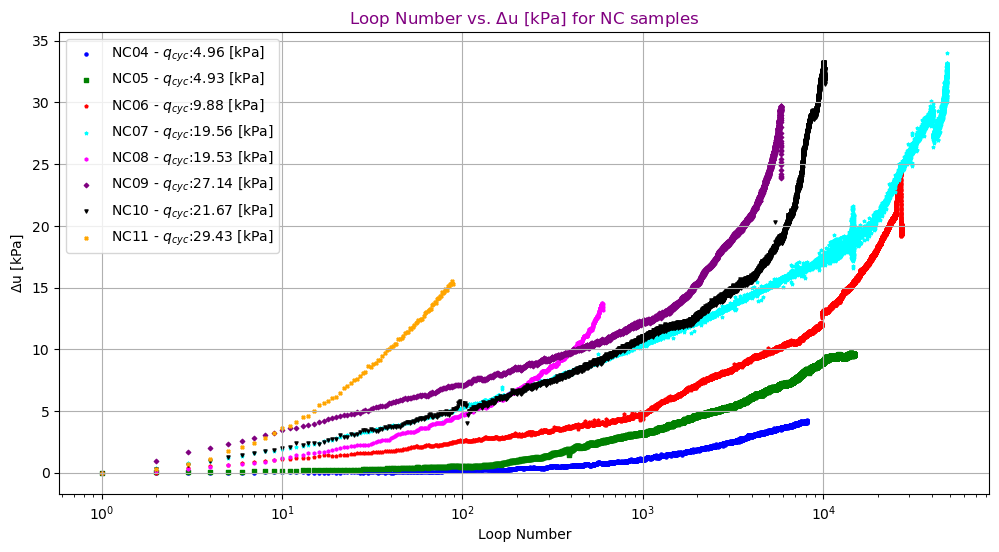

In [127]:
# Function to plot Loop Number vs. Delta u
def plot_delta_u(ax, sample_name, cycle_info, qcyc, color, marker):
    window_size = 10
    x_values = cycle_info['Loop_Number']
    y_values = unp.nominal_values(cycle_info['delta_pwp'])

    ax.scatter(x_values, y_values, color=color, label=f'{sample_name} - $q_{{cyc}}$:{qcyc:.2f} [kPa]', marker=marker, s=5)
    ax.set_xscale('log')
    ax.set_xlabel(r'Loop Number')
    ax.set_ylabel(r'$\Delta$u [kPa]')
    ax.legend(loc='upper left')
    ax.grid(True)

# Create a single figure and axis
fig, ax = plt.subplots(figsize=(12, 6))

# Plot Loop Number vs. Delta u for each sample with different colors and markers
plot_delta_u(ax, 'NC04', cycle_info_NC04_G, qcyc_NC04, color='blue', marker='o')
plot_delta_u(ax, 'NC05', cycle_info_NC05_G, qcyc_NC05, color='green', marker='s')
plot_delta_u(ax, 'NC06', cycle_info_NC06_G, qcyc_NC06, color='red', marker='p')
plot_delta_u(ax, 'NC07', cycle_info_NC07_G, qcyc_NC07, color='cyan', marker='*')
plot_delta_u(ax, 'NC08', cycle_info_NC08_G, qcyc_NC08, color='magenta', marker='h')
plot_delta_u(ax, 'NC09', cycle_info_NC09_G, qcyc_NC09, color='purple', marker='D')
plot_delta_u(ax, 'NC10', cycle_info_NC10_G, qcyc_NC10, color='black', marker='v')
plot_delta_u(ax, 'NC11', cycle_info_NC11_G, qcyc_NC11, color='orange', marker='X')

# Set the title
ax.set_title('Loop Number vs. $\Delta$u [kPa] for NC samples', fontsize=12, color='purple')

# Save figure
plt.savefig('delta_u.pdf', bbox_inches='tight')

## Damping ratio & qcyc LCC global

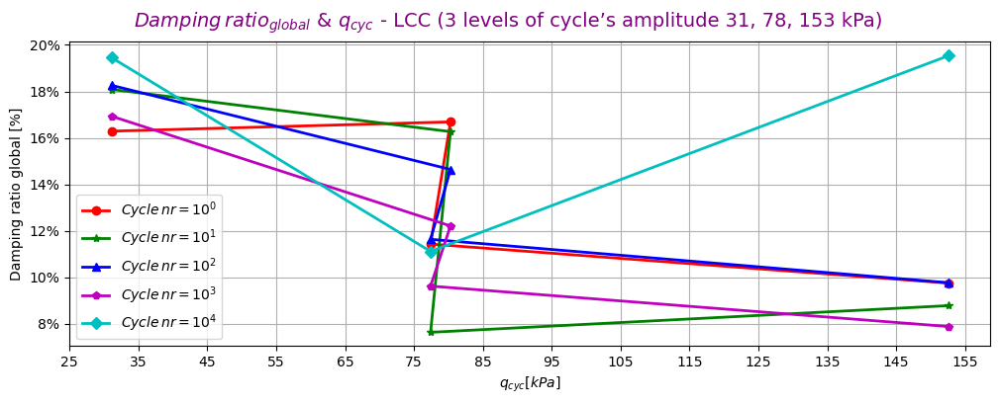

In [128]:
from matplotlib.ticker import FuncFormatter
n0 = 10**0 ; n1 = 10**1 ; n2 = 10**2 ; n3 = 10**3 ; n4 = 10**4 

qcyc_10 = unp.nominal_values(Stage_info_LCC03.loc[0]['qcyc'])      
qcyc_20 = unp.nominal_values(Stage_info_LCC03.loc[1]['qcyc'])    
qcyc_30 = unp.nominal_values(Stage_info_LCC17.loc[0]['qcyc'])  
qcyc_40 = unp.nominal_values(Stage_info_LCC17.loc[1]['qcyc'])  
qcyc_E = np.array([qcyc_10, qcyc_20, qcyc_30, qcyc_40])        

Damping_10    = unp.nominal_values(cycle_info_LCC03_G_1.loc[n0]['Damping_ratio']) ; Damping_11    = unp.nominal_values(cycle_info_LCC03_G_1.loc[n1]['Damping_ratio']) 
Damping_20    = unp.nominal_values(cycle_info_LCC03_G_2.loc[n0]['Damping_ratio']) ; Damping_21    = unp.nominal_values(cycle_info_LCC03_G_2.loc[n1]['Damping_ratio']) 
Damping_30    = unp.nominal_values(cycle_info_LCC17_G_1.loc[n0]['Damping_ratio']) ; Damping_31    = unp.nominal_values(cycle_info_LCC17_G_1.loc[n1]['Damping_ratio']) 
Damping_40    = unp.nominal_values(cycle_info_LCC17_G_2.loc[n0]['Damping_ratio']) ; Damping_41    = unp.nominal_values(cycle_info_LCC17_G_2.loc[n1]['Damping_ratio']) 
Damping_0     = np.array([Damping_10, Damping_20, Damping_30, Damping_40])         ; Damping_1     = np.array([Damping_11, Damping_21, Damping_31, Damping_41])  

Damping_12    = unp.nominal_values(cycle_info_LCC03_G_1.loc[n2]['Damping_ratio']) ; Damping_13    = unp.nominal_values(cycle_info_LCC03_G_1.loc[n3]['Damping_ratio']) 
Damping_22    = unp.nominal_values(cycle_info_LCC03_G_2.loc[n2]['Damping_ratio']) ; Damping_23    = unp.nominal_values(cycle_info_LCC03_G_2.loc[n3]['Damping_ratio']) 
Damping_32    = unp.nominal_values(cycle_info_LCC17_G_1.loc[n2]['Damping_ratio']) ; Damping_33    = unp.nominal_values(cycle_info_LCC17_G_1.loc[n3]['Damping_ratio']) 
Damping_42    = unp.nominal_values(cycle_info_LCC17_G_2.loc[n2]['Damping_ratio']) ; Damping_43    = unp.nominal_values(cycle_info_LCC17_G_2.loc[n3]['Damping_ratio']) 
Damping_2     = np.array([Damping_12, Damping_22, Damping_32, Damping_42])         ; Damping_3     = np.array([Damping_13, Damping_23, Damping_33, Damping_43])  


Damping_14    = unp.nominal_values(cycle_info_LCC03_G_1.loc[n4]['Damping_ratio']) 
Damping_34    = unp.nominal_values(cycle_info_LCC17_G_1.loc[n4]['Damping_ratio']) 
Damping_44    = unp.nominal_values(cycle_info_LCC17_G_2.loc[n4]['Damping_ratio']) 
qcyc_E4 = np.array([qcyc_10, qcyc_30, qcyc_40])
Damping_4     = np.array([Damping_14, Damping_34, Damping_44])     

plt.figure(figsize=(12, 4)) 
plt.plot(qcyc_E, Damping_0, color='r', marker='o', linewidth=2, label=r'$Cycle\,  nr = 10^{0}$')
plt.plot(qcyc_E, Damping_1, color='g', marker='*', linewidth=2, label=r'$Cycle\,  nr = 10^{1}$')
plt.plot(qcyc_E, Damping_2, color='b', marker='^', linewidth=2, label=r'$Cycle\,  nr = 10^{2}$')
plt.plot(qcyc_E, Damping_3, color='m', marker='p', linewidth=2, label=r'$Cycle\,  nr = 10^{3}$')
plt.plot(qcyc_E4, Damping_4, color='c', marker='D', linewidth=2, label=r'$Cycle\, nr = 10^{4}$')


plt.legend(loc='lower left')
plt.xlabel(r'$q_{cyc} [kPa]$')
plt.ylabel('Damping ratio global [%]')
plt.xticks(np.arange(25, 161, 10), minor=False)

# Convert y-axis ticks to percentages
formatter = FuncFormatter(lambda y, _: f"{y:.0%}")
plt.gca().yaxis.set_major_formatter(formatter)
plt.text(0.20, 1.05, r'$Damping \, ratio_{global} \,\,  & \,\,  q_{cyc}$', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.61, 1.05, '- LCC (3 levels of cycle’s amplitude 31, 78, 153 kPa)', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()

## Damping ratio & qcyc LCC Local

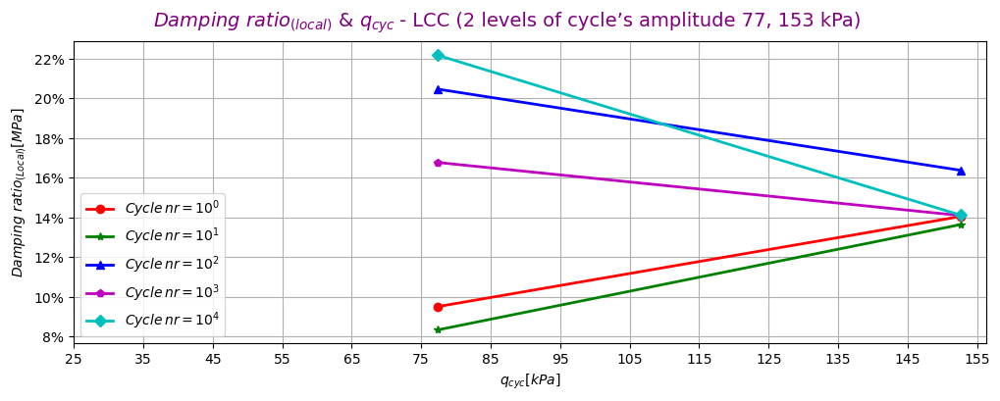

In [129]:
n0 = 10**0 ; n1 = 10**1 ; n2 = 10**2 ; n3 = 10**3 ; n4 = 10**4 

qcyc_30 = unp.nominal_values(Stage_info_LCC17.loc[0]['qcyc'])  
qcyc_40 = unp.nominal_values(Stage_info_LCC17.loc[1]['qcyc'])  
qcyc_E = np.array([qcyc_30, qcyc_40])        


Damping_30    = unp.nominal_values(cycle_info_LCC17_L_1.loc[n0]['Damping_ratio']) ; Damping_31    = unp.nominal_values(cycle_info_LCC17_L_1.loc[n1]['Damping_ratio']) 
Damping_40    = unp.nominal_values(cycle_info_LCC17_L_2.loc[n0]['Damping_ratio']) ; Damping_41    = unp.nominal_values(cycle_info_LCC17_L_2.loc[n1]['Damping_ratio']) 
Damping_0     = np.array([Damping_30, Damping_40])         ; Damping_1     = np.array([Damping_31, Damping_41])  


Damping_32    = unp.nominal_values(cycle_info_LCC17_L_1.loc[n2]['Damping_ratio']) ; Damping_33    = unp.nominal_values(cycle_info_LCC17_L_1.loc[n3]['Damping_ratio']) 
Damping_42    = unp.nominal_values(cycle_info_LCC17_L_2.loc[n2]['Damping_ratio']) ; Damping_43    = unp.nominal_values(cycle_info_LCC17_L_2.loc[n3]['Damping_ratio']) 
Damping_2     = np.array([Damping_32,Damping_42])         ; Damping_3     = np.array([Damping_33, Damping_43])  


Damping_34    = unp.nominal_values(cycle_info_LCC17_L_1.loc[n4]['Damping_ratio']) 
Damping_44    = unp.nominal_values(cycle_info_LCC17_L_2.loc[n4]['Damping_ratio']) 
Damping_4     = np.array([Damping_34, Damping_44])     



plt.figure(figsize=(12, 4)) 
plt.plot(qcyc_E, Damping_0, color='r', marker='o', linewidth=2, label=r'$Cycle\,  nr = 10^{0}$')
plt.plot(qcyc_E, Damping_1, color='g', marker='*', linewidth=2, label=r'$Cycle\,  nr = 10^{1}$')
plt.plot(qcyc_E, Damping_2, color='b', marker='^', linewidth=2, label=r'$Cycle\,  nr = 10^{2}$')
plt.plot(qcyc_E, Damping_3, color='m', marker='p', linewidth=2, label=r'$Cycle\,  nr = 10^{3}$')
plt.plot(qcyc_E ,Damping_4, color='c', marker='D', linewidth=2, label=r'$Cycle\, nr = 10^{4}$')

plt.legend(loc='lower left')
plt.xlabel(r'$q_{cyc} [kPa]$')
plt.ylabel(r'$Damping \,\, ratio_{(Local)} [MPa]$')
plt.xticks(np.arange(25, 161, 10), minor=False)
# Convert y-axis ticks to percentages
formatter = FuncFormatter(lambda y, _: f"{y:.0%}")
plt.gca().yaxis.set_major_formatter(formatter)
plt.text(0.22, 1.05, r'$Damping \,\, ratio_{(local)} \,\,  & \,\,  q_{cyc}$', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.61, 1.05, '- LCC (2 levels of cycle’s amplitude 77, 153 kPa)', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()

## Damping ratio & qcyc NC global

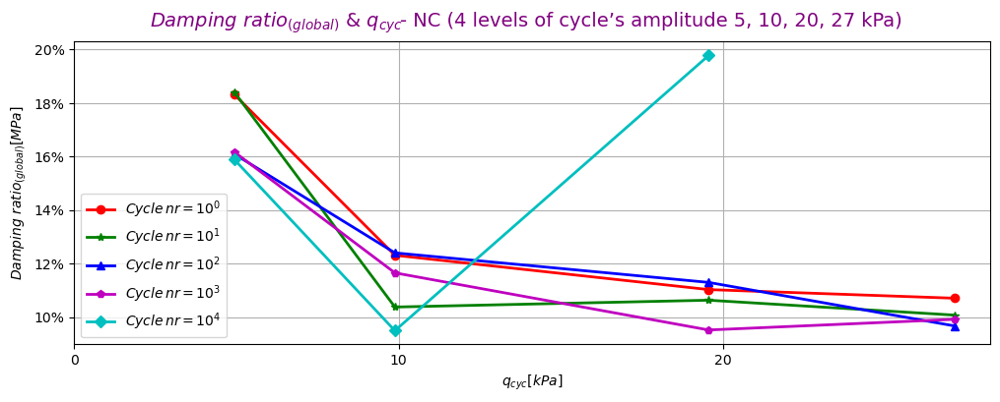

In [130]:

n0 = 10**0 ; n1 = 10**1 ; n2 = 10**2 ; n3 = 10**3 ; n4 = 10**4 

   
qcyc_10 = unp.nominal_values(Stage_info_NC05.loc[0]['qcyc'])    
qcyc_20 = unp.nominal_values(Stage_info_NC06.loc[0]['qcyc'])  
qcyc_30 = unp.nominal_values(Stage_info_NC07.loc[0]['qcyc']) 
qcyc_40 = unp.nominal_values(Stage_info_NC09.loc[0]['qcyc'])  
 
qcyc_E = np.array([qcyc_10, qcyc_20, qcyc_30, qcyc_40])        

Damping_10    = unp.nominal_values(cycle_info_NC05_G.loc[n0]['Damping_ratio']) ; Damping_11    = unp.nominal_values(cycle_info_NC05_G.loc[n1]['Damping_ratio']) 
Damping_20    = unp.nominal_values(cycle_info_NC06_G.loc[n0]['Damping_ratio']) ; Damping_21    = unp.nominal_values(cycle_info_NC06_G.loc[n1]['Damping_ratio']) 
Damping_30    = unp.nominal_values(cycle_info_NC07_G.loc[n0]['Damping_ratio']) ; Damping_31    = unp.nominal_values(cycle_info_NC07_G.loc[n1]['Damping_ratio']) 
Damping_40    = unp.nominal_values(cycle_info_NC09_G.loc[n0]['Damping_ratio']) ; Damping_41    = unp.nominal_values(cycle_info_NC09_G.loc[n1]['Damping_ratio']) 
Damping_0n     = np.array([Damping_10, Damping_20, Damping_30, Damping_40])         ; Damping_1n     = np.array([Damping_11, Damping_21, Damping_31, Damping_41])  

Damping_12    = unp.nominal_values(cycle_info_NC05_G.loc[n2]['Damping_ratio']) ; Damping_13    = unp.nominal_values(cycle_info_NC05_G.loc[n3]['Damping_ratio']) 
Damping_22    = unp.nominal_values(cycle_info_NC06_G.loc[n2]['Damping_ratio']) ; Damping_23    = unp.nominal_values(cycle_info_NC06_G.loc[n3]['Damping_ratio']) 
Damping_32    = unp.nominal_values(cycle_info_NC07_G.loc[n2]['Damping_ratio']) ; Damping_33    = unp.nominal_values(cycle_info_NC07_G.loc[n3]['Damping_ratio']) 
Damping_42    = unp.nominal_values(cycle_info_NC09_G.loc[n2]['Damping_ratio']) ; Damping_43    = unp.nominal_values(cycle_info_NC09_G.loc[n3]['Damping_ratio']) 
Damping_2n     = np.array([Damping_12, Damping_22, Damping_32, Damping_42])         ; Damping_3n     = np.array([Damping_13, Damping_23, Damping_33, Damping_43])  


Damping_14    = unp.nominal_values(cycle_info_NC05_G.loc[n4]['Damping_ratio']) 
Damping_24    = unp.nominal_values(cycle_info_NC06_G.loc[n4]['Damping_ratio']) 
Damping_34    = unp.nominal_values(cycle_info_NC07_G.loc[n4]['Damping_ratio']) 
qcyc_E4 = np.array([qcyc_10, qcyc_20, qcyc_30])
Damping_4n     = np.array([Damping_14, Damping_24, Damping_34])     

plt.figure(figsize=(12, 4)) 
plt.plot(qcyc_E, Damping_0n, color='r', marker='o', linewidth=2, label=r'$Cycle\,  nr = 10^{0}$')
plt.plot(qcyc_E, Damping_1n, color='g', marker='*', linewidth=2, label=r'$Cycle\,  nr = 10^{1}$')
plt.plot(qcyc_E, Damping_2n, color='b', marker='^', linewidth=2, label=r'$Cycle\,  nr = 10^{2}$')
plt.plot(qcyc_E, Damping_3n, color='m', marker='p', linewidth=2, label=r'$Cycle\,  nr = 10^{3}$')
plt.plot(qcyc_E4, Damping_4n, color='c', marker='D', linewidth=2, label=r'$Cycle\, nr = 10^{4}$')

plt.legend(loc='lower left')
plt.xlabel(r'$q_{cyc} [kPa]$')
plt.ylabel(r'$Damping \,\, ratio_{(global)} [MPa]$')
plt.xticks(np.arange(0, 30, 10), minor=False)
# Convert y-axis ticks to percentages
formatter = FuncFormatter(lambda y, _: f"{y:.0%}")
plt.gca().yaxis.set_major_formatter(formatter)
plt.text(0.22, 1.05, r'$Damping \,\, ratio_{(global)} \,\,  & \,\,  q_{cyc}$', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.text(0.63, 1.05, '- NC (4 levels of cycle’s amplitude 5, 10, 20, 27 kPa)', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()

## Strain Resistance

In [226]:
(unp.nominal_values(cycle_info_LCC03_G_1['C_X(%)']) / 100 )

array([0.0063165, 0.0063055, 0.0062985, ..., 0.006093 , 0.006097 ,
       0.006188 ])

### LCC03_G_1

<>:93: SyntaxWarning: invalid escape sequence '\e'
<>:93: SyntaxWarning: invalid escape sequence '\e'
C:\Users\local_zakial\Temp\ipykernel_20300\3844018693.py:93: SyntaxWarning: invalid escape sequence '\e'
  plt.plot(line_x, line_y, color='red', label=f'M${{_\epsilon}}$: {slope:.0f}')


10418


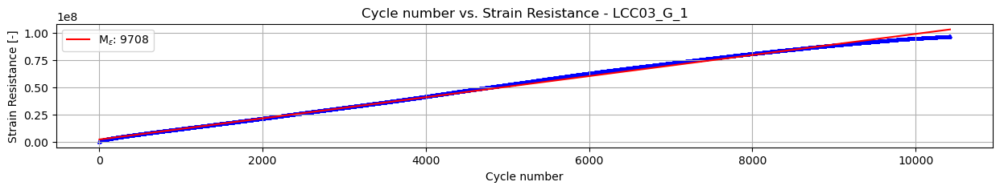

In [413]:
import matplotlib.pyplot as plt
import uncertainties.unumpy as unp
import pandas as pd

# Assuming 'Stage_info_LCC17' and 'cycle_info_LCC17_L_2' are defined DataFrame objects

Cycle_nr_LCC03_G_1 = Stage_info_LCC03.loc[0]['Cycles nr']

X1 = 1
X3 = Cycle_nr_LCC03_G_1 - 1
loop_indices = list(range(X1, X3))



Resistance0 = 0 # Initialize the accumulated strain
Resistance = []
Cyc_nr = []

for i in loop_indices:
    if i < len(cycle_info_LCC03_G_1 ) - 1:  # Check if i+1 is a valid index
        Cyc_nr0 = cycle_info_LCC03_G_1.iloc[i+1]['Loop_Number']
        c_x_increment = abs((unp.nominal_values(cycle_info_LCC03_G_1.iloc[i+1]['C_X(%)']) / 100 ) - (unp.nominal_values(cycle_info_LCC03_G_1.iloc[0]['C_X(%)']) / 100))
        if c_x_increment >0:
            #accumulated_strain = c_x_increment 
            #accumulated_strain = accumulated_strain
            Resistance0 += 1 / c_x_increment
            
            Cyc_nr.append(Cyc_nr0)
            Resistance.append(Resistance0)
            
X0 = Cyc_nr
y0 = Resistance 

print(len(Cyc_nr))
nr = np.array(np.arange(len(Resistance)))

X = np.array(nr) 
y = np.array(Resistance)

start_index = np.argmax(X >= 0)
end_index = np.argmin(X <= 6000)

X = X[start_index:end_index]
y = y[start_index:end_index]

# Define the model (linear regression)
X = X.reshape(-1, 1)
model = LinearRegression()

ransac = RANSACRegressor(model, min_samples=2, residual_threshold= 1, max_trials=10000)
ransac.fit(X, y)
inlier_mask = ransac.inlier_mask_
inlier_x = X[inlier_mask][:, 0]

# Check if the minimum and maximum x-values are captured
#min_y = np.min(Resistance)
#max_y = np.max(Resistance)
#
## Get the fitted line parameters (slope and intercept)
#slope = ransac.estimator_.coef_[0]
#intercept = ransac.estimator_.intercept_
#
## Calculate min_y and max_y using the captured boundaries
#min_x = (min_y - intercept) /slope 
#max_x = (max_y - intercept) /slope 
#
## Calculate the line using the gradient and intercept
#line_x = np.linspace(min_x, max_x, 100)
#line_y = slope * line_x + intercept
##line_x = np.e**line_x

min_x = np.min(X0)
max_x = np.max(X0)

# Get the fitted line parameters (slope and intercept)
slope = ransac.estimator_.coef_[0]
intercept = ransac.estimator_.intercept_

# Calculate min_y and max_y using the captured boundaries
min_y = slope * min_x + intercept
max_y = slope * max_x + intercept
# Calculate the line using the gradient and intercept
line_x = np.linspace(min_x, max_x, 100)
line_y = slope * line_x + intercept



Me_LCC03_G_1 = slope


plt.figure(figsize=(15, 2))
plt.scatter(nr, Resistance, s=5, c='b', marker='^')
plt.plot(line_x, line_y, color='red', label=f'M${{_\epsilon}}$: {slope:.0f}')
plt.xlabel("Cycle number")
plt.ylabel('Strain Resistance [-]')
plt.grid(True) 
plt.legend()
#plt.xscale('log')
plt.title('Cycle number vs. Strain Resistance - LCC03_G_1')
plt.show()

### LCC03_G_2

<>:76: SyntaxWarning: invalid escape sequence '\e'
<>:76: SyntaxWarning: invalid escape sequence '\e'
C:\Users\local_zakial\Temp\ipykernel_20300\4271422611.py:76: SyntaxWarning: invalid escape sequence '\e'
  plt.plot(line_x, line_y, color='red', label=f'M${{_\epsilon}}$: {slope:.0f}')


6349


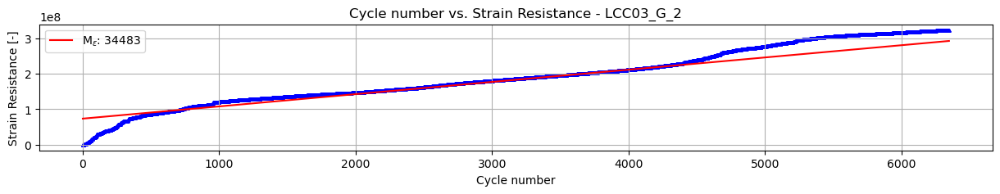

In [381]:
import matplotlib.pyplot as plt
import uncertainties.unumpy as unp
import pandas as pd

# Assuming 'Stage_info_LCC17' and 'cycle_info_LCC17_L_2' are defined DataFrame objects

Cycle_nr_LCC03_G_2 = Stage_info_LCC03.loc[1]['Cycles nr']

X1 = 1
X3 = Cycle_nr_LCC03_G_2 - 1
loop_indices = list(range(X1, X3))



Resistance0 = 0 # Initialize the accumulated strain
Resistance = []
Cyc_nr = []

for i in loop_indices:
    if i < len(cycle_info_LCC03_G_2 ) - 1:  # Check if i+1 is a valid index
        Cyc_nr0 = cycle_info_LCC03_G_2.iloc[i+1]['Loop_Number']
        c_x_increment = abs((unp.nominal_values(cycle_info_LCC03_G_2.iloc[i+1]['C_X(%)']) / 100 ) - (unp.nominal_values(cycle_info_LCC03_G_2.iloc[0]['C_X(%)']) / 100))
        if c_x_increment >0:
            #accumulated_strain = c_x_increment 
            #accumulated_strain = accumulated_strain
            Resistance0 += 1 / c_x_increment
            
            Cyc_nr.append(Cyc_nr0)
            Resistance.append(Resistance0)
            
X0 = Cyc_nr
y0 = Resistance 

print(len(Cyc_nr))
nr = np.array(np.arange(len(Resistance)))

X = np.array(nr) 
y = np.array(Resistance)

start_index = np.argmax(X >= 1000)
end_index = np.argmin(X <= 4500)

X = X[start_index:end_index]
y = y[start_index:end_index]

# Define the model (linear regression)
X = X.reshape(-1, 1)
model = LinearRegression()

ransac = RANSACRegressor(model, min_samples=2, residual_threshold= 1, max_trials=1000)
ransac.fit(X, y)
inlier_mask = ransac.inlier_mask_
inlier_x = X[inlier_mask][:, 0]

min_x = np.min(nr)
max_x = np.max(nr)

# Get the fitted line parameters (slope and intercept)
slope = ransac.estimator_.coef_[0]
intercept = ransac.estimator_.intercept_

# Calculate min_y and max_y using the captured boundaries
min_y = slope * min_x + intercept
max_y = slope * max_x + intercept
# Calculate the line using the gradient and intercept
line_x = np.linspace(min_x, max_x, 100)
line_y = slope * line_x + intercept



Me_LCC03_G_2 = slope


plt.figure(figsize=(15, 2))
plt.scatter(nr, Resistance, s=5, c='b', marker='^')
plt.plot(line_x, line_y, color='red', label=f'M${{_\epsilon}}$: {slope:.0f}')
plt.xlabel("Cycle number")
plt.ylabel('Strain Resistance [-]')
plt.grid(True) 
plt.legend()
#plt.xscale('log')
plt.title('Cycle number vs. Strain Resistance - LCC03_G_2')
plt.show()

### LCC17_G_1

<>:75: SyntaxWarning: invalid escape sequence '\e'
<>:75: SyntaxWarning: invalid escape sequence '\e'
C:\Users\local_zakial\Temp\ipykernel_20300\1041576573.py:75: SyntaxWarning: invalid escape sequence '\e'
  plt.plot(line_x, line_y, color='red', label=f'M${{_\epsilon}}$: {slope:.0f}')


4189


<Figure size 1500x200 with 0 Axes>

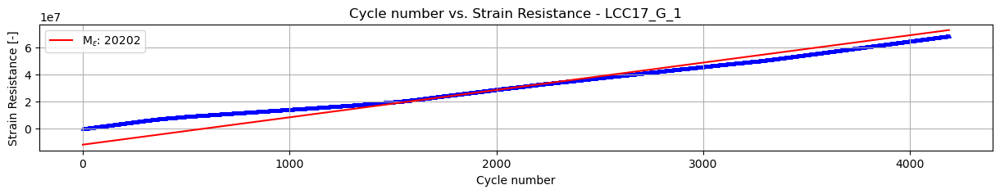

In [415]:
import matplotlib.pyplot as plt
import uncertainties.unumpy as unp
import pandas as pd

# Assuming 'Stage_info_LCC17' and 'cycle_info_LCC17_L_2' are defined DataFrame objects

Cycle_nr_LCC17_G_1 = Stage_info_LCC17.loc[0]['Cycles nr']

X1 = 1
X3 = Cycle_nr_LCC17_G_1 - 1
loop_indices_1 = list(range(X1, X3))

plt.figure(figsize=(15, 2))

Resistance0 = 0 # Initialize the accumulated strain
Resistance = []
Cyc_nr = []


for i in loop_indices_1:
    if i < len(cycle_info_LCC17_G_1) - 1:  # Check if i+1 is a valid index
        Cyc_nr0 = unp.nominal_values(cycle_info_LCC17_G_1.iloc[i+1]['Loop_Number'])
        c_x_increment = abs(unp.nominal_values(cycle_info_LCC17_G_1.iloc[i+1]['C_X(%)']) -  unp.nominal_values(cycle_info_LCC17_G_1.iloc[0]['C_X(%)'])) / 100
        if c_x_increment >0:
            #accumulated_strain = c_x_increment 
            #accumulated_strain = accumulated_strain
            Resistance0 += 1 / c_x_increment
            Cyc_nr.append(Cyc_nr0)
            Resistance.append(Resistance0)
            
X0 = Cyc_nr
y0 = Resistance 

print(len(Cyc_nr))
nr = np.array(np.arange(len(Resistance)))

X = np.array(nr) 
y = np.array(Resistance)

start_index = np.argmax(X >= 1800)
end_index = np.argmin(X <= 2500)

X = X[start_index:end_index]
y = y[start_index:end_index]

# Define the model (linear regression)
X = X.reshape(-1, 1)
model = LinearRegression()

ransac = RANSACRegressor(model, min_samples=2, residual_threshold= 1.5, max_trials=10000)
ransac.fit(X, y)
inlier_mask = ransac.inlier_mask_
inlier_x = X[inlier_mask][:, 0]

min_x = np.min(nr)
max_x = np.max(nr)

# Get the fitted line parameters (slope and intercept)
slope = ransac.estimator_.coef_[0]
intercept = ransac.estimator_.intercept_

# Calculate min_y and max_y using the captured boundaries
min_y = slope * min_x + intercept
max_y = slope * max_x + intercept
# Calculate the line using the gradient and intercept
line_x = np.linspace(min_x, max_x, 100)
line_y = slope * line_x + intercept

Me_LCC17_G_1 = slope



plt.figure(figsize=(15, 2))
plt.scatter(nr, Resistance, s=5, c='b', marker='^')
plt.plot(line_x, line_y, color='red', label=f'M${{_\epsilon}}$: {slope:.0f}')
plt.xlabel("Cycle number")
plt.ylabel('Strain Resistance [-]')
plt.grid(True) 
plt.legend()
#plt.xscale('log')
plt.title('Cycle number vs. Strain Resistance - LCC17_G_1')
plt.show()

### LCC17_G_2

<>:75: SyntaxWarning: invalid escape sequence '\e'
<>:75: SyntaxWarning: invalid escape sequence '\e'
C:\Users\local_zakial\Temp\ipykernel_20300\4107694464.py:75: SyntaxWarning: invalid escape sequence '\e'
  plt.plot(line_x, line_y, color='red', label=f'M${{_\epsilon}}$: {slope:.0f}')


8525


<Figure size 1500x200 with 0 Axes>

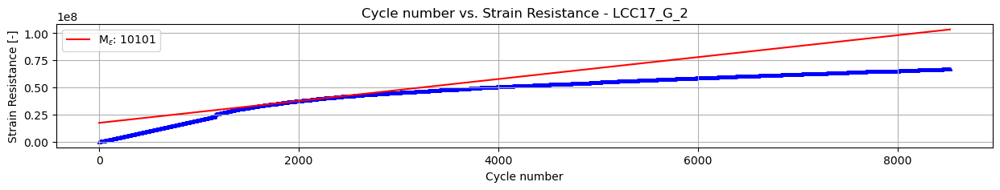

In [271]:
import matplotlib.pyplot as plt
import uncertainties.unumpy as unp
import pandas as pd

# Assuming 'Stage_info_LCC17' and 'cycle_info_LCC17_L_2' are defined DataFrame objects

Cycle_nr_LCC17_G_2 = Stage_info_LCC17.loc[1]['Cycles nr']

X1 = 1
X3 = Cycle_nr_LCC17_G_2 - 1
loop_indices_2 = list(range(X1, X3))

plt.figure(figsize=(15, 2))

Resistance0 = 0 # Initialize the accumulated strain
Resistance = []
Cyc_nr = []


for i in loop_indices_2:
    if i < len(cycle_info_LCC17_G_2) - 1:  # Check if i+1 is a valid index
        Cyc_nr0 = unp.nominal_values(cycle_info_LCC17_G_2.iloc[i+1]['Loop_Number'])
        c_x_increment = abs(unp.nominal_values(cycle_info_LCC17_G_2.iloc[i+1]['C_X(%)']) -  unp.nominal_values(cycle_info_LCC17_G_2.iloc[0]['C_X(%)'])) / 100
        if c_x_increment >0:
            #accumulated_strain = c_x_increment 
            #accumulated_strain = accumulated_strain
            Resistance0 += 1 / c_x_increment
            Cyc_nr.append(Cyc_nr0)
            Resistance.append(Resistance0)
            
X0 = Cyc_nr
y0 = Resistance 

print(len(Cyc_nr))
nr = np.array(np.arange(len(Resistance)))

X = np.array(nr) 
y = np.array(Resistance)

start_index = np.argmax(X >= 1800)
end_index = np.argmin(X <= 5500)

X = X[start_index:end_index]
y = y[start_index:end_index]

# Define the model (linear regression)
X = X.reshape(-1, 1)
model = LinearRegression()

ransac = RANSACRegressor(model, min_samples=2, residual_threshold= 1.5, max_trials=10000)
ransac.fit(X, y)
inlier_mask = ransac.inlier_mask_
inlier_x = X[inlier_mask][:, 0]

min_x = np.min(nr)
max_x = np.max(nr)

# Get the fitted line parameters (slope and intercept)
slope = ransac.estimator_.coef_[0]
intercept = ransac.estimator_.intercept_

# Calculate min_y and max_y using the captured boundaries
min_y = slope * min_x + intercept
max_y = slope * max_x + intercept
# Calculate the line using the gradient and intercept
line_x = np.linspace(min_x, max_x, 100)
line_y = slope * line_x + intercept

Me_LCC17_G_2 = slope



plt.figure(figsize=(15, 2))
plt.scatter(nr, Resistance, s=5, c='b', marker='^')
plt.plot(line_x, line_y, color='red', label=f'M${{_\epsilon}}$: {slope:.0f}')
plt.xlabel("Cycle number")
plt.ylabel('Strain Resistance [-]')
plt.grid(True) 
plt.legend()
#plt.xscale('log')
plt.title('Cycle number vs. Strain Resistance - LCC17_G_2')
plt.show()

### LCC17_L_1

<>:75: SyntaxWarning: invalid escape sequence '\e'
<>:75: SyntaxWarning: invalid escape sequence '\e'
C:\Users\local_zakial\Temp\ipykernel_20300\610076079.py:75: SyntaxWarning: invalid escape sequence '\e'
  plt.plot(line_x, line_y, color='red', label=f'M${{_\epsilon}}$: {slope:.0f}')


4884


<Figure size 1500x200 with 0 Axes>

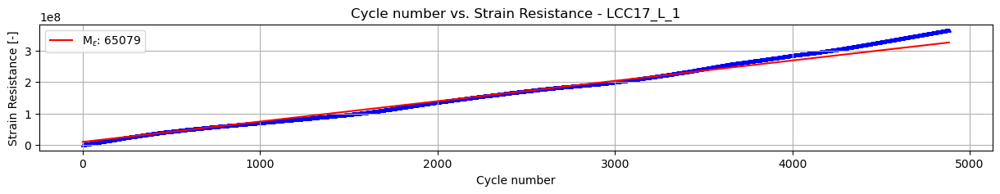

In [285]:
import matplotlib.pyplot as plt
import uncertainties.unumpy as unp
import pandas as pd

# Assuming 'Stage_info_LCC17' and 'cycle_info_LCC17_L_2' are defined DataFrame objects

Cycle_nr_LCC17_L_1 = Stage_info_LCC17.loc[0]['Cycles nr']

X1 = 1
X3 = Cycle_nr_LCC17_L_1 - 1
loop_indices_1 = list(range(X1, X3))

plt.figure(figsize=(15, 2))

Resistance0 = 0 # Initialize the accumulated strain
Resistance = []
Cyc_nr = []


for i in loop_indices_1:
    if i < len(cycle_info_LCC17_L_1) - 1:  # Check if i+1 is a valid index
        Cyc_nr0 = unp.nominal_values(cycle_info_LCC17_L_1.iloc[i+1]['Loop_Number'])
        c_x_increment = (unp.nominal_values(cycle_info_LCC17_L_1.iloc[i+1]['C_X(%)']) -  unp.nominal_values(cycle_info_LCC17_L_1.iloc[0]['C_X(%)'])) / 100
        if c_x_increment >0:
            #accumulated_strain = c_x_increment 
            #accumulated_strain = accumulated_strain
            Resistance0 += 1 / c_x_increment
            Cyc_nr.append(Cyc_nr0)
            Resistance.append(Resistance0)
            
X0 = Cyc_nr
y0 = Resistance 

print(len(Cyc_nr))
nr = np.array(np.arange(len(Resistance)))

X = np.array(nr) 
y = np.array(Resistance)

start_index = np.argmax(X >= 2200)
end_index = np.argmin(X <= 2600)

X = X[start_index:end_index]
y = y[start_index:end_index]

# Define the model (linear regression)
X = X.reshape(-1, 1)
model = LinearRegression()

ransac = RANSACRegressor(model, min_samples=2, residual_threshold= 1.5, max_trials=10000)
ransac.fit(X, y)
inlier_mask = ransac.inlier_mask_
inlier_x = X[inlier_mask][:, 0]

min_x = np.min(nr)
max_x = np.max(nr)

# Get the fitted line parameters (slope and intercept)
slope = ransac.estimator_.coef_[0]
intercept = ransac.estimator_.intercept_

# Calculate min_y and max_y using the captured boundaries
min_y = slope * min_x + intercept
max_y = slope * max_x + intercept
# Calculate the line using the gradient and intercept
line_x = np.linspace(min_x, max_x, 100)
line_y = slope * line_x + intercept

Me_LCC17_L_1 = slope



plt.figure(figsize=(15, 2))
plt.scatter(nr, Resistance, s=5, c='b', marker='^')
plt.plot(line_x, line_y, color='red', label=f'M${{_\epsilon}}$: {slope:.0f}')
plt.xlabel("Cycle number")
plt.ylabel('Strain Resistance [-]')
plt.grid(True) 
plt.legend()
#plt.xscale('log')
plt.title('Cycle number vs. Strain Resistance - LCC17_L_1')
plt.show()

### LCC17_L_2

<>:75: SyntaxWarning: invalid escape sequence '\e'
<>:75: SyntaxWarning: invalid escape sequence '\e'
C:\Users\local_zakial\Temp\ipykernel_20300\235243004.py:75: SyntaxWarning: invalid escape sequence '\e'
  plt.plot(line_x, line_y, color='red', label=f'M${{_\epsilon}}$: {slope:.0f}')


7855


<Figure size 1500x200 with 0 Axes>

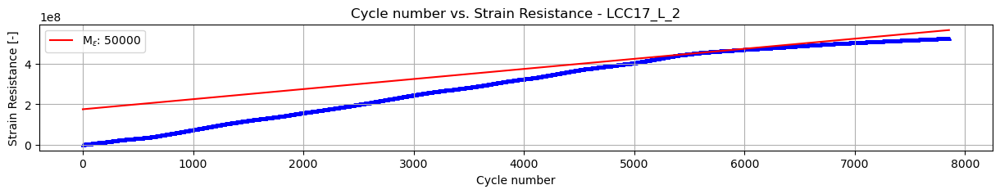

In [313]:
import matplotlib.pyplot as plt
import uncertainties.unumpy as unp
import pandas as pd

# Assuming 'Stage_info_LCC17' and 'cycle_info_LCC17_L_2' are defined DataFrame objects

Cycle_nr_LCC17_L_2 = Stage_info_LCC17.loc[1]['Cycles nr']

X1 = 1
X3 = Cycle_nr_LCC17_L_2 - 1
loop_indices_2 = list(range(X1, X3))

plt.figure(figsize=(15, 2))

Resistance0 = 0 # Initialize the accumulated strain
Resistance = []
Cyc_nr = []


for i in loop_indices_2:
    if i < len(cycle_info_LCC17_L_2) - 1:  # Check if i+1 is a valid index
        Cyc_nr0 = unp.nominal_values(cycle_info_LCC17_L_2.iloc[i+1]['Loop_Number'])
        c_x_increment = abs(unp.nominal_values(cycle_info_LCC17_L_2.iloc[i+1]['C_X(%)']) -  unp.nominal_values(cycle_info_LCC17_L_2.iloc[0]['C_X(%)'])) / 100
        if c_x_increment >0:
            #accumulated_strain = c_x_increment 
            #accumulated_strain = accumulated_strain
            Resistance0 += 1 / c_x_increment
            Cyc_nr.append(Cyc_nr0)
            Resistance.append(Resistance0)
            
X0 = Cyc_nr
y0 = Resistance 

print(len(Cyc_nr))
nr = np.array(np.arange(len(Resistance)))

X = np.array(nr) 
y = np.array(Resistance)

start_index = np.argmax(X >= 5250)
end_index = np.argmin(X <= 5780)

X = X[start_index:end_index]
y = y[start_index:end_index]

# Define the model (linear regression)
X = X.reshape(-1, 1)
model = LinearRegression()

ransac = RANSACRegressor(model, min_samples=2, residual_threshold= 1.5, max_trials=10000)
ransac.fit(X, y)
inlier_mask = ransac.inlier_mask_
inlier_x = X[inlier_mask][:, 0]

min_x = np.min(nr)
max_x = np.max(nr)

# Get the fitted line parameters (slope and intercept)
slope = ransac.estimator_.coef_[0]
intercept = ransac.estimator_.intercept_

# Calculate min_y and max_y using the captured boundaries
min_y = slope * min_x + intercept
max_y = slope * max_x + intercept
# Calculate the line using the gradient and intercept
line_x = np.linspace(min_x, max_x, 100)
line_y = slope * line_x + intercept

Me_LCC17_L_2 = slope



plt.figure(figsize=(15, 2))
plt.scatter(nr, Resistance, s=5, c='b', marker='^')
plt.plot(line_x, line_y, color='red', label=f'M${{_\epsilon}}$: {slope:.0f}')
plt.xlabel("Cycle number")
plt.ylabel('Strain Resistance [-]')
plt.grid(True) 
plt.legend()
#plt.xscale('log')
plt.title('Cycle number vs. Strain Resistance - LCC17_L_2')
plt.show()

### NC04

<>:77: SyntaxWarning: invalid escape sequence '\e'
<>:77: SyntaxWarning: invalid escape sequence '\e'
C:\Users\local_zakial\Temp\ipykernel_20300\1999740958.py:77: SyntaxWarning: invalid escape sequence '\e'
  plt.plot(line_x, line_y, color='red', label=f'M${{_\epsilon}}$: {slope:.0f}')


8142


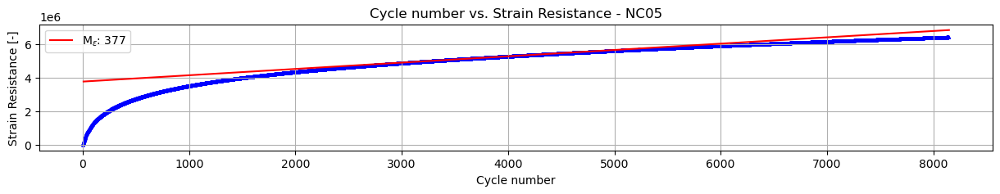

In [369]:
import matplotlib.pyplot as plt
import uncertainties.unumpy as unp
import pandas as pd

# Assuming 'Stage_info_LCC17' and 'cycle_info_LCC17_L_2' are defined DataFrame objects

Cycle_nr_NC04 = Stage_info_NC04.loc[0]['Cycles nr']

X1 = 1
X3 = Cycle_nr_NC04 - 1
loop_indices = list(range(X1, X3))



Resistance0 = 0 # Initialize the accumulated strain
Resistance = []
Cyc_nr = []

for i in loop_indices:
    if i < len(cycle_info_NC04_G) - 1:  # Check if i+1 is a valid index
        Cyc_nr0 = cycle_info_NC04_G.iloc[i+1]['Loop_Number']
        c_x_increment = ((unp.nominal_values(cycle_info_NC04_G.iloc[i+1]['C_X(%)']) / 100 ) - (unp.nominal_values(cycle_info_NC04_G.iloc[0]['C_X(%)']) / 100))
        if c_x_increment >0:
            #accumulated_strain = c_x_increment 
            #accumulated_strain = accumulated_strain
            Resistance0 += 1 / c_x_increment
            
            Cyc_nr.append(Cyc_nr0)
            Resistance.append(Resistance0)
            
X0 = Cyc_nr
y0 = Resistance 

print(len(Cyc_nr))
nr = np.array(np.arange(len(Resistance)))

X = np.array(nr) 
y = np.array(Resistance)

start_index = np.argmax(X >= 1500)
end_index = np.argmin(X <= 4000)

X = X[start_index:end_index]
y = y[start_index:end_index]

# Define the model (linear regression)
X = X.reshape(-1, 1)
model = LinearRegression()

ransac = RANSACRegressor(model, min_samples=2, residual_threshold= 0.1, max_trials=1000)
ransac.fit(X, y)
inlier_mask = ransac.inlier_mask_
inlier_x = X[inlier_mask][:, 0]


min_x = np.min(X0)
max_x = np.max(X0)

# Get the fitted line parameters (slope and intercept)
slope = ransac.estimator_.coef_[0]
intercept = ransac.estimator_.intercept_

# Calculate min_y and max_y using the captured boundaries
min_y = slope * min_x + intercept
max_y = slope * max_x + intercept
# Calculate the line using the gradient and intercept
line_x = np.linspace(min_x, max_x, 100)
line_y = slope * line_x + intercept



Me_NC04 = slope


plt.figure(figsize=(15, 2))
plt.scatter(nr, Resistance, s=5, c='b', marker='^')
plt.plot(line_x, line_y, color='red', label=f'M${{_\epsilon}}$: {slope:.0f}')
plt.xlabel("Cycle number")
plt.ylabel('Strain Resistance [-]')
plt.grid(True) 
plt.legend()
#plt.xscale('log')
plt.title('Cycle number vs. Strain Resistance - NC05')
plt.show()

### NC05 

<>:93: SyntaxWarning: invalid escape sequence '\e'
<>:93: SyntaxWarning: invalid escape sequence '\e'
C:\Users\local_zakial\Temp\ipykernel_20300\1262391062.py:93: SyntaxWarning: invalid escape sequence '\e'
  plt.plot(line_x, line_y, color='red', label=f'M${{_\epsilon}}$: {slope:.0f}')


14753


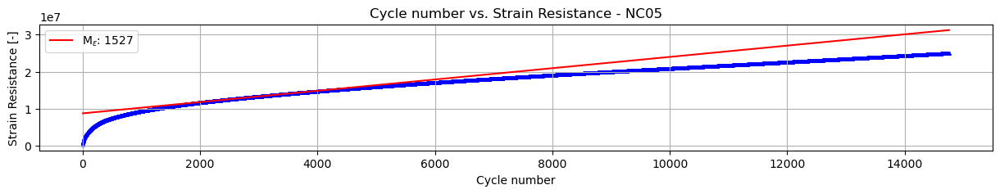

In [213]:
import matplotlib.pyplot as plt
import uncertainties.unumpy as unp
import pandas as pd

# Assuming 'Stage_info_LCC17' and 'cycle_info_LCC17_L_2' are defined DataFrame objects

Cycle_nr_NC05 = Stage_info_NC05.loc[0]['Cycles nr']

X1 = 1
X3 = Cycle_nr_NC05 - 1
loop_indices = list(range(X1, X3))



Resistance0 = 0 # Initialize the accumulated strain
Resistance = []
Cyc_nr = []

for i in loop_indices:
    if i < len(cycle_info_NC05_G) - 1:  # Check if i+1 is a valid index
        Cyc_nr0 = cycle_info_NC05_G.iloc[i+1]['Loop_Number']
        c_x_increment = ((unp.nominal_values(cycle_info_NC05_G.iloc[i+1]['C_X(%)']) / 100 ) - (unp.nominal_values(cycle_info_NC05_G.iloc[0]['C_X(%)']) / 100))
        if c_x_increment >0:
            #accumulated_strain = c_x_increment 
            #accumulated_strain = accumulated_strain
            Resistance0 += 1 / c_x_increment
            
            Cyc_nr.append(Cyc_nr0)
            Resistance.append(Resistance0)
            
X0 = Cyc_nr
y0 = Resistance 

print(len(Cyc_nr))
nr = np.array(np.arange(len(Resistance)))

X = np.array(nr) 
y = np.array(Resistance)

start_index = np.argmax(X >= 1500)
end_index = np.argmin(X <= 5000)

X = X[start_index:end_index]
y = y[start_index:end_index]

# Define the model (linear regression)
X = X.reshape(-1, 1)
model = LinearRegression()

ransac = RANSACRegressor(model, min_samples=2, residual_threshold= 0.1, max_trials=10000)
ransac.fit(X, y)
inlier_mask = ransac.inlier_mask_
inlier_x = X[inlier_mask][:, 0]



min_x = np.min(X0)
max_x = np.max(X0)

# Get the fitted line parameters (slope and intercept)
slope = ransac.estimator_.coef_[0]
intercept = ransac.estimator_.intercept_

# Calculate min_y and max_y using the captured boundaries
min_y = slope * min_x + intercept
max_y = slope * max_x + intercept
# Calculate the line using the gradient and intercept
line_x = np.linspace(min_x, max_x, 100)
line_y = slope * line_x + intercept



Me_NC05 = slope


plt.figure(figsize=(15, 2))
plt.scatter(nr, Resistance, s=5, c='b', marker='^')
plt.plot(line_x, line_y, color='red', label=f'M${{_\epsilon}}$: {slope:.0f}')
plt.xlabel("Cycle number")
plt.ylabel('Strain Resistance [-]')
plt.grid(True) 
plt.legend()
#plt.xscale('log')
plt.title('Cycle number vs. Strain Resistance - NC05')
plt.show()

### NC06 

<>:93: SyntaxWarning: invalid escape sequence '\e'
<>:93: SyntaxWarning: invalid escape sequence '\e'
C:\Users\local_zakial\Temp\ipykernel_20300\3628480561.py:93: SyntaxWarning: invalid escape sequence '\e'
  plt.plot(line_x, line_y, color='red', label=f'M${{_\epsilon}}$: {slope:.0f}')


27399


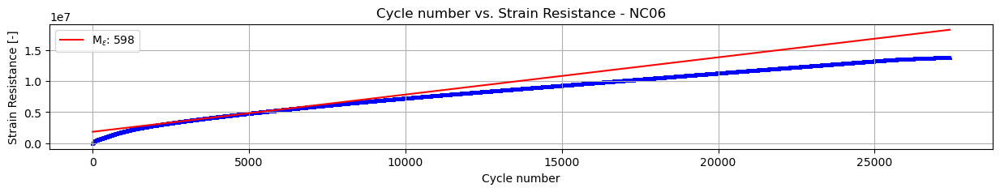

In [321]:
import matplotlib.pyplot as plt
import uncertainties.unumpy as unp
import pandas as pd

# Assuming 'Stage_info_LCC17' and 'cycle_info_LCC17_L_2' are defined DataFrame objects

Cycle_nr_NC06 = Stage_info_NC06.loc[0]['Cycles nr']

X1 = 1
X3 = Cycle_nr_NC06 - 1
loop_indices = list(range(X1, X3))



Resistance0 = 0 # Initialize the accumulated strain
Resistance = []
Cyc_nr = []

for i in loop_indices:
    if i < len(cycle_info_NC06_G) - 1:  # Check if i+1 is a valid index
        Cyc_nr0 = cycle_info_NC06_G.iloc[i+1]['Loop_Number']
        c_x_increment = ((unp.nominal_values(cycle_info_NC06_G.iloc[i+1]['C_X(%)']) / 100 ) - (unp.nominal_values(cycle_info_NC06_G.iloc[0]['C_X(%)']) / 100))
        if c_x_increment >0:
            #accumulated_strain = c_x_increment 
            #accumulated_strain = accumulated_strain
            Resistance0 += 1 / c_x_increment
            
            Cyc_nr.append(Cyc_nr0)
            Resistance.append(Resistance0)
            
X0 = Cyc_nr
y0 = Resistance 

print(len(Cyc_nr))
nr = np.array(np.arange(len(Resistance)))

X = np.array(nr) 
y = np.array(Resistance)

start_index = np.argmax(X >= 400)
end_index = np.argmin(X <= 6000)

X = X[start_index:end_index]
y = y[start_index:end_index]

# Define the model (linear regression)
X = X.reshape(-1, 1)
model = LinearRegression()

ransac = RANSACRegressor(model, min_samples=2, residual_threshold= 0.1, max_trials=10000)
ransac.fit(X, y)
inlier_mask = ransac.inlier_mask_
inlier_x = X[inlier_mask][:, 0]



min_x = np.min(X0)
max_x = np.max(X0)

# Get the fitted line parameters (slope and intercept)
slope = ransac.estimator_.coef_[0]
intercept = ransac.estimator_.intercept_

# Calculate min_y and max_y using the captured boundaries
min_y = slope * min_x + intercept
max_y = slope * max_x + intercept
# Calculate the line using the gradient and intercept
line_x = np.linspace(min_x, max_x, 100)
line_y = slope * line_x + intercept



Me_NC06 = slope


plt.figure(figsize=(15, 2))
plt.scatter(nr, Resistance, s=5, c='b', marker='^')
plt.plot(line_x, line_y, color='red', label=f'M${{_\epsilon}}$: {slope:.0f}')
plt.xlabel("Cycle number")
plt.ylabel('Strain Resistance [-]')
plt.grid(True) 
plt.legend()
#plt.xscale('log')
plt.title('Cycle number vs. Strain Resistance - NC06')
plt.show()

### NC07 

<>:93: SyntaxWarning: invalid escape sequence '\e'
<>:93: SyntaxWarning: invalid escape sequence '\e'
C:\Users\local_zakial\Temp\ipykernel_20300\4230672803.py:93: SyntaxWarning: invalid escape sequence '\e'
  plt.plot(line_x, line_y, color='red', label=f'M${{_\epsilon}}$: {slope:.0f}')


48432


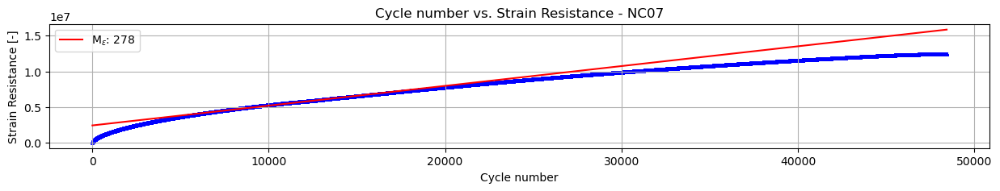

In [328]:
import matplotlib.pyplot as plt
import uncertainties.unumpy as unp
import pandas as pd

# Assuming 'Stage_info_LCC17' and 'cycle_info_LCC17_L_2' are defined DataFrame objects

Cycle_nr_NC07 = Stage_info_NC07.loc[0]['Cycles nr']

X1 = 1
X3 = Cycle_nr_NC07 - 1
loop_indices = list(range(X1, X3))



Resistance0 = 0 # Initialize the accumulated strain
Resistance = []
Cyc_nr = []

for i in loop_indices:
    if i < len(cycle_info_NC07_G) - 1:  # Check if i+1 is a valid index
        Cyc_nr0 = cycle_info_NC07_G.iloc[i+1]['Loop_Number']
        c_x_increment = ((unp.nominal_values(cycle_info_NC07_G.iloc[i+1]['C_X(%)']) / 100 ) - (unp.nominal_values(cycle_info_NC07_G.iloc[0]['C_X(%)']) / 100))
        if c_x_increment >0:
            #accumulated_strain = c_x_increment 
            #accumulated_strain = accumulated_strain
            Resistance0 += 1 / c_x_increment
            
            Cyc_nr.append(Cyc_nr0)
            Resistance.append(Resistance0)
            
X0 = Cyc_nr
y0 = Resistance 

print(len(Cyc_nr))
nr = np.array(np.arange(len(Resistance)))

X = np.array(nr) 
y = np.array(Resistance)

start_index = np.argmax(X >= 9000)
end_index = np.argmin(X <= 14000)

X = X[start_index:end_index]
y = y[start_index:end_index]

# Define the model (linear regression)
X = X.reshape(-1, 1)
model = LinearRegression()

ransac = RANSACRegressor(model, min_samples=2, residual_threshold= 0.1, max_trials=10000)
ransac.fit(X, y)
inlier_mask = ransac.inlier_mask_
inlier_x = X[inlier_mask][:, 0]


min_x = np.min(X0)
max_x = np.max(X0)

# Get the fitted line parameters (slope and intercept)
slope = ransac.estimator_.coef_[0]
intercept = ransac.estimator_.intercept_

# Calculate min_y and max_y using the captured boundaries
min_y = slope * min_x + intercept
max_y = slope * max_x + intercept
# Calculate the line using the gradient and intercept
line_x = np.linspace(min_x, max_x, 100)
line_y = slope * line_x + intercept



Me_NC07 = slope


plt.figure(figsize=(15, 2))
plt.scatter(nr, Resistance, s=5, c='b', marker='^')
plt.plot(line_x, line_y, color='red', label=f'M${{_\epsilon}}$: {slope:.0f}')
plt.xlabel("Cycle number")
plt.ylabel('Strain Resistance [-]')
plt.grid(True) 
plt.legend()
#plt.xscale('log')
plt.title('Cycle number vs. Strain Resistance - NC07')
plt.show()

### NC08 

<>:93: SyntaxWarning: invalid escape sequence '\e'
<>:93: SyntaxWarning: invalid escape sequence '\e'
C:\Users\local_zakial\Temp\ipykernel_20300\1891486706.py:93: SyntaxWarning: invalid escape sequence '\e'
  plt.plot(line_x, line_y, color='red', label=f'M${{_\epsilon}}$: {slope:.0f}')


597


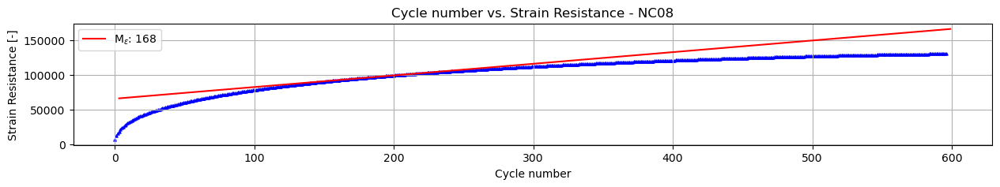

In [331]:
import matplotlib.pyplot as plt
import uncertainties.unumpy as unp
import pandas as pd

# Assuming 'Stage_info_LCC17' and 'cycle_info_LCC17_L_2' are defined DataFrame objects

Cycle_nr_NC08 = Stage_info_NC08.loc[0]['Cycles nr']

X1 = 1
X3 = Cycle_nr_NC08 - 1
loop_indices = list(range(X1, X3))



Resistance0 = 0 # Initialize the accumulated strain
Resistance = []
Cyc_nr = []

for i in loop_indices:
    if i < len(cycle_info_NC08_G) - 1:  # Check if i+1 is a valid index
        Cyc_nr0 = cycle_info_NC08_G.iloc[i+1]['Loop_Number']
        c_x_increment = ((unp.nominal_values(cycle_info_NC08_G.iloc[i+1]['C_X(%)']) / 100 ) - (unp.nominal_values(cycle_info_NC08_G.iloc[0]['C_X(%)']) / 100))
        if c_x_increment >0:
            #accumulated_strain = c_x_increment 
            #accumulated_strain = accumulated_strain
            Resistance0 += 1 / c_x_increment
            
            Cyc_nr.append(Cyc_nr0)
            Resistance.append(Resistance0)
            
X0 = Cyc_nr
y0 = Resistance 

print(len(Cyc_nr))
nr = np.array(np.arange(len(Resistance)))

X = np.array(nr) 
y = np.array(Resistance)

start_index = np.argmax(X >= 180)
end_index = np.argmin(X <= 230)

X = X[start_index:end_index]
y = y[start_index:end_index]

# Define the model (linear regression)
X = X.reshape(-1, 1)
model = LinearRegression()

ransac = RANSACRegressor(model, min_samples=2, residual_threshold= 0.1, max_trials=10000)
ransac.fit(X, y)
inlier_mask = ransac.inlier_mask_
inlier_x = X[inlier_mask][:, 0]


min_x = np.min(X0)
max_x = np.max(X0)

# Get the fitted line parameters (slope and intercept)
slope = ransac.estimator_.coef_[0]
intercept = ransac.estimator_.intercept_

# Calculate min_y and max_y using the captured boundaries
min_y = slope * min_x + intercept
max_y = slope * max_x + intercept
# Calculate the line using the gradient and intercept
line_x = np.linspace(min_x, max_x, 100)
line_y = slope * line_x + intercept



Me_NC08 = slope


plt.figure(figsize=(15, 2))
plt.scatter(nr, Resistance, s=5, c='b', marker='^')
plt.plot(line_x, line_y, color='red', label=f'M${{_\epsilon}}$: {slope:.0f}')
plt.xlabel("Cycle number")
plt.ylabel('Strain Resistance [-]')
plt.grid(True) 
plt.legend()
#plt.xscale('log')
plt.title('Cycle number vs. Strain Resistance - NC08')
plt.show()

### NC09 

<>:93: SyntaxWarning: invalid escape sequence '\e'
<>:93: SyntaxWarning: invalid escape sequence '\e'
C:\Users\local_zakial\Temp\ipykernel_20300\1285520406.py:93: SyntaxWarning: invalid escape sequence '\e'
  plt.plot(line_x, line_y, color='red', label=f'M${{_\epsilon}}$: {slope:.0f}')


5833


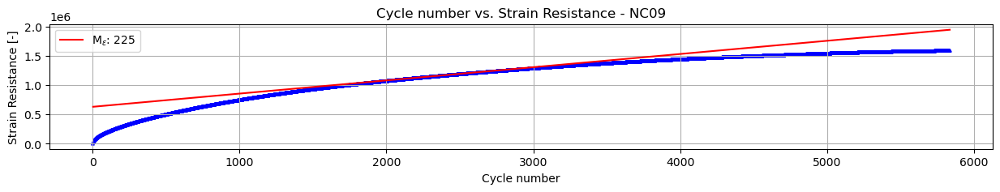

In [335]:
import matplotlib.pyplot as plt
import uncertainties.unumpy as unp
import pandas as pd

# Assuming 'Stage_info_LCC17' and 'cycle_info_LCC17_L_2' are defined DataFrame objects

Cycle_nr_NC09 = Stage_info_NC09.loc[0]['Cycles nr']

X1 = 1
X3 = Cycle_nr_NC09 - 1
loop_indices = list(range(X1, X3))



Resistance0 = 0 # Initialize the accumulated strain
Resistance = []
Cyc_nr = []

for i in loop_indices:
    if i < len(cycle_info_NC09_G) - 1:  # Check if i+1 is a valid index
        Cyc_nr0 = cycle_info_NC09_G.iloc[i+1]['Loop_Number']
        c_x_increment = ((unp.nominal_values(cycle_info_NC09_G.iloc[i+1]['C_X(%)']) / 100 ) - (unp.nominal_values(cycle_info_NC09_G.iloc[0]['C_X(%)']) / 100))
        if c_x_increment >0:
            #accumulated_strain = c_x_increment 
            #accumulated_strain = accumulated_strain
            Resistance0 += 1 / c_x_increment
            
            Cyc_nr.append(Cyc_nr0)
            Resistance.append(Resistance0)
            
X0 = Cyc_nr
y0 = Resistance 

print(len(Cyc_nr))
nr = np.array(np.arange(len(Resistance)))

X = np.array(nr) 
y = np.array(Resistance)

start_index = np.argmax(X >= 900)
end_index = np.argmin(X <= 3000)

X = X[start_index:end_index]
y = y[start_index:end_index]

# Define the model (linear regression)
X = X.reshape(-1, 1)
model = LinearRegression()

ransac = RANSACRegressor(model, min_samples=2, residual_threshold= 0.1, max_trials=10000)
ransac.fit(X, y)
inlier_mask = ransac.inlier_mask_
inlier_x = X[inlier_mask][:, 0]

min_x = np.min(X0)
max_x = np.max(X0)

# Get the fitted line parameters (slope and intercept)
slope = ransac.estimator_.coef_[0]
intercept = ransac.estimator_.intercept_

# Calculate min_y and max_y using the captured boundaries
min_y = slope * min_x + intercept
max_y = slope * max_x + intercept
# Calculate the line using the gradient and intercept
line_x = np.linspace(min_x, max_x, 100)
line_y = slope * line_x + intercept



Me_NC09 = slope


plt.figure(figsize=(15, 2))
plt.scatter(nr, Resistance, s=5, c='b', marker='^')
plt.plot(line_x, line_y, color='red', label=f'M${{_\epsilon}}$: {slope:.0f}')
plt.xlabel("Cycle number")
plt.ylabel('Strain Resistance [-]')
plt.grid(True) 
plt.legend()
#plt.xscale('log')
plt.title('Cycle number vs. Strain Resistance - NC09')
plt.show()

### NC10

<>:76: SyntaxWarning: invalid escape sequence '\e'
<>:76: SyntaxWarning: invalid escape sequence '\e'
C:\Users\local_zakial\Temp\ipykernel_20300\2942547070.py:76: SyntaxWarning: invalid escape sequence '\e'
  plt.plot(line_x, line_y, color='red', label=f'M${{_\epsilon}}$: {slope:.0f}')


7741


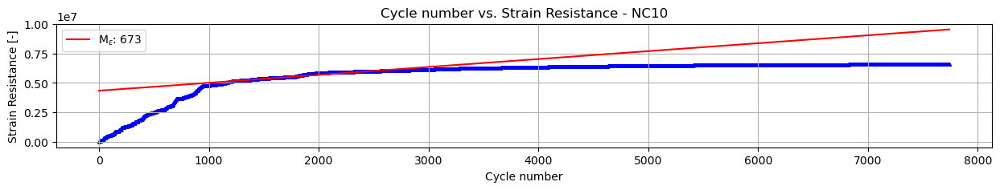

In [357]:
import matplotlib.pyplot as plt
import uncertainties.unumpy as unp
import pandas as pd

# Assuming 'Stage_info_LCC17' and 'cycle_info_LCC17_L_2' are defined DataFrame objects

Cycle_nr_NC10 = Stage_info_NC10.loc[0]['Cycles nr']

X1 = 1
X3 = Cycle_nr_NC10 - 1
loop_indices = list(range(X1, X3))



Resistance0 = 0 # Initialize the accumulated strain
Resistance = []
Cyc_nr = []

for i in loop_indices:
    if i < len(cycle_info_NC10_G) - 1:  # Check if i+1 is a valid index
        Cyc_nr0 = cycle_info_NC10_G.iloc[i+1]['Loop_Number']
        c_x_increment = ((unp.nominal_values(cycle_info_NC10_G.iloc[i+1]['C_X(%)']) / 100 ) - (unp.nominal_values(cycle_info_NC10_G.iloc[0]['C_X(%)']) / 100))
        if c_x_increment >0:
            #accumulated_strain = c_x_increment 
            #accumulated_strain = accumulated_strain
            Resistance0 += 1 / c_x_increment
            
            Cyc_nr.append(Cyc_nr0)
            Resistance.append(Resistance0)
            
X0 = Cyc_nr
y0 = Resistance 

print(len(Cyc_nr))
nr = np.array(np.arange(len(Resistance)))

X = np.array(nr) 
y = np.array(Resistance)

start_index = np.argmax(X >= 1500)
end_index = np.argmin(X <= 2500)

X = X[start_index:end_index]
y = y[start_index:end_index]

# Define the model (linear regression)
X = X.reshape(-1, 1)
model = LinearRegression()

ransac = RANSACRegressor(model, min_samples=2, residual_threshold= 0.1, max_trials=10000)
ransac.fit(X, y)
inlier_mask = ransac.inlier_mask_
inlier_x = X[inlier_mask][:, 0]

min_x = np.min(nr)
max_x = np.max(nr)

# Get the fitted line parameters (slope and intercept)
slope = ransac.estimator_.coef_[0]
intercept = ransac.estimator_.intercept_

# Calculate min_y and max_y using the captured boundaries
min_y = slope * min_x + intercept
max_y = slope * max_x + intercept
# Calculate the line using the gradient and intercept
line_x = np.linspace(min_x, max_x, 100)
line_y = slope * line_x + intercept



Me_NC10 = slope


plt.figure(figsize=(15, 2))
plt.scatter(nr, Resistance, s=5, c='b', marker='^')
plt.plot(line_x, line_y, color='red', label=f'M${{_\epsilon}}$: {slope:.0f}')
plt.xlabel("Cycle number")
plt.ylabel('Strain Resistance [-]')
plt.grid(True) 
plt.legend()
#plt.xscale('log')
plt.title('Cycle number vs. Strain Resistance - NC10')
plt.show()

### NC11

<>:76: SyntaxWarning: invalid escape sequence '\e'
<>:76: SyntaxWarning: invalid escape sequence '\e'
C:\Users\local_zakial\Temp\ipykernel_20300\1191761525.py:76: SyntaxWarning: invalid escape sequence '\e'
  plt.plot(line_x, line_y, color='red', label=f'M${{_\epsilon}}$: {slope:.0f}')


87


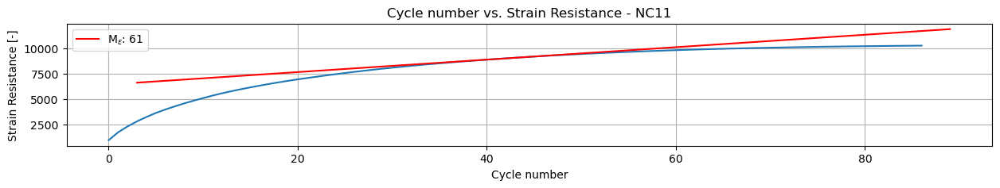

In [405]:
import matplotlib.pyplot as plt
import uncertainties.unumpy as unp
import pandas as pd

# Assuming 'Stage_info_LCC17' and 'cycle_info_LCC17_L_2' are defined DataFrame objects

Cycle_nr_NC11 = Stage_info_NC11.loc[0]['Cycles nr']

X1 = 1
X3 = Cycle_nr_NC11 - 1
loop_indices = list(range(X1, X3))



Resistance0 = 0 # Initialize the accumulated strain
Resistance = []
Cyc_nr = []

for i in loop_indices:
    if i < len(cycle_info_NC11_G) - 1:  # Check if i+1 is a valid index
        Cyc_nr0 = cycle_info_NC11_G.iloc[i+1]['Loop_Number']
        c_x_increment = ((unp.nominal_values(cycle_info_NC11_G.iloc[i+1]['C_X(%)']) / 100 ) - (unp.nominal_values(cycle_info_NC11_G.iloc[0]['C_X(%)']) / 100))
        if c_x_increment >0:
            #accumulated_strain = c_x_increment 
            #accumulated_strain = accumulated_strain
            Resistance0 += 1 / c_x_increment
            
            Cyc_nr.append(Cyc_nr0)
            Resistance.append(Resistance0)
            
X0 = Cyc_nr
y0 = Resistance 

print(len(Cyc_nr))
nr = np.array(np.arange(len(Resistance)))

X = np.array(nr) 
y = np.array(Resistance)

start_index = np.argmax(X >= 40)
end_index = np.argmin(X <= 50)

X = X[start_index:end_index]
y = y[start_index:end_index]

# Define the model (linear regression)
X = X.reshape(-1, 1)
model = LinearRegression()

ransac = RANSACRegressor(model, min_samples=2, residual_threshold= 0.01, max_trials=10000)
ransac.fit(X, y)
inlier_mask = ransac.inlier_mask_
inlier_x = X[inlier_mask][:, 0]

min_x = np.min(X0)
max_x = np.max(X0)

# Get the fitted line parameters (slope and intercept)
slope = ransac.estimator_.coef_[0]
intercept = ransac.estimator_.intercept_

# Calculate min_y and max_y using the captured boundaries
min_y = slope * min_x + intercept
max_y = slope * max_x + intercept
# Calculate the line using the gradient and intercept
line_x = np.linspace(min_x, max_x, 100)
line_y = slope * line_x + intercept



Me_NC11 = slope


plt.figure(figsize=(15, 2))
plt.plot(nr, Resistance)
plt.plot(line_x, line_y, color='red', label=f'M${{_\epsilon}}$: {slope:.0f}')
plt.xlabel("Cycle number")
plt.ylabel('Strain Resistance [-]')
plt.grid(True) 
plt.legend()
#plt.xscale('log')
plt.title('Cycle number vs. Strain Resistance - NC11')
plt.show()

## Combine Re

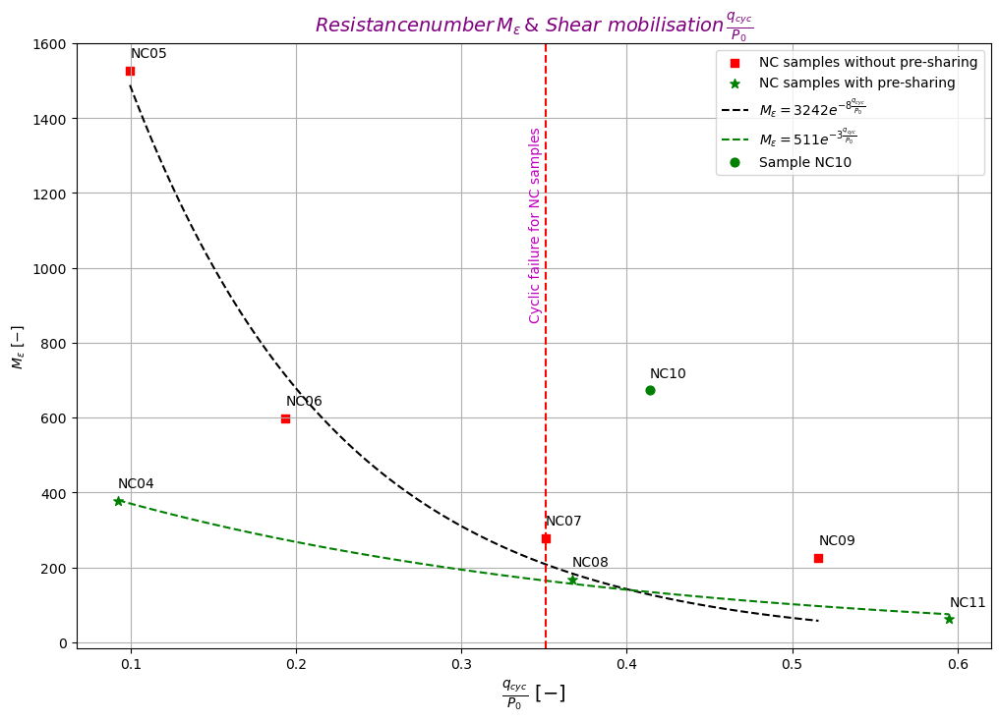

In [611]:
from matplotlib.ticker import FuncFormatter
from scipy.optimize import curve_fit

cyc_5 =  unp.nominal_values(Stage_info_NC05.loc[0]['qcyc/p0'])      
cyc_6 =  unp.nominal_values(Stage_info_NC06.loc[0]['qcyc/p0'])    
cyc_7 =  unp.nominal_values(Stage_info_NC07.loc[0]['qcyc/p0'])  
cyc_9 =  unp.nominal_values(Stage_info_NC09.loc[0]['qcyc/p0']) 
NC_cyc_without_pre = np.array([cyc_5, cyc_6, cyc_7, cyc_9])      
NC_m_without_pre = np.array([Me_NC05, Me_NC06, Me_NC07, Me_NC09])      

cyc_4 =  unp.nominal_values(Stage_info_NC04.loc[0]['qcyc/p0'])      
cyc_8 =  unp.nominal_values(Stage_info_NC08.loc[0]['qcyc/p0'])    
cyc_10 = unp.nominal_values(Stage_info_NC10.loc[0]['qcyc/p0'])    
cyc_11 = unp.nominal_values(Stage_info_NC11.loc[0]['qcyc/p0']) 
NC_cyc_with_pre = np.array([cyc_4, cyc_8, cyc_11])   
NC_m_with_pre = np.array([Me_NC04, Me_NC08, Me_NC11]) 

NC_cyc_10 = unp.nominal_values(Stage_info_NC10.loc[0]['qcyc/p0'])  


cyc_031 =  unp.nominal_values(Stage_info_LCC03.loc[0]['qcyc/p0'])      
cyc_032 =  unp.nominal_values(Stage_info_LCC03.loc[1]['qcyc/p0'])    
cyc_171 =  unp.nominal_values(Stage_info_LCC17.loc[0]['qcyc/p0'])  
cyc_172 =  unp.nominal_values(Stage_info_LCC17.loc[1]['qcyc/p0']) 

LCC_cyc_G = np.array([cyc_031, cyc_032, cyc_171, cyc_172]) 
LCC_m_G = np.array([Me_LCC03_G_1, Me_LCC03_G_2, Me_LCC17_G_1, Me_LCC17_G_2])

LCC_cyc_L = np.array([cyc_171, cyc_172])    
LCC_m_L = np.array([Me_LCC17_L_1, Me_LCC17_L_2])  


Label_NC_sharing = ['NC04', 'NC08', 'NC11' ]
Label_NC_without_sharing = ['NC05', 'NC06', 'NC07','NC09']

data_NC_without_pre = list(zip(NC_cyc_without_pre, NC_m_without_pre, Label_NC_without_sharing))
data_NC_pre = list(zip(NC_cyc_with_pre, NC_m_with_pre, Label_NC_sharing))




def exponential_func(x, A, B):
    return A * np.exp(B * x)

# Fit the exponential function to the data
NC_pre_popt, NC_pre_pcov = curve_fit(exponential_func, NC_cyc_without_pre, NC_m_without_pre)
NC_pre_A, NC_pre_B = NC_pre_popt

# Generate the fitted line
NC_pre_line_x = np.linspace(min(NC_cyc_without_pre), max(NC_cyc_without_pre), 100)
NC_pre_line_y = exponential_func(NC_pre_line_x, NC_pre_A, NC_pre_B)



NC_popt, NC_pcov = curve_fit(exponential_func, NC_cyc_with_pre, NC_m_with_pre)
NC_A, NC_B = NC_popt

# Generate the fitted line
NC_line_x = np.linspace(min(NC_cyc_with_pre), max(NC_cyc_with_pre), 100)
NC_line_y = exponential_func(NC_line_x, NC_A, NC_B)



plt.figure(figsize=(12, 8))
plt.scatter(NC_cyc_without_pre, NC_m_without_pre, color='r', marker='s', s=30, label=r'NC samples without pre-sharing')
for i, (x, y, label) in enumerate(data_NC_without_pre):
    plt.annotate(label, xy=(x, y), xytext=(x, y+35), fontsize=10)
    

plt.scatter(NC_cyc_with_pre, NC_m_with_pre, color='g', marker='*', s=50, label=r'NC samples with pre-sharing')
for i, (x, y, label) in enumerate(data_NC_pre):
    plt.annotate(label, xy=(x, y), xytext=(x, y+35), fontsize=10)
    

# Fitted line
plt.plot(NC_pre_line_x, NC_pre_line_y, 'k--', label=f'$M_\\epsilon = {NC_pre_A:.0f} e^{{{NC_pre_B:.0f}\\frac{{q_{{cyc}}}}{{P_{0}}}}}$')

plt.plot(NC_line_x, NC_line_y, 'g--', label=f'$M_\\epsilon = {NC_A:.0f} e^{{{NC_B:.0f}\\frac{{q_{{cyc}}}}{{P_{0}}}}}$')

plt.scatter(NC_cyc_10, Me_NC10, color='g', marker='o', s=40, label=r'Sample NC10')
plt.annotate('NC10', xy=(NC_cyc_10, Me_NC10), xytext=(NC_cyc_10, Me_NC10+35), fontsize=10)


plt.legend(loc='upper right')
plt.axvline(x=cyc_7, color='r', linestyle='--')
plt.annotate('Cyclic failure for NC samples', xy=(cyc_7, 0), xytext=(cyc_7- 0.01, y + 800), fontsize=10, color = 'm', rotation=90)

plt.xlabel(r'$\frac{q_{cyc}}{P_{0}}\,\, [-] $',fontdict={'fontsize': 14})
plt.ylabel(r'$M{{_\epsilon}}\,\,[-]$')
#plt.xticks(np.arange(25, 161, 10), minor=False)
plt.text(0.5, 1.02, r'$Resistance number \, M{{_\epsilon}} \, &\,\,  Shear \,\,mobilisation \, \frac{q_{cyc}}{P_{0}}$', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()



C:\Users\local_zakial\Temp\ipykernel_20300\21616457.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  LCC_L_popt, LCC_G_pcov = curve_fit(exponential_func, LCC_cyc_L, LCC_m_L)


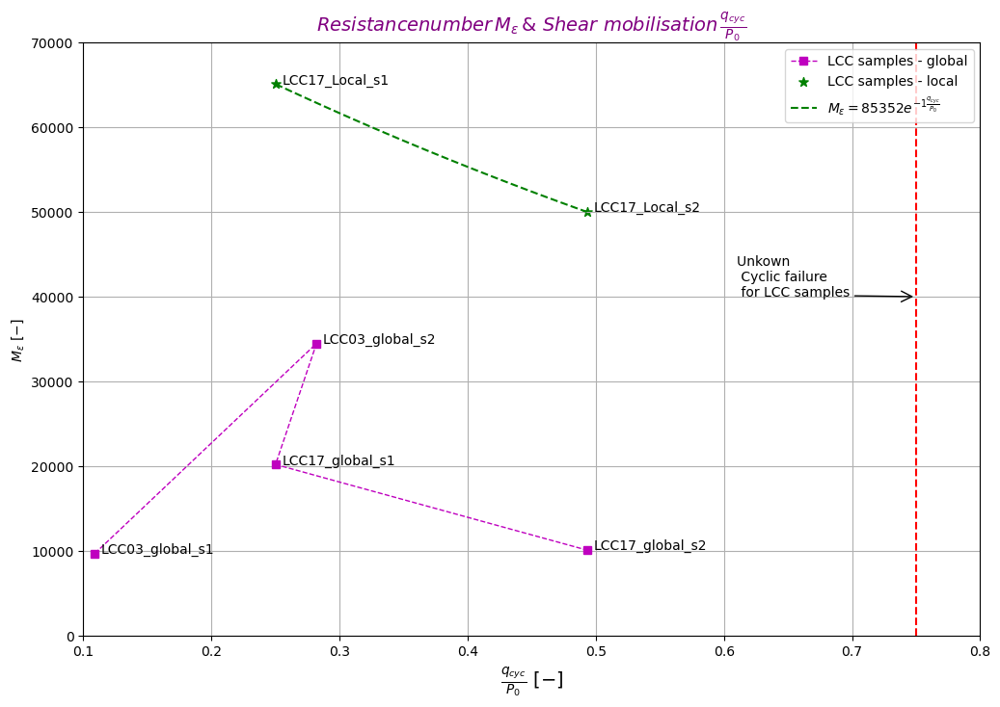

In [613]:

cyc_031 =  unp.nominal_values(Stage_info_LCC03.loc[0]['qcyc/p0'])      
cyc_032 =  unp.nominal_values(Stage_info_LCC03.loc[1]['qcyc/p0'])    
cyc_171 =  unp.nominal_values(Stage_info_LCC17.loc[0]['qcyc/p0'])  
cyc_172 =  unp.nominal_values(Stage_info_LCC17.loc[1]['qcyc/p0']) 

LCC_cyc_G = np.array([cyc_031, cyc_032, cyc_171, cyc_172]) 
LCC_m_G = np.array([Me_LCC03_G_1, Me_LCC03_G_2, Me_LCC17_G_1, Me_LCC17_G_2])

LCC_cyc_L = np.array([cyc_171, cyc_172])    
LCC_m_L = np.array([Me_LCC17_L_1, Me_LCC17_L_2])  



Label_LCC_G = ['LCC03_global_s1', 'LCC03_global_s2', 'LCC17_global_s1','LCC17_global_s2' ]
Label_LCC_L =  ['LCC17_Local_s1', 'LCC17_Local_s2' ]



data_LCC_G = list(zip(LCC_cyc_G, LCC_m_G, Label_LCC_G))
data_LCC_L = list(zip(LCC_cyc_L, LCC_m_L, Label_LCC_L))




def exponential_func(x, A, B):
    return A * np.exp(B * x)

# Fit the exponential function to the data
LCC_G_popt, LCC_G_pcov = curve_fit(exponential_func, LCC_cyc_G, LCC_m_G)
LCC_G_A, LCC_G_B = LCC_G_popt

# Generate the fitted line
LCC_G_line_x = np.linspace(min(LCC_cyc_G), max(LCC_cyc_G), 100)
LCC_G_line_y = exponential_func(LCC_G_line_x, LCC_G_A, LCC_G_B)



LCC_L_popt, LCC_G_pcov = curve_fit(exponential_func, LCC_cyc_L, LCC_m_L)
LCC_L_A, LCC_L_B = LCC_L_popt

# Generate the fitted line
LCC_L_line_x = np.linspace(min(LCC_cyc_L), max(LCC_cyc_L), 100)
LCC_L_line_y = exponential_func(LCC_L_line_x, LCC_L_A, LCC_L_B)



plt.figure(figsize=(12, 8))
plt.plot(LCC_cyc_G, LCC_m_G, color='m', marker='s', linewidth='1', linestyle = '--', label=r'LCC samples - global')
for i, (x, y, label) in enumerate(data_LCC_G):
    plt.annotate(label, xy=(x, y), xytext=(x+0.005, y+70), fontsize=10)
    

plt.scatter(LCC_cyc_L, LCC_m_L, color='g', marker='*', s=50, label=r'LCC samples - local')
for i, (x, y, label) in enumerate(data_LCC_L):
    plt.annotate(label, xy=(x, y), xytext=(x+0.005, y+70), fontsize=10)
    

# Fitted line
#plt.plot(LCC_G_line_x, LCC_G_line_y, 'k--', label=f'$M_\\epsilon = {LCC_G_A:.0f} e^{{{LCC_G_B:.0f}\\frac{{q_{{cyc}}}}{{P_{0}}}}}$')

plt.plot(LCC_L_line_x, LCC_L_line_y, 'g--', label=f'$M_\\epsilon = {LCC_L_A:.0f} e^{{{LCC_L_B:.0f}\\frac{{q_{{cyc}}}}{{P_{0}}}}}$')

plt.legend(loc='upper right')
plt.axvline(x=0.75, color='r', linestyle='--')
plt.annotate('Unkown \n Cyclic failure \n for LCC samples', xy=(0.75, 0), xytext=(0.75 -0.14, 40050), fontsize=10, color = 'k', rotation=0)




plt.annotate('', xy=(0.75, 40000), xytext=(0.7, 40100), fontsize=20, color = 'r', arrowprops=dict(arrowstyle='->'))

plt.xlabel(r'$\frac{q_{cyc}}{P_{0}}\,\, [-] $',fontdict={'fontsize': 14})
plt.ylabel(r'$M{{_\epsilon}}\,\,[-]$')
#plt.xticks(np.arange(25, 161, 10), minor=False)
plt.xlim([0.1, 0.80])
plt.ylim([0, 70000])
plt.text(0.5, 1.02, r'$Resistance number \, M{{_\epsilon}} \, &\,\,  Shear \,\,mobilisation \, \frac{q_{cyc}}{P_{0}}$', fontsize=14, color='purple', ha='center', transform=plt.gca().transAxes)
plt.grid(True)
plt.show()


## Propogation Error

### Error in Stress

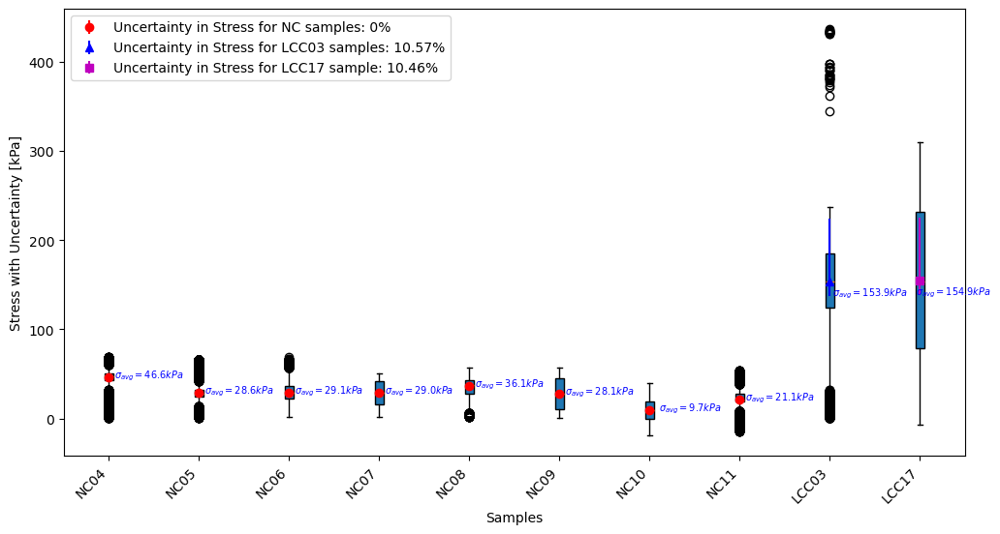

In [ ]:

dataframes = ['NC04', 'NC05', 'NC06', 'NC07', 'NC08', 'NC09', 'NC10', 'NC11', 'LCC17', 'LCC03']

for df_name in dataframes:
    df = globals()[f'df_{df_name}_new']
    if not df['Cycle nr'].isnull().all():
        values = df['Deviator Stress (kPa)']
        mean = np.mean(unp.nominal_values(df['Deviator Stress & Uncertainty (kPa)']))
        error_min = np.min(unp.std_devs(df['Deviator Stress & Uncertainty (kPa)']))
        error_max = np.max(unp.std_devs(df['Deviator Stress & Uncertainty (kPa)']))
        Q1 = np.percentile(values, 25) 
        Q3 = np.percentile(values, 75) 
        
        # Assign the calculated values to variables with the corresponding prefix
        globals()[f'{df_name}_values'] = values
        globals()[f'{df_name}_mean'] = mean
        globals()[f'{df_name}_error_min'] = error_min
        globals()[f'{df_name}_error_max'] = error_max
        globals()[f'{df_name}_Q1'] = Q1
        globals()[f'{df_name}_Q3'] = Q3


data = [(NC04_values, NC04_mean, NC04_error_min, NC04_error_max,NC04_Q1 ,NC04_Q3, Ru_stress_NC04),
        (NC05_values, NC05_mean, NC05_error_min, NC05_error_max,NC05_Q1 ,NC05_Q3, Ru_stress_NC05),
        (NC06_values, NC06_mean, NC06_error_min, NC06_error_max,NC06_Q1 ,NC06_Q3, Ru_stress_NC06),
        (NC07_values, NC07_mean, NC07_error_min, NC07_error_max,NC07_Q1 ,NC07_Q3, Ru_stress_NC07),
        (NC08_values, NC08_mean, NC08_error_min, NC08_error_max,NC08_Q1 ,NC08_Q3, Ru_stress_NC08),
        (NC09_values, NC09_mean, NC09_error_min, NC09_error_max,NC09_Q1 ,NC09_Q3, Ru_stress_NC09),
        (NC10_values, NC10_mean, NC10_error_min, NC10_error_max,NC10_Q1 ,NC10_Q3, Ru_stress_NC10),
        (NC11_values, NC11_mean, NC11_error_min, NC11_error_max,NC11_Q1 ,NC11_Q3, Ru_stress_NC11),
        (LCC03_values, LCC03_mean, LCC03_error_min, LCC03_error_max, LCC03_Q1 ,LCC03_Q3, Ru_stress_LCC03),
        (LCC17_values, LCC17_mean, LCC17_error_min, LCC17_error_max, LCC17_Q1 ,LCC17_Q3, Ru_stress_LCC17)] 


Label_stress = ['NC04', 'NC05', 'NC06', 'NC07', 'NC08', 'NC09', 'NC10', 'NC11', 'LCC03', 'LCC17' ]

plt.figure(figsize=(12, 6))  # Adjust the figure size as needed

# Create boxplots and error bars in a loop
for i, (x_val, mean_val, err_min, err_max,Q1, Q3, Ru) in enumerate(data, start=1):
    
    if i == 1:  
        plt.boxplot(x_val, positions=[i], widths=0.1, patch_artist=True, boxprops=dict(facecolor="C0"))
        errorbar = plt.errorbar([i], [mean_val], yerr=[[err_min], [err_max]], fmt='o', color='r', label=f'Uncertainty in Stress for NC samples: {Ru:.0f}%')
        for y, ymin, ymax in zip([mean_val], [err_min], [err_max]):
            plt.annotate(f"$\\sigma_{{avg}} = {y:.1f} kPa $", (i, y - ymin), textcoords="offset points", xytext=(30,0), ha='center', fontsize=7, color='b')

    
    
    
    elif i >= 0 and i <= 8: 
        plt.boxplot(x_val, positions=[i], widths=0.1, patch_artist=True, boxprops=dict(facecolor="C0"))
        errorbar = plt.errorbar([i], [mean_val], yerr=[[err_min], [err_max]], fmt='o', color='r')
        for y, ymin, ymax in zip([mean_val], [err_min], [err_max]):
            plt.annotate(f"$\\sigma_{{avg}} = {y:.1f} kPa $", (i, y - ymin), textcoords="offset points", xytext=(30,0), ha='center', fontsize=7, color='b')



            
    elif i == 9:        
        plt.boxplot(x_val, positions=[i], widths=0.1, patch_artist=True, boxprops=dict(facecolor="C0"))
        errorbar = plt.errorbar([i], [mean_val], yerr=[[err_min], [err_max]], fmt='^', color='b', label=f'Uncertainty in Stress for LCC03 samples: {Ru*100:.2f}%')
        for y, ymin, ymax in zip([mean_val], [err_min], [err_max]):
            plt.annotate(f"$\\sigma_{{avg}} = {y:.1f} kPa $", (i, y - ymin), textcoords="offset points", xytext=(30,0), ha='center', fontsize=7, color='b')



            
            
    elif i == 10:        
        plt.boxplot(x_val, positions=[i], widths=0.1, patch_artist=True, boxprops=dict(facecolor="C0"))
        errorbar = plt.errorbar([i], [mean_val], yerr=[[err_min], [err_max]], fmt='s', color='m', label=f'Uncertainty in Stress for LCC17 sample: {Ru*100:.2f}%')        
        for y, ymin, ymax in zip([mean_val], [err_min], [err_max]):
            plt.annotate(f"$\\sigma_{{avg}} = {y:.1f} kPa $", (i, y - ymin), textcoords="offset points", xytext=(25,0), ha='center', fontsize=7, color='b')


    

plt.xticks(range(1, len(Label_stress) + 1), Label_stress,rotation=45, ha='right')  
plt.ylabel('Stress with Uncertainty [kPa]')
plt.xlabel('Samples')
#plt.title('Uncertainties associated with stress measurements [kPa]')
plt.legend()
plt.show()

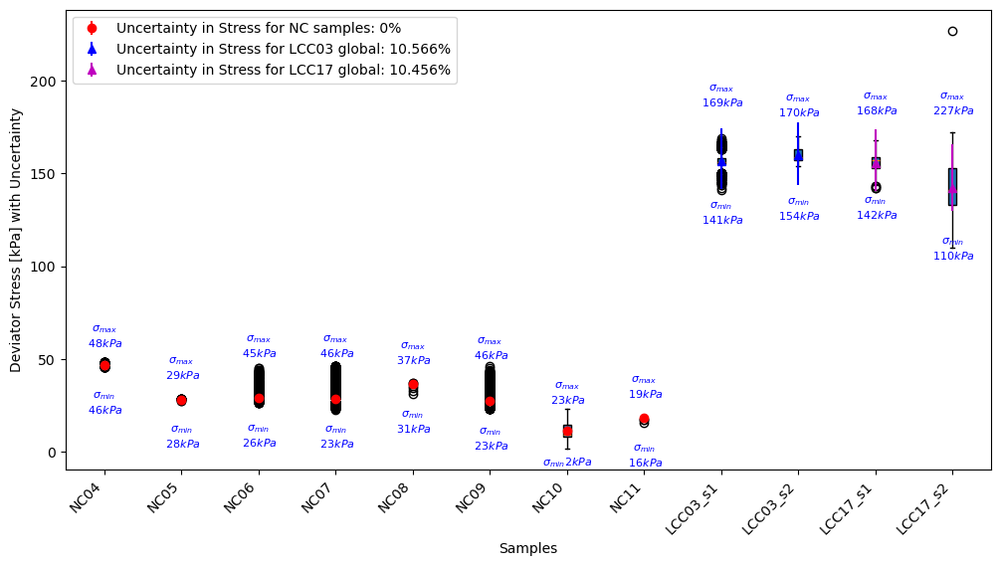

In [ ]:
import uncertainties
data_stress = []
dataframes = ['NC04', 'NC05', 'NC06', 'NC07', 'NC08', 'NC09', 'NC10', 'NC11', 'LCC03', 'LCC03', 'LCC17', 'LCC17']
stage_nr = ['_1', '_2', '_1', '_2']
for i in range(len(dataframes)):
    if i >= (len(dataframes) - 4):
        index = i - (len(dataframes) - 4)
        nr = stage_nr[index]
    else:
        nr = ''

    df = globals()[f'cycle_info_{dataframes[i]}_G{nr}']
    values = unp.nominal_values(df['C_Y(MPa)']) * 1000
    mean = np.mean(values )
    min_val = np.min(values) 
    max_val = np.max(values)
    error_min = np.min(unp.std_devs(df['C_Y(MPa)'])) * 1000
    error_max = np.max(unp.std_devs(df['C_Y(MPa)'])) * 1000
    
    # Assign the calculated values to variables with the corresponding prefix
    globals()[f'{dataframes[i]}_values{nr}'] = values
    globals()[f'{dataframes[i]}_mean{nr}'] = mean
    globals()[f'{dataframes[i]}_min{nr}'] = min_val
    globals()[f'{dataframes[i]}_max{nr}'] = max_val
    globals()[f'{dataframes[i]}_error_min{nr}'] = error_min
    globals()[f'{dataframes[i]}_error_max{nr}'] = error_max

data_stress = [(NC04_values,  NC04_mean,  NC04_error_min,  NC04_error_max, NC04_min, NC04_max ,Ru_stress_NC04),
               (NC05_values,  NC05_mean,  NC05_error_min,  NC05_error_max, NC05_min, NC05_max ,Ru_stress_NC05),
               (NC06_values,  NC06_mean,  NC06_error_min,  NC06_error_max, NC06_min, NC06_max ,Ru_stress_NC06),
               (NC07_values,  NC07_mean,  NC07_error_min,  NC07_error_max, NC07_min, NC07_max ,Ru_stress_NC07),
               (NC08_values,  NC08_mean,  NC08_error_min,  NC08_error_max, NC08_min, NC08_max ,Ru_stress_NC08),
               (NC09_values,  NC09_mean,  NC09_error_min,  NC09_error_max, NC09_min, NC09_max ,Ru_stress_NC09),
               (NC10_values,  NC10_mean,  NC10_error_min,  NC10_error_max, NC10_min, NC10_max ,Ru_stress_NC10),
               (NC11_values,  NC11_mean,  NC11_error_min,  NC11_error_max, NC11_min, NC11_max ,Ru_stress_NC11),
               (LCC03_values_1, LCC03_mean_1, LCC03_error_min_1, LCC03_error_max_1,LCC03_min_1, LCC03_max_1 , Ru_stress_LCC03),
               (LCC03_values_2, LCC03_mean_2, LCC03_error_min_2, LCC03_error_max_2,LCC03_min_2, LCC03_max_2 , Ru_stress_LCC03),
               (LCC17_values_1, LCC17_mean_1, LCC17_error_min_1, LCC17_error_max_1,LCC17_min_1, LCC17_max_1 , Ru_stress_LCC17),
               (LCC17_values_2, LCC17_mean_2, LCC17_error_min_2, LCC17_error_max_2,LCC17_min_2, LCC17_max_2 , Ru_stress_LCC17)] 


Label_stress = ['NC04', 'NC05', 'NC06', 'NC07', 'NC08', 'NC09', 'NC10', 'NC11', 'LCC03_s1', 'LCC03_s2', 'LCC17_s1','LCC17_s2' ]

plt.figure(figsize=(12, 6))  # Adjust the figure size as needed

# Create boxplots and error bars in a loop
for i, (x_val, mean_val, err_min, err_max, min, max, Ru) in enumerate(data_stress, start=1):
    
    if i == 1:  
        plt.boxplot(x_val, positions=[i], widths=0.1, patch_artist=True, boxprops=dict(facecolor="C0"))
        errorbar = plt.errorbar([i], [mean_val], yerr=[[err_min], [err_max]], fmt='o', color='r', label=f'Uncertainty in Stress for NC samples: {Ru:.0f}%')
        for y, ymin, ymax in zip([mean_val], [err_min], [err_max]):
            plt.annotate(f"$\\sigma_{{max}}$\n ${max:.0f}kPa $", (i, y - ymin), textcoords="offset points", xytext=(0,13), ha='center',  fontsize=8, color='b')
            plt.annotate(f"$\\sigma_{{min}}$\n ${min:.0f}kPa $", (i, y - ymin), textcoords="offset points", xytext=(0,-35), ha='center', fontsize=8, color='b')

    
    
    
    elif i == 2 or i == 5 or i ==8: 
        plt.boxplot(x_val, positions=[i], widths=0.1, patch_artist=True, boxprops=dict(facecolor="C0"))
        errorbar = plt.errorbar([i], [mean_val], yerr=[[err_min], [err_max]], fmt='o', color='r')
        for y, ymin, ymax in zip([mean_val], [err_min], [err_max]):
            plt.annotate(f"$\\sigma_{{max}}$\n ${max:.0f}kPa $", (i, y - ymin), textcoords="offset points", xytext=(0,15), ha='center',  fontsize=8, color='b')
            plt.annotate(f"$\\sigma_{{min}}$\n ${min:.0f}kPa $", (i, y - ymin), textcoords="offset points", xytext=(0,-35), ha='center', fontsize=8, color='b')
            
    elif i == 3 or i == 4 or i ==6: 
        plt.boxplot(x_val, positions=[i], widths=0.1, patch_artist=True, boxprops=dict(facecolor="C0"))
        errorbar = plt.errorbar([i], [mean_val], yerr=[[err_min], [err_max]], fmt='o', color='r')
        for y, ymin, ymax in zip([mean_val], [err_min], [err_max]):
            plt.annotate(f"$\\sigma_{{max}}$\n ${max:.0f}kPa $", (i, y - ymin), textcoords="offset points", xytext=(0,30), ha='center',  fontsize=8, color='b')
            plt.annotate(f"$\\sigma_{{min}}$\n ${min:.0f}kPa $", (i, y - ymin), textcoords="offset points", xytext=(0,-35), ha='center', fontsize=8, color='b')

    elif i == 7: 
        plt.boxplot(x_val, positions=[i], widths=0.1, patch_artist=True, boxprops=dict(facecolor="C0"))
        errorbar = plt.errorbar([i], [mean_val], yerr=[[err_min], [err_max]], fmt='o', color='r')
        for y, ymin, ymax in zip([mean_val], [err_min], [err_max]):
            plt.annotate(f"$\\sigma_{{max}}$\n ${max:.0f}kPa $", (i, y - ymin), textcoords="offset points", xytext=(0,20), ha='center',  fontsize=8, color='b')
            plt.annotate(f"$\\sigma_{{min}}{min:.0f}kPa $", (i, y - ymin), textcoords="offset points", xytext=(0,-25), ha='center', fontsize=8, color='b')

            
    elif i == 9:        
        plt.boxplot(x_val, positions=[i], widths=0.1, patch_artist=True, boxprops=dict(facecolor="C0"))
        errorbar = plt.errorbar([i], [mean_val], yerr=[[err_min], [err_max]], fmt='^', color='b', label=f'Uncertainty in Stress for LCC03 global: {Ru*100:.3f}%')
        for y, ymin, ymax in zip([mean_val], [err_min], [err_max]):
            plt.annotate(f"$\\sigma_{{max}}$\n ${max:.0f}kPa $", (i, y - ymin), textcoords="offset points", xytext=(0,60), ha='center',  fontsize=8, color='b')
            plt.annotate(f"$\\sigma_{{min}}$\n ${min:.0f}kPa $", (i, y - ymin), textcoords="offset points", xytext=(0,-25), ha='center', fontsize=8, color='b') 
            
            
            
    elif i == 10:        
        plt.boxplot(x_val, positions=[i], widths=0.1, patch_artist=True, boxprops=dict(facecolor="C0"))
        errorbar = plt.errorbar([i], [mean_val], yerr=[[err_min], [err_max]], fmt='^', color='b')
        for y, ymin, ymax in zip([mean_val], [err_min], [err_max]):
            plt.annotate(f"$\\sigma_{{max}}$\n ${max:.0f}kPa $", (i, y - ymin), textcoords="offset points", xytext=(0,50), ha='center',  fontsize=8, color='b')
            plt.annotate(f"$\\sigma_{{min}}$\n ${min:.0f}kPa $", (i, y - ymin), textcoords="offset points", xytext=(0,-25), ha='center', fontsize=8, color='b')     
           
            
    elif i == 11:        
        plt.boxplot(x_val, positions=[i], widths=0.1, patch_artist=True, boxprops=dict(facecolor="C0"))
        errorbar = plt.errorbar([i], [mean_val], yerr=[[err_min], [err_max]], fmt='^', color='m', label=f'Uncertainty in Stress for LCC17 global: {Ru*100:.3f}%')
        for y, ymin, ymax in zip([mean_val], [err_min], [err_max]):
            plt.annotate(f"$\\sigma_{{max}}$\n ${max:.0f}kPa $", (i, y - ymin), textcoords="offset points", xytext=(0,55), ha='center',  fontsize=8, color='b')
            plt.annotate(f"$\\sigma_{{min}}$\n ${min:.0f}kPa $", (i, y - ymin), textcoords="offset points", xytext=(0,-20), ha='center', fontsize=8, color='b')

            
            
    elif i == 12:        
        plt.boxplot(x_val, positions=[i], widths=0.1, patch_artist=True, boxprops=dict(facecolor="C0"))
        errorbar = plt.errorbar([i], [mean_val], yerr=[[err_min], [err_max]], fmt='^', color='m')
        for y, ymin, ymax in zip([mean_val], [err_min], [err_max]):
            plt.annotate(f"$\\sigma_{{max}}$\n ${max:.0f} kPa $", (i, y - ymin), textcoords="offset points", xytext=(0,70), ha='center',  fontsize=8, color='b')
            plt.annotate(f"$\\sigma_{{min}}$\n ${min:.0f} kPa $", (i, y - ymin), textcoords="offset points", xytext=(0,-35), ha='center', fontsize=8, color='b')
                    

plt.xticks(range(1, len(Label_stress) + 1), Label_stress,rotation=45, ha='right')  
plt.ylabel('Deviator Stress [kPa] with Uncertainty')
plt.xlabel('Samples')
#plt.title('Uncertainties associated with stress measurements [kPa]')
plt.legend()
plt.show()

### Error in Axial Strain 

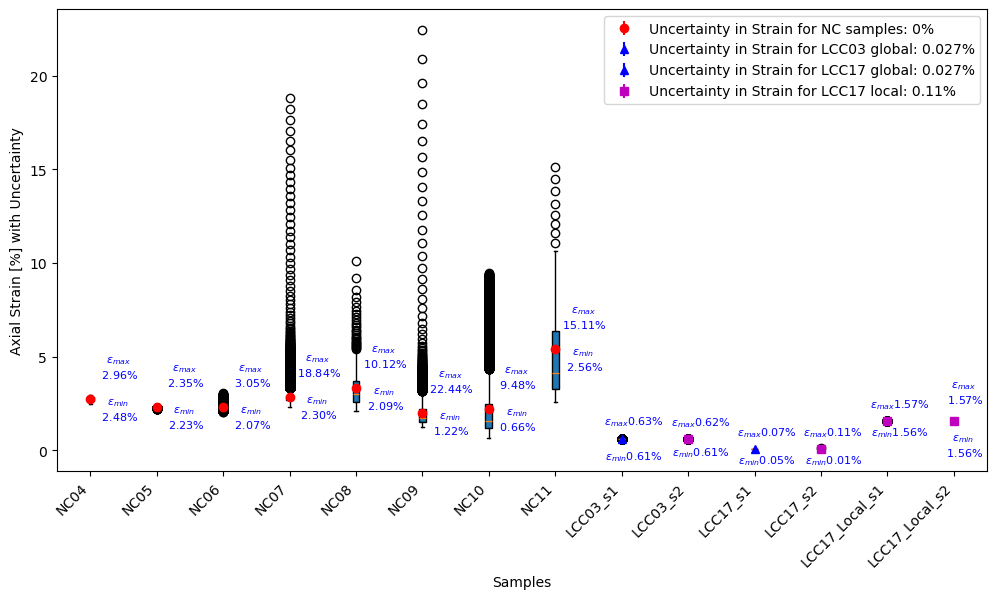

In [ ]:
import uncertainties
data_strain = []
data2_strain = []
dataframes = ['NC04', 'NC05', 'NC06', 'NC07', 'NC08', 'NC09', 'NC10', 'NC11', 'LCC03', 'LCC03', 'LCC17', 'LCC17']
stage_nr = ['_1', '_2', '_1', '_2']

for i in range(len(dataframes)):
    if i >= (len(dataframes) - 4):
        index = i - (len(dataframes) - 4)
        nr = stage_nr[index]
    else:
        nr = ''

    df = globals()[f'cycle_info_{dataframes[i]}_G{nr}']
    values = unp.nominal_values(df['C_X(%)'])
    mean = np.mean(values )
    min_val = np.min(values) 
    max_val = np.max(values)
    error_min = np.min(unp.std_devs(df['C_X(%)'])) 
    error_max = np.max(unp.std_devs(df['C_X(%)'])) 
    
    globals()[f'{dataframes[i]}_values{nr}'] = values
    globals()[f'{dataframes[i]}_mean{nr}'] = mean
    globals()[f'{dataframes[i]}_min{nr}'] = min_val
    globals()[f'{dataframes[i]}_max{nr}'] = max_val
    globals()[f'{dataframes[i]}_error_min{nr}'] = error_min
    globals()[f'{dataframes[i]}_error_max{nr}'] = error_max


data_strain = [(NC04_values,  NC04_mean,  NC04_error_min,  NC04_error_max, NC04_min, NC04_max ,Ru_strain_G_NC04),
               (NC05_values,  NC05_mean,  NC05_error_min,  NC05_error_max, NC05_min, NC05_max ,Ru_strain_G_NC05),
               (NC06_values,  NC06_mean,  NC06_error_min,  NC06_error_max, NC06_min, NC06_max ,Ru_strain_G_NC06),
               (NC07_values,  NC07_mean,  NC07_error_min,  NC07_error_max, NC07_min, NC07_max ,Ru_strain_G_NC07),
               (NC08_values,  NC08_mean,  NC08_error_min,  NC08_error_max, NC08_min, NC08_max ,Ru_strain_G_NC08),
               (NC09_values,  NC09_mean,  NC09_error_min,  NC09_error_max, NC09_min, NC09_max ,Ru_strain_G_NC09),
               (NC10_values,  NC10_mean,  NC10_error_min,  NC10_error_max, NC10_min, NC10_max ,Ru_strain_G_NC10),
               (NC11_values,  NC11_mean,  NC11_error_min,  NC11_error_max, NC11_min, NC11_max ,Ru_strain_G_NC11),
               (LCC03_values_1, LCC03_mean_1, LCC03_error_min_1, LCC03_error_max_1,LCC03_min_1, LCC03_max_1 , Ru_strain_G_LCC03),
               (LCC03_values_2, LCC03_mean_2, LCC03_error_min_2, LCC03_error_max_2,LCC03_min_2, LCC03_max_2 , Ru_strain_G_LCC03),
               (LCC17_values_1, LCC17_mean_1, LCC17_error_min_1, LCC17_error_max_1,LCC17_min_1, LCC17_max_1 , Ru_strain_G_LCC17),
               (LCC17_values_2, LCC17_mean_2, LCC17_error_min_2, LCC17_error_max_2,LCC17_min_2, LCC17_max_2 , Ru_strain_G_LCC17)] 
    
    
dataframes2 = ['LCC17', 'LCC17']
stage2 = ['_1', '_2']
for df_name, nr in zip(dataframes2, stage2):
    df2 = globals()[f'cycle_info_{df_name}_L{nr}']
    values2 = unp.nominal_values(df2['C_X(%)'])
    mean2 = np.mean(unp.nominal_values(df2['C_X(%)'])) 
    min2 = np.min(unp.nominal_values(df2['C_X(%)']))
    max2 = np.max(unp.nominal_values(df2['C_X(%)']))
    error_min2 = np.min(unp.std_devs(df2['C_X(%)']))
    error_max2 = np.max(unp.std_devs(df2['C_X(%)']))
    # Assign the calculated values to variables with the corresponding prefix
    globals()[f'{df_name}_values_L{nr}'] = values2
    globals()[f'{df_name}_mean_L{nr}'] = mean2
    globals()[f'{df_name}_min_L{nr}'] = min2
    globals()[f'{df_name}_max_L{nr}'] = max2
    globals()[f'{df_name}_error_min_L{nr}'] = error_min2
    globals()[f'{df_name}_error_max_L{nr}'] = error_max2


data2_strain = [(LCC17_values_L_1, LCC17_mean_L_1, LCC17_error_min_L_1, LCC17_error_max_L_1,LCC17_min_L_1, LCC17_max_L_1 , Ru_strain_L_LCC17),
                (LCC17_values_L_2, LCC17_mean_L_2, LCC17_error_min_L_2, LCC17_error_max_L_2,LCC17_min_L_2, LCC17_max_L_2 , Ru_strain_L_LCC17)]


Label_stress = ['NC04', 'NC05', 'NC06', 'NC07', 'NC08', 'NC09', 'NC10', 'NC11', 'LCC03_s1', 'LCC03_s2', 'LCC17_s1','LCC17_s2', 'LCC17_Local_s1', 'LCC17_Local_s2' ]

plt.figure(figsize=(12, 6))  # Adjust the figure size as needed

# Create boxplots and error bars in a loop
for i, (x_val, mean_val, err_min, err_max, min, max, Ru) in enumerate(data_strain + data2_strain, start=1):
    
    if i == 1:  
        plt.boxplot(x_val, positions=[i], widths=0.1, patch_artist=True, boxprops=dict(facecolor="C0"))
        errorbar = plt.errorbar([i], [mean_val], yerr=[[err_min], [err_max]], fmt='o', color='r', label=f'Uncertainty in Strain for NC samples: {Ru:.0f}%')
        for y, ymin, ymax in zip([mean_val], [err_min], [err_max]):
            plt.annotate(f"$\\varepsilon_{{max}}$\n ${max:.2f}\\%$", (i, y - ymin), textcoords="offset points", xytext=(20,15), ha='center',  fontsize=8, color='b')
            plt.annotate(f"$\\varepsilon_{{min}}$\n ${min:.2f}\\%$", (i, y - ymin), textcoords="offset points", xytext=(20,-15), ha='center', fontsize=8, color='b')

    
    
    
    elif i >= 2 and i <= 8: 
        plt.boxplot(x_val, positions=[i], widths=0.1, patch_artist=True, boxprops=dict(facecolor="C0"))
        errorbar = plt.errorbar([i], [mean_val], yerr=[[err_min], [err_max]], fmt='o', color='r')
        for y, ymin, ymax in zip([mean_val], [err_min], [err_max]):
            plt.annotate(f"$\\varepsilon_{{max}}$\n ${max:.2f}\\%$", (i, y - ymin), textcoords="offset points", xytext=(20,15), ha='center',  fontsize=8, color='b')
            plt.annotate(f"$\\varepsilon_{{min}}$\n ${min:.2f}\\%$", (i, y - ymin), textcoords="offset points", xytext=(20,-15), ha='center', fontsize=8, color='b')

            
    elif i == 9:        
        plt.boxplot(x_val, positions=[i], widths=0.1, patch_artist=True, boxprops=dict(facecolor="C0"))
        errorbar = plt.errorbar([i], [mean_val], yerr=[[err_min], [err_max]], fmt='^', color='b', label=f'Uncertainty in Strain for LCC03 global: {Ru*100:.3f}%')
        for y, ymin, ymax in zip([mean_val], [err_min], [err_max]):
            plt.annotate(f"$\\varepsilon_{{max}}{max:.2f}\\%$", (i, y - ymin), textcoords="offset points", xytext=(9,10), ha='center',  fontsize=8, color='b')
            plt.annotate(f"$\\varepsilon_{{min}}{min:.2f}\\%$", (i, y - ymin), textcoords="offset points", xytext=(9,-15), ha='center', fontsize=8, color='b') 

            
            
    elif i == 10:        
        plt.boxplot(x_val, positions=[i], widths=0.1, patch_artist=True, boxprops=dict(facecolor="C0"))
        errorbar = plt.errorbar([i], [mean_val], yerr=[[err_min], [err_max]], fmt='s', color='m')
        for y, ymin, ymax in zip([mean_val], [err_min], [err_max]):
            plt.annotate(f"$\\varepsilon_{{max}}{max:.2f}\\%$", (i, y - ymin), textcoords="offset points", xytext=(9,10), ha='center',  fontsize=8, color='b')
            plt.annotate(f"$\\varepsilon_{{min}}{min:.2f}\\%$", (i, y - ymin), textcoords="offset points", xytext=(9,-12), ha='center', fontsize=8, color='b')     
           
            
    elif i == 11:        
        plt.boxplot(x_val, positions=[i], widths=0.1, patch_artist=True, boxprops=dict(facecolor="C0"))
        errorbar = plt.errorbar([i], [mean_val], yerr=[[err_min], [err_max]], fmt='^', color='b', label=f'Uncertainty in Strain for LCC17 global: {Ru*100:.3f}%')
        for y, ymin, ymax in zip([mean_val], [err_min], [err_max]):
            plt.annotate(f"$\\varepsilon_{{max}}{max:.2f}\\%$", (i, y - ymin), textcoords="offset points", xytext=(9,10), ha='center',  fontsize=8, color='b')
            plt.annotate(f"$\\varepsilon_{{min}}{min:.2f}\\%$", (i, y - ymin), textcoords="offset points", xytext=(9,-10), ha='center', fontsize=8, color='b')

            
            
    elif i == 12:        
        plt.boxplot(x_val, positions=[i], widths=0.1, patch_artist=True, boxprops=dict(facecolor="C0"))
        errorbar = plt.errorbar([i], [mean_val], yerr=[[err_min], [err_max]], fmt='s', color='m')
        for y, ymin, ymax in zip([mean_val], [err_min], [err_max]):
            plt.annotate(f"$\\varepsilon_{{max}}{max:.2f}\\%$", (i, y - ymin), textcoords="offset points", xytext=(9,10), ha='center',  fontsize=8, color='b')
            plt.annotate(f"$\\varepsilon_{{min}}{min:.2f}\\%$", (i, y - ymin), textcoords="offset points", xytext=(9,-10), ha='center', fontsize=8, color='b')
            
    elif i == 13:        
        plt.boxplot(x_val, positions=[i], widths=0.1, patch_artist=True, boxprops=dict(facecolor="C0"))
        errorbar = plt.errorbar([i], [mean_val], yerr=[[err_min], [err_max]], fmt='s', color='m', label=f'Uncertainty in Strain for LCC17 local: {Ru*100:.2f}%')
        for y, ymin, ymax in zip([mean_val], [err_min], [err_max]):
            plt.annotate(f"$\\varepsilon_{{max}}{max:.2f}\\%$", (i, y - ymin), textcoords="offset points", xytext=(9,10), ha='center',  fontsize=8, color='b')
            plt.annotate(f"$\\varepsilon_{{min}}{min:.2f}\\%$", (i, y - ymin), textcoords="offset points", xytext=(9,-10), ha='center', fontsize=8, color='b')
        
    elif i == 14:        
        plt.boxplot(x_val, positions=[i], widths=0.1, patch_artist=True, boxprops=dict(facecolor="C0"))
        errorbar = plt.errorbar([i], [mean_val], yerr=[[err_min], [err_max]], fmt='s', color='m')
        for y, ymin, ymax in zip([mean_val], [err_min], [err_max]):
            plt.annotate(f"$\\varepsilon_{{max}}$\n ${max:.2f}\\%$", (i, y - ymin), textcoords="offset points", xytext=(7,13), ha='center', fontsize=8, color='b')
            plt.annotate(f"$\\varepsilon_{{min}}$\n ${min:.2f}\\%$", (i, y - ymin), textcoords="offset points", xytext=(7,-25), ha='center', fontsize=8, color='b')
                     

plt.xticks(range(1, len(Label_stress) + 1), Label_stress,rotation=45, ha='right')  
plt.ylabel('Axial Strain [%] with Uncertainty')
plt.xlabel('Samples')
#plt.title('Uncertainties associated with stress measurements [kPa]')
plt.legend()
plt.show()

### Error in Secant Stiffness Local & Global

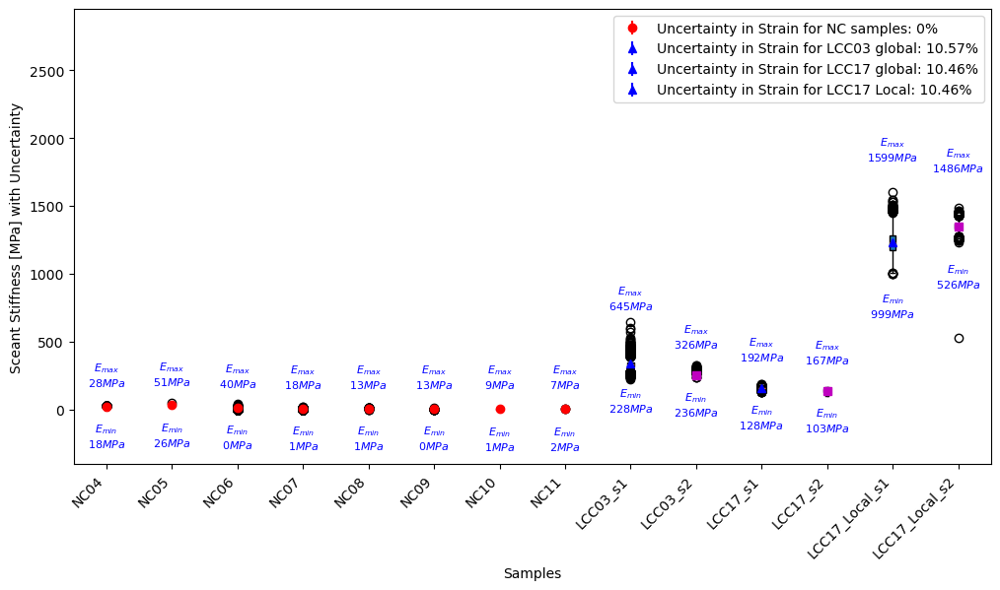

In [ ]:
import uncertainties

dataframes = ['NC04', 'NC05', 'NC06', 'NC07', 'NC08', 'NC09', 'NC10', 'NC11', 'LCC03', 'LCC03', 'LCC17', 'LCC17']
stage_nr = ['_1', '_2', '_1', '_2']
for i in range(len(dataframes)):
    if i >= (len(dataframes) - 4):
        index = i - (len(dataframes) - 4)
        nr = stage_nr[index]
    else:
        nr = ''

    
    df_E = globals()[f'cycle_info_{dataframes[i]}_G{nr}']
    values = unp.nominal_values(df_E['E(MPa)'])
    mean = np.mean(values)
    min_val = np.min(values)
    max_val = np.max(values)
    error_min = np.min(unp.std_devs(df_E['E(MPa)'])) 
    error_max = np.max(unp.std_devs(df_E['E(MPa)'])) 
    # Assign the calculated values to variables with the corresponding prefix
    globals()[f'{dataframes[i]}_values{nr}'] = values
    globals()[f'{dataframes[i]}_mean{nr}'] = mean
    globals()[f'{dataframes[i]}_min{nr}'] = min_val
    globals()[f'{dataframes[i]}_max{nr}'] = max_val
    globals()[f'{dataframes[i]}_error_min{nr}'] = error_min
    globals()[f'{dataframes[i]}_error_max{nr}'] = error_max


data_E = [(NC04_values,  NC04_mean,  NC04_error_min,  NC04_error_max, NC04_min, NC04_max ,Ru_E_G_NC04),
        (NC05_values,  NC05_mean,  NC05_error_min,  NC05_error_max, NC05_min, NC05_max ,Ru_E_G_NC05),
        (NC06_values,  NC06_mean,  NC06_error_min,  NC06_error_max, NC06_min, NC06_max ,Ru_E_G_NC06),
        (NC07_values,  NC07_mean,  NC07_error_min,  NC07_error_max, NC07_min, NC07_max ,Ru_E_G_NC07),
        (NC08_values,  NC08_mean,  NC08_error_min,  NC08_error_max, NC08_min, NC08_max ,Ru_E_G_NC08),
        (NC09_values,  NC09_mean,  NC09_error_min,  NC09_error_max, NC09_min, NC09_max ,Ru_E_G_NC09),
        (NC10_values,  NC10_mean,  NC10_error_min,  NC10_error_max, NC10_min, NC10_max ,Ru_E_G_NC10),
        (NC11_values,  NC11_mean,  NC11_error_min,  NC11_error_max, NC11_min, NC11_max ,Ru_E_G_NC11),
        (LCC03_values_1, LCC03_mean_1, LCC03_error_min_1, LCC03_error_max_1,LCC03_min_1, LCC03_max_1 , Ru_E_G_LCC03),
        (LCC03_values_2, LCC03_mean_2, LCC03_error_min_2, LCC03_error_max_2,LCC03_min_2, LCC03_max_2 , Ru_E_G_LCC03),
        (LCC17_values_1, LCC17_mean_1, LCC17_error_min_1, LCC17_error_max_1,LCC17_min_1, LCC17_max_1 , Ru_E_G_LCC17),
        (LCC17_values_2, LCC17_mean_2, LCC17_error_min_2, LCC17_error_max_2,LCC17_min_2, LCC17_max_2 , Ru_E_G_LCC17)] 

dataframes2 = ['LCC17', 'LCC17']
stage2 = ['_1', '_2']
for df_name, nr in zip(dataframes2, stage2):
    df_E2 = globals()[f'cycle_info_{df_name}_L{nr}']
    values2 = unp.nominal_values(df_E2['E(MPa)'])
    mean2 = np.mean(unp.nominal_values(df_E2['E(MPa)'])) 
    min2 = np.min(unp.nominal_values(df_E2['E(MPa)']))
    max2 = np.max(unp.nominal_values(df_E2['E(MPa)']))
    error_min2 = np.min(unp.std_devs(df_E2['E(MPa)']))
    error_max2 = np.max(unp.std_devs(df_E2['E(MPa)']))
    # Assign the calculated values to variables with the corresponding prefix
    globals()[f'{df_name}_values_L{nr}'] = values2
    globals()[f'{df_name}_mean_L{nr}'] = mean2
    globals()[f'{df_name}_min_L{nr}'] = min2
    globals()[f'{df_name}_max_L{nr}'] = max2
    globals()[f'{df_name}_error_min_L{nr}'] = error_min2
    globals()[f'{df_name}_error_max_L{nr}'] = error_max2


data_E_2 = [(LCC17_values_L_1, LCC17_mean_L_1, LCC17_error_min_L_1, LCC17_error_max_L_1,LCC17_min_L_1, LCC17_max_L_1 , Ru_E_L_LCC17),
         (LCC17_values_L_2, LCC17_mean_L_2, LCC17_error_min_L_2, LCC17_error_max_L_2,LCC17_min_L_2, LCC17_max_L_2 , Ru_E_L_LCC17)]


Label_stress = ['NC04', 'NC05', 'NC06', 'NC07', 'NC08', 'NC09', 'NC10', 'NC11', 'LCC03_s1', 'LCC03_s2', 'LCC17_s1','LCC17_s2', 'LCC17_Local_s1', 'LCC17_Local_s2' ]


plt.figure(figsize=(12, 6))  # Adjust the figure size as needed

# Create boxplots and error bars in a loop
for i, (x_val, mean_val, err_min, err_max, min, max, Ru) in enumerate(data_E + data_E_2, start=1):
    
    if i == 1:  
        plt.boxplot(x_val, positions=[i], widths=0.1, patch_artist=True, boxprops=dict(facecolor="C0"))
        errorbar = plt.errorbar([i], [mean_val], yerr=[[err_min], [err_max]], fmt='o', color='r', label=f'Uncertainty in Strain for NC samples: {Ru:.0f}%')
        for y, ymin, ymax in zip([mean_val], [err_min], [err_max]):
            plt.annotate(f"$ E_{{min}}$\n${min:.0f} MPa$", (i, y - ymin), textcoords="offset points", xytext=(0,-30), ha='center', fontsize=8, color='b')
            plt.annotate(f"$ E_{{max}}$\n${max:.0f} MPa$", (i, y - ymin), textcoords="offset points", xytext=(0,15), ha='center',  fontsize=8, color='b')

    
    
    
    elif i >= 0 and i <= 8: 
        plt.boxplot(x_val, positions=[i], widths=0.1, patch_artist=True, boxprops=dict(facecolor="C0"))
        errorbar = plt.errorbar([i], [mean_val], yerr=[[err_min], [err_max]], fmt='o', color='r')
        for y, ymin, ymax in zip([mean_val], [err_min], [err_max]):
            plt.annotate(f"$ E_{{min}}$\n${min:.0f} MPa$", (i, y - ymin), textcoords="offset points", xytext=(0,-30), ha='center', fontsize=8, color='b')
            plt.annotate(f"$ E_{{max}}$\n${max:.0f} MPa$", (i, y - ymin), textcoords="offset points", xytext=(0,15), ha='center',  fontsize=8, color='b')

            
    elif i == 9:        
        plt.boxplot(x_val, positions=[i], widths=0.1, patch_artist=True, boxprops=dict(facecolor="C0"))
        errorbar = plt.errorbar([i], [mean_val], yerr=[[err_min], [err_max]], fmt='^', color='b', label=f'Uncertainty in Strain for LCC03 global: {Ru*100:.2f}%')
        for y, ymin, ymax in zip([mean_val], [err_min], [err_max]):
            plt.annotate(f"$ E_{{min}}$\n${min:.0f} MPa$", (i, y - ymin), textcoords="offset points", xytext=(0,-35), ha='center', fontsize=8, color='b') 
            plt.annotate(f"$ E_{{max}}$\n${max:.0f} MPa$", (i, y - ymin), textcoords="offset points", xytext=(0,40), ha='center',  fontsize=8, color='b')

            
            
    elif i == 10:        
        plt.boxplot(x_val, positions=[i], widths=0.1, patch_artist=True, boxprops=dict(facecolor="C0"))
        errorbar = plt.errorbar([i], [mean_val], yerr=[[err_min], [err_max]], fmt='s', color='m')
        for y, ymin, ymax in zip([mean_val], [err_min], [err_max]):
            plt.annotate(f"$ E_{{min}}$\n${min:.0f} MPa$", (i, y - ymin), textcoords="offset points", xytext=(0,-30), ha='center', fontsize=8, color='b')     
            plt.annotate(f"$ E_{{max}}$\n${max:.0f} MPa$", (i, y - ymin), textcoords="offset points", xytext=(0,20), ha='center',  fontsize=8, color='b')
           
            
    elif i == 11:        
        plt.boxplot(x_val, positions=[i], widths=0.1, patch_artist=True, boxprops=dict(facecolor="C0"))
        errorbar = plt.errorbar([i], [mean_val], yerr=[[err_min], [err_max]], fmt='^', color='b', label=f'Uncertainty in Strain for LCC17 global: {Ru*100:.2f}%')
        for y, ymin, ymax in zip([mean_val], [err_min], [err_max]):
            plt.annotate(f"$ E_{{min}}$\n${min:.0f} MPa$", (i, y - ymin), textcoords="offset points", xytext=(0,-30), ha='center', fontsize=8, color='b')
            plt.annotate(f"$ E_{{max}}$\n${max:.0f} MPa$", (i, y - ymin), textcoords="offset points", xytext=(0,20), ha='center',  fontsize=8, color='b')

            
            
    elif i == 12:        
        plt.boxplot(x_val, positions=[i], widths=0.1, patch_artist=True, boxprops=dict(facecolor="C0"))
        errorbar = plt.errorbar([i], [mean_val], yerr=[[err_min], [err_max]], fmt='s', color='m')
        for y, ymin, ymax in zip([mean_val], [err_min], [err_max]):
            plt.annotate(f"$ E_{{min}}$\n${min:.0f} MPa$", (i, y - ymin), textcoords="offset points", xytext=(0,-30), ha='center', fontsize=8, color='b')
            plt.annotate(f"$ E_{{max}}$\n${max:.0f} MPa$", (i, y - ymin), textcoords="offset points", xytext=(0,20), ha='center',  fontsize=8, color='b')

    elif i == 13:        
        plt.boxplot(x_val, positions=[i], widths=0.1, patch_artist=True, boxprops=dict(facecolor="C0"))
        errorbar = plt.errorbar([i], [mean_val], yerr=[[err_min], [err_max]], fmt='^', color='b', label=f'Uncertainty in Strain for LCC17 Local: {Ru*100:.2f}%')
        for y, ymin, ymax in zip([mean_val], [err_min], [err_max]):
            plt.annotate(f"$ E_{{min}}$\n${min:.0f} MPa$", (i, y - ymin), textcoords="offset points", xytext=(0,-55), ha='center', fontsize=8, color='b')
            plt.annotate(f"$ E_{{max}}$\n${max:.0f} MPa$", (i, y - ymin), textcoords="offset points", xytext=(0,60), ha='center',  fontsize=8, color='b')

            
            
    elif i == 14:        
        plt.boxplot(x_val, positions=[i], widths=0.1, patch_artist=True, boxprops=dict(facecolor="C0"))
        errorbar = plt.errorbar([i], [mean_val], yerr=[[err_min], [err_max]], fmt='s', color='m')
        for y, ymin, ymax in zip([mean_val], [err_min], [err_max]):
            plt.annotate(f"$ E_{{min}}$\n${min:.0f} MPa$", (i, y - ymin), textcoords="offset points", xytext=(0,-45), ha='center', fontsize=8, color='b')            
            plt.annotate(f"$ E_{{max}}$\n${max:.0f} MPa$", (i, y - ymin), textcoords="offset points", xytext=(0,40), ha='center',  fontsize=8, color='b')

                    

plt.xticks(range(1, len(Label_stress) + 1), Label_stress,rotation=45, ha='right')  
plt.ylabel('Sceant Stiffness [MPa] with Uncertainty')
plt.xlabel('Samples')
plt.ylim([-400,2950])
#plt.title('Uncertainties associated with stress measurements [kPa]')
plt.legend()
plt.show()